In [1]:
import pandas as pd
import itertools
import numpy as np
import matplotlib.pyplot as plt

plt.style.use('Solarize_Light2')

pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

import matplotlib
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'
import seaborn as sns

import statsmodels.api as sm
from scipy.stats import boxcox, jarque_bera, probplot
from scipy.special import inv_boxcox
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_breusch_godfrey
from pmdarima import auto_arima

from datetime import timedelta
from math import sqrt
import random

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error

import os
print(os.listdir("/Users/yc00027/Documents/air-quality-madrid/"))

import warnings
warnings.filterwarnings("ignore")

['.DS_Store', 'new_data', 'csvs_per_year', 'stations.csv', 'madrid.h5', '.ipynb_checkpoints']


In [2]:
# Define functions to fit an auto ARIMA model and generate predictions

def fit_autoARIMA(train):
    model = auto_arima(train.rename(None), trace=True, error_action='ignore', suppress_warnings=True) 
    model_fit = model.fit(train, transparams=False, disp=-1)
    return model_fit

def predict_autoARIMA(model_fit, test):
    predictions = model_fit.predict(n_periods=len(test))
    return predictions[0]

# Define function to plot actuals vs predictions

def plot_actuals_predictions(target, predictions_final, results_df):
    fig, ax = plt.subplots(figsize=(21,7))
    actuals = plt.plot(target, label='Actuals')
    predictions = plt.plot(predictions_final, label='Predictions')
    error = results_df['rmse'].mean()
    plt.legend(loc='best')
    plt.title('RMSE: %.2f'% error)
    plt.show()

# Define model evaluation function

def evaluate_forecast(target, predictions_final, model_name):
    results = {'models': model_name}
    results['r2_score'] = r2_score(target, predictions_final)
    results['mean_abs_error'] = mean_absolute_error(target, predictions_final)
    results['median_abs_error'] = median_absolute_error(target, predictions_final)
    results['mse'] = mean_squared_error(target, predictions_final)
    results['rmse'] = np.sqrt(results['mse'])
    return results

# Air quality Madrid - Rolling predictions

### Extracting the data

In [3]:
# Import full dataframe

df_full = pd.read_csv('full_madrid_air_quality.csv').set_index('date').sort_index()
df_full.index = pd.to_datetime(df_full.index)

# Select data for the time period, particles and stations of interest

first_date = '2012-01-01 00:00:00'
last_date = '2018-04-30 23:00:00'

particles_of_interest = ['NO_2', 'O_3', 'PM10', 'SO_2']

particle_of_interest = 'O_3'

df_full['all_particles'] = df_full[particles_of_interest].sum(axis=1)

particles_of_interest = particles_of_interest + ['all_particles']

df_temp = df_full.loc[first_date:last_date][particles_of_interest + ['station']].sort_index()

print(f'The time period is from {first_date} to {last_date}')
print('')
print(f'The particle of interest is: {particle_of_interest}')
print('')
print(f'One particle DF shape: {df_temp.shape}')

df_temp.head()

The time period is from 2012-01-01 00:00:00 to 2018-04-30 23:00:00

The particle of interest is: O_3

One particle DF shape: (2164032, 6)


,NO_2,O_3,PM10,SO_2,all_particles,station
date,,,,,,
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079001
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079022
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079019
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079021
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079012


## Rolling predictions

### Rolling autoARIMA: target = particle_of_interest

### Station nr 28079008 - Parque del Retiro/ Escuelas Aguirre

In [4]:
# Generate dataframe for one particle and one station of interest

station_of_interest = 28079008

print(f'The station of interest is: {station_of_interest}')
print('')

oneparticle_onestation = df_temp.loc[df_temp['station'] == station_of_interest]
oneparticle_onestation = oneparticle_onestation.drop(columns = [x for x in particles_of_interest if x is not particle_of_interest], axis=1)
oneparticle_onestation.drop('station', axis=1, inplace=True)

print(f'Missing values for particle and station of interest: {round(oneparticle_onestation[particle_of_interest].isnull().mean()*100, 2)}%')
print('')
oneparticle_onestation.dropna(inplace=True)

oneparticle_onestation['quarter'] = oneparticle_onestation.index.quarter
oneparticle_onestation['dayofyear'] = oneparticle_onestation.index.dayofyear
oneparticle_onestation['dayofmonth'] = oneparticle_onestation.index.day
oneparticle_onestation['weekyear'] = oneparticle_onestation.index.weekofyear
oneparticle_onestation['weekday'] = oneparticle_onestation.index.weekday
oneparticle_onestation['hour'] = oneparticle_onestation.index.hour
oneparticle_onestation['year'] = oneparticle_onestation.index.year
oneparticle_onestation['month'] = oneparticle_onestation.index.month
oneparticle_onestation.fillna(0, inplace=True)

print(f'One particle, one station DF shape: {oneparticle_onestation.shape}')
oneparticle_onestation.head()

The station of interest is: 28079008

Missing values for particle and station of interest: 1.26%

One particle, one station DF shape: (54789, 9)


,O_3,quarter,dayofyear,dayofmonth,weekyear,weekday,hour,year,month
date,,,,,,,,,
2012-01-01 00:00:00,3.0,1,1,1,52,6,0,2012,1
2012-01-01 01:00:00,4.0,1,1,1,52,6,1,2012,1
2012-01-01 02:00:00,3.0,1,1,1,52,6,2,2012,1
2012-01-01 03:00:00,3.0,1,1,1,52,6,3,2012,1
2012-01-01 04:00:00,3.0,1,1,1,52,6,4,2012,1


2018-01-07 00:00:00
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.639, BIC=2810.097, Time=0.777 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.296, BIC=2813.782, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2795.910, BIC=2807.139, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.052, BIC=2810.281, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3162.977, BIC=3166.720, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.735, BIC=2806.450, Time=0.413 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2792.078, BIC=2810.793, Time=0.189 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.395, BIC=2816.596, Time=0.692 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2789.481, BIC=2815.682, Time=0.719 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2758.610, BIC=2784.833, Time=1.406 seconds
Total fit time: 4.010 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2670.588, BIC=2693.046, Time=0.624 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2721.107, BIC=2728.593, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2703.546, BIC=2714.775, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.142, BIC=2722.371, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3135.572, BIC=3139.315, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2671.178, BIC=2689.893, Time=0.404 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.193, BIC=2688.908, Time=0.506 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.866, BIC=2687.838, Time=0.273 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2526.231, BIC=2548.373, Time=0.634 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2770.038, BIC=2777.419, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2620.864, BIC=2631.935, Time=0.034 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.329, BIC=2704.401, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3263.722, BIC=3267.412, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2565.505, BIC=2583.957, Time=0.261 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2565.903, BIC=2584.354, Time=0.253 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2567.143, BIC=2592.976, Time=0.563 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2567.782, BIC=2593.614, Time=0.478 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2569.741, BIC=2584.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.294, BIC=2748.961, Time=0.899 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2731.762, BIC=2750.429, Time=0.337 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.531, BIC=2695.665, Time=1.362 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2730.304, BIC=2756.438, Time=1.170 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.247, BIC=2748.181, Time=0.294 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2729.177, BIC=2751.577, Time=0.497 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2731.936, BIC=2754.336, Time=0.693 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2669.327, BIC=2699.193, Time=1.642 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 11.294 seconds
Performing stepwise search 

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2794.496, BIC=2820.652, Time=1.311 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.990)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2792.519, BIC=2807.465, Time=0.415 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.339, BIC=2830.285, Time=0.293 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2803.552, BIC=2818.498, Time=0.233 seconds
Total fit time: 5.883 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.308, BIC=2812.708, Time=0.879 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2853.381, BIC=2860.847, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2817.425, BIC=2828.625, Time=0.229 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.863, BIC=2841.063, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2304.203, BIC=2315.393, Time=0.165 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2657.632, BIC=2661.362, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2264.516, BIC=2283.166, Time=0.443 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2291.004, BIC=2305.924, Time=0.293 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2262.516, BIC=2277.436, Time=0.366 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2264.516, BIC=2283.166, Time=0.525 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2271.659, BIC=2286.580, Time=0.219 seconds
Total fit time: 2.654 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2310.952, BIC=2333.274, Time=0.626 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2424.092, BIC=2431.533, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2658.722, BIC=2677.307, Time=0.392 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.239, BIC=2677.825, Time=0.325 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2658.532, BIC=2684.551, Time=0.922 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2612.238, BIC=2638.257, Time=1.141 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2658.128, BIC=2680.430, Time=0.441 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2613.025, BIC=2642.761, Time=1.208 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2636.904, BIC=2666.640, Time=1.439 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2658.206, BIC=2684.225, Time=0.557 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=261

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2709.794, BIC=2732.214, Time=0.473 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2710.707, BIC=2733.127, Time=0.580 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2668.299, BIC=2698.191, Time=1.218 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.216 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2601.544, BIC=2623.964, Time=0.903 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2911.526, BIC=2918.999, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2691.290, BIC=2702.499, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.693, BIC=2810.903, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3207.409, BIC=3211.146, Tim

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2850.481, BIC=2861.681, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3248.285, BIC=3252.018, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.044, BIC=2832.710, Time=0.385 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.791, BIC=2864.725, Time=0.164 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.473, BIC=2827.406, Time=0.306 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2814.209, BIC=2832.875, Time=0.537 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2834.608, BIC=2849.541, Time=0.205 seconds
Total fit time: 2.657 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.497, BIC=2830.917, Time=0.695 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.305, BIC=2884.778, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2542.055, BIC=2553.246, Time=0.140 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3026.311, BIC=3030.041, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2457.677, BIC=2476.328, Time=0.332 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2517.155, BIC=2532.075, Time=0.211 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2457.251, BIC=2472.172, Time=0.212 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2458.088, BIC=2476.738, Time=0.338 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2476.051, BIC=2490.971, Time=0.182 seconds
Total fit time: 2.235 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2559.172, BIC=2581.553, Time=0.461 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2722.809, BIC=2730.270, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2789.959, BIC=2808.593, Time=0.260 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.352, BIC=2809.986, Time=0.324 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2734.465, BIC=2760.553, Time=0.871 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2792.617, BIC=2814.978, Time=0.488 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.529, BIC=2817.344, Time=1.078 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2736.405, BIC=2766.220, Time=1.025 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2732.943, BIC=2759.031, Time=0.975 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2787.871, BIC=2810.232, Time=0.441 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=273

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2583.283, BIC=2605.683, Time=0.421 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2745.308, BIC=2752.775, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2646.341, BIC=2657.541, Time=0.094 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.702, BIC=2705.902, Time=0.156 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3052.605, BIC=3056.338, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2581.445, BIC=2600.111, Time=0.280 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2645.982, BIC=2660.916, Time=0.229 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2591.539, BIC=2606.473, Time=0.208 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2583.321, BIC=2605.721, Time=0.339 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2621.681, BIC=2640.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2735.477, BIC=2757.857, Time=0.918 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.938, BIC=2833.398, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2786.532, BIC=2797.722, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2802.874, BIC=2814.064, Time=0.174 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3258.437, BIC=3262.167, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.800, BIC=2762.450, Time=0.406 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2743.823, BIC=2762.474, Time=0.420 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2747.119, BIC=2773.230, Time=0.708 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2747.289, BIC=2773.400, Time=0.925 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2745.979, BIC=2760.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2461.119, BIC=2483.500, Time=0.912 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2648.794, BIC=2656.254, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2566.395, BIC=2577.585, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2601.183, BIC=2612.374, Time=0.156 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3034.922, BIC=3038.652, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2512.488, BIC=2531.138, Time=0.288 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2513.230, BIC=2531.881, Time=0.329 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2512.656, BIC=2538.767, Time=0.579 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2512.429, BIC=2538.539, Time=0.725 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2515.248, BIC=2530.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2729.000, BIC=2751.439, Time=0.910 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3067.445, BIC=3074.924, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2833.998, BIC=2845.217, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.939, BIC=2964.158, Time=0.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3473.127, BIC=3476.867, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.398, BIC=2800.097, Time=0.318 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.659, BIC=2800.358, Time=0.272 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.422, BIC=2779.601, Time=0.999 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2785.192, BIC=2811.370, Time=0.901 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2782.982, BIC=2797.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2755.302, BIC=2766.511, Time=0.238 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3090.389, BIC=3094.125, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.816, BIC=2749.499, Time=0.479 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2755.522, BIC=2770.468, Time=0.296 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2728.979, BIC=2743.925, Time=0.349 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2730.879, BIC=2749.562, Time=0.496 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2748.813, BIC=2763.759, Time=0.204 seconds
Total fit time: 3.163 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.986, BIC=2766.386, Time=1.142 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2780.182, BIC=2787.649, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.183, BIC=2706.866, Time=0.982 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2700.439, BIC=2715.385, Time=0.538 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.525, BIC=2701.471, Time=0.596 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.163, BIC=2706.846, Time=1.082 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2691.499, BIC=2706.445, Time=0.581 seconds
Total fit time: 5.919 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2494.764, BIC=2517.164, Time=0.784 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2518.647, BIC=2526.113, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2508.015, BIC=2519.215, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2511.600, BIC=2522.800, Time=0.189 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2658.652, BIC=2677.351, Time=0.404 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2736.440, BIC=2751.399, Time=0.301 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.539, BIC=2672.498, Time=0.300 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2658.239, BIC=2676.938, Time=0.557 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2658.022, BIC=2672.981, Time=0.235 seconds
Total fit time: 2.506 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.621, BIC=2721.059, Time=0.487 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2959.090, BIC=2966.570, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2739.314, BIC=2750.533, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.596, BIC=2862.816, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2615.216, BIC=2637.693, Time=0.948 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.069, BIC=2934.562, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2703.417, BIC=2714.655, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.281, BIC=2824.520, Time=0.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3248.058, BIC=3251.804, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2649.622, BIC=2668.353, Time=0.304 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2650.637, BIC=2669.368, Time=0.266 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.595, BIC=2678.819, Time=0.893 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2636.294, BIC=2662.517, Time=1.095 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2652.003, BIC=2666.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.476, BIC=2810.954, Time=0.811 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2827.702, BIC=2835.195, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2809.571, BIC=2820.809, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.669, BIC=2826.907, Time=0.207 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3201.289, BIC=3205.035, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.036, BIC=2806.767, Time=0.790 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2804.762, BIC=2819.747, Time=0.281 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.241, BIC=2802.226, Time=0.348 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.088, BIC=2806.819, Time=0.489 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2796.599, BIC=2811.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2610.987, BIC=2629.702, Time=0.481 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2619.035, BIC=2634.007, Time=0.200 seconds
Total fit time: 2.714 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.617, BIC=2680.075, Time=0.583 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2843.493, BIC=2850.979, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2683.478, BIC=2694.707, Time=0.131 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2749.818, BIC=2761.047, Time=0.560 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3362.445, BIC=3366.188, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2655.475, BIC=2674.190, Time=0.546 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2717.059, BIC=2732.031, Time=0.222 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.192, BIC=2870.891, Time=0.417 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.457, BIC=2872.156, Time=0.451 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.376, BIC=2876.554, Time=0.789 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.619, BIC=2872.058, Time=0.325 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.678, BIC=2866.377, Time=0.361 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2866.840, BIC=2881.799, Time=0.272 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.645, BIC=2872.084, Time=0.489 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.678, BIC=2875.857, Time=0.997 seconds
Total fit time: 5.358 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.818, BIC=2860.295, Time=0.766 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2765.368, BIC=2776.606, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3143.333, BIC=3147.080, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.740, BIC=2767.471, Time=0.432 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2749.397, BIC=2768.128, Time=0.611 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.334, BIC=2774.558, Time=0.688 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2748.136, BIC=2774.359, Time=0.857 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2749.196, BIC=2764.181, Time=0.413 secon

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2747.895, BIC=2774.096, Time=1.043 seconds
Total fit time: 5.473 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.396, BIC=2765.873, Time=0.732 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2790.694, BIC=2798.187, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2763.710, BIC=2774.948, Time=0.103 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2772.770, BIC=2784.008, Time=0.210 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3222.045, BIC=3225.791, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.719, BIC=2762.450, Time=0.609 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2743.719, BIC=2762.450, Time=0.633 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2745.002, BIC=2771.225, Time=1.128 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.290, BIC=2757.989, Time=0.371 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2819.760, BIC=2834.719, Time=0.247 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.944, BIC=2752.903, Time=0.303 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.445, BIC=2758.144, Time=0.400 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2750.812, BIC=2765.771, Time=0.205 seconds
Total fit time: 2.808 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.979, BIC=2766.399, Time=0.936 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3003.962, BIC=3011.435, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2819.523, BIC=2830.733, Time=0.126 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.256, BIC=2918.466, Time=0.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2742.383, BIC=2764.860, Time=0.850 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3005.471, BIC=3012.963, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2775.840, BIC=2787.079, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2884.904, BIC=2896.142, Time=0.161 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3349.085, BIC=3352.831, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.530, BIC=2760.261, Time=0.347 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.416, BIC=2844.400, Time=0.251 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.770, BIC=2754.754, Time=0.202 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2741.546, BIC=2760.277, Time=0.367 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2746.263, BIC=2761.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2823.583, BIC=2842.330, Time=0.554 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.921, BIC=2856.919, Time=0.146 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.637, BIC=2837.634, Time=0.467 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2823.380, BIC=2842.127, Time=0.758 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.165, BIC=2843.162, Time=0.293 seconds
Total fit time: 3.096 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.626, BIC=2810.103, Time=0.581 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2857.617, BIC=2865.109, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2827.609, BIC=2838.847, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2840.802, BIC=2852.041, Time=0.156 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2456.460, BIC=2467.531, Time=0.142 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2914.894, BIC=2918.585, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2402.827, BIC=2421.278, Time=0.264 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2438.660, BIC=2453.421, Time=0.194 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2400.834, BIC=2415.595, Time=0.224 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2402.828, BIC=2421.280, Time=0.402 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2409.881, BIC=2424.643, Time=0.229 seconds
Total fit time: 2.185 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2514.282, BIC=2536.524, Time=0.576 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2646.862, BIC=2654.276, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.659, BIC=2833.117, Time=0.735 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3098.502, BIC=3105.988, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2853.892, BIC=2865.121, Time=0.126 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.356, BIC=2979.585, Time=0.146 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3504.634, BIC=3508.377, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.570, BIC=2828.285, Time=0.351 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.729, BIC=2935.701, Time=0.185 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2808.424, BIC=2823.396, Time=0.760 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.882, BIC=2828.597, Time=0.414 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2822.012, BIC=2836.984, Time=0.197 seconds
Total fit time: 2.9

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2718.851, BIC=2733.797, Time=0.311 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.200, BIC=2764.147, Time=0.198 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2731.145, BIC=2746.092, Time=0.215 seconds
Total fit time: 4.590 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.000, BIC=2802.419, Time=0.888 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2820.460, BIC=2827.933, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2795.880, BIC=2807.090, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2802.857, BIC=2814.066, Time=0.280 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3140.669, BIC=3144.406, Time=0.036 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.186, BIC=2800.869, Time=0.612 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2724.711, BIC=2743.394, Time=0.356 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.277, BIC=2776.223, Time=0.239 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2724.464, BIC=2739.411, Time=0.434 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2724.900, BIC=2743.582, Time=0.424 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2739.776, BIC=2754.722, Time=0.187 seconds
Total fit time: 3.140 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2645.293, BIC=2667.712, Time=0.886 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2701.965, BIC=2709.438, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2672.360, BIC=2683.570, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2681.603, BIC=2692.813, Time=0.217 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2626.179, BIC=2641.048, Time=0.258 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2536.102, BIC=2550.970, Time=0.258 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2536.076, BIC=2558.378, Time=0.387 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2607.777, BIC=2626.362, Time=0.271 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2535.590, BIC=2554.175, Time=0.281 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2538.032, BIC=2564.051, Time=0.835 seconds
Total fit time: 3.391 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2608.041, BIC=2630.460, Time=0.908 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.295, BIC=2931.768, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2711.743, BIC=2722.953, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.041, BIC=2735.499, Time=2.550 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3098.670, BIC=3106.156, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2812.085, BIC=2823.314, Time=0.114 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2957.588, BIC=2968.817, Time=0.314 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3441.100, BIC=3444.843, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.259, BIC=2783.974, Time=0.776 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2765.801, BIC=2784.516, Time=0.707 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.600, BIC=2794.801, Time=1.655 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2768.119, BIC=2794.320, Time=2.904 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2766.003, BIC=2780.

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.146, BIC=2824.565, Time=1.665 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.602, BIC=2866.075, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2827.615, BIC=2838.825, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.304, BIC=2847.514, Time=0.276 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3180.692, BIC=3184.428, Time=0.197 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.471, BIC=2820.154, Time=0.973 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.485, BIC=2846.432, Time=0.645 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.783, BIC=2814.729, Time=0.716 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2801.521, BIC=2820.204, Time=1.387 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2816.893, BIC=2831.839, Time=0.390 seconds
Total fit time: 6.4

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2476.522, BIC=2495.221, Time=0.888 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2489.606, BIC=2504.565, Time=0.527 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2474.782, BIC=2489.741, Time=0.841 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2476.567, BIC=2495.266, Time=1.433 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2485.556, BIC=2500.515, Time=0.651 seconds
Total fit time: 6.977 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2366.210, BIC=2388.648, Time=1.804 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2405.908, BIC=2413.387, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2384.141, BIC=2395.361, Time=0.112 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2390.343, BIC=2401.563, Time=0.253 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2695.857, BIC=2725.724, Time=2.108 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2729.672, BIC=2755.806, Time=0.872 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.266, BIC=2741.399, Time=1.970 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2694.413, BIC=2728.014, Time=2.280 seconds
Total fit time: 17.191 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.310, BIC=2789.768, Time=1.680 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3046.896, BIC=3054.382, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2864.567, BIC=2875.796, Time=0.148 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.925, BIC=2961.154, Time=0.391 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3530.130, BIC=3533.873, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2677.098, BIC=2707.016, Time=1.950 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.577 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2596.931, BIC=2619.331, Time=0.594 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2888.718, BIC=2896.185, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2666.913, BIC=2678.113, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.102, BIC=2792.302, Time=0.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3187.733, BIC=3191.467, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2597.235, BIC=2615.902, Time=0.389 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2601.669, BIC=2620.336, Tim

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2818.250, BIC=2833.197, Time=0.487 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2819.659, BIC=2838.342, Time=0.613 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2829.000, BIC=2843.946, Time=0.326 seconds
Total fit time: 3.666 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.044, BIC=2790.406, Time=0.680 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2832.748, BIC=2840.202, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2800.011, BIC=2811.192, Time=0.133 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.873, BIC=2824.053, Time=0.252 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3228.970, BIC=3232.697, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2766.140, BIC=2784.774, Time=0.508 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2378.823, BIC=2397.506, Time=0.384 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2410.278, BIC=2425.224, Time=0.281 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2380.808, BIC=2395.754, Time=0.328 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2380.813, BIC=2403.233, Time=0.565 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2398.746, BIC=2417.429, Time=0.387 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2378.926, BIC=2397.609, Time=0.439 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2381.571, BIC=2407.727, Time=1.085 seconds
Total fit time: 4.537 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2415.121, BIC=2437.560, Time=1.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2554.968, BIC=2562.447, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.493, BIC=2836.912, Time=1.018 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3041.182, BIC=3048.655, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2851.919, BIC=2863.129, Time=0.142 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.792, BIC=2947.002, Time=0.302 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3511.665, BIC=3515.402, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.653, BIC=2831.336, Time=0.441 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.606, BIC=2912.553, Time=0.373 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.894, BIC=2825.840, Time=0.382 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.706, BIC=2831.388, Time=0.549 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2823.326, BIC=2838.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2700.460, BIC=2711.679, Time=0.222 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3059.816, BIC=3063.556, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2627.224, BIC=2645.923, Time=0.554 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2690.136, BIC=2705.095, Time=0.200 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2626.259, BIC=2641.218, Time=0.371 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2627.685, BIC=2646.384, Time=0.852 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2651.180, BIC=2666.139, Time=0.248 seconds
Total fit time: 3.278 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.727, BIC=2705.147, Time=0.718 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.951, BIC=2749.424, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.435, BIC=2849.395, Time=0.341 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2807.650, BIC=2822.609, Time=0.596 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2808.378, BIC=2827.076, Time=0.715 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2821.262, BIC=2836.221, Time=0.264 seconds
Total fit time: 3.944 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2777.297, BIC=2799.716, Time=1.092 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2818.172, BIC=2825.646, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2798.305, BIC=2809.515, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2804.709, BIC=2815.919, Time=0.235 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3232.667, BIC=3236.403, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2558.145, BIC=2576.828, Time=0.480 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2558.441, BIC=2573.387, Time=0.248 seconds
Total fit time: 2.623 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2614.121, BIC=2636.559, Time=0.408 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.631, BIC=2863.110, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2658.706, BIC=2669.926, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2758.326, BIC=2769.545, Time=0.185 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3336.968, BIC=3340.708, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2614.489, BIC=2633.188, Time=0.411 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2614.033, BIC=2632.732, Time=0.462 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2755.621, BIC=2781.822, Time=1.347 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2752.337, BIC=2767.309, Time=0.338 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2754.072, BIC=2776.530, Time=0.830 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2753.827, BIC=2776.285, Time=0.486 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2752.702, BIC=2782.646, Time=1.950 seconds
Total fit time: 8.716 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2678.130, BIC=2700.626, Time=1.532 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3042.305, BIC=3049.804, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2767.367, BIC=2778.616, Time=0.243 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.368, BIC=2918.616, Time=0.388 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.175, BIC=2801.413, Time=0.218 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3145.547, BIC=3149.293, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.635, BIC=2775.366, Time=0.477 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.491, BIC=2785.476, Time=0.318 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2755.541, BIC=2770.526, Time=0.505 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2756.504, BIC=2775.235, Time=0.607 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2760.740, BIC=2775.725, Time=0.313 seconds
Total fit time: 3.276 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.893, BIC=2802.390, Time=1.053 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2817.854, BIC=2825.353, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.017, BIC=2698.748, Time=0.570 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.995, BIC=2728.980, Time=0.295 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2679.143, BIC=2694.128, Time=0.422 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.256, BIC=2698.987, Time=0.615 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2697.873, BIC=2712.858, Time=0.240 seconds
Total fit time: 3.780 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2626.365, BIC=2648.861, Time=0.662 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2749.216, BIC=2756.715, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2662.509, BIC=2673.757, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.517, BIC=2705.765, Time=0.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2843.407, BIC=2873.376, Time=1.659 seconds
Total fit time: 8.819 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2881.630, BIC=2904.126, Time=0.907 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3099.829, BIC=3107.327, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.207, BIC=2943.455, Time=0.056 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.352, BIC=3017.600, Time=0.259 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3628.639, BIC=3632.389, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.698, BIC=2897.445, Time=0.572 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.920, BIC=2988.917, Time=0.276 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.204, BIC=2894.202, Time=0.435 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.838, BIC=2722.315, Time=1.198 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2779.458, BIC=2786.950, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2718.865, BIC=2730.104, Time=0.134 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2734.975, BIC=2746.214, Time=0.209 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3108.983, BIC=3112.730, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2700.168, BIC=2718.899, Time=0.561 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2700.383, BIC=2719.114, Time=0.868 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.553, BIC=2727.776, Time=1.476 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2,

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2804.091, BIC=2815.339, Time=0.214 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3236.016, BIC=3239.765, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.238, BIC=2799.985, Time=0.748 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.114, BIC=2809.111, Time=0.358 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.240, BIC=2794.237, Time=0.489 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.238, BIC=2799.985, Time=1.095 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2787.155, BIC=2802.152, Time=0.751 seconds
Total fit time: 4.649 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.734, BIC=2779.211, Time=1.546 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2796.808, BIC=2804.301, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2666.349, BIC=2685.096, Time=0.667 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2676.593, BIC=2691.590, Time=0.285 seconds
Total fit time: 4.032 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.764, BIC=2721.223, Time=1.034 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2922.084, BIC=2929.570, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2739.836, BIC=2751.066, Time=0.104 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.158, BIC=2836.387, Time=0.342 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3486.116, BIC=3489.859, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.775, BIC=2715.490, Time=0.722 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2771.105, BIC=2786.077, Time=0.503 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.965, BIC=2859.963, Time=0.322 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2846.712, BIC=2865.459, Time=0.616 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.278, BIC=2870.276, Time=0.334 seconds
Total fit time: 3.436 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2766.788, BIC=2789.227, Time=1.583 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3086.378, BIC=3093.858, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2843.830, BIC=2855.049, Time=0.137 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2962.028, BIC=2973.247, Time=0.188 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3442.251, BIC=3445.991, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2804.455, BIC=2823.154, Time=0.575 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2842.753, BIC=2869.021, Time=1.264 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.896, BIC=2854.906, Time=0.568 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2856.016, BIC=2871.026, Time=0.241 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.399, BIC=2864.409, Time=0.409 seconds
Total fit time: 7.278 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.454, BIC=2859.970, Time=0.982 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2882.732, BIC=2890.237, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2859.791, BIC=2871.048, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.663, BIC=2878.920, Time=0.203 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3337.191, BIC=3340.944, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2376.991, BIC=2399.488, Time=0.596 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2425.635, BIC=2433.134, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2399.246, BIC=2410.494, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2409.423, BIC=2420.672, Time=0.183 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2730.794, BIC=2734.544, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2375.972, BIC=2394.719, Time=0.478 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2386.551, BIC=2401.548, Time=0.254 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2375.059, BIC=2390.057, Time=0.283 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2375.664, BIC=2394.411, Time=0.466 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2377.646, BIC=2392.643, Time=0.222 seconds
Total fit time: 2.5

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.309, BIC=2911.518, Time=0.281 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3511.143, BIC=3514.879, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.496, BIC=2776.179, Time=0.505 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2758.462, BIC=2777.144, Time=0.597 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.583, BIC=2769.739, Time=1.502 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2754.827, BIC=2780.983, Time=1.375 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2758.493, BIC=2773.440, Time=0.332 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2754.375, BIC=2776.794, Time=0.626 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2757.936, BIC=2780.356, Time=0.862 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2714.662, BIC=2744.555, Time=1.907 seconds
Near non-invertible

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.734, BIC=2771.963, Time=0.298 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3141.302, BIC=3145.045, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.649, BIC=2671.364, Time=0.419 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2653.701, BIC=2672.416, Time=0.410 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.042, BIC=2676.243, Time=1.499 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2610.119, BIC=2636.320, Time=2.023 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2648.599, BIC=2671.057, Time=1.178 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2648.763, BIC=2678.707, Time=2.095 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2650.395, BIC=2680.339, Time=1.040 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2649.030, BIC=2675.231, Time=0.648 seconds
Fit ARIMA: (3, 0, 4

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2846.548, BIC=2857.767, Time=0.190 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3295.294, BIC=3299.034, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2807.307, BIC=2826.006, Time=0.606 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.206, BIC=2852.165, Time=0.232 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2805.888, BIC=2820.847, Time=0.365 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2807.402, BIC=2826.101, Time=0.905 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2821.854, BIC=2836.813, Time=0.319 seconds
Total fit time: 3.718 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.213, BIC=2831.671, Time=1.077 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2878.492, BIC=2885.978, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2364.288, BIC=2394.024, Time=1.853 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 8.692 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2436.577, BIC=2458.918, Time=1.547 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.358, BIC=2731.805, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2541.931, BIC=2553.102, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2630.349, BIC=2641.519, Time=0.260 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3169.873, BIC=3173.596, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2483.921, BIC=2502.539, Time=0.472 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2484.574, BIC=2503.192, Tim

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2817.124, BIC=2843.347, Time=1.156 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2815.391, BIC=2841.614, Time=1.171 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.915, BIC=2837.900, Time=0.249 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2817.012, BIC=2839.489, Time=0.542 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.977, BIC=2843.454, Time=0.694 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2767.166, BIC=2797.136, Time=1.691 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one in

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2727.776, BIC=2750.215, Time=0.799 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2786.414, BIC=2793.893, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2752.626, BIC=2763.845, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.369, BIC=2772.588, Time=0.336 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3092.182, BIC=3095.922, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2729.794, BIC=2748.493, Time=0.820 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2729.795, BIC=2748.494, Time=0.963 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2731.969, BIC=2758.148, Time=0.956 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2,

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.991, BIC=2785.449, Time=0.710 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2839.134, BIC=2846.620, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2778.180, BIC=2789.409, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.730, BIC=2802.959, Time=0.249 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3266.308, BIC=3270.051, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.086, BIC=2781.801, Time=0.496 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.655, BIC=2782.370, Time=0.792 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.314, BIC=2789.515, Time=1.063 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2763.506, BIC=2789.707, Time=1.205 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2762.878, BIC=2777.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.112, BIC=2771.332, Time=0.150 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3325.132, BIC=3328.871, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2648.365, BIC=2667.064, Time=0.371 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.715, BIC=2735.674, Time=0.317 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2646.721, BIC=2661.680, Time=0.333 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2648.437, BIC=2667.136, Time=0.449 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2662.457, BIC=2677.416, Time=0.223 seconds
Total fit time: 2.820 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.805, BIC=2707.224, Time=0.577 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.111, BIC=2934.584, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2729.590, BIC=2752.029, Time=1.140 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3093.179, BIC=3100.659, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.755, BIC=2866.974, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.989, BIC=2987.208, Time=0.209 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3424.903, BIC=3428.643, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.707, BIC=2813.406, Time=0.400 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2796.638, BIC=2815.337, Time=0.422 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2772.768, BIC=2798.946, Time=1.349 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2724.688, BIC=2750.866, Time=1.433 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2789.603, BIC=2812.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2789.918, BIC=2812.356, Time=0.664 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2839.403, BIC=2846.883, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2814.287, BIC=2825.507, Time=0.094 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.970, BIC=2834.190, Time=0.258 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3171.153, BIC=3174.893, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.920, BIC=2806.619, Time=0.502 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.374, BIC=2825.333, Time=0.260 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.630, BIC=2802.589, Time=0.365 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.960, BIC=2806.659, Time=0.592 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2796.898, BIC=2811.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2713.928, BIC=2725.138, Time=0.218 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3115.645, BIC=3119.382, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.872, BIC=2684.555, Time=0.518 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.909, BIC=2709.856, Time=0.357 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2666.950, BIC=2681.896, Time=0.501 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2667.816, BIC=2690.236, Time=0.818 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2690.727, BIC=2709.409, Time=0.406 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2665.959, BIC=2684.642, Time=0.513 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2669.769, BIC=2695.925, Time=1.134 seconds
Total fit time: 5.217 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.411, BIC=2678.094, Time=0.361 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2663.341, BIC=2689.497, Time=1.129 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2663.044, BIC=2689.200, Time=0.615 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.826, BIC=2674.772, Time=0.326 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2660.659, BIC=2683.078, Time=0.575 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2661.145, BIC=2683.565, Time=0.740 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2661.617, BIC=2691.509, Time=1.693 seconds
Total fit time: 7.535 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2766.670, BIC=2789.166, Time=0.977 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2978.689, BIC=2986.188, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.938, BIC=2722.653, Time=0.392 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.299, BIC=2723.014, Time=0.434 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.093, BIC=2734.294, Time=1.111 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2707.404, BIC=2733.605, Time=1.017 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2705.725, BIC=2720.697, Time=0.277 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2705.765, BIC=2728.223, Time=0.423 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2706.107, BIC=2728.565, Time=0.600 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2706.560, BIC=2736.504, Time=1.378 seconds
Total fit time: 7.172 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2588.896, BIC=2611.354, Time=1.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2857.042, BIC=2868.261, Time=0.235 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3222.212, BIC=3225.952, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2820.275, BIC=2838.974, Time=0.532 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2846.031, BIC=2860.990, Time=0.308 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2826.705, BIC=2841.664, Time=0.576 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2821.832, BIC=2844.270, Time=0.806 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2836.800, BIC=2855.499, Time=0.263 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.500, BIC=2840.199, Time=0.607 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2822.157, BIC=2848.336, Time=0.946 seconds
Total fit time: 5.240 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2423.623, BIC=2446.081, Time=0.849 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2445.951, BIC=2464.666, Time=0.499 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2422.216, BIC=2440.931, Time=0.577 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2426.818, BIC=2441.790, Time=0.369 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2423.660, BIC=2446.118, Time=0.903 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2424.552, BIC=2443.267, Time=0.492 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2425.633, BIC=2451.834, Time=1.494 seconds
Total fit time: 8.029 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2496.260, BIC=2518.718, Time=0.961 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2652.207, BIC=2659.693, Time=0.027 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.173, BIC=2805.171, Time=0.298 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.561, BIC=2810.308, Time=0.499 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2794.124, BIC=2809.122, Time=0.303 seconds
Total fit time: 3.023 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2775.657, BIC=2798.173, Time=0.629 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3084.679, BIC=3092.184, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.561, BIC=2817.818, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.892, BIC=2954.150, Time=0.229 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3508.731, BIC=3512.483, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.658, BIC=2792.421, Time=0.534 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2725.769, BIC=2748.266, Time=0.876 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.358, BIC=2798.857, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2759.045, BIC=2770.293, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.324, BIC=2781.573, Time=0.142 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3129.196, BIC=3132.945, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2723.992, BIC=2742.738, Time=0.499 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.428, BIC=2772.426, Time=0.212 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2723.805, BIC=2738.803, Time=0.495 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2724.271, BIC=2743.018, Time=0.505 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.490, BIC=2756.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.635, BIC=2782.382, Time=0.905 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2774.829, BIC=2789.827, Time=0.388 seconds
Total fit time: 4.231 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.221, BIC=2761.737, Time=0.898 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2772.852, BIC=2780.357, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2756.046, BIC=2767.304, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.522, BIC=2771.780, Time=0.264 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3161.032, BIC=3164.784, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2736.641, BIC=2755.404, Time=0.715 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.908, BIC=2771.919, Time=0.410 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2938.600, BIC=2953.611, Time=0.212 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2848.197, BIC=2863.207, Time=0.339 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.627, BIC=2868.390, Time=0.551 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2865.223, BIC=2880.233, Time=0.221 seconds
Total fit time: 2.973 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2804.843, BIC=2827.339, Time=1.337 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3072.298, BIC=3079.797, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.575, BIC=2914.823, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.395, BIC=2991.643, Time=0.184 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3624.563, BIC=3628.313, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.389, BIC=2870.374, Time=0.433 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2757.933, BIC=2772.917, Time=0.266 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2758.770, BIC=2777.501, Time=0.475 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2766.586, BIC=2781.571, Time=0.260 seconds
Total fit time: 2.882 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.807, BIC=2720.323, Time=0.771 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2873.350, BIC=2880.855, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2736.854, BIC=2748.112, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2792.234, BIC=2803.492, Time=0.336 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3194.969, BIC=3198.721, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.882, BIC=2766.082, Time=0.258 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3132.960, BIC=3136.694, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2734.039, BIC=2752.705, Time=0.709 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.767, BIC=2761.701, Time=0.371 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2732.433, BIC=2747.367, Time=0.463 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2734.050, BIC=2752.717, Time=0.820 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.840, BIC=2756.773, Time=0.251 seconds
Total fit time: 3.954 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.672, BIC=2804.187, Time=1.092 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2821.522, BIC=2829.027, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.292, BIC=2691.039, Time=0.761 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2687.706, BIC=2702.704, Time=0.347 seconds
Total fit time: 4.591 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2648.878, BIC=2671.355, Time=0.929 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2800.496, BIC=2807.989, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2680.945, BIC=2692.183, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.348, BIC=2744.586, Time=0.216 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3347.259, BIC=3351.005, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2647.298, BIC=2666.029, Time=0.488 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.439, BIC=2703.424, Time=0.287 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.318, BIC=2864.776, Time=0.949 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2804.405, BIC=2834.349, Time=2.061 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.329 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.058, BIC=2883.536, Time=1.009 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3117.297, BIC=3124.789, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2902.543, BIC=2913.782, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3003.794, BIC=3015.032, Time=0.186 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3586.166, BIC=3589.912, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.227, BIC=2876.958, Tim

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2816.301, BIC=2831.311, Time=0.219 seconds
Total fit time: 3.472 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.082, BIC=2856.597, Time=0.935 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2857.227, BIC=2864.732, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.342, BIC=2848.600, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.844, BIC=2853.101, Time=0.256 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3251.260, BIC=3255.013, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.773, BIC=2850.535, Time=0.657 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.893, BIC=2852.903, Time=0.302 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.563, BIC=2845.573, Time=0.718 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2699.678, BIC=2718.441, Time=0.380 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.032, BIC=2724.300, Time=1.235 seconds
Total fit time: 5.654 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2514.258, BIC=2536.793, Time=0.761 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2539.557, BIC=2547.068, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2534.794, BIC=2546.062, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2536.818, BIC=2548.086, Time=0.342 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2855.273, BIC=2859.029, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2512.335, BIC=2531.114, Time=0.648 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2527.167, BIC=2542.190, Time=0.320 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2592.504, BIC=2614.706, Time=0.566 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2592.836, BIC=2615.039, Time=0.698 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2594.326, BIC=2623.929, Time=1.299 seconds
Total fit time: 7.058 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.051, BIC=2721.509, Time=1.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2973.906, BIC=2981.392, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2800.894, BIC=2812.123, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2881.968, BIC=2893.197, Time=0.210 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3494.618, BIC=3498.361, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2742.410, BIC=2761.125, Time=0.366 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2609.523, BIC=2631.962, Time=1.557 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2963.308, BIC=2970.788, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2715.567, BIC=2726.786, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.533, BIC=2847.752, Time=0.278 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3256.550, BIC=3260.290, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2668.271, BIC=2686.970, Time=0.494 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.033, BIC=2687.732, Time=0.713 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.044, BIC=2742.223, Time=1.779 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2,

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.592, BIC=2832.307, Time=0.617 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.074, BIC=2859.046, Time=0.448 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.456, BIC=2827.428, Time=0.651 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.693, BIC=2832.408, Time=0.857 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2826.796, BIC=2841.768, Time=0.303 seconds
Total fit time: 4.402 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.153, BIC=2864.630, Time=1.438 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2904.847, BIC=2912.340, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2866.716, BIC=2877.955, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.141, BIC=2890.379, Time=0.244 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2404.841, BIC=2416.032, Time=0.208 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2821.701, BIC=2825.431, Time=0.005 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2330.823, BIC=2349.473, Time=0.415 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2378.463, BIC=2393.384, Time=0.277 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2330.510, BIC=2345.430, Time=0.335 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2330.814, BIC=2349.464, Time=0.494 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2340.466, BIC=2355.387, Time=0.237 seconds
Total fit time: 3.370 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2355.073, BIC=2377.395, Time=1.255 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2582.570, BIC=2590.011, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.089, BIC=2830.586, Time=1.035 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3070.627, BIC=3078.125, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.188, BIC=2869.436, Time=0.143 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.780, BIC=2965.028, Time=0.288 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3560.471, BIC=3564.220, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2807.007, BIC=2825.754, Time=0.535 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.872, BIC=2930.870, Time=0.344 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2806.486, BIC=2821.483, Time=0.309 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2807.574, BIC=2826.321, Time=0.531 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2824.040, BIC=2839.

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.710, BIC=2679.187, Time=0.472 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2628.639, BIC=2658.609, Time=1.827 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 8.983 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2631.317, BIC=2653.794, Time=0.577 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.175, BIC=2798.668, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2676.876, BIC=2688.115, Time=0.104 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.228, BIC=2732.467, Time=0.146 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3104.358, BIC=3108.105, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2629.364, BIC=2648.095, Tim

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.275, BIC=2852.006, Time=1.154 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.569, BIC=2864.554, Time=0.210 seconds
Total fit time: 4.479 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.387, BIC=2834.845, Time=1.789 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2882.857, BIC=2890.343, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.161, BIC=2839.390, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.363, BIC=2852.592, Time=0.514 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3303.635, BIC=3307.378, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.948, BIC=2829.663, Time=0.707 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.868, BIC=2852.840, Time=0.415 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2582.485, BIC=2601.184, Time=0.469 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2582.589, BIC=2601.288, Time=0.437 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2584.237, BIC=2610.415, Time=0.868 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2584.181, BIC=2610.360, Time=0.734 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2582.387, BIC=2597.346, Time=0.333 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2643.712, BIC=2658.671, Time=0.268 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2594.099, BIC=2609.058, Time=0.301 seconds
Total fit time: 4.509 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2658.495, BIC=2680.953, Time=0.719 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2856.481, BIC=2863.967, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3012.391, BIC=3023.629, Time=0.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3506.050, BIC=3509.796, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.619, BIC=2848.350, Time=0.387 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.951, BIC=2851.682, Time=0.385 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.077, BIC=2807.300, Time=1.187 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2774.973, BIC=2801.197, Time=1.284 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.700, BIC=2852.685, Time=0.278 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2823.909, BIC=2846.386, Time=0.770 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.026, BIC=2855.503, Time=0.667 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2777.516, BIC=2807.486, Time=1.428 seconds
Near non-invertible

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.576, BIC=2777.015, Time=0.514 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2816.624, BIC=2824.104, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2780.129, BIC=2791.348, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.043, BIC=2804.263, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3117.751, BIC=3121.490, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.222, BIC=2769.921, Time=0.357 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.531, BIC=2794.491, Time=0.265 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2750.728, BIC=2765.687, Time=0.364 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.319, BIC=2770.018, Time=0.484 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2760.735, BIC=2775.

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2731.460, BIC=2753.899, Time=0.641 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2759.640, BIC=2778.339, Time=0.520 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2729.377, BIC=2748.076, Time=0.678 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2740.335, BIC=2755.294, Time=0.265 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2731.350, BIC=2753.789, Time=0.818 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2736.062, BIC=2754.761, Time=0.363 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2733.294, BIC=2759.473, Time=1.109 seconds
Total fit time: 6.652 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.154, BIC=2699.592, Time=0.699 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2742.792, BIC=2750.271, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2605.133, BIC=2620.092, Time=0.304 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2603.089, BIC=2625.528, Time=0.400 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2602.768, BIC=2625.207, Time=0.771 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2604.617, BIC=2634.535, Time=1.002 seconds
Total fit time: 6.464 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2624.177, BIC=2646.615, Time=1.237 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2868.285, BIC=2875.764, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2720.782, BIC=2732.001, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.268, BIC=2800.488, Time=0.217 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3329.277, BIC=3333.017, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.566, BIC=2748.834, Time=1.487 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2778.189, BIC=2804.457, Time=1.019 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.569, BIC=2794.579, Time=0.287 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2777.196, BIC=2799.712, Time=0.599 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2778.478, BIC=2800.993, Time=0.627 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2782.519, BIC=2812.540, Time=1.272 seconds
Total fit time: 7.646 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.518, BIC=2679.995, Time=1.154 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3022.530, BIC=3030.023, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2760.778, BIC=2772.016, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.348, BIC=2789.063, Time=0.667 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2792.926, BIC=2807.898, Time=1.043 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2769.181, BIC=2784.153, Time=0.609 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.611, BIC=2789.326, Time=0.833 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2785.567, BIC=2800.539, Time=0.209 seconds
Total fit time: 4.664 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2820.400, BIC=2842.877, Time=1.148 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.824, BIC=2866.316, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2851.356, BIC=2862.594, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.960, BIC=2865.198, Time=0.240 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2514.783, BIC=2529.755, Time=0.506 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2515.709, BIC=2534.424, Time=0.680 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2520.887, BIC=2535.859, Time=0.247 seconds
Total fit time: 3.572 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2401.846, BIC=2424.304, Time=0.573 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2449.510, BIC=2456.996, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2427.254, BIC=2438.483, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2435.700, BIC=2446.929, Time=0.165 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2733.162, BIC=2736.905, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2400.410, BIC=2419.125, Time=0.444 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.501, BIC=2743.248, Time=0.406 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2724.798, BIC=2747.294, Time=0.618 seconds
Total fit time: 3.144 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2777.089, BIC=2799.604, Time=0.729 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3033.063, BIC=3040.568, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2814.888, BIC=2826.145, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.068, BIC=2930.326, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3527.151, BIC=3530.903, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2775.090, BIC=2793.853, Time=0.465 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.225, BIC=2882.235, Time=0.313 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.789, BIC=2657.536, Time=0.371 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.784, BIC=2658.531, Time=0.384 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.126, BIC=2664.371, Time=0.931 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2638.154, BIC=2664.399, Time=1.097 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2640.612, BIC=2655.610, Time=0.268 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2637.209, BIC=2659.706, Time=0.462 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.776, BIC=2662.273, Time=0.608 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2599.720, BIC=2629.715, Time=1.527 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 7.016 seconds
Performing stepwise search t

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.276, BIC=2843.287, Time=0.214 seconds
Total fit time: 3.393 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.160, BIC=2828.695, Time=0.714 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2851.513, BIC=2859.024, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2824.502, BIC=2835.770, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2831.359, BIC=2842.626, Time=0.150 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3264.490, BIC=3268.246, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2805.802, BIC=2824.581, Time=0.516 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2827.331, BIC=2842.354, Time=0.292 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.852, BIC=2818.875, Time=0.501 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2728.943, BIC=2743.966, Time=0.383 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2730.834, BIC=2749.612, Time=0.534 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2740.073, BIC=2755.096, Time=0.280 seconds
Total fit time: 2.876 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.864, BIC=2785.361, Time=0.786 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.331, BIC=2998.830, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.981, BIC=2803.229, Time=0.037 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.234, BIC=2890.482, Time=0.156 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3531.651, BIC=3535.400, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.021, BIC=2779.768, Time=0.501 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.237, BIC=2873.016, Time=0.367 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.571, BIC=2873.350, Time=0.425 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2804.648, BIC=2830.938, Time=1.604 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2801.061, BIC=2827.351, Time=1.588 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2851.517, BIC=2874.052, Time=0.625 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2801.395, BIC=2831.441, Time=1.787 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2805.220, BIC=2835.266, Time=1.816 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2850.471, BIC=2876.761, Time=0.770 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=280

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2769.298, BIC=2784.308, Time=0.493 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.987, BIC=2800.998, Time=0.190 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2780.287, BIC=2795.297, Time=0.304 seconds
Total fit time: 5.784 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2769.496, BIC=2792.031, Time=1.004 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2795.573, BIC=2803.085, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2776.133, BIC=2787.400, Time=0.097 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2780.720, BIC=2791.987, Time=0.227 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3160.649, BIC=3164.405, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2766.881, BIC=2785.660, Time=0.724 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.802, BIC=2779.069, Time=0.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3243.356, BIC=3247.112, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.754, BIC=2739.533, Time=0.755 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.324, BIC=2761.347, Time=0.341 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2718.986, BIC=2734.009, Time=0.583 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2720.753, BIC=2739.532, Time=0.756 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2732.308, BIC=2747.331, Time=0.360 seconds
Total fit time: 3.887 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.895, BIC=2703.411, Time=1.077 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2795.010, BIC=2802.515, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.806, BIC=2950.816, Time=0.324 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.866, BIC=2871.876, Time=0.348 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2857.490, BIC=2876.253, Time=0.648 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2867.004, BIC=2882.014, Time=0.329 seconds
Total fit time: 3.395 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2817.873, BIC=2840.350, Time=1.177 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3081.437, BIC=3088.930, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2897.402, BIC=2908.641, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.784, BIC=2996.023, Time=0.243 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3623.468, BIC=3627.214, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.269, BIC=2796.537, Time=0.163 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3151.836, BIC=3155.592, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2760.383, BIC=2779.162, Time=0.603 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.383, BIC=2789.406, Time=0.228 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2758.767, BIC=2773.790, Time=0.563 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.379, BIC=2779.158, Time=0.710 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2768.693, BIC=2783.716, Time=0.229 seconds
Total fit time: 3.906 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2823.115, BIC=2845.650, Time=1.052 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.147, BIC=2848.659, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.085, BIC=2808.880, Time=0.473 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2795.644, BIC=2810.680, Time=0.426 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2793.894, BIC=2808.929, Time=0.235 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.545, BIC=2813.098, Time=0.780 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2792.698, BIC=2811.493, Time=0.782 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.051, BIC=2819.363, Time=1.389 seconds
Total fit time: 5.868 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.433, BIC=2725.968, Time=0.718 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2755.494, BIC=2763.005, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2737.103, BIC=2748.370, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2523.078, BIC=2541.580, Time=0.404 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.792, BIC=2604.594, Time=0.259 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2522.052, BIC=2536.853, Time=0.296 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.285, BIC=2541.787, Time=0.407 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2531.662, BIC=2546.464, Time=0.225 seconds
Total fit time: 2.912 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2569.633, BIC=2591.856, Time=1.209 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2809.354, BIC=2816.762, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2655.212, BIC=2666.323, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2730.236, BIC=2741.347, Time=0.224 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.115, BIC=2716.592, Time=1.333 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3085.039, BIC=3092.531, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2818.259, BIC=2829.497, Time=0.121 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.405, BIC=2963.644, Time=0.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3388.623, BIC=3392.370, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.796, BIC=2781.527, Time=0.434 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2764.269, BIC=2783.000, Time=0.493 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.839, BIC=2721.063, Time=1.294 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2762.669, BIC=2788.893, Time=1.089 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2765.885, BIC=2780.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2827.041, BIC=2845.788, Time=0.671 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.095, BIC=2845.842, Time=0.657 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2827.819, BIC=2854.065, Time=1.082 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.990)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2827.782, BIC=2854.028, Time=1.224 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.990)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.872, BIC=2840.870, Time=0.471 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.897, BIC=2864.895, Time=0.207 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.483, BIC=2852.480, Time=0.239 second

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2424.619, BIC=2439.591, Time=0.229 seconds
Total fit time: 3.210 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2294.194, BIC=2316.652, Time=0.424 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2371.821, BIC=2379.307, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2314.699, BIC=2325.928, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2334.249, BIC=2345.478, Time=0.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2688.191, BIC=2691.934, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2292.196, BIC=2310.911, Time=0.416 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2320.331, BIC=2335.303, Time=0.262 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2290.198, BIC=2305.170, Time=0.309 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2644.015, BIC=2666.396, Time=1.458 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2963.583, BIC=2971.043, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2743.376, BIC=2754.566, Time=0.123 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2848.805, BIC=2859.995, Time=0.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3450.173, BIC=3453.903, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2693.532, BIC=2712.183, Time=0.427 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.956, BIC=2712.606, Time=0.400 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.025, BIC=2723.135, Time=1.000 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2651.278, BIC=2677.388, Time=1.421 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.416, BIC=2708.336, Time=0.277 seconds
Fit ARIMA: (1, 0, 3

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.864, BIC=2846.112, Time=0.196 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3244.843, BIC=3248.593, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.761, BIC=2681.508, Time=0.501 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2665.173, BIC=2683.919, Time=0.538 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2635.506, BIC=2661.752, Time=1.608 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2664.604, BIC=2690.850, Time=1.277 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2668.720, BIC=2683.717, Time=0.326 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2662.705, BIC=2685.201, Time=0.494 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2664.283, BIC=2686.779, Time=0.429 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2636.649, BIC=2666.644, Time=1.586 seconds
Near non-invertible

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.831, BIC=2865.328, Time=1.093 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.110, BIC=2921.609, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2864.975, BIC=2876.224, Time=0.097 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2877.073, BIC=2888.321, Time=0.216 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3311.776, BIC=3315.526, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.432, BIC=2860.179, Time=0.589 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.457, BIC=2889.454, Time=0.224 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.515, BIC=2854.513, Time=0.427 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.458, BIC=2860.205, Time=0.720 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.004, BIC=2873.001, Time=0.209 seconds
Total fit time: 3.6

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2486.571, BIC=2501.543, Time=0.305 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2487.527, BIC=2506.242, Time=0.398 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2506.150, BIC=2521.122, Time=0.229 seconds
Total fit time: 2.894 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.778, BIC=2612.236, Time=0.519 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2759.918, BIC=2767.404, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2640.535, BIC=2651.764, Time=0.094 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.470, BIC=2706.699, Time=0.221 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3216.134, BIC=3219.877, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.866, BIC=2608.581, Time=0.408 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2764.359, BIC=2790.538, Time=1.348 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2820.468, BIC=2842.907, Time=0.513 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2769.105, BIC=2799.024, Time=1.545 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2814.750, BIC=2840.929, Time=0.708 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2770.467, BIC=2804.125, Time=1.840 seconds
Total fit time: 12.693 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.276, BIC=2803.772, Time=1.090 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3128.560, BIC=3136.059, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2911.936, BIC=2923.185, Time=0.112 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.988, BIC=3033.236, Time=0.178 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2771.233, BIC=2782.481, Time=0.194 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3098.506, BIC=3102.255, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2726.590, BIC=2745.337, Time=0.428 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.628, BIC=2771.626, Time=0.459 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2725.100, BIC=2740.098, Time=0.317 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2726.642, BIC=2745.389, Time=0.573 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2735.823, BIC=2750.821, Time=0.246 seconds
Total fit time: 2.916 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.885, BIC=2785.343, Time=0.688 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.986, BIC=2833.472, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2802.363, BIC=2813.592, Time=0.234 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3268.452, BIC=3272.195, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.219, BIC=2757.934, Time=0.478 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.219, BIC=2788.191, Time=0.282 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2741.382, BIC=2756.354, Time=0.371 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2741.217, BIC=2763.675, Time=0.600 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2769.201, BIC=2787.916, Time=0.418 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.105, BIC=2757.820, Time=0.468 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2749.730, BIC=2764.702, Time=0.268 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2741.055, BIC=2763.513, Time=0.892 seconds
Fit ARIMA: (3, 0, 0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2609.895, BIC=2628.610, Time=0.436 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2610.484, BIC=2629.199, Time=0.434 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2611.393, BIC=2637.594, Time=0.689 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2611.909, BIC=2638.110, Time=0.770 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2613.359, BIC=2628.331, Time=0.296 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2611.754, BIC=2634.212, Time=0.484 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2611.551, BIC=2634.009, Time=0.599 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2613.373, BIC=2643.317, Time=1.131 seconds
Total fit time: 6.370 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.746, BIC=2675.204, Time=1.189 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2979.787, BIC=2991.054, Time=0.187 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3461.478, BIC=3465.234, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.838, BIC=2803.617, Time=0.321 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.618, BIC=2804.397, Time=0.400 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2752.402, BIC=2778.692, Time=1.435 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2787.070, BIC=2813.360, Time=1.074 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.420, BIC=2803.443, Time=0.333 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2786.072, BIC=2808.606, Time=0.486 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.404, BIC=2809.938, Time=0.597 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2791.541, BIC=2821.587, Time=1.207 seconds
Total fit time: 7.3

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2766.103, BIC=2784.850, Time=0.625 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2783.781, BIC=2798.779, Time=0.295 seconds
Total fit time: 3.592 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.996, BIC=2803.473, Time=1.026 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2815.999, BIC=2823.492, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2798.675, BIC=2809.914, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2802.287, BIC=2813.526, Time=0.185 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3151.266, BIC=3155.012, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.250, BIC=2798.981, Time=0.577 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.069, BIC=2817.054, Time=0.286 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2525.526, BIC=2548.003, Time=1.060 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2549.920, BIC=2557.413, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2539.287, BIC=2550.526, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2542.837, BIC=2554.076, Time=0.184 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2841.422, BIC=2845.168, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2523.604, BIC=2542.335, Time=0.787 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2534.384, BIC=2549.369, Time=0.244 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2522.587, BIC=2537.572, Time=0.515 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.553, BIC=2542.284, Time=0.567 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2528.628, BIC=2543.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.299, BIC=2898.557, Time=0.146 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3503.624, BIC=3507.376, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.764, BIC=2751.527, Time=0.352 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2732.172, BIC=2750.935, Time=0.437 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2732.201, BIC=2747.212, Time=0.285 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2731.751, BIC=2746.761, Time=0.260 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2733.035, BIC=2751.798, Time=0.429 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.359, BIC=2755.874, Time=0.710 seconds
Total fit time: 3.315 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.274, BIC=2807.809, Time=0.824 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2606.749, BIC=2629.264, Time=1.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2798.380, BIC=2805.885, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2700.308, BIC=2711.566, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2741.685, BIC=2752.943, Time=0.152 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3117.024, BIC=3120.777, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2646.219, BIC=2664.982, Time=0.323 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2647.248, BIC=2666.011, Time=0.410 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2645.566, BIC=2671.834, Time=1.196 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2645.595, BIC=2671.863, Time=1.055 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2648.213, BIC=2663.223, Time=0.324 seconds
Fit ARIMA: (1, 0, 3

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.247, BIC=2858.514, Time=0.212 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3252.820, BIC=3256.576, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.745, BIC=2844.524, Time=0.589 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.983, BIC=2857.006, Time=0.274 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2823.793, BIC=2838.816, Time=0.359 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.752, BIC=2844.531, Time=0.697 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2836.243, BIC=2851.266, Time=0.225 seconds
Total fit time: 3.466 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.123, BIC=2836.676, Time=0.771 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2859.735, BIC=2867.253, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3494.712, BIC=3498.471, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2738.852, BIC=2757.647, Time=0.494 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.594, BIC=2823.630, Time=0.316 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.023, BIC=2752.059, Time=0.314 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.868, BIC=2757.662, Time=0.490 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2748.027, BIC=2763.063, Time=0.264 seconds
Total fit time: 2.770 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.982, BIC=2793.498, Time=0.788 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2999.916, BIC=3007.421, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2799.856, BIC=2811.113, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.595, BIC=2896.630, Time=0.281 seconds
Total fit time: 2.850 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.580, BIC=2832.134, Time=1.043 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3159.152, BIC=3166.670, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.739, BIC=2917.015, Time=0.096 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3027.092, BIC=3038.369, Time=0.217 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3499.412, BIC=3503.171, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2862.240, BIC=2881.035, Time=0.393 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.573, BIC=2881.367, Time=0.411 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.572, BIC=2911.884, Time=1.816 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2777.826, BIC=2800.360, Time=1.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2816.327, BIC=2823.838, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2792.059, BIC=2803.326, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.950, BIC=2809.217, Time=0.216 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3178.564, BIC=3182.320, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.024, BIC=2797.803, Time=0.779 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.059, BIC=2797.838, Time=0.774 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.763, BIC=2806.053, Time=1.213 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2,

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.302, BIC=2765.817, Time=0.983 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2789.096, BIC=2796.602, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2766.241, BIC=2777.499, Time=0.123 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.827, BIC=2785.084, Time=0.186 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3225.805, BIC=3229.558, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.026, BIC=2759.789, Time=0.611 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.212, BIC=2778.223, Time=0.283 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.591, BIC=2754.601, Time=0.426 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2741.072, BIC=2759.835, Time=0.769 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.378, BIC=2769.

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2806.022, BIC=2828.519, Time=0.720 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.262, BIC=2831.257, Time=1.606 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2768.430, BIC=2798.425, Time=1.410 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2795.166, BIC=2821.412, Time=1.254 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2805.254, BIC=2831.500, Time=0.743 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2803.207, BIC=2836.951, Time=1.482 seconds
Total fit time: 11.315 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.017, BIC=2891.551, Time=0.949 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3088.541, BIC=3096.052, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.059, BIC=2715.838, Time=0.522 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2745.638, BIC=2760.661, Time=0.315 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.319, BIC=2711.342, Time=0.326 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.928, BIC=2715.707, Time=0.444 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2704.381, BIC=2719.404, Time=0.239 seconds
Total fit time: 2.803 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.348, BIC=2792.902, Time=0.976 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2804.858, BIC=2812.376, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2787.937, BIC=2799.214, Time=0.096 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.391, BIC=2804.668, Time=0.146 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.613, BIC=2844.408, Time=0.462 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.061, BIC=2852.373, Time=1.203 seconds
Total fit time: 5.852 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2799.973, BIC=2822.545, Time=0.590 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2869.052, BIC=2876.576, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2843.096, BIC=2854.383, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.792, BIC=2866.078, Time=0.232 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3358.035, BIC=3361.797, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.132, BIC=2819.942, Time=0.524 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.316, BIC=2818.126, Time=0.532 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2595.566, BIC=2610.434, Time=0.321 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2535.639, BIC=2550.508, Time=0.298 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2537.315, BIC=2555.900, Time=0.570 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2553.603, BIC=2568.471, Time=0.277 seconds
Total fit time: 3.180 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2534.501, BIC=2556.724, Time=0.958 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2722.633, BIC=2730.041, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2569.979, BIC=2581.090, Time=0.034 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.610, BIC=2649.722, Time=0.135 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3216.141, BIC=3219.844, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.049, BIC=2992.278, Time=0.192 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3452.013, BIC=3455.756, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.553, BIC=2820.268, Time=0.426 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.020, BIC=2821.735, Time=0.890 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.902, BIC=2749.103, Time=1.344 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2719.353, BIC=2745.554, Time=2.033 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2802.691, BIC=2817.663, Time=0.256 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2792.762, BIC=2815.220, Time=0.597 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.577, BIC=2821.035, Time=0.648 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2721.831, BIC=2751.775, Time=1.967 seconds
Near non-invertible

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.939, BIC=2828.937, Time=1.022 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2817.697, BIC=2840.193, Time=1.409 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.669, BIC=2840.165, Time=1.522 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2812.039, BIC=2842.034, Time=3.298 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 20.925 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.629, BIC=2857.144, Time=1.435 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2885.948, BIC=2893.453, Time=0.071 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2860.028, BIC=2871.286, Time=0.137 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2868.840, BIC=2880.098, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2423.047, BIC=2445.524, Time=1.400 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2462.788, BIC=2470.280, Time=0.027 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2437.896, BIC=2449.135, Time=0.129 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2444.550, BIC=2455.789, Time=0.438 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2786.855, BIC=2790.601, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2421.372, BIC=2440.103, Time=0.851 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2439.853, BIC=2454.838, Time=0.511 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2419.374, BIC=2434.359, Time=1.196 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2421.372, BIC=2440.103, Time=1.221 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2431.541, BIC=2446.

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2684.278, BIC=2710.502, Time=6.038 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.371, BIC=2697.356, Time=2.090 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2682.281, BIC=2704.758, Time=3.681 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2684.207, BIC=2706.684, Time=1.975 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2633.441, BIC=2663.411, Time=3.669 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 29.614 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2704.860, BIC=2727.260, Time=2.102 seconds
Fit ARIMA: (0, 0, 0)x(

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2747.551, BIC=2766.314, Time=1.113 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2748.308, BIC=2767.071, Time=1.438 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.648, BIC=2776.916, Time=7.922 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2750.582, BIC=2776.850, Time=3.725 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2753.659, BIC=2768.669, Time=0.609 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2749.327, BIC=2771.843, Time=1.019 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2750.131, BIC=2772.646, Time=1.261 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2707.388, BIC=2737.409, Time=3.059 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 23.616 seconds
Performing stepwise search 

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2888.221, BIC=2903.231, Time=0.579 seconds
Total fit time: 13.319 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.279, BIC=2880.776, Time=2.253 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.081, BIC=2931.580, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.285, BIC=2898.533, Time=0.244 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.456, BIC=2906.704, Time=0.318 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3297.816, BIC=3301.565, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.828, BIC=2876.575, Time=1.295 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.161, BIC=2910.159, Time=1.134 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.370, BIC=2871.368, Time=1.196 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2387.231, BIC=2405.930, Time=1.064 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2426.408, BIC=2441.367, Time=0.670 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2385.275, BIC=2400.234, Time=0.552 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2387.237, BIC=2405.936, Time=0.845 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2400.043, BIC=2415.002, Time=0.486 seconds
Total fit time: 6.296 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2494.713, BIC=2517.190, Time=1.659 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2640.642, BIC=2648.134, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2540.772, BIC=2552.010, Time=0.198 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2581.475, BIC=2592.714, Time=0.320 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2837.868, BIC=2871.670, Time=3.941 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2792.331, BIC=2822.377, Time=4.946 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2840.605, BIC=2870.651, Time=4.332 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2827.209, BIC=2864.766, Time=6.158 seconds
Near non-invertible roots for order (4, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 41.379 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.592, BIC=2810.050, Time=2.734 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3093.137, BIC=3100.623, Time=0.034 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.354, BIC=2906.583, Time=0.288 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.762, BIC=3005.991, Tim

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2627.402, BIC=2657.372, Time=3.724 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2629.050, BIC=2655.273, Time=1.103 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2603.436, BIC=2629.659, Time=2.721 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2633.210, BIC=2666.926, Time=2.807 seconds
Total fit time: 19.000 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2621.664, BIC=2644.161, Time=1.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2788.720, BIC=2796.218, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2686.139, BIC=2697.387, Time=0.224 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.318, BIC=2747.566, Tim

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2823.733, BIC=2842.432, Time=0.687 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.983, BIC=2822.682, Time=2.110 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2813.624, BIC=2828.583, Time=0.664 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2805.981, BIC=2828.419, Time=2.456 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.092, BIC=2826.791, Time=1.137 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2807.567, BIC=2833.746, Time=2.526 seconds
Total fit time: 16.636 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2776.290, BIC=2798.767, Time=4.230 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2872.441, BIC=2879.933, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2832.414, BIC=2843.653, Time=0.322 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2486.642, BIC=2505.405, Time=0.981 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2487.610, BIC=2513.878, Time=1.997 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2487.467, BIC=2513.735, Time=2.664 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2488.435, BIC=2503.445, Time=0.899 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2488.172, BIC=2510.687, Time=1.614 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2488.414, BIC=2510.930, Time=1.658 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2489.418, BIC=2519.439, Time=2.631 seconds
Total fit time: 16.828 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2505.761, BIC=2528.238, Time=3.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2691.011, BIC=2698.503, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.719, BIC=3013.996, Time=0.622 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3574.286, BIC=3578.045, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2856.721, BIC=2875.515, Time=1.188 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.665, BIC=2960.701, Time=1.299 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2855.377, BIC=2870.413, Time=1.544 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.772, BIC=2875.566, Time=1.326 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2864.407, BIC=2879.443, Time=2.127 seconds
Total fit time: 10.069 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.014, BIC=2790.549, Time=4.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3117.619, BIC=3125.130, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2737.214, BIC=2748.463, Time=0.202 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2746.316, BIC=2757.564, Time=0.520 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3083.488, BIC=3087.238, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2714.231, BIC=2732.978, Time=1.917 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2744.195, BIC=2759.192, Time=0.673 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2712.233, BIC=2727.230, Time=1.399 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2714.232, BIC=2732.978, Time=2.594 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2731.092, BIC=2746.089, Time=0.776 seconds
Total fit time: 9.794 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2775.710, BIC=2798.225, Time=2.028 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.139, BIC=2831.886, Time=1.629 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.369, BIC=2851.366, Time=0.708 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.665, BIC=2827.662, Time=0.982 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.319, BIC=2832.066, Time=1.433 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.208, BIC=2840.205, Time=0.592 seconds
Total fit time: 8.508 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2736.107, BIC=2758.622, Time=1.699 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2770.503, BIC=2778.008, Time=0.027 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2749.200, BIC=2760.458, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2755.824, BIC=2767.081, Time=0.402 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2650.655, BIC=2665.666, Time=0.622 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2729.933, BIC=2744.943, Time=0.570 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2653.795, BIC=2668.806, Time=0.443 seconds
Total fit time: 5.404 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.437, BIC=2725.971, Time=1.577 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2955.437, BIC=2962.948, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.366, BIC=2752.633, Time=0.136 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.633, BIC=2858.900, Time=0.311 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3466.755, BIC=3470.511, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2702.854, BIC=2721.633, Time=0.795 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.692, BIC=2677.264, Time=3.871 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2973.190, BIC=2980.714, Time=0.039 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2745.234, BIC=2756.520, Time=0.123 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.888, BIC=2868.174, Time=0.488 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3295.676, BIC=3299.438, Time=0.022 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2690.356, BIC=2709.166, Time=0.734 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.416, BIC=2710.226, Time=1.267 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2693.273, BIC=2719.608, Time=2.597 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2674.172, BIC=2700.507, Time=2.833 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2692.611, BIC=2707.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.067, BIC=2854.353, Time=0.419 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3218.670, BIC=3222.433, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2817.467, BIC=2836.278, Time=1.399 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.373, BIC=2846.421, Time=1.177 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.927, BIC=2830.976, Time=0.887 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.461, BIC=2836.271, Time=1.255 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2824.617, BIC=2839.665, Time=0.595 seconds
Total fit time: 7.411 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.177, BIC=2856.749, Time=3.361 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.895, BIC=2883.419, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2710.057, BIC=2725.105, Time=0.877 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.058, BIC=2672.107, Time=1.058 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.046, BIC=2677.856, Time=1.721 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2677.185, BIC=2692.233, Time=0.598 seconds
Total fit time: 7.980 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.210, BIC=2679.763, Time=2.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2815.980, BIC=2823.498, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2694.154, BIC=2705.430, Time=0.199 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2746.273, BIC=2757.550, Time=0.428 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3315.338, BIC=3319.096, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2914.494, BIC=2944.591, Time=3.570 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2915.875, BIC=2945.972, Time=1.825 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2913.390, BIC=2939.724, Time=1.893 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.918, BIC=2941.252, Time=2.196 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2868.015, BIC=2901.874, Time=3.848 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 25.708 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.250, BIC=2917.784, Time=2.264 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3155.330, BIC=3162.842, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2949.495, BIC=2960.762, Tim

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2732.715, BIC=2751.509, Time=1.824 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2733.779, BIC=2760.091, Time=3.107 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2733.692, BIC=2760.004, Time=3.631 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2731.357, BIC=2746.393, Time=0.825 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.974, BIC=2777.010, Time=0.673 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2745.404, BIC=2760.440, Time=0.590 seconds
Total fit time: 16.774 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2820.207, BIC=2835.256, Time=0.549 seconds
Total fit time: 8.029 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.819, BIC=2813.372, Time=2.803 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2830.482, BIC=2838.000, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2815.627, BIC=2826.903, Time=0.127 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.992, BIC=2832.269, Time=0.547 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3270.196, BIC=3273.955, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2789.663, BIC=2808.457, Time=1.739 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.442, BIC=2824.477, Time=0.818 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.741, BIC=2804.776, Time=1.170 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.564, BIC=2871.832, Time=0.598 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3528.225, BIC=3531.980, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2729.738, BIC=2748.517, Time=1.097 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.147, BIC=2821.170, Time=0.668 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2728.128, BIC=2743.151, Time=0.831 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2729.805, BIC=2748.584, Time=1.298 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.432, BIC=2756.455, Time=0.500 seconds
Total fit time: 7.730 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.571, BIC=2807.105, Time=2.484 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3018.611, BIC=3026.122, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2889.199, BIC=2904.247, Time=0.816 seconds
Total fit time: 8.014 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2818.241, BIC=2840.757, Time=4.534 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3126.444, BIC=3133.950, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.234, BIC=2888.492, Time=0.255 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2999.090, BIC=3010.348, Time=0.433 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3482.757, BIC=3486.509, Time=0.020 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.298, BIC=2856.061, Time=1.152 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.323, BIC=2856.086, Time=1.212 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.644, BIC=2944.912, Time=3.636 seconds
Near non-invertible roots for order (3, 0, 2

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.782, BIC=2887.843, Time=0.798 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.881, BIC=2903.941, Time=0.488 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2882.223, BIC=2897.283, Time=0.583 seconds
Total fit time: 12.738 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.590, BIC=2893.181, Time=2.299 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2916.055, BIC=2923.585, Time=0.047 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.729, BIC=2904.025, Time=0.168 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.701, BIC=2911.996, Time=0.375 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3379.384, BIC=3383.149, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.189, BIC=2890.015, Time=1.757 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2437.329, BIC=2448.615, Time=0.551 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2762.930, BIC=2766.692, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2403.259, BIC=2422.069, Time=1.118 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2413.403, BIC=2428.451, Time=0.564 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2402.284, BIC=2417.332, Time=0.724 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2402.944, BIC=2421.754, Time=0.952 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2404.627, BIC=2419.675, Time=0.447 seconds
Total fit time: 6.213 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2410.608, BIC=2433.047, Time=1.208 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2491.635, BIC=2499.114, Time=0.029 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2791.370, BIC=2810.117, Time=1.194 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.375, BIC=2908.372, Time=0.986 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2792.427, BIC=2807.424, Time=1.048 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2788.666, BIC=2811.163, Time=1.797 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2867.975, BIC=2886.722, Time=0.816 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2790.019, BIC=2816.265, Time=2.973 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2789.195, BIC=2815.440, Time=1.626 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2845.626, BIC=2868.123, Time=1.269 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2789.314, BIC=2819.309, Time=2.941 seconds
Total fit time: 18.587 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.627, BIC=2873.875, Time=0.571 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3285.006, BIC=3288.755, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.027, BIC=2709.774, Time=0.997 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.795, BIC=2710.542, Time=0.875 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.190, BIC=2717.436, Time=3.056 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2636.080, BIC=2662.326, Time=2.909 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.672, BIC=2706.669, Time=0.532 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2689.599, BIC=2712.096, Time=1.394 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2692.246, BIC=2714.742, Time=1.803 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2638.725, BIC=2668.720, Time=3.357 seconds
Near non-invertible

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.693, BIC=2891.228, Time=2.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.333, BIC=2939.845, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.620, BIC=2904.887, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.333, BIC=2917.600, Time=1.011 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3351.361, BIC=3355.117, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.661, BIC=2886.440, Time=1.484 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.854, BIC=2910.877, Time=0.829 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2865.941, BIC=2880.964, Time=1.278 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.692, BIC=2886.471, Time=1.332 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.658, BIC=2894.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2350.962, BIC=2369.661, Time=1.059 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2360.880, BIC=2375.839, Time=0.539 seconds
Total fit time: 6.835 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2378.474, BIC=2400.855, Time=2.496 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2607.695, BIC=2615.155, Time=0.031 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2494.603, BIC=2505.794, Time=0.170 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2547.980, BIC=2559.171, Time=0.539 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3027.182, BIC=3030.912, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2430.254, BIC=2448.904, Time=1.162 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2430.853, BIC=2449.504, Time=1.107 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.064, BIC=2876.617, Time=3.870 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3125.443, BIC=3132.961, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2913.637, BIC=2924.914, Time=0.185 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.521, BIC=3022.798, Time=0.873 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3589.921, BIC=3593.680, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.285, BIC=2874.080, Time=1.425 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.430, BIC=2875.225, Time=1.846 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.169, BIC=2880.481, Time=3.968 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2852.395, BIC=2878.707, Time=3.025 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2851.036, BIC=2873.

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2674.325, BIC=2689.348, Time=0.510 seconds
Total fit time: 7.283 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.595, BIC=2784.110, Time=1.702 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2821.343, BIC=2828.848, Time=0.033 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2786.059, BIC=2797.317, Time=0.194 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2795.092, BIC=2806.350, Time=0.529 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3129.998, BIC=3133.751, Time=0.017 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.777, BIC=2782.539, Time=1.550 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.777, BIC=2782.540, Time=1.624 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.606, BIC=2788.874, Time=2.767 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2796.504, BIC=2819.039, Time=1.985 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2873.606, BIC=2881.118, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.655, BIC=2822.922, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.480, BIC=2836.747, Time=0.520 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3306.671, BIC=3310.426, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2796.606, BIC=2815.385, Time=1.031 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.191, BIC=2815.970, Time=2.530 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2797.004, BIC=2823.294, Time=3.015 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2797.174, BIC=2823.464, Time=2.276 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2796.498, BIC=2811.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2679.386, BIC=2698.149, Time=0.942 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.126, BIC=2768.136, Time=0.859 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2677.682, BIC=2692.692, Time=0.781 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2679.445, BIC=2698.208, Time=0.992 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2693.410, BIC=2708.420, Time=0.399 seconds
Total fit time: 6.599 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.713, BIC=2739.209, Time=1.390 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.068, BIC=2971.567, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2764.249, BIC=2775.497, Time=0.304 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.501, BIC=2867.749, Time=0.758 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.483, BIC=2783.998, Time=3.719 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3132.927, BIC=3140.432, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2889.389, BIC=2900.646, Time=0.171 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3012.765, BIC=3024.023, Time=0.392 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3465.358, BIC=3469.110, Time=0.024 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2827.996, BIC=2846.759, Time=2.257 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.876, BIC=2848.639, Time=0.884 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.416, BIC=2829.684, Time=2.479 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2753.113, BIC=2779.381, Time=3.218 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2822.868, BIC=2845.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.384, BIC=2848.899, Time=1.288 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.178, BIC=2882.683, Time=0.034 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.509, BIC=2860.767, Time=0.162 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2858.186, BIC=2869.444, Time=0.539 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3209.943, BIC=3213.695, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2823.476, BIC=2842.239, Time=1.301 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2846.526, BIC=2861.536, Time=0.628 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.937, BIC=2837.947, Time=0.748 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2823.536, BIC=2842.299, Time=1.702 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2833.016, BIC=2848.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.908, BIC=2717.655, Time=1.351 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2728.770, BIC=2743.768, Time=1.214 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.740, BIC=2714.738, Time=1.164 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2700.866, BIC=2723.363, Time=1.820 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2724.327, BIC=2743.074, Time=0.880 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.975, BIC=2717.722, Time=1.383 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2702.800, BIC=2729.045, Time=2.284 seconds
Total fit time: 12.937 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2515.147, BIC=2537.643, Time=1.684 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2552.920, BIC=2560.419, Time=0.028 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2699.058, BIC=2725.304, Time=1.115 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.686, BIC=2710.683, Time=0.415 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2696.563, BIC=2719.059, Time=0.674 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.146, BIC=2719.643, Time=0.795 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2699.828, BIC=2729.823, Time=2.089 seconds
Total fit time: 9.016 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2800.527, BIC=2823.100, Time=1.183 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3019.046, BIC=3026.570, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.916, BIC=2857.202, Time=0.129 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.009, BIC=2935.295, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.286, BIC=2756.065, Time=0.472 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.159, BIC=2807.449, Time=1.656 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2740.417, BIC=2766.707, Time=1.206 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.502, BIC=2753.525, Time=0.288 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2738.627, BIC=2761.161, Time=0.481 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.043, BIC=2761.577, Time=0.669 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2736.952, BIC=2766.998, Time=1.458 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2850.921, BIC=2873.455, Time=0.705 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2865.695, BIC=2884.474, Time=0.259 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.959, BIC=2870.738, Time=0.686 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2850.777, BIC=2877.067, Time=1.394 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2853.971, BIC=2884.017, Time=1.637 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2851.893, BIC=2881.939, Time=1.325 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2852.915, BIC=2879.205, Time=0.854 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.920, BIC=2879.210, Time=1.296 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2852.234, BIC=2886.036, Time=1.758 seconds
Total fit time: 12.592 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2439.575, BIC=2454.585, Time=0.311 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2420.617, BIC=2435.627, Time=0.339 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2420.900, BIC=2439.663, Time=0.520 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2428.333, BIC=2443.343, Time=0.230 seconds
Total fit time: 2.886 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2454.145, BIC=2476.679, Time=0.543 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2559.006, BIC=2566.517, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2495.422, BIC=2506.689, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.182, BIC=2534.449, Time=0.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2913.521, BIC=2917.276, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2800.919, BIC=2819.729, Time=0.519 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2804.571, BIC=2819.620, Time=0.314 seconds
Total fit time: 3.098 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2828.013, BIC=2850.585, Time=0.860 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3098.201, BIC=3105.726, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2860.270, BIC=2871.556, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.618, BIC=2983.904, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3570.369, BIC=3574.131, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.019, BIC=2844.829, Time=0.393 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.644, BIC=2935.692, Time=0.386 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2733.583, BIC=2756.174, Time=0.683 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2799.830, BIC=2807.360, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2765.775, BIC=2777.071, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2777.514, BIC=2788.809, Time=0.140 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3119.033, BIC=3122.798, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2731.117, BIC=2749.943, Time=0.487 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.468, BIC=2779.529, Time=0.347 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2730.866, BIC=2745.927, Time=0.413 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2731.376, BIC=2750.202, Time=0.585 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2747.764, BIC=2762.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2862.775, BIC=2877.823, Time=0.456 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.597, BIC=2860.646, Time=0.761 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.489, BIC=2866.299, Time=1.022 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2857.462, BIC=2872.511, Time=0.323 seconds
Total fit time: 5.595 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.240, BIC=2858.831, Time=2.371 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.894, BIC=2887.424, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.259, BIC=2866.555, Time=0.123 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.873, BIC=2873.168, Time=0.323 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3295.368, BIC=3299.133, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.888, BIC=2776.714, Time=0.591 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.674, BIC=2841.735, Time=0.289 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2756.059, BIC=2771.119, Time=0.472 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2757.900, BIC=2776.726, Time=0.696 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2767.209, BIC=2782.270, Time=0.285 seconds
Total fit time: 3.398 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.208, BIC=2810.761, Time=1.225 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3018.119, BIC=3025.637, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2817.586, BIC=2828.863, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2905.587, BIC=2916.864, Time=0.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.566, BIC=3055.861, Time=0.268 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3519.878, BIC=3523.643, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.387, BIC=2897.213, Time=0.719 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.724, BIC=2897.550, Time=0.642 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.464, BIC=2858.820, Time=1.819 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2824.811, BIC=2851.168, Time=2.417 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2875.548, BIC=2898.139, Time=0.708 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2825.553, BIC=2855.674, Time=1.807 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=28

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2795.025, BIC=2817.597, Time=1.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2833.620, BIC=2841.144, Time=0.028 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2809.497, BIC=2820.783, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.283, BIC=2826.570, Time=0.312 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3197.701, BIC=3201.464, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2796.300, BIC=2815.110, Time=0.846 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2796.337, BIC=2815.147, Time=0.937 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2796.973, BIC=2823.307, Time=1.435 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2,

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2792.974, BIC=2804.251, Time=0.195 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3246.135, BIC=3249.894, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.319, BIC=2780.114, Time=0.763 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.386, BIC=2799.421, Time=0.349 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2759.781, BIC=2774.817, Time=0.561 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.375, BIC=2780.170, Time=0.937 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2775.875, BIC=2790.910, Time=0.300 seconds
Total fit time: 4.619 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.070, BIC=2776.662, Time=0.907 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2823.649, BIC=2831.179, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2809.690, BIC=2835.981, Time=1.597 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.956, BIC=2848.246, Time=0.890 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2819.913, BIC=2853.715, Time=1.610 seconds
Total fit time: 12.498 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.485, BIC=2877.058, Time=1.767 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3108.855, BIC=3116.379, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2931.555, BIC=2942.841, Time=0.127 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3014.256, BIC=3025.542, Time=0.332 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3681.873, BIC=3685.635, Time=0.019 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.420, BIC=2901.230, Time=0.600 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2712.683, BIC=2731.494, Time=0.586 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2720.406, BIC=2735.455, Time=0.324 seconds
Total fit time: 3.393 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.466, BIC=2809.057, Time=1.418 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2820.830, BIC=2828.361, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2803.768, BIC=2815.063, Time=0.123 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.213, BIC=2820.509, Time=0.212 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3181.642, BIC=3185.408, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.870, BIC=2803.696, Time=0.734 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2798.601, BIC=2813.662, Time=0.279 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2816.110, BIC=2838.720, Time=0.664 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2885.493, BIC=2893.029, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2859.233, BIC=2870.538, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.068, BIC=2882.373, Time=0.262 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3379.517, BIC=3383.286, Time=0.020 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2817.359, BIC=2836.200, Time=0.578 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.418, BIC=2834.259, Time=0.601 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.951, BIC=2836.025, Time=0.587 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2818.423, BIC=2833.496, Time=0.336 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.793, BIC=2838.403, Time=1.096 seconds
Fit ARIMA: (3, 0, 0

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2570.410, BIC=2585.305, Time=0.307 seconds
Total fit time: 3.483 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2553.284, BIC=2575.547, Time=1.099 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2738.839, BIC=2746.260, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2586.944, BIC=2598.075, Time=0.042 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2654.425, BIC=2665.556, Time=0.206 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3237.297, BIC=3241.008, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2550.781, BIC=2569.333, Time=0.641 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2615.720, BIC=2630.562, Time=0.305 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2549.479, BIC=2564.321, Time=0.422 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.978, BIC=2839.725, Time=0.532 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2734.843, BIC=2761.088, Time=1.591 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2734.997, BIC=2761.243, Time=1.568 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.552, BIC=2835.550, Time=0.333 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2811.110, BIC=2833.606, Time=0.662 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2816.707, BIC=2839.203, Time=0.882 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2734.885, BIC=2764.880, Time=2.216 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 10.280 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.272, BIC=2740.807, Tim

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2835.818, BIC=2858.353, Time=0.841 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.797, BIC=2858.331, Time=0.950 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2827.030, BIC=2857.076, Time=1.795 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 9.654 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.019, BIC=2874.572, Time=1.055 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2902.911, BIC=2910.428, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.987, BIC=2888.264, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2885.845, BIC=2897.121, Time=0.223 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3264.730, BIC=3268.488, Tim

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2459.566, BIC=2470.824, Time=0.219 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2803.265, BIC=2807.018, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2435.586, BIC=2454.349, Time=0.621 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2454.616, BIC=2469.627, Time=0.308 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2433.597, BIC=2448.607, Time=0.412 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2435.587, BIC=2454.350, Time=0.701 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2446.012, BIC=2461.023, Time=0.275 seconds
Total fit time: 3.340 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2313.428, BIC=2335.943, Time=0.508 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2393.390, BIC=2400.895, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2698.889, BIC=2721.404, Time=0.668 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2700.571, BIC=2723.087, Time=0.752 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2649.747, BIC=2679.768, Time=1.743 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.918 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.420, BIC=2742.859, Time=1.188 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2989.704, BIC=2997.183, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2767.069, BIC=2778.289, Time=0.143 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.752, BIC=2884.972, Time=0.178 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3482.450, BIC=3486.189, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2656.130, BIC=2678.684, Time=1.192 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.882, BIC=2982.400, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2746.470, BIC=2757.746, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2858.879, BIC=2870.156, Time=0.196 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3274.347, BIC=3278.106, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.709, BIC=2706.504, Time=0.457 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2689.967, BIC=2708.761, Time=0.436 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2661.524, BIC=2687.837, Time=1.432 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2689.642, BIC=2715.954, Time=1.054 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.262, BIC=2708.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2875.390, BIC=2894.168, Time=0.669 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.614, BIC=2927.637, Time=0.254 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.886, BIC=2888.909, Time=0.447 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.588, BIC=2894.367, Time=0.945 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2897.653, BIC=2912.676, Time=0.419 seconds
Total fit time: 4.081 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.226, BIC=2890.779, Time=1.368 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.339, BIC=2946.857, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2890.082, BIC=2901.358, Time=0.127 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2902.118, BIC=2913.394, Time=0.266 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2409.446, BIC=2428.177, Time=0.523 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2420.613, BIC=2435.597, Time=0.277 seconds
Total fit time: 3.031 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2515.021, BIC=2537.536, Time=0.842 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2657.795, BIC=2665.300, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2558.350, BIC=2569.607, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2598.752, BIC=2610.010, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3092.137, BIC=3095.890, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2514.977, BIC=2533.740, Time=0.499 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2573.036, BIC=2588.046, Time=0.212 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2853.650, BIC=2887.508, Time=3.085 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2802.645, BIC=2832.742, Time=2.542 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.089, BIC=2873.186, Time=2.491 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2848.325, BIC=2885.945, Time=3.175 seconds
Near non-invertible roots for order (4, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 30.296 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2805.507, BIC=2828.004, Time=2.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3111.264, BIC=3118.763, Time=0.030 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2911.983, BIC=2923.231, Time=0.158 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3012.166, BIC=3023.415, Tim

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2643.546, BIC=2673.567, Time=1.970 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2645.115, BIC=2671.383, Time=1.124 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2615.921, BIC=2642.189, Time=2.227 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2649.184, BIC=2682.958, Time=2.685 seconds
Total fit time: 15.559 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.853, BIC=2661.388, Time=1.030 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2804.720, BIC=2812.231, Time=0.031 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2701.691, BIC=2712.958, Time=0.152 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.988, BIC=2763.255, Tim

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2830.784, BIC=2845.769, Time=0.451 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2824.068, BIC=2846.545, Time=1.428 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2826.031, BIC=2844.762, Time=0.585 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.754, BIC=2851.978, Time=1.806 seconds
Total fit time: 11.196 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.715, BIC=2833.231, Time=1.091 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2889.637, BIC=2897.142, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.638, BIC=2860.896, Time=0.171 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2865.985, BIC=2877.243, Time=0.406 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3330.590, BIC=3334.342, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2502.250, BIC=2524.803, Time=1.118 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2502.487, BIC=2525.040, Time=1.126 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2503.481, BIC=2533.552, Time=2.143 seconds
Total fit time: 11.684 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2510.680, BIC=2533.195, Time=1.906 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2706.713, BIC=2714.218, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2621.849, BIC=2633.107, Time=0.103 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.429, BIC=2668.687, Time=0.341 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3099.242, BIC=3102.995, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2567.429, BIC=2586.192, Time=0.614 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.071, BIC=2888.132, Time=0.697 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2874.352, BIC=2893.178, Time=1.070 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.778, BIC=2896.839, Time=0.558 seconds
Total fit time: 4.893 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.942, BIC=2807.514, Time=2.006 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3136.526, BIC=3144.050, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.205, BIC=2904.491, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3017.362, BIC=3028.648, Time=0.347 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3545.336, BIC=3549.098, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.978, BIC=2857.788, Time=0.745 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2667.099, BIC=2693.411, Time=1.360 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2669.340, BIC=2703.170, Time=2.446 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2668.127, BIC=2698.198, Time=1.962 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2671.086, BIC=2708.675, Time=2.710 seconds
Total fit time: 29.729 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.737, BIC=2755.271, Time=1.050 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2792.391, BIC=2799.902, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.349, BIC=2765.616, Time=0.158 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.185, BIC=2774.452, Time=0.411 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3101.914, BIC=3105.670, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2863.918, BIC=2882.713, Time=1.078 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2878.154, BIC=2893.190, Time=0.426 seconds
Total fit time: 6.047 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2833.911, BIC=2856.445, Time=1.869 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2873.510, BIC=2881.021, Time=0.030 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2854.467, BIC=2865.734, Time=0.149 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.172, BIC=2871.439, Time=0.370 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3294.310, BIC=3298.066, Time=0.018 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.074, BIC=2849.853, Time=1.001 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.486, BIC=2869.509, Time=0.460 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2670.678, BIC=2693.231, Time=0.902 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.496, BIC=2918.014, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2713.233, BIC=2724.510, Time=0.133 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.617, BIC=2821.894, Time=0.241 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3398.284, BIC=3402.043, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2670.369, BIC=2689.164, Time=0.711 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.205, BIC=2763.241, Time=0.335 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.341, BIC=2684.377, Time=0.466 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.246, BIC=2689.040, Time=0.711 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2673.769, BIC=2688.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.774, BIC=2972.078, Time=0.232 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3436.996, BIC=3440.764, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2769.008, BIC=2787.850, Time=0.523 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2769.412, BIC=2788.254, Time=0.677 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.303, BIC=2779.681, Time=2.102 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2770.568, BIC=2796.946, Time=1.954 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.257, BIC=2785.331, Time=0.580 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2770.727, BIC=2793.336, Time=0.855 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2771.089, BIC=2793.699, Time=1.866 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2736.939, BIC=2767.086, Time=2.613 seconds
Total fit time: 13.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.967, BIC=2832.793, Time=0.782 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2828.228, BIC=2843.289, Time=0.453 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.222, BIC=2828.283, Time=0.642 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.795, BIC=2832.621, Time=0.948 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2818.713, BIC=2833.773, Time=0.542 seconds
Total fit time: 5.103 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.803, BIC=2860.413, Time=1.248 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.070, BIC=2882.607, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2856.329, BIC=2867.634, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.580, BIC=2873.885, Time=0.338 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2743.249, BIC=2754.554, Time=0.216 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3246.607, BIC=3250.375, Time=0.019 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.083, BIC=2693.925, Time=0.716 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2726.327, BIC=2741.400, Time=0.596 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2673.089, BIC=2688.162, Time=0.801 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2675.084, BIC=2693.926, Time=1.145 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2693.402, BIC=2708.475, Time=0.415 seconds
Total fit time: 5.298 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2672.766, BIC=2695.357, Time=1.356 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2832.509, BIC=2840.039, Time=0.030 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2934.458, BIC=2964.604, Time=1.580 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2931.909, BIC=2958.287, Time=1.251 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.727, BIC=2960.105, Time=1.503 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2887.931, BIC=2921.846, Time=2.841 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 17.221 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.773, BIC=2937.345, Time=1.598 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3174.346, BIC=3181.870, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.490, BIC=2980.776, Time=0.159 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3060.974, BIC=3072.260, Tim

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.484, BIC=2779.840, Time=1.755 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2753.478, BIC=2779.835, Time=2.560 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.099, BIC=2766.160, Time=0.723 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.670, BIC=2797.730, Time=0.477 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2765.595, BIC=2780.655, Time=0.352 seconds
Total fit time: 9.841 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.541, BIC=2829.151, Time=0.859 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.628, BIC=2867.933, Time=0.305 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3297.591, BIC=3301.360, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.082, BIC=2852.924, Time=1.072 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2847.791, BIC=2862.865, Time=0.360 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.082, BIC=2847.155, Time=0.914 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.082, BIC=2852.924, Time=1.192 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.671, BIC=2855.745, Time=0.387 seconds
Total fit time: 6.113 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.447, BIC=2833.038, Time=1.719 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.351, BIC=2856.882, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2716.017, BIC=2734.858, Time=0.974 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2726.901, BIC=2741.974, Time=0.478 seconds
Total fit time: 5.635 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.900, BIC=2771.472, Time=1.278 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.012, BIC=2984.536, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2790.869, BIC=2802.155, Time=0.132 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2877.282, BIC=2888.568, Time=0.408 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3549.666, BIC=3553.428, Time=0.019 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2747.062, BIC=2765.872, Time=0.705 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2823.563, BIC=2838.611, Time=0.531 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.763, BIC=2909.836, Time=0.497 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.544, BIC=2915.386, Time=0.862 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.457, BIC=2920.530, Time=0.515 seconds
Total fit time: 4.696 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.087, BIC=2877.640, Time=1.811 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3145.011, BIC=3152.529, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.487, BIC=2904.764, Time=0.171 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3016.416, BIC=3027.693, Time=0.430 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3503.336, BIC=3507.095, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.429, BIC=2872.224, Time=1.096 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.857, BIC=2915.943, Time=0.437 seconds
Total fit time: 9.857 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.461, BIC=2913.090, Time=1.549 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2935.331, BIC=2942.874, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2912.456, BIC=2923.771, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.258, BIC=2931.572, Time=0.244 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3399.727, BIC=3403.498, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.159, BIC=2910.016, Time=1.190 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.149, BIC=2910.006, Time=1.214 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.580, BIC=2918.980, Time=1.849 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2451.878, BIC=2463.183, Time=0.368 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2778.439, BIC=2782.208, Time=0.019 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2417.210, BIC=2436.052, Time=0.948 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2428.125, BIC=2443.199, Time=0.376 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2416.161, BIC=2431.234, Time=0.461 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2416.940, BIC=2435.781, Time=0.849 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2419.113, BIC=2434.186, Time=0.404 seconds
Total fit time: 4.635 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2424.396, BIC=2446.873, Time=1.199 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2506.626, BIC=2514.118, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.423, BIC=2827.202, Time=0.724 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.298, BIC=2828.076, Time=0.698 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.696, BIC=2834.987, Time=1.902 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2807.026, BIC=2833.316, Time=1.796 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.265, BIC=2824.288, Time=0.504 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2805.842, BIC=2828.376, Time=0.854 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.017, BIC=2831.552, Time=1.101 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2766.246, BIC=2796.292, Time=2.490 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 12.474 seconds
Performing stepwise search 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.801, BIC=2824.087, Time=0.444 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3196.791, BIC=3200.553, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2700.380, BIC=2719.190, Time=0.691 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.487, BIC=2720.298, Time=0.655 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.717, BIC=2704.051, Time=2.372 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.586, BIC=2722.159, Time=0.852 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.998, BIC=2727.094, Time=1.935 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2696.380, BIC=2726.476, Time=2.332 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2658.619, BIC=2684.954, Time=2.142 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2696.728, BIC=2719.301, Time=0.831 seconds
Fit ARIMA: (2, 0, 4

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.008, BIC=2911.285, Time=0.358 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3357.884, BIC=3361.643, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.005, BIC=2879.800, Time=0.951 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.032, BIC=2905.067, Time=0.364 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2859.501, BIC=2874.536, Time=0.825 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.080, BIC=2879.874, Time=1.223 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2874.372, BIC=2889.408, Time=0.757 seconds
Total fit time: 6.359 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2860.971, BIC=2883.543, Time=1.795 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2931.218, BIC=2938.743, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2419.906, BIC=2449.799, Time=2.680 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 13.001 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2476.989, BIC=2499.428, Time=1.772 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2767.681, BIC=2775.160, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2583.799, BIC=2595.018, Time=0.157 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.656, BIC=2683.875, Time=0.330 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3218.637, BIC=3222.377, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2524.695, BIC=2543.394, Time=0.644 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2525.381, BIC=2544.080, Ti

Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2941.007, BIC=2963.598, Time=0.717 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2867.562, BIC=2897.683, Time=2.246 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 16.527 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.657, BIC=2884.210, Time=1.560 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3165.494, BIC=3173.012, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.415, BIC=2918.692, Time=0.182 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3034.166, BIC=3045.443, Time=0.252 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3558.123, BIC=3561.882, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.032, BIC=2879.826, Ti

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.990, BIC=2862.544, Time=1.253 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2891.343, BIC=2898.861, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2860.773, BIC=2872.050, Time=0.188 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2868.120, BIC=2879.397, Time=0.370 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3199.038, BIC=3202.797, Time=0.024 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.224, BIC=2860.019, Time=1.042 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.228, BIC=2860.023, Time=1.322 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.514, BIC=2870.826, Time=2.378 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2,

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2816.912, BIC=2831.960, Time=0.729 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2815.565, BIC=2838.137, Time=1.162 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2831.393, BIC=2850.204, Time=0.751 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2817.560, BIC=2843.894, Time=1.204 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.668, BIC=2857.716, Time=0.507 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2827.184, BIC=2849.756, Time=0.849 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2818.253, BIC=2848.350, Time=1.737 seconds
Total fit time: 13.738 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.886, BIC=2774.440, Time=1.746 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2801.477, BIC=2808.995, Time=0.030 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.359, BIC=2710.395, Time=0.509 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.092, BIC=2715.886, Time=0.805 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2711.023, BIC=2726.059, Time=0.442 seconds
Total fit time: 4.517 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2735.271, BIC=2757.805, Time=1.034 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2982.416, BIC=2989.927, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2783.724, BIC=2794.992, Time=0.159 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.685, BIC=2886.953, Time=0.427 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3467.519, BIC=3471.275, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2731.291, BIC=2750.070, Time=0.647 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2865.293, BIC=2887.865, Time=0.926 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2874.309, BIC=2896.881, Time=0.961 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2817.756, BIC=2847.852, Time=2.987 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 13.620 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.257, BIC=2801.811, Time=2.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3150.837, BIC=3158.355, Time=0.027 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.782, BIC=2917.059, Time=0.160 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3029.870, BIC=3041.146, Time=0.289 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3486.383, BIC=3490.142, Ti

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.899, BIC=2846.166, Time=0.259 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3167.275, BIC=3171.031, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.707, BIC=2812.485, Time=0.898 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2821.059, BIC=2836.082, Time=0.640 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.108, BIC=2808.131, Time=0.856 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.788, BIC=2812.567, Time=1.042 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2802.356, BIC=2817.379, Time=0.489 seconds
Total fit time: 5.651 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.008, BIC=2866.561, Time=1.456 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.706, BIC=2900.224, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2780.329, BIC=2799.108, Time=0.732 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.271, BIC=2804.561, Time=1.969 seconds
Total fit time: 11.056 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2719.903, BIC=2742.438, Time=1.026 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2785.947, BIC=2793.459, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2752.306, BIC=2763.573, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2765.453, BIC=2776.720, Time=0.323 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3173.664, BIC=3177.419, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2717.984, BIC=2736.763, Time=0.829 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2745.999, BIC=2761.022, Time=0.328 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.791, BIC=2726.326, Time=1.997 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2913.857, BIC=2921.369, Time=0.028 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2764.180, BIC=2775.447, Time=0.145 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.559, BIC=2844.826, Time=0.364 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3379.648, BIC=3383.404, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2711.061, BIC=2729.840, Time=0.776 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.369, BIC=2730.147, Time=0.683 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.286, BIC=2741.576, Time=1.674 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2714.984, BIC=2741.275, Time=0.962 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.594, BIC=2726.

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2823.328, BIC=2845.938, Time=0.978 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2827.679, BIC=2857.825, Time=2.243 seconds
Total fit time: 12.888 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.604, BIC=2722.176, Time=2.545 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3068.497, BIC=3076.021, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2803.851, BIC=2815.137, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2938.733, BIC=2950.019, Time=0.643 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3383.352, BIC=3387.114, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2755.590, BIC=2774.400, Time=0.779 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2756.006, BIC=2774.816, Time=0.674 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2898.885, BIC=2910.171, Time=0.478 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3251.911, BIC=3255.673, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.358, BIC=2888.168, Time=1.031 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2894.949, BIC=2909.997, Time=0.565 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.417, BIC=2887.466, Time=0.916 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2868.957, BIC=2891.529, Time=1.805 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2884.459, BIC=2903.269, Time=0.938 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2869.255, BIC=2895.589, Time=2.240 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2870.956, BIC=2897.291, Time=1.380 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2878.856, BIC=2901.428, Time=0.880 seconds
Fit ARIMA: (2, 0, 4

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2434.554, BIC=2453.349, Time=0.843 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2453.237, BIC=2468.273, Time=0.476 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2434.162, BIC=2449.197, Time=0.502 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2434.427, BIC=2453.221, Time=0.870 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2441.916, BIC=2456.952, Time=0.383 seconds
Total fit time: 4.540 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2468.097, BIC=2490.670, Time=0.923 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2573.194, BIC=2580.719, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2509.357, BIC=2520.643, Time=0.113 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2537.154, BIC=2548.441, Time=0.336 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.741, BIC=2835.815, Time=0.550 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.203, BIC=2840.045, Time=1.007 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.058, BIC=2840.131, Time=0.636 seconds
Total fit time: 5.697 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.815, BIC=2867.424, Time=6.143 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3117.825, BIC=3125.362, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2882.326, BIC=2893.631, Time=0.160 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2993.889, BIC=3005.194, Time=0.828 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3591.585, BIC=3595.353, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.860, BIC=2864.701, Time=3.838 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.608, BIC=2701.199, Time=1.053 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2640.273, BIC=2670.395, Time=2.455 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 12.775 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.456, BIC=2774.084, Time=2.249 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2817.286, BIC=2824.829, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2783.416, BIC=2794.730, Time=0.154 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.886, BIC=2806.200, Time=0.416 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3138.498, BIC=3142.269, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.358, BIC=2768.215, Ti

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.306, BIC=2887.148, Time=1.141 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.026, BIC=2899.099, Time=0.282 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2866.400, BIC=2881.473, Time=0.829 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2868.322, BIC=2887.163, Time=1.498 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.012, BIC=2894.085, Time=0.525 seconds
Total fit time: 8.106 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.486, BIC=2880.115, Time=1.952 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.309, BIC=2907.852, Time=0.029 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.317, BIC=2887.632, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2882.197, BIC=2893.512, Time=1.326 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.536, BIC=2897.850, Time=0.275 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3538.163, BIC=3541.935, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2775.513, BIC=2794.370, Time=0.795 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.024, BIC=2859.110, Time=0.426 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.695, BIC=2788.781, Time=0.608 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.531, BIC=2794.388, Time=0.915 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2785.210, BIC=2800.296, Time=0.473 seconds
Total fit time: 4.759 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2805.614, BIC=2828.205, Time=1.767 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3035.331, BIC=3042.861, Time=0.028 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.257, BIC=3073.571, Time=0.354 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3540.417, BIC=3544.188, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2894.651, BIC=2913.508, Time=0.772 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.989, BIC=2913.846, Time=0.795 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.744, BIC=2870.144, Time=2.365 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2841.282, BIC=2867.682, Time=2.178 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.663, BIC=2908.748, Time=0.548 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2891.756, BIC=2914.384, Time=1.020 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.690, BIC=2917.318, Time=1.501 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2842.234, BIC=2872.406, Time=3.118 seconds
Near non-invertible

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.902, BIC=2827.976, Time=0.899 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.099, BIC=2845.172, Time=0.359 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2824.258, BIC=2839.331, Time=0.488 seconds
Total fit time: 10.663 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.824, BIC=2835.453, Time=1.629 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2838.700, BIC=2846.243, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2820.669, BIC=2831.983, Time=0.180 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.068, BIC=2836.382, Time=0.400 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3208.888, BIC=3212.659, Time=0.017 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.464, BIC=2829.321, Time=1.323 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.229, BIC=2828.543, Time=0.350 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3295.221, BIC=3298.992, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2771.482, BIC=2790.340, Time=1.039 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2797.628, BIC=2812.714, Time=0.574 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2769.897, BIC=2784.983, Time=0.760 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2771.483, BIC=2790.341, Time=1.069 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2783.281, BIC=2798.367, Time=0.414 seconds
Total fit time: 5.756 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2727.882, BIC=2750.492, Time=2.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2838.795, BIC=2846.331, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.992, BIC=2995.065, Time=0.606 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.343, BIC=2915.417, Time=0.718 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2901.066, BIC=2919.908, Time=1.233 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.519, BIC=2925.592, Time=0.471 seconds
Total fit time: 6.283 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2864.956, BIC=2887.529, Time=2.055 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3128.206, BIC=3135.730, Time=0.029 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2940.463, BIC=2951.749, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3029.458, BIC=3040.744, Time=0.663 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3678.925, BIC=3682.687, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.964, BIC=2820.821, Time=1.157 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.480, BIC=2830.566, Time=0.320 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2800.376, BIC=2815.462, Time=0.725 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2801.958, BIC=2820.816, Time=1.230 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.054, BIC=2825.139, Time=0.345 seconds
Total fit time: 6.104 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.014, BIC=2889.642, Time=1.821 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.859, BIC=2892.402, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.376, BIC=2887.690, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.130, BIC=2890.444, Time=0.284 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.079, BIC=2856.177, Time=0.588 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.950, BIC=2860.598, Time=1.515 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.229, BIC=2859.101, Time=0.777 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.888, BIC=2866.310, Time=2.164 seconds
Total fit time: 9.740 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.249, BIC=2772.878, Time=1.266 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2799.709, BIC=2807.252, Time=0.029 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2782.757, BIC=2794.072, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.970, BIC=2801.284, Time=0.391 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3224.781, BIC=3228.553, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2565.207, BIC=2580.075, Time=0.609 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2566.551, BIC=2585.136, Time=1.006 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2575.008, BIC=2589.876, Time=0.490 seconds
Total fit time: 6.888 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2599.821, BIC=2622.143, Time=2.035 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2854.400, BIC=2861.840, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2697.945, BIC=2709.106, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.357, BIC=2784.518, Time=0.373 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3357.164, BIC=3360.884, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.342, BIC=2660.943, Time=0.793 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2734.801, BIC=2757.374, Time=1.900 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3131.877, BIC=3139.401, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.688, BIC=2869.974, Time=0.198 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2996.128, BIC=3007.414, Time=0.268 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3438.442, BIC=3442.204, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.502, BIC=2821.312, Time=0.680 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.974, BIC=2822.784, Time=0.670 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2740.509, BIC=2766.844, Time=2.403 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2802.332, BIC=2828.666, Time=1.694 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2805.620, BIC=2820.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.982, BIC=2892.573, Time=1.192 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2921.218, BIC=2928.748, Time=0.028 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2894.421, BIC=2905.716, Time=0.123 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2903.591, BIC=2914.887, Time=0.321 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3287.160, BIC=3290.925, Time=0.017 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.853, BIC=2889.679, Time=1.078 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.894, BIC=2889.720, Time=1.089 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.745, BIC=2898.101, Time=1.951 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2871.715, BIC=2898.071, Time=2.049 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.633, BIC=2884.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.586, BIC=2485.622, Time=0.822 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2451.065, BIC=2466.100, Time=0.842 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2453.063, BIC=2471.858, Time=1.105 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2462.321, BIC=2477.357, Time=0.405 seconds
Total fit time: 5.903 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2330.652, BIC=2353.205, Time=0.861 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2408.721, BIC=2416.239, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2349.712, BIC=2360.989, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2369.783, BIC=2381.059, Time=0.252 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2730.536, BIC=2734.295, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.135, BIC=2763.612, Time=1.870 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3009.779, BIC=3017.271, Time=0.033 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2789.177, BIC=2800.416, Time=0.162 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.339, BIC=2905.578, Time=0.288 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3503.413, BIC=3507.160, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.715, BIC=2756.446, Time=0.752 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.402, BIC=2858.387, Time=0.572 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.683, BIC=2752.667, Time=0.525 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.127, BIC=2756.858, Time=0.780 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2748.720, BIC=2763.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.714, BIC=2888.009, Time=0.361 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3293.077, BIC=3296.842, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.806, BIC=2724.632, Time=0.628 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2707.727, BIC=2726.553, Time=0.826 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.990, BIC=2712.346, Time=2.362 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2707.898, BIC=2734.254, Time=1.401 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2710.583, BIC=2725.644, Time=0.449 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2705.956, BIC=2728.547, Time=0.875 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2707.217, BIC=2729.808, Time=0.871 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2678.432, BIC=2708.554, Time=2.522 seconds
Near non-invertible

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.125, BIC=2907.716, Time=1.628 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2957.110, BIC=2964.640, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.178, BIC=2919.474, Time=0.208 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.919, BIC=2931.215, Time=0.656 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3363.272, BIC=3367.037, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.774, BIC=2903.600, Time=1.044 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.549, BIC=2932.610, Time=0.617 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2882.858, BIC=2897.919, Time=0.670 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2884.801, BIC=2903.627, Time=1.601 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2901.569, BIC=2916.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2594.383, BIC=2609.419, Time=0.340 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2534.838, BIC=2549.873, Time=0.534 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2533.012, BIC=2555.566, Time=0.950 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2583.573, BIC=2602.368, Time=0.608 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2527.613, BIC=2553.926, Time=2.858 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2488.353, BIC=2518.424, Time=2.630 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2513.656, BIC=2539.968, Time=2.288 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2528.885, BIC=2562.715, Time=3.229 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2491.886, BIC=2525.716, Time=3.689 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2532.852, BIC=2562.923, Time=2.921 seconds
Fit ARIMA: (4, 0, 2)

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.353, BIC=2871.731, Time=2.398 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2825.746, BIC=2852.124, Time=3.120 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.875, BIC=2890.948, Time=0.655 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2872.795, BIC=2895.405, Time=1.182 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.398, BIC=2899.008, Time=1.446 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2823.121, BIC=2853.268, Time=3.192 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 16.471 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.740, BIC=2829.274, Time=2.193 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3129.221, BIC=3136.732, Tim

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2659.904, BIC=2686.216, Time=1.102 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2631.578, BIC=2657.890, Time=2.362 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2663.936, BIC=2697.766, Time=2.573 seconds
Total fit time: 17.038 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2653.793, BIC=2676.365, Time=1.132 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2820.815, BIC=2828.339, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2717.421, BIC=2728.708, Time=0.152 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.929, BIC=2779.215, Time=0.463 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3136.918, BIC=3140.680, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.038, BIC=2670.848, Time=0.675 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.457, BIC=2870.725, Time=2.113 seconds
Total fit time: 13.716 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2828.846, BIC=2851.399, Time=1.505 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.115, BIC=2915.633, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2866.808, BIC=2878.084, Time=0.208 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.669, BIC=2894.945, Time=0.461 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3353.551, BIC=3357.310, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.945, BIC=2845.739, Time=1.118 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.598, BIC=2872.634, Time=0.533 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2828.216, BIC=2843.252, Time=0.851 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2518.553, BIC=2541.144, Time=1.004 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2518.763, BIC=2541.354, Time=1.092 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2519.797, BIC=2549.919, Time=2.040 seconds
Total fit time: 12.815 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2586.070, BIC=2608.623, Time=2.012 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2722.380, BIC=2729.898, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2637.604, BIC=2648.881, Time=0.151 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.997, BIC=2684.274, Time=0.404 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3119.361, BIC=3123.120, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2583.906, BIC=2602.701, Time=0.704 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.543, BIC=3049.857, Time=0.339 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3617.394, BIC=3621.166, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.911, BIC=2909.769, Time=0.577 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.296, BIC=2996.382, Time=0.433 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.629, BIC=2904.715, Time=0.461 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2890.969, BIC=2909.826, Time=0.636 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.670, BIC=2913.756, Time=0.427 seconds
Total fit time: 4.265 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.302, BIC=2825.912, Time=1.632 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3154.794, BIC=3162.330, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2679.342, BIC=2709.464, Time=1.710 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.567, BIC=2723.454, Time=2.215 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2688.133, BIC=2722.019, Time=1.823 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2686.609, BIC=2716.731, Time=1.571 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2689.699, BIC=2719.821, Time=0.710 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2690.959, BIC=2728.611, Time=2.092 seconds
Total fit time: 16.886 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2752.251, BIC=2774.823, Time=0.922 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.597, BIC=2818.121, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2773.675, BIC=2784.961, Time=0.138 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.018, BIC=2925.314, Time=0.338 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3349.432, BIC=3353.197, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.210, BIC=2901.036, Time=0.811 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.247, BIC=2924.307, Time=0.427 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2881.591, BIC=2896.652, Time=0.697 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2882.503, BIC=2901.329, Time=0.906 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2897.085, BIC=2912.146, Time=0.412 seconds
Total fit time: 5.315 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.051, BIC=2874.624, Time=1.576 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2891.289, BIC=2898.813, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2625.179, BIC=2643.989, Time=0.667 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.615, BIC=2704.663, Time=0.485 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2624.081, BIC=2639.129, Time=0.417 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2624.955, BIC=2643.765, Time=0.621 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2626.925, BIC=2641.973, Time=0.312 seconds
Total fit time: 3.543 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.702, BIC=2708.293, Time=0.962 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.235, BIC=2934.765, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2729.269, BIC=2740.564, Time=0.143 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2826.963, BIC=2838.259, Time=0.242 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2819.275, BIC=2834.348, Time=0.290 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2820.884, BIC=2843.494, Time=0.596 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.616, BIC=2843.226, Time=0.460 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2819.161, BIC=2849.307, Time=1.443 seconds
Total fit time: 7.425 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2742.651, BIC=2765.299, Time=1.356 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3118.959, BIC=3126.508, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2834.074, BIC=2845.397, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.807, BIC=2990.131, Time=0.214 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3456.976, BIC=3460.751, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2823.147, BIC=2842.020, Time=0.881 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2830.977, BIC=2846.075, Time=0.411 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.038, BIC=2847.685, Time=1.087 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.416, BIC=2847.289, Time=0.438 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.833, BIC=2852.254, Time=1.433 seconds
Total fit time: 8.586 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.025, BIC=2858.654, Time=0.962 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.513, BIC=2889.056, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.824, BIC=2870.139, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.218, BIC=2878.532, Time=0.234 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2792.693, BIC=2804.007, Time=0.243 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3216.701, BIC=3220.472, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2752.237, BIC=2771.094, Time=0.658 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.212, BIC=2801.297, Time=0.392 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.059, BIC=2766.144, Time=0.562 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2752.449, BIC=2771.307, Time=0.708 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2771.508, BIC=2786.594, Time=0.298 seconds
Total fit time: 3.720 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2695.639, BIC=2718.286, Time=0.677 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2818.369, BIC=2825.918, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.372, BIC=2975.019, Time=1.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3175.102, BIC=3182.651, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3002.693, BIC=3014.017, Time=0.040 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3078.841, BIC=3090.165, Time=0.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3717.187, BIC=3720.961, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.464, BIC=2967.337, Time=0.514 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3044.658, BIC=3059.756, Time=0.300 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.937, BIC=2964.035, Time=0.345 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2946.721, BIC=2969.369, Time=0.669 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3007.714, BIC=3026.

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2760.130, BIC=2786.552, Time=1.332 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.623, BIC=2788.044, Time=0.928 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2754.816, BIC=2788.787, Time=1.698 seconds
Total fit time: 12.413 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2769.500, BIC=2792.129, Time=1.157 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.544, BIC=2855.087, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.691, BIC=2803.006, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2807.461, BIC=2818.775, Time=0.366 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3187.511, BIC=3191.283, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.639, BIC=2789.497, Time=0.471 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.610, BIC=2877.257, Time=2.306 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2891.826, BIC=2899.375, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2869.668, BIC=2880.992, Time=0.128 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.683, BIC=2888.007, Time=0.166 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3319.034, BIC=3322.808, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.680, BIC=2872.553, Time=0.701 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.507, BIC=2881.606, Time=0.223 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.698, BIC=2866.796, Time=0.541 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.679, BIC=2872.552, Time=0.993 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2859.633, BIC=2874.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.658, BIC=2751.531, Time=0.887 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2798.794, BIC=2813.892, Time=0.754 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2730.708, BIC=2745.807, Time=0.942 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2732.661, BIC=2751.534, Time=1.240 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2743.299, BIC=2758.397, Time=0.613 seconds
Total fit time: 7.328 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.576, BIC=2787.186, Time=1.819 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2993.831, BIC=3001.368, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.882, BIC=2818.187, Time=0.103 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.836, BIC=2905.141, Time=0.411 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.252, BIC=2932.124, Time=0.448 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3018.609, BIC=3033.707, Time=0.216 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.529, BIC=2926.627, Time=0.492 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.313, BIC=2932.186, Time=1.127 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2922.060, BIC=2937.158, Time=0.682 seconds
Total fit time: 4.656 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2864.779, BIC=2887.370, Time=2.668 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3163.064, BIC=3170.594, Time=0.036 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2909.731, BIC=2921.026, Time=0.254 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3033.543, BIC=3044.839, Time=0.361 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.936, BIC=2933.824, Time=0.832 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.037, BIC=2942.481, Time=1.157 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2916.002, BIC=2942.445, Time=1.075 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.996, BIC=2928.106, Time=0.460 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.902, BIC=2944.013, Time=0.187 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2922.747, BIC=2937.857, Time=0.075 seconds
Total fit time: 5.739 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.226, BIC=2935.892, Time=0.868 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2956.942, BIC=2964.497, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2935.122, BIC=2946.455, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2573.729, BIC=2596.395, Time=0.720 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2573.854, BIC=2596.520, Time=0.785 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2577.812, BIC=2608.033, Time=1.249 seconds
Total fit time: 7.529 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2438.527, BIC=2461.175, Time=0.561 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2487.161, BIC=2494.711, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2458.996, BIC=2470.319, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2469.589, BIC=2480.913, Time=0.168 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2799.668, BIC=2803.442, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2437.350, BIC=2456.222, Time=0.476 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.826, BIC=2801.399, Time=1.041 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3078.039, BIC=3085.563, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.183, BIC=2890.469, Time=0.034 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.692, BIC=2982.978, Time=0.163 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3597.166, BIC=3600.928, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2824.369, BIC=2843.180, Time=0.401 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.277, BIC=2844.087, Time=0.424 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2823.547, BIC=2849.881, Time=1.139 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2823.209, BIC=2849.543, Time=1.090 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.304, BIC=2840.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.753, BIC=2719.363, Time=1.162 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2906.211, BIC=2913.747, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2770.011, BIC=2781.316, Time=0.117 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.148, BIC=2840.452, Time=0.222 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3216.912, BIC=3220.680, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.914, BIC=2735.755, Time=0.451 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2718.089, BIC=2736.930, Time=0.387 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2714.733, BIC=2741.111, Time=0.885 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2672.544, BIC=2698.922, Time=1.227 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2713.233, BIC=2735.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.575, BIC=2927.871, Time=0.840 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3379.670, BIC=3383.435, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.269, BIC=2896.095, Time=0.698 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.314, BIC=2921.375, Time=0.313 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.761, BIC=2890.821, Time=0.370 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2877.340, BIC=2896.166, Time=0.579 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2890.468, BIC=2905.529, Time=0.292 seconds
Total fit time: 4.482 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.492, BIC=2900.102, Time=0.988 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.504, BIC=2956.040, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2413.283, BIC=2443.227, Time=1.480 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 7.382 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2490.973, BIC=2513.450, Time=1.067 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2783.688, BIC=2791.181, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2599.080, BIC=2610.319, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2687.895, BIC=2699.134, Time=0.191 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3238.803, BIC=3242.549, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2539.973, BIC=2558.704, Time=0.405 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2540.783, BIC=2559.514, Tim

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.321, BIC=3021.407, Time=0.296 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2957.734, BIC=2980.363, Time=0.819 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2883.728, BIC=2913.900, Time=1.718 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 12.207 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.020, BIC=2901.611, Time=1.341 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3183.905, BIC=3191.435, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2925.114, BIC=2936.410, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3052.294, BIC=3063.590, Time=0.251 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3579.262, BIC=3583.027, Ti

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.799, BIC=2880.390, Time=0.966 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.552, BIC=2916.082, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2878.798, BIC=2890.093, Time=0.141 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.175, BIC=2897.471, Time=0.273 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3218.610, BIC=3222.376, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.572, BIC=2877.398, Time=0.732 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2858.572, BIC=2877.398, Time=0.758 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.744, BIC=2888.100, Time=1.564 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=28

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.146, BIC=2800.442, Time=0.314 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3199.968, BIC=3203.734, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.632, BIC=2786.458, Time=0.703 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.083, BIC=2802.144, Time=0.260 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2766.513, BIC=2781.574, Time=0.626 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.824, BIC=2786.650, Time=0.927 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2778.524, BIC=2793.585, Time=0.286 seconds
Total fit time: 4.597 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2555.879, BIC=2578.488, Time=1.306 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2575.888, BIC=2583.425, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.894, BIC=2842.190, Time=0.220 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3407.006, BIC=3410.771, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.732, BIC=2734.558, Time=0.493 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.955, BIC=2804.016, Time=0.393 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2714.374, BIC=2729.435, Time=0.479 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.842, BIC=2734.668, Time=0.752 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2729.291, BIC=2744.351, Time=0.265 seconds
Total fit time: 3.644 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.422, BIC=2775.995, Time=0.812 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2999.942, BIC=3007.466, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.607, BIC=2906.448, Time=0.475 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2890.914, BIC=2909.756, Time=0.582 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.108, BIC=2871.487, Time=1.761 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2832.283, BIC=2858.662, Time=1.852 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.813, BIC=2910.886, Time=0.568 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2882.153, BIC=2904.763, Time=0.755 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.073, BIC=2913.683, Time=0.716 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2835.302, BIC=2865.448, Time=2.110 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 11.019 seconds
Performing stepwise search 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2857.988, BIC=2869.274, Time=0.202 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3191.308, BIC=3195.070, Time=0.018 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2816.684, BIC=2835.494, Time=0.724 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.467, BIC=2859.515, Time=0.380 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2816.452, BIC=2831.500, Time=0.532 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2816.841, BIC=2835.651, Time=0.872 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.721, BIC=2840.770, Time=0.291 seconds
Total fit time: 4.145 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.243, BIC=2885.834, Time=1.034 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2913.673, BIC=2921.203, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2802.360, BIC=2817.409, Time=0.397 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2796.260, BIC=2818.832, Time=1.108 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2799.208, BIC=2818.018, Time=0.549 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2798.308, BIC=2824.643, Time=1.390 seconds
Total fit time: 8.885 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.262, BIC=2761.835, Time=0.727 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.322, BIC=2813.846, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2770.583, BIC=2781.869, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.624, BIC=2795.910, Time=0.227 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3197.316, BIC=3201.078, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.664, BIC=2678.474, Time=0.586 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.204, BIC=2686.539, Time=0.960 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2660.683, BIC=2687.018, Time=0.965 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2662.962, BIC=2678.010, Time=0.386 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2660.756, BIC=2683.329, Time=0.714 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2660.448, BIC=2683.020, Time=0.849 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2662.204, BIC=2692.300, Time=1.470 seconds
Total fit time: 8.428 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.550, BIC=2730.123, Time=1.579 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2931.047, BIC=2938.571, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3032.634, BIC=3043.957, Time=0.199 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3524.176, BIC=3527.950, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.606, BIC=2855.479, Time=0.560 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.429, BIC=2856.302, Time=0.609 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.688, BIC=2814.110, Time=1.995 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2838.877, BIC=2865.299, Time=1.247 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.818, BIC=2854.917, Time=0.371 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2837.569, BIC=2860.216, Time=0.594 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.163, BIC=2861.811, Time=0.843 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2843.508, BIC=2873.704, Time=1.723 seconds
Total fit time: 9.8

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.235, BIC=2872.296, Time=0.459 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.787, BIC=2848.848, Time=0.752 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.272, BIC=2854.098, Time=1.074 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2851.024, BIC=2866.085, Time=0.314 seconds
Total fit time: 5.460 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.256, BIC=2904.866, Time=1.663 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2922.757, BIC=2930.293, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2915.861, BIC=2927.166, Time=0.131 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.069, BIC=2929.374, Time=0.338 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3272.249, BIC=3276.018, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2581.329, BIC=2596.390, Time=0.349 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2569.243, BIC=2584.304, Time=0.582 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2570.230, BIC=2589.056, Time=0.718 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2575.322, BIC=2590.383, Time=0.341 seconds
Total fit time: 4.179 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2451.640, BIC=2474.231, Time=0.787 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2500.762, BIC=2508.293, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2477.580, BIC=2488.876, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2486.344, BIC=2497.640, Time=0.226 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2790.943, BIC=2794.709, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.017, BIC=2806.874, Time=0.585 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2789.476, BIC=2804.562, Time=0.345 seconds
Total fit time: 3.505 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2822.655, BIC=2845.302, Time=1.888 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3098.868, BIC=3106.417, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.817, BIC=2891.141, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.548, BIC=2995.872, Time=0.329 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3601.142, BIC=3604.917, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.132, BIC=2856.005, Time=0.636 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.185, BIC=2856.058, Time=0.636 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.655, BIC=2673.283, Time=1.309 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.319, BIC=2856.862, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2747.714, BIC=2759.029, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.318, BIC=2801.632, Time=0.233 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3173.084, BIC=3176.855, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2695.436, BIC=2714.293, Time=0.386 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.173, BIC=2715.030, Time=0.419 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.853, BIC=2725.254, Time=0.964 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2690.803, BIC=2717.203, Time=1.200 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.534, BIC=2711.620, Time=0.302 seconds
Fit ARIMA: (1, 0, 3

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.765, BIC=2905.653, Time=0.562 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2897.776, BIC=2912.887, Time=0.277 seconds
Total fit time: 3.008 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.747, BIC=2909.394, Time=1.035 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.637, BIC=2927.187, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.961, BIC=2912.285, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2905.853, BIC=2917.176, Time=0.183 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3317.491, BIC=3321.266, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.514, BIC=2904.387, Time=0.548 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.682, BIC=2915.781, Time=0.191 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2742.092, BIC=2757.190, Time=0.413 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2743.817, BIC=2762.689, Time=0.482 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2755.339, BIC=2770.437, Time=0.278 seconds
Total fit time: 2.943 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.939, BIC=2816.605, Time=0.704 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3005.990, BIC=3013.545, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.197, BIC=2836.530, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2903.650, BIC=2914.983, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3559.121, BIC=3562.899, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2791.988, BIC=2810.876, Time=0.508 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.579, BIC=2939.467, Time=0.684 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3042.996, BIC=3058.106, Time=0.231 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.348, BIC=2935.458, Time=0.245 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.186, BIC=2940.075, Time=0.479 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2930.932, BIC=2946.043, Time=0.321 seconds
Total fit time: 3.275 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.908, BIC=2878.574, Time=1.076 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3214.696, BIC=3222.251, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2955.362, BIC=2966.694, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.528, BIC=3090.861, Time=0.211 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.116, BIC=2854.989, Time=0.720 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.132, BIC=2855.005, Time=0.742 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.899, BIC=2863.321, Time=1.035 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2836.894, BIC=2863.316, Time=0.960 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.310, BIC=2849.408, Time=0.486 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.684, BIC=2865.782, Time=0.268 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.070, BIC=2860.168, Time=0.295 second

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2796.910, BIC=2811.996, Time=0.451 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.441, BIC=2817.298, Time=0.734 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2812.316, BIC=2827.401, Time=0.269 seconds
Total fit time: 3.700 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.097, BIC=2816.763, Time=0.743 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2861.559, BIC=2869.114, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2822.746, BIC=2834.079, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.091, BIC=2848.424, Time=0.173 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3318.559, BIC=3322.337, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.282, BIC=2812.170, Time=0.781 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.502, BIC=2943.149, Time=0.977 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3143.915, BIC=3151.464, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.004, BIC=2976.328, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3048.104, BIC=3059.427, Time=0.231 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3727.573, BIC=3731.348, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.018, BIC=2935.891, Time=0.475 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.633, BIC=3011.731, Time=0.291 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.524, BIC=2931.622, Time=0.367 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2917.226, BIC=2936.099, Time=0.648 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2926.666, BIC=2941.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2824.343, BIC=2843.231, Time=0.442 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.739, BIC=2852.849, Time=0.166 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.737, BIC=2837.847, Time=0.322 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2824.343, BIC=2843.231, Time=0.494 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2832.226, BIC=2847.337, Time=0.154 seconds
Total fit time: 2.483 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.102, BIC=2908.768, Time=0.768 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2904.366, BIC=2911.921, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2894.792, BIC=2906.124, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.752, BIC=2909.085, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2861.373, BIC=2876.496, Time=0.214 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2858.494, BIC=2881.179, Time=0.821 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2860.792, BIC=2879.696, Time=0.357 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2860.271, BIC=2886.736, Time=0.891 seconds
Total fit time: 4.456 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.059, BIC=2790.725, Time=0.631 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2817.686, BIC=2825.241, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2799.325, BIC=2810.658, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2807.000, BIC=2818.333, Time=0.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3246.980, BIC=3250.757, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2581.217, BIC=2596.111, Time=0.367 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2582.584, BIC=2601.202, Time=0.324 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2591.381, BIC=2606.275, Time=0.175 seconds
Total fit time: 2.750 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2609.469, BIC=2631.810, Time=0.892 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.550, BIC=2870.997, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2706.576, BIC=2717.747, Time=0.034 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2782.416, BIC=2793.587, Time=0.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3367.420, BIC=3371.143, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.803, BIC=2669.421, Time=0.368 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.799, BIC=2773.409, Time=1.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3149.662, BIC=3157.199, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.084, BIC=2886.389, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.122, BIC=3024.427, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3458.968, BIC=3462.736, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2818.709, BIC=2837.551, Time=0.378 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.227, BIC=2839.069, Time=0.333 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.060, BIC=2783.438, Time=1.260 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2818.444, BIC=2844.822, Time=0.798 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.872, BIC=2836.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.352, BIC=2932.666, Time=0.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3309.703, BIC=3313.474, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.709, BIC=2906.567, Time=0.448 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.757, BIC=2906.614, Time=0.442 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.610, BIC=2915.010, Time=0.989 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2888.584, BIC=2914.984, Time=1.007 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.569, BIC=2901.655, Time=0.377 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.691, BIC=2924.777, Time=0.292 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2896.756, BIC=2911.842, Time=0.166 seconds
Total fit time: 4.731 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2345.805, BIC=2368.396, Time=0.391 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2423.421, BIC=2430.951, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2366.268, BIC=2377.563, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2385.852, BIC=2397.148, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2748.061, BIC=2751.826, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2343.807, BIC=2362.632, Time=0.295 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2371.522, BIC=2386.582, Time=0.194 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2341.811, BIC=2356.872, Time=0.226 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2343.807, BIC=2362.633, Time=0.325 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2351.104, BIC=2366.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.504, BIC=2780.020, Time=0.751 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3027.018, BIC=3034.523, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2805.062, BIC=2816.320, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.169, BIC=2922.427, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3525.332, BIC=3529.085, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.301, BIC=2773.064, Time=0.333 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.631, BIC=2874.641, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.054, BIC=2769.064, Time=0.214 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.665, BIC=2773.428, Time=0.343 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2765.187, BIC=2780.

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2801.039, BIC=2823.667, Time=0.435 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2801.702, BIC=2824.330, Time=0.490 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2757.160, BIC=2787.332, Time=1.841 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.404 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2690.662, BIC=2713.291, Time=0.866 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3010.503, BIC=3018.046, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2780.333, BIC=2791.647, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.127, BIC=2904.441, Time=0.148 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3312.863, BIC=3316.634, Tim

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.094, BIC=2933.936, Time=0.544 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2936.559, BIC=2951.633, Time=0.212 seconds
Total fit time: 2.627 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.888, BIC=2929.517, Time=0.648 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.822, BIC=2984.365, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2928.603, BIC=2939.918, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2940.609, BIC=2951.923, Time=0.164 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3386.094, BIC=3389.866, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.374, BIC=2924.231, Time=0.363 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.682, BIC=2952.768, Time=0.152 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2554.127, BIC=2569.188, Time=0.254 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2552.370, BIC=2574.961, Time=0.426 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2603.254, BIC=2622.080, Time=0.382 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2554.702, BIC=2581.058, Time=0.942 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2548.409, BIC=2574.765, Time=0.530 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2590.045, BIC=2612.636, Time=0.404 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2548.590, BIC=2578.712, Time=1.161 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2549.328, BIC=2579.450, Time=0.871 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2577.040, BIC=2603.396, Time=0.492 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2534.801, BIC=2568.687, Time=1.483 seconds
Fit ARIMA: (3, 0, 5)

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.689, BIC=2919.336, Time=0.691 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3140.661, BIC=3148.211, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.881, BIC=2963.205, Time=0.116 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3041.171, BIC=3052.494, Time=0.174 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3637.625, BIC=3641.400, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.915, BIC=2911.788, Time=0.347 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2990.449, BIC=3005.547, Time=0.272 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.946, BIC=2909.045, Time=0.242 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2890.768, BIC=2913.416, Time=0.431 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2972.947, BIC=2991.

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3284.561, BIC=3288.327, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2673.854, BIC=2692.680, Time=0.287 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.422, BIC=2697.248, Time=0.327 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.603, BIC=2664.959, Time=0.983 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.628, BIC=2701.220, Time=0.271 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.452, BIC=2707.574, Time=0.996 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2673.467, BIC=2703.588, Time=0.958 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2675.427, BIC=2701.784, Time=0.522 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=26

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.186, BIC=2917.463, Time=0.174 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3338.846, BIC=3342.605, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.407, BIC=2878.202, Time=0.424 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.448, BIC=2900.484, Time=0.197 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2859.703, BIC=2874.738, Time=0.325 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2861.353, BIC=2883.906, Time=0.514 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2877.493, BIC=2896.288, Time=0.310 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2859.346, BIC=2878.141, Time=0.444 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2866.981, BIC=2882.017, Time=0.203 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.345, BIC=2883.899, Time=0.573 seconds
Fit ARIMA: (3, 0, 0

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2457.541, BIC=2480.151, Time=0.652 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2474.721, BIC=2493.563, Time=0.440 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2455.623, BIC=2474.464, Time=0.452 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2458.758, BIC=2485.136, Time=0.677 seconds
Total fit time: 3.767 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2527.238, BIC=2549.867, Time=0.994 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2634.971, BIC=2642.514, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2581.994, BIC=2593.308, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2604.007, BIC=2615.321, Time=0.166 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2973.899, BIC=2977.670, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.787, BIC=2923.397, Time=0.596 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3136.212, BIC=3143.748, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.813, BIC=2951.118, Time=0.120 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3026.863, BIC=3038.168, Time=0.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3619.489, BIC=3623.257, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.955, BIC=2917.796, Time=0.358 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.372, BIC=3002.446, Time=0.171 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.202, BIC=2912.276, Time=0.257 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.009, BIC=2917.851, Time=0.394 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.106, BIC=2925.

Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2697.864, BIC=2731.807, Time=2.031 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2709.400, BIC=2739.571, Time=1.159 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2705.959, BIC=2743.674, Time=1.542 seconds
Near non-invertible roots for order (3, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 14.202 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2711.061, BIC=2733.689, Time=0.476 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.273, BIC=2852.816, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2755.633, BIC=2766.947, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.863, BIC=2797.177, Time=0.170 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3153.912, BIC=3157.683, Ti

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2933.339, BIC=2944.653, Time=0.195 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3349.694, BIC=3353.465, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.477, BIC=2909.334, Time=0.451 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.596, BIC=2935.682, Time=0.256 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.504, BIC=2909.590, Time=0.339 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2892.026, BIC=2914.655, Time=0.560 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2907.410, BIC=2926.267, Time=0.227 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.378, BIC=2910.235, Time=0.519 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2891.167, BIC=2917.567, Time=0.913 seconds
Total fit time: 4.385 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2573.629, BIC=2592.486, Time=0.565 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2573.576, BIC=2592.433, Time=0.892 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2574.228, BIC=2600.628, Time=0.907 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2574.041, BIC=2600.441, Time=1.014 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2571.820, BIC=2586.906, Time=0.639 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2616.477, BIC=2631.563, Time=0.453 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2576.309, BIC=2591.395, Time=0.446 seconds
Total fit time: 5.691 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2641.825, BIC=2664.434, Time=0.542 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.292, BIC=2854.829, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2853.644, BIC=2876.328, Time=0.391 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2852.851, BIC=2875.536, Time=0.570 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2853.682, BIC=2883.928, Time=1.081 seconds
Total fit time: 7.730 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.753, BIC=2811.400, Time=0.998 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3163.742, BIC=3171.291, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.129, BIC=2887.452, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3017.683, BIC=3029.007, Time=0.153 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3538.104, BIC=3541.879, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.029, BIC=2854.902, Time=0.327 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2806.943, BIC=2825.831, Time=0.524 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2807.628, BIC=2834.071, Time=0.662 seconds
Total fit time: 5.174 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.979, BIC=2865.663, Time=0.563 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2891.058, BIC=2898.620, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2869.338, BIC=2880.680, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2877.502, BIC=2888.844, Time=0.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3253.649, BIC=3257.430, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.255, BIC=2860.159, Time=0.401 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.169, BIC=2873.292, Time=0.215 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.527, BIC=2855.869, Time=0.168 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3258.066, BIC=3261.847, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2821.457, BIC=2840.361, Time=0.410 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.593, BIC=2856.716, Time=0.222 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.119, BIC=2835.242, Time=0.406 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.603, BIC=2840.507, Time=0.521 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2834.406, BIC=2849.529, Time=0.245 seconds
Total fit time: 2.650 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2771.576, BIC=2794.242, Time=0.710 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2836.496, BIC=2844.052, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.048, BIC=2953.714, Time=0.784 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3152.731, BIC=3160.286, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.350, BIC=2992.683, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3058.952, BIC=3070.285, Time=0.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3725.550, BIC=3729.328, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.838, BIC=2949.726, Time=0.424 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3018.793, BIC=3033.904, Time=0.173 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.674, BIC=2945.784, Time=0.259 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.135, BIC=2950.023, Time=0.447 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2942.418, BIC=2957.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.778, BIC=2883.120, Time=0.162 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3283.653, BIC=3287.434, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2777.964, BIC=2796.867, Time=0.317 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2777.984, BIC=2796.888, Time=0.346 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2777.050, BIC=2803.516, Time=0.948 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2776.917, BIC=2803.382, Time=0.738 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2776.047, BIC=2791.170, Time=0.240 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2776.650, BIC=2799.335, Time=0.398 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2778.151, BIC=2800.835, Time=0.498 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2775.399, BIC=2805.645, Time=1.195 seconds
Near non-invertible

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2884.524, BIC=2895.866, Time=0.191 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3308.269, BIC=3312.050, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2864.683, BIC=2883.586, Time=0.577 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.935, BIC=2893.058, Time=0.149 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2863.033, BIC=2878.156, Time=0.390 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.697, BIC=2883.600, Time=0.454 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2871.959, BIC=2887.082, Time=0.177 seconds
Total fit time: 2.689 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.983, BIC=2895.668, Time=0.781 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.481, BIC=2918.042, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2863.382, BIC=2874.724, Time=0.188 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3546.816, BIC=3550.597, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.152, BIC=2769.055, Time=0.423 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2816.110, BIC=2831.233, Time=0.236 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2748.175, BIC=2763.298, Time=0.244 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2750.153, BIC=2769.057, Time=0.434 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2760.555, BIC=2775.678, Time=0.231 seconds
Total fit time: 2.696 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.742, BIC=2804.389, Time=0.507 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3011.437, BIC=3018.986, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3095.696, BIC=3107.039, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3648.146, BIC=3651.927, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.899, BIC=2948.803, Time=0.310 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.652, BIC=3050.775, Time=0.161 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.212, BIC=2943.335, Time=0.222 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.968, BIC=2948.872, Time=0.367 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.615, BIC=2953.738, Time=0.216 seconds
Total fit time: 2.114 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2862.602, BIC=2885.231, Time=0.941 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3180.941, BIC=3188.484, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.844, BIC=2964.195, Time=0.146 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3409.679, BIC=3413.463, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.500, BIC=2951.420, Time=0.438 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.504, BIC=2951.423, Time=0.586 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.379, BIC=2959.866, Time=0.958 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2933.330, BIC=2959.817, Time=0.878 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.549, BIC=2945.684, Time=0.435 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.927, BIC=2961.063, Time=0.161 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.924, BIC=2955.059, Time=0.062 seconds
Total fit time: 4.536 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2588.612, BIC=2603.748, Time=0.409 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2589.878, BIC=2612.581, Time=0.574 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2590.092, BIC=2612.794, Time=0.665 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2594.118, BIC=2624.389, Time=1.034 seconds
Total fit time: 6.224 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2452.813, BIC=2475.497, Time=0.441 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2500.965, BIC=2508.527, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2472.827, BIC=2484.170, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2483.238, BIC=2494.581, Time=0.258 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2816.059, BIC=2819.840, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2776.226, BIC=2806.397, Time=1.228 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.650 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2799.782, BIC=2822.392, Time=0.872 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3096.175, BIC=3103.711, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.271, BIC=2909.576, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2990.387, BIC=3001.692, Time=0.209 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3619.184, BIC=3622.952, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.197, BIC=2861.039, Time=0.306 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.167, BIC=2862.009, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.154, BIC=2704.764, Time=0.947 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3044.422, BIC=3051.959, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2788.764, BIC=2800.069, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.643, BIC=2924.948, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3345.154, BIC=3348.922, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2740.276, BIC=2759.118, Time=0.261 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2741.108, BIC=2759.950, Time=0.287 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.608, BIC=2769.986, Time=0.772 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2683.390, BIC=2709.768, Time=1.123 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2741.157, BIC=2756.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.240, BIC=2911.097, Time=0.392 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.344, BIC=2937.430, Time=0.255 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.098, BIC=2906.183, Time=0.334 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2892.330, BIC=2911.188, Time=0.493 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2904.007, BIC=2919.092, Time=0.189 seconds
Total fit time: 2.628 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.298, BIC=2944.945, Time=0.786 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.609, BIC=2994.158, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.946, BIC=2957.270, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.334, BIC=2970.657, Time=0.170 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2471.651, BIC=2482.928, Time=0.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2901.542, BIC=2905.301, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2395.120, BIC=2413.915, Time=0.298 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2443.230, BIC=2458.266, Time=0.235 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2395.331, BIC=2410.366, Time=0.242 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2397.077, BIC=2419.631, Time=0.391 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2423.063, BIC=2441.857, Time=0.239 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2395.080, BIC=2413.874, Time=0.290 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2404.157, BIC=2419.192, Time=0.178 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2397.079, BIC=2419.632, Time=0.485 seconds
Fit ARIMA: (3, 0, 0

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3034.814, BIC=3046.147, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3658.076, BIC=3661.854, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.353, BIC=2904.241, Time=0.335 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.871, BIC=3009.982, Time=0.166 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2884.735, BIC=2899.846, Time=0.253 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2885.842, BIC=2904.730, Time=0.397 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2901.990, BIC=2917.101, Time=0.226 seconds
Total fit time: 2.253 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.103, BIC=2928.769, Time=0.795 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3181.784, BIC=3189.339, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2701.055, BIC=2731.251, Time=1.106 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.291 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2706.919, BIC=2729.566, Time=0.740 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2867.380, BIC=2874.929, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2755.279, BIC=2766.603, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.415, BIC=2810.739, Time=0.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3190.529, BIC=3194.304, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2706.062, BIC=2724.935, Time=0.338 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2777.980, BIC=2793.078, Tim

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2927.368, BIC=2938.682, Time=0.283 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3400.088, BIC=3403.860, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.062, BIC=2913.919, Time=0.703 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.996, BIC=2937.082, Time=0.356 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.295, BIC=2908.381, Time=0.574 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.118, BIC=2913.975, Time=0.942 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.117, BIC=2922.203, Time=0.232 seconds
Total fit time: 4.513 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.985, BIC=2880.632, Time=0.900 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2929.673, BIC=2937.222, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.211, BIC=2681.052, Time=0.375 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2662.157, BIC=2680.998, Time=0.340 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.415, BIC=2688.793, Time=0.660 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2662.357, BIC=2688.736, Time=0.583 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2663.428, BIC=2678.502, Time=0.303 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2664.151, BIC=2686.760, Time=0.529 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2664.073, BIC=2686.683, Time=0.533 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2629.664, BIC=2659.810, Time=1.131 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 5.180 seconds
Performing stepwise search t

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3056.964, BIC=3068.259, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3604.712, BIC=3608.477, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2889.931, BIC=2908.757, Time=0.343 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.384, BIC=2910.210, Time=0.315 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2833.120, BIC=2859.477, Time=1.014 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2892.709, BIC=2915.300, Time=0.468 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.427, BIC=2917.549, Time=3.647 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2835.060, BIC=2865.181, Time=8.010 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=28

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2676.051, BIC=2694.909, Time=0.270 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.245, BIC=2756.331, Time=0.267 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.595, BIC=2701.681, Time=0.223 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2677.861, BIC=2700.489, Time=0.370 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2717.008, BIC=2735.865, Time=0.340 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2676.168, BIC=2695.026, Time=0.321 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2679.681, BIC=2706.081, Time=0.679 seconds
Total fit time: 3.258 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2798.112, BIC=2820.760, Time=0.536 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.078, BIC=2882.627, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.166, BIC=2873.008, Time=0.430 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.816, BIC=2899.889, Time=0.161 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2855.435, BIC=2870.508, Time=0.398 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2856.157, BIC=2878.767, Time=0.525 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2877.513, BIC=2896.355, Time=0.240 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.101, BIC=2872.942, Time=0.477 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.574, BIC=2878.647, Time=0.241 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.093, BIC=2878.703, Time=0.695 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.708, BIC=2877.550, Time=0.337 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.635, BIC=2884.013, Time=0.938 seconds
Total fit time: 5.46

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2726.905, BIC=2745.778, Time=0.355 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2727.369, BIC=2746.242, Time=0.372 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2711.737, BIC=2738.159, Time=2275.030 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2674.679, BIC=2701.100, Time=1.121 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2725.165, BIC=2747.812, Time=0.414 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2678.275, BIC=2708.472, Time=1.068 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2673.590, BIC=2703.787, Time=1.138 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2724.522, BIC=2750.944, Time=0.437 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.913, BIC=2938.770, Time=0.714 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2919.835, BIC=2946.235, Time=1.078 seconds
Total fit time: 5.811 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2904.443, BIC=2927.090, Time=1.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2957.405, BIC=2964.954, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.917, BIC=2951.241, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2946.600, BIC=2957.924, Time=0.278 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3362.675, BIC=3366.450, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.787, BIC=2921.660, Time=0.603 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.557, BIC=2947.655, Time=0.334 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2516.473, BIC=2539.120, Time=0.682 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2539.213, BIC=2558.085, Time=0.534 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2514.854, BIC=2533.726, Time=0.509 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2519.019, BIC=2534.117, Time=0.310 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2516.275, BIC=2538.922, Time=1.045 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2517.112, BIC=2535.985, Time=0.350 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2518.210, BIC=2544.632, Time=0.897 seconds
Total fit time: 6.604 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2593.694, BIC=2616.341, Time=0.479 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.487, BIC=2749.036, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2884.907, BIC=2903.811, Time=0.375 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.177, BIC=2908.643, Time=0.855 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2882.482, BIC=2908.947, Time=0.796 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.753, BIC=2898.876, Time=0.224 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2886.889, BIC=2909.573, Time=0.413 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.816, BIC=2906.500, Time=0.798 seconds
Near non-invertible roots for order (3, 0, 1)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.783, BIC=2844.135, Time=0.143 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3183.157, BIC=3186.941, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.625, BIC=2806.544, Time=0.326 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2819.691, BIC=2834.826, Time=0.288 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.281, BIC=2802.416, Time=0.278 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.876, BIC=2806.795, Time=0.405 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2802.729, BIC=2817.864, Time=0.201 seconds
Total fit time: 2.233 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2820.626, BIC=2843.310, Time=0.579 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2883.675, BIC=2891.236, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.286, BIC=2912.205, Time=0.510 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.402, BIC=2929.538, Time=0.231 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.391, BIC=2906.527, Time=0.397 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.309, BIC=2912.228, Time=0.596 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.849, BIC=2920.984, Time=0.216 seconds
Total fit time: 3.032 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.497, BIC=2882.181, Time=0.827 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2894.029, BIC=2901.590, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2873.599, BIC=2884.942, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.019, BIC=2889.361, Time=0.151 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3630.859, BIC=3634.637, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.345, BIC=2856.234, Time=0.439 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.641, BIC=2931.752, Time=0.224 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.568, BIC=2850.679, Time=0.306 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.390, BIC=2856.278, Time=0.434 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.721, BIC=2862.832, Time=0.240 seconds
Total fit time: 2.539 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.070, BIC=2959.773, Time=0.761 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3152.414, BIC=3159.981, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.379, BIC=2992.730, Time=0.135 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2876.621, BIC=2906.892, Time=1.259 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2925.739, BIC=2952.225, Time=0.540 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2880.227, BIC=2914.281, Time=1.321 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.811 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2846.216, BIC=2868.882, Time=0.514 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3124.011, BIC=3131.566, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2888.870, BIC=2900.203, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3004.600, BIC=3015.933, Time=0.163 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3444.899, BIC=3448.676, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.446, BIC=2868.365, Time=1.082 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.850, BIC=2873.985, Time=0.288 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.739, BIC=2862.875, Time=0.452 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.451, BIC=2868.371, Time=0.547 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.532, BIC=2870.668, Time=0.203 seconds
Total fit time: 12.957 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2816.879, BIC=2839.452, Time=0.746 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2854.765, BIC=2862.289, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2829.126, BIC=2840.412, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.345, BIC=2847.631, Time=0.165 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.103, BIC=2841.445, Time=0.194 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3393.865, BIC=3397.646, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.533, BIC=2782.437, Time=0.583 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.534, BIC=2817.657, Time=0.380 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.570, BIC=2776.693, Time=0.483 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.536, BIC=2782.440, Time=0.770 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2778.399, BIC=2793.522, Time=0.584 seconds
Total fit time: 4.567 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2734.992, BIC=2757.658, Time=2.913 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.618, BIC=2895.173, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.385, BIC=2943.257, Time=0.352 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.867, BIC=2954.289, Time=0.486 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2927.697, BIC=2954.119, Time=0.667 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.437, BIC=2939.535, Time=0.230 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2925.562, BIC=2948.210, Time=0.457 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2926.163, BIC=2948.811, Time=0.588 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2887.404, BIC=2917.600, Time=10.288 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 14.575 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.154, BIC=2966.820, Ti

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3296.621, BIC=3300.405, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2903.265, BIC=2922.184, Time=0.604 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.564, BIC=2921.699, Time=0.222 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2901.290, BIC=2916.426, Time=0.417 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.469, BIC=2926.388, Time=0.131 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.458, BIC=2920.593, Time=0.214 seconds
Total fit time: 2.650 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.648, BIC=2946.351, Time=0.801 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.559, BIC=2954.127, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2926.568, BIC=2937.920, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.530, BIC=2805.449, Time=0.490 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.920, BIC=2804.839, Time=0.441 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.768, BIC=2802.903, Time=0.440 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2790.522, BIC=2805.657, Time=0.178 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2786.712, BIC=2809.415, Time=0.768 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.064, BIC=2809.983, Time=0.284 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.931, BIC=2814.418, Time=0.862 seconds
Total fit time: 4.250 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2595.627, BIC=2618.348, Time=0.849 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2619.690, BIC=2627.263, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2672.273, BIC=2698.383, Time=0.637 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2673.219, BIC=2688.140, Time=0.270 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2671.840, BIC=2694.221, Time=0.443 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.143, BIC=2694.524, Time=0.522 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2673.852, BIC=2703.693, Time=1.149 seconds
Total fit time: 5.616 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2796.438, BIC=2819.086, Time=1.016 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3063.902, BIC=3071.451, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2885.789, BIC=2897.113, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.583, BIC=2979.907, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.798, BIC=2856.671, Time=0.320 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2772.390, BIC=2798.811, Time=1.232 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2835.886, BIC=2862.308, Time=0.923 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.573, BIC=2854.671, Time=0.309 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2835.064, BIC=2857.711, Time=0.472 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.860, BIC=2860.507, Time=0.547 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2774.168, BIC=2804.364, Time=1.314 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.757 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.988, BIC=2711.617, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2904.494, BIC=2923.382, Time=0.532 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.549, BIC=2923.438, Time=0.618 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.455, BIC=2931.898, Time=1.091 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2905.411, BIC=2931.855, Time=1.103 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2903.455, BIC=2918.566, Time=0.491 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.258, BIC=2942.369, Time=0.349 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2913.836, BIC=2928.947, Time=0.203 seconds
Total fit time: 5.405 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.041, BIC=2924.688, Time=0.984 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.378, BIC=2978.927, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2400.618, BIC=2411.932, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2766.347, BIC=2770.119, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2357.655, BIC=2376.512, Time=0.373 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2385.355, BIC=2400.441, Time=0.194 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2355.674, BIC=2370.760, Time=0.286 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2357.655, BIC=2376.512, Time=0.417 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2364.777, BIC=2379.863, Time=0.211 seconds
Total fit time: 2.162 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2403.608, BIC=2426.180, Time=0.799 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2523.298, BIC=2530.822, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2927.760, BIC=2939.037, Time=0.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3547.588, BIC=3551.347, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.043, BIC=2788.837, Time=0.401 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2875.895, BIC=2890.930, Time=0.214 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2769.840, BIC=2784.876, Time=0.267 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.415, BIC=2789.209, Time=0.390 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2780.800, BIC=2795.836, Time=0.232 seconds
Total fit time: 2.719 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2894.312, BIC=2916.996, Time=0.711 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3162.489, BIC=3170.050, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.393, BIC=2728.059, Time=1.048 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3027.403, BIC=3034.959, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2795.768, BIC=2807.101, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.359, BIC=2920.692, Time=0.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3333.313, BIC=3337.091, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2738.169, BIC=2757.057, Time=0.343 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.921, BIC=2758.809, Time=0.347 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2711.789, BIC=2738.233, Time=1.292 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2740.449, BIC=2766.893, Time=0.824 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2742.598, BIC=2757.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.215, BIC=2945.103, Time=0.479 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.298, BIC=2974.409, Time=0.192 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.224, BIC=2939.334, Time=0.328 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2926.217, BIC=2945.106, Time=0.576 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2942.247, BIC=2957.357, Time=0.189 seconds
Total fit time: 2.951 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.001, BIC=2931.648, Time=0.906 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.458, BIC=2984.007, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.510, BIC=2938.833, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2941.450, BIC=2952.773, Time=0.223 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2569.261, BIC=2599.433, Time=0.862 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2596.998, BIC=2623.398, Time=0.663 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2569.275, BIC=2603.218, Time=1.308 seconds
Total fit time: 8.721 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2668.536, BIC=2691.165, Time=0.572 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2836.844, BIC=2844.387, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2727.228, BIC=2738.543, Time=0.131 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.105, BIC=2790.419, Time=0.202 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3308.649, BIC=3312.421, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2670.467, BIC=2689.324, Time=0.482 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.415, BIC=2908.881, Time=0.963 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2904.752, BIC=2938.779, Time=1.286 seconds
Total fit time: 8.637 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.714, BIC=2864.324, Time=0.876 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3165.386, BIC=3172.922, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.266, BIC=2975.571, Time=0.150 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3065.592, BIC=3076.897, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3615.877, BIC=3619.645, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.002, BIC=2916.844, Time=0.294 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.452, BIC=2918.293, Time=0.300 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2661.723, BIC=2688.123, Time=0.859 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2695.504, BIC=2729.447, Time=0.979 seconds
Total fit time: 6.998 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.678, BIC=2708.325, Time=0.380 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2854.692, BIC=2862.241, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.699, BIC=2763.023, Time=0.133 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2802.279, BIC=2813.603, Time=0.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3177.902, BIC=3181.677, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.974, BIC=2702.847, Time=0.283 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.721, BIC=2764.819, Time=0.216 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2878.995, BIC=2897.821, Time=0.291 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.922, BIC=2906.278, Time=0.810 seconds
Total fit time: 4.958 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2864.205, BIC=2886.834, Time=0.563 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.208, BIC=2952.751, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2901.812, BIC=2913.126, Time=0.144 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.472, BIC=2930.786, Time=0.160 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3398.517, BIC=3402.289, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2862.304, BIC=2881.161, Time=0.419 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.810, BIC=2907.895, Time=0.138 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2551.790, BIC=2574.456, Time=0.387 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2584.239, BIC=2603.127, Time=0.277 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2550.028, BIC=2568.916, Time=0.309 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2551.241, BIC=2577.684, Time=0.858 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 3.453 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2566.035, BIC=2588.663, Time=0.848 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2755.927, BIC=2763.470, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2672.102, BIC=2683.416, Time=0.117 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2707.537, BIC=2718.852, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3073.140, BIC=3084.492, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3663.296, BIC=3667.080, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.834, BIC=2943.753, Time=0.308 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.351, BIC=3030.487, Time=0.147 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.608, BIC=2938.743, Time=0.214 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.902, BIC=2943.821, Time=0.334 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.262, BIC=2947.397, Time=0.196 seconds
Total fit time: 1.906 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.049, BIC=2860.733, Time=1.452 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3191.913, BIC=3199.475, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2760.281, BIC=2782.946, Time=0.449 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2728.677, BIC=2758.898, Time=0.939 seconds
Total fit time: 4.483 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2792.633, BIC=2815.280, Time=0.676 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.036, BIC=2856.585, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2815.826, BIC=2827.150, Time=0.141 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2824.275, BIC=2835.599, Time=0.132 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3164.903, BIC=3168.677, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.532, BIC=2809.405, Time=0.369 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2821.155, BIC=2836.254, Time=0.192 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.016, BIC=2937.127, Time=0.352 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2922.767, BIC=2945.433, Time=0.566 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2935.225, BIC=2954.113, Time=0.213 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.151, BIC=2941.039, Time=0.458 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2922.949, BIC=2949.393, Time=0.791 seconds
Total fit time: 4.055 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.101, BIC=2912.749, Time=0.881 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2929.140, BIC=2936.689, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.526, BIC=2921.850, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.135, BIC=2927.459, Time=0.157 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2605.802, BIC=2628.468, Time=0.441 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2605.630, BIC=2628.296, Time=0.547 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2604.339, BIC=2634.560, Time=1.010 seconds
Total fit time: 4.868 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2668.547, BIC=2691.194, Time=0.411 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2868.210, BIC=2875.759, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2711.138, BIC=2722.462, Time=0.145 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2786.156, BIC=2797.479, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3337.532, BIC=3341.306, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2668.394, BIC=2687.267, Time=0.301 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2893.670, BIC=2923.940, Time=1.155 seconds
Total fit time: 5.912 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.139, BIC=2900.860, Time=0.431 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3187.975, BIC=3195.549, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.819, BIC=2926.179, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3048.034, BIC=3059.394, Time=0.187 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3625.206, BIC=3628.993, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.160, BIC=2895.094, Time=0.309 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2986.947, BIC=3002.095, Time=0.244 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.982, BIC=2891.130, Time=0.180 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.818, BIC=2883.170, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3243.702, BIC=3247.486, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.971, BIC=2844.891, Time=0.397 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.966, BIC=2873.101, Time=0.244 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2826.211, BIC=2841.346, Time=0.277 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2826.865, BIC=2849.568, Time=0.512 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2852.585, BIC=2871.504, Time=0.331 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2826.278, BIC=2845.198, Time=0.456 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2826.657, BIC=2853.144, Time=0.671 seconds
Total fit time: 3.733 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.235, BIC=2886.154, Time=0.511 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.031, BIC=2899.166, Time=0.247 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2865.244, BIC=2880.379, Time=0.415 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.237, BIC=2886.156, Time=0.515 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2878.243, BIC=2893.378, Time=0.231 seconds
Total fit time: 2.930 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2840.407, BIC=2863.128, Time=0.670 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2874.599, BIC=2882.173, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2856.889, BIC=2868.250, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.370, BIC=2872.731, Time=0.157 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.544, BIC=3073.904, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3714.726, BIC=3718.513, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.346, BIC=2962.281, Time=0.364 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3032.784, BIC=3047.932, Time=0.249 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.042, BIC=2957.190, Time=0.244 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.558, BIC=2962.492, Time=0.426 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2959.365, BIC=2974.513, Time=0.163 seconds
Total fit time: 2.444 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.733, BIC=2974.436, Time=0.383 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3170.529, BIC=3178.097, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.296, BIC=2876.980, Time=0.546 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3132.669, BIC=3140.230, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2897.777, BIC=2909.119, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.154, BIC=3024.496, Time=0.161 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3455.199, BIC=3458.980, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2851.777, BIC=2870.680, Time=0.285 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.817, BIC=2965.940, Time=0.258 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.359, BIC=2866.482, Time=0.173 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2852.136, BIC=2871.040, Time=0.269 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2859.915, BIC=2875.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2857.214, BIC=2876.149, Time=0.593 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.366, BIC=2878.514, Time=0.194 seconds
Total fit time: 2.879 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2824.982, BIC=2847.573, Time=0.667 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.293, BIC=2870.824, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.596, BIC=2848.892, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.913, BIC=2856.208, Time=0.156 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3235.515, BIC=3239.280, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2823.583, BIC=2842.409, Time=0.488 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.989, BIC=2852.049, Time=0.225 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.862, BIC=2792.781, Time=0.359 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.550, BIC=2826.685, Time=0.235 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2771.893, BIC=2787.028, Time=0.293 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.864, BIC=2792.784, Time=0.449 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2788.706, BIC=2803.841, Time=0.176 seconds
Total fit time: 2.546 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2744.017, BIC=2766.701, Time=0.735 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.659, BIC=2903.221, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2776.326, BIC=2787.668, Time=0.353 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.488, BIC=2838.830, Time=0.157 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2936.268, BIC=2962.712, Time=0.771 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2933.070, BIC=2948.181, Time=0.209 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2934.129, BIC=2956.795, Time=0.454 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.748, BIC=2957.414, Time=0.572 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2896.101, BIC=2926.322, Time=1.160 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.521 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.389, BIC=2975.073, Time=0.750 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3219.076, BIC=3226.638, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.537, BIC=3005.879, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.898, BIC=2931.833, Time=0.599 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.820, BIC=2931.968, Time=0.220 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2910.974, BIC=2926.122, Time=0.397 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2917.485, BIC=2936.419, Time=0.140 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2915.475, BIC=2930.623, Time=0.187 seconds
Total fit time: 2.544 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.765, BIC=2956.486, Time=0.724 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2956.935, BIC=2964.508, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2937.576, BIC=2948.936, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2941.895, BIC=2953.256, Time=0.153 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.190, BIC=2847.551, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3279.549, BIC=3283.336, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2798.166, BIC=2817.100, Time=0.423 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.344, BIC=2828.492, Time=0.144 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.158, BIC=2814.306, Time=0.341 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2799.583, BIC=2822.304, Time=0.455 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2814.812, BIC=2833.746, Time=0.287 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.740, BIC=2816.674, Time=0.421 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2803.610, BIC=2818.757, Time=0.168 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.946, BIC=2821.667, Time=0.648 seconds
Fit ARIMA: (3, 0, 0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.959, BIC=2688.610, Time=0.337 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.312, BIC=2688.963, Time=0.286 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2671.794, BIC=2697.904, Time=0.863 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2672.273, BIC=2698.383, Time=0.570 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2673.219, BIC=2688.140, Time=0.254 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2671.840, BIC=2694.221, Time=0.416 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.143, BIC=2694.524, Time=0.479 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2673.852, BIC=2703.693, Time=0.982 seconds
Total fit time: 5.097 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.042, BIC=2833.708, Time=1.021 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.350, BIC=2797.016, Time=0.924 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3176.629, BIC=3184.184, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.496, BIC=2911.829, Time=0.147 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.190, BIC=3050.523, Time=0.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3491.546, BIC=3495.324, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.996, BIC=2862.884, Time=0.318 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.580, BIC=2864.468, Time=0.276 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.518, BIC=2804.961, Time=0.956 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2843.646, BIC=2870.089, Time=0.688 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.361, BIC=2862.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.118, BIC=2934.802, Time=0.610 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.403, BIC=2974.965, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.128, BIC=2949.470, Time=0.097 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.261, BIC=2959.603, Time=0.132 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3343.451, BIC=3347.232, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.868, BIC=2931.771, Time=0.382 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.927, BIC=2931.831, Time=0.424 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.798, BIC=2940.264, Time=0.793 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2913.754, BIC=2940.219, Time=0.838 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.817, BIC=2926.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2493.311, BIC=2508.409, Time=0.247 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2495.302, BIC=2514.175, Time=0.353 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2504.764, BIC=2519.862, Time=0.136 seconds
Total fit time: 2.080 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2367.829, BIC=2390.477, Time=0.382 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2447.270, BIC=2454.819, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2388.665, BIC=2399.989, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2408.899, BIC=2420.223, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2777.134, BIC=2780.909, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2365.822, BIC=2384.695, Time=0.318 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2761.408, BIC=2787.830, Time=0.605 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.107, BIC=2786.529, Time=0.664 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2706.840, BIC=2740.811, Time=1.312 seconds
Total fit time: 7.817 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.913, BIC=2804.486, Time=0.714 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3053.136, BIC=3060.660, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2829.817, BIC=2841.103, Time=0.168 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.617, BIC=2947.904, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3558.211, BIC=3561.973, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.659, BIC=2797.470, Time=0.332 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.359, BIC=2851.824, Time=0.830 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2825.225, BIC=2851.690, Time=0.871 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2828.142, BIC=2843.265, Time=0.173 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2824.163, BIC=2846.847, Time=0.415 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2824.830, BIC=2847.514, Time=0.470 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2780.254, BIC=2810.500, Time=1.053 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.473 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.196, BIC=2735.881, Time=0.791 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.477, BIC=3044.039, Time

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.221, BIC=2959.331, Time=0.255 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2945.546, BIC=2964.435, Time=0.483 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.279, BIC=2982.389, Time=0.200 seconds
Total fit time: 2.659 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2936.489, BIC=2959.173, Time=0.640 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3006.911, BIC=3014.473, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2959.639, BIC=2970.981, Time=0.104 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.075, BIC=2983.417, Time=0.150 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3420.771, BIC=3424.551, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.899, BIC=2953.803, Time=0.338 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2579.658, BIC=2598.531, Time=0.316 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.577, BIC=2653.675, Time=0.133 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2581.934, BIC=2597.033, Time=0.231 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2579.604, BIC=2602.252, Time=0.348 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2631.367, BIC=2650.240, Time=0.193 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2580.525, BIC=2606.947, Time=0.598 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2574.694, BIC=2601.115, Time=0.552 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2614.831, BIC=2637.478, Time=0.353 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2575.925, BIC=2606.122, Time=0.940 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2576.368, BIC=2606.564, Time=0.737 seconds
Fit ARIMA: (0, 0, 5)

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3067.052, BIC=3078.403, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3670.847, BIC=3674.631, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.098, BIC=2936.017, Time=0.317 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.311, BIC=3030.446, Time=0.262 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.140, BIC=2933.275, Time=0.225 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2914.999, BIC=2937.702, Time=0.438 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2997.940, BIC=3016.859, Time=0.222 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2867.896, BIC=2894.383, Time=1.007 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2865.055, BIC=2895.326, Time=1.051 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2890.121, BIC=2901.445, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3315.405, BIC=3319.180, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.064, BIC=2715.936, Time=0.275 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.679, BIC=2720.552, Time=0.249 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2661.440, BIC=2687.861, Time=0.942 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2696.197, BIC=2722.619, Time=0.865 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2710.756, BIC=2725.854, Time=0.190 secon

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.131, BIC=2909.741, Time=0.635 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2955.710, BIC=2963.246, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2917.824, BIC=2929.129, Time=0.146 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.363, BIC=2943.668, Time=0.145 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3371.685, BIC=3375.454, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.168, BIC=2904.009, Time=0.362 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.111, BIC=2927.184, Time=0.189 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2885.283, BIC=2900.356, Time=0.293 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2887.138, BIC=2909.748, Time=0.459 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2903.902, BIC=2922.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2477.543, BIC=2496.431, Time=0.291 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2486.169, BIC=2501.280, Time=0.162 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2479.523, BIC=2502.189, Time=0.526 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2479.524, BIC=2498.413, Time=0.263 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2480.546, BIC=2506.989, Time=0.714 seconds
Total fit time: 4.218 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2558.633, BIC=2581.318, Time=0.630 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2657.593, BIC=2665.154, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2604.896, BIC=2616.238, Time=0.139 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2626.870, BIC=2638.212, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2925.727, BIC=2948.393, Time=0.629 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3163.014, BIC=3170.569, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.889, BIC=2976.222, Time=0.151 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3052.814, BIC=3064.147, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3653.593, BIC=3657.370, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.923, BIC=2942.812, Time=0.358 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3012.488, BIC=3027.599, Time=0.156 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.171, BIC=2937.282, Time=0.240 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.977, BIC=2942.865, Time=0.405 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2934.967, BIC=2950.

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2689.694, BIC=2719.940, Time=1.279 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2739.346, BIC=2765.811, Time=0.459 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2688.912, BIC=2722.939, Time=1.490 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2699.985, BIC=2737.792, Time=1.345 seconds
Near non-invertible roots for order (4, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2738.004, BIC=2775.812, Time=1.622 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2741.872, BIC=2775.898, Time=0.807 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2735.120, BIC=2769.147, Time=1.249 seconds
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2722.247, BIC=2763.836, Time=1.854 seconds
Near non-invertible roots for order (4, 0, 5)(0, 0, 0, 0);

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2937.379, BIC=2960.045, Time=0.498 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2953.797, BIC=2972.686, Time=0.188 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2937.465, BIC=2956.354, Time=0.452 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2937.899, BIC=2964.343, Time=0.654 seconds
Total fit time: 3.637 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.520, BIC=2944.204, Time=0.711 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.281, BIC=2982.843, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2957.724, BIC=2969.066, Time=0.129 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.547, BIC=2975.889, Time=0.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3384.680, BIC=3388.460, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2602.170, BIC=2613.512, Time=0.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2991.087, BIC=2994.868, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2531.762, BIC=2550.666, Time=0.319 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2563.798, BIC=2578.921, Time=0.209 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2534.644, BIC=2549.767, Time=0.273 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2532.422, BIC=2555.107, Time=0.387 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2555.878, BIC=2574.782, Time=0.285 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2530.754, BIC=2549.658, Time=0.306 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2535.812, BIC=2550.935, Time=0.137 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2532.146, BIC=2554.830, Time=0.541 seconds
Fit ARIMA: (3, 0, 0

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2828.731, BIC=2843.867, Time=0.208 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2829.126, BIC=2851.829, Time=0.377 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2884.979, BIC=2903.898, Time=0.339 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.407, BIC=2846.326, Time=0.328 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.020, BIC=2843.155, Time=0.179 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2828.766, BIC=2851.469, Time=0.621 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.566, BIC=2847.485, Time=0.324 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.126, BIC=2856.613, Time=0.709 seconds
Total fit time: 4.321 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.892, BIC=2900.613, Time=0.479 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2774.937, BIC=2797.677, Time=0.329 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2778.032, BIC=2800.771, Time=0.463 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2743.147, BIC=2773.466, Time=1.024 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.073 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2690.837, BIC=2713.540, Time=0.865 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.894, BIC=2895.462, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2793.520, BIC=2804.871, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.339, BIC=2844.691, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3215.617, BIC=3219.401, Tim

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.422, BIC=2938.582, Time=0.366 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.916, BIC=2942.865, Time=0.486 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2934.224, BIC=2949.384, Time=0.206 seconds
Total fit time: 2.443 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.930, BIC=2945.651, Time=0.773 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2958.060, BIC=2965.634, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2936.974, BIC=2948.335, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.494, BIC=2953.855, Time=0.146 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3362.846, BIC=3366.633, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.769, BIC=2940.703, Time=0.478 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.438, BIC=2881.799, Time=0.484 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3509.877, BIC=3513.664, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2775.615, BIC=2794.549, Time=0.337 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.592, BIC=2854.740, Time=0.130 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2774.020, BIC=2789.168, Time=0.219 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.679, BIC=2794.614, Time=0.344 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2787.412, BIC=2802.559, Time=0.174 seconds
Total fit time: 2.466 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.231, BIC=2848.971, Time=0.490 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3040.006, BIC=3047.586, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.595, BIC=2988.514, Time=0.317 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2988.486, BIC=3003.622, Time=0.204 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.589, BIC=2994.292, Time=0.411 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.572, BIC=3000.059, Time=0.332 seconds
Total fit time: 3.837 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.855, BIC=2978.595, Time=0.636 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3264.426, BIC=3272.006, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3001.424, BIC=3012.794, Time=0.155 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3124.988, BIC=3136.358, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3673.772, BIC=3677.562, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.981, BIC=2886.141, Time=0.329 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2870.645, BIC=2893.385, Time=0.512 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.127, BIC=2893.867, Time=0.641 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2871.725, BIC=2902.044, Time=0.987 seconds
Total fit time: 5.338 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.340, BIC=2890.061, Time=0.560 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.929, BIC=2913.503, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2883.183, BIC=2894.544, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.904, BIC=2900.265, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3283.088, BIC=3286.875, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.632, BIC=2891.582, Time=2.203 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.523, BIC=2896.683, Time=0.758 seconds
Total fit time: 7.416 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.605, BIC=2857.307, Time=2.339 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2878.531, BIC=2886.099, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.138, BIC=2869.489, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.781, BIC=2876.132, Time=0.624 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3330.329, BIC=3334.113, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.295, BIC=2851.214, Time=1.745 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.799, BIC=2869.934, Time=0.215 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.324, BIC=2906.227, Time=0.338 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.547, BIC=2876.012, Time=0.897 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.573, BIC=2911.257, Time=0.523 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.440, BIC=2913.686, Time=0.801 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2850.491, BIC=2880.737, Time=0.999 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2886.874, BIC=2913.339, Time=0.867 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.913, BIC=2914.378, Time=0.519 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2885.425, BIC=2919.451, Time=0.986 seconds
Total fit time: 7.234 seconds
Performing stepwise search t

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2783.528, BIC=2806.249, Time=0.449 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.129, BIC=2934.703, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2826.849, BIC=2838.210, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.008, BIC=2882.369, Time=0.090 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3306.003, BIC=3309.790, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.951, BIC=2800.886, Time=0.267 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.297, BIC=2845.445, Time=0.181 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.293, BIC=2796.440, Time=0.217 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.829, BIC=2800.764, Time=0.250 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2789.632, BIC=2804.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.833, BIC=2939.783, Time=0.335 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.230, BIC=2956.390, Time=0.165 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.685, BIC=2937.844, Time=0.262 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2921.067, BIC=2943.807, Time=0.393 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2938.557, BIC=2957.507, Time=0.257 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.941, BIC=2938.891, Time=0.327 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.994, BIC=2940.154, Time=0.151 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.865, BIC=2943.605, Time=0.494 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2923.571, BIC=2942.520, Time=0.258 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.564, BIC=2949.093, Time=0.631 seconds
Total fit time: 3.95

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2609.484, BIC=2631.961, Time=0.367 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2747.613, BIC=2755.105, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2644.468, BIC=2655.707, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.571, BIC=2693.809, Time=0.077 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3237.896, BIC=3241.642, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2608.171, BIC=2626.902, Time=0.227 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.609, BIC=2680.594, Time=0.175 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2606.561, BIC=2621.546, Time=0.192 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2608.291, BIC=2627.022, Time=0.356 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2623.691, BIC=2638.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.149, BIC=2949.870, Time=0.623 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3230.228, BIC=3237.802, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2972.521, BIC=2983.882, Time=0.120 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3093.510, BIC=3104.871, Time=0.142 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3656.129, BIC=3659.916, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.722, BIC=2945.656, Time=0.276 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3042.649, BIC=3057.797, Time=0.122 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.583, BIC=2940.731, Time=0.150 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2927.029, BIC=2945.964, Time=0.262 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.263, BIC=2954.

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.297, BIC=2863.762, Time=0.654 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2837.357, BIC=2863.822, Time=0.747 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.584, BIC=2850.707, Time=0.433 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2838.138, BIC=2860.822, Time=0.505 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2838.213, BIC=2860.897, Time=0.439 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2830.486, BIC=2860.732, Time=0.985 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.261, BIC=2954.396, Time=0.269 seconds
Total fit time: 5.098 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.306, BIC=2874.991, Time=1.031 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2929.149, BIC=2936.710, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.827, BIC=2896.169, Time=0.131 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.971, BIC=2912.313, Time=0.295 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3404.343, BIC=3408.124, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.805, BIC=2868.709, Time=0.668 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.532, BIC=2900.655, Time=0.320 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.287, BIC=2864.410, Time=0.419 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2582.202, BIC=2608.536, Time=0.761 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2582.800, BIC=2597.848, Time=0.345 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2580.847, BIC=2603.419, Time=0.543 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2580.747, BIC=2603.319, Time=0.720 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2584.136, BIC=2614.233, Time=0.578 seconds
Total fit time: 6.158 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.934, BIC=2665.487, Time=0.502 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2894.061, BIC=2901.578, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2695.078, BIC=2706.355, Time=0.096 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.558, BIC=2804.835, Time=0.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.960, BIC=2950.425, Time=0.868 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2923.594, BIC=2950.059, Time=0.767 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.933, BIC=2935.056, Time=0.235 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2920.058, BIC=2942.742, Time=0.415 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.315, BIC=2944.999, Time=0.797 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2865.694, BIC=2895.940, Time=1.562 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 7.784 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.421, BIC=2849.142, Time=1.216 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3231.019, BIC=3238.592, Time

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.629, BIC=2950.752, Time=0.204 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2910.174, BIC=2925.297, Time=0.324 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.039, BIC=2930.942, Time=0.697 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.938, BIC=2940.061, Time=0.324 seconds
Total fit time: 3.013 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2938.933, BIC=2961.617, Time=1.042 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.295, BIC=2998.857, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.280, BIC=2976.622, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.105, BIC=2984.447, Time=0.239 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3327.321, BIC=3331.102, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2597.722, BIC=2620.425, Time=1.304 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2618.188, BIC=2625.756, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2609.935, BIC=2621.287, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2612.259, BIC=2623.611, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2934.573, BIC=2938.356, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2596.874, BIC=2615.793, Time=0.792 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2608.994, BIC=2624.129, Time=0.362 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2595.534, BIC=2610.669, Time=0.463 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2596.944, BIC=2615.863, Time=0.682 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2604.890, BIC=2620.025, Time=0.334 seconds
Total fit time: 4.2

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2740.551, BIC=2766.995, Time=1.958 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.882, BIC=2806.992, Time=0.694 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2787.308, BIC=2809.974, Time=0.821 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2792.244, BIC=2814.910, Time=0.939 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2743.604, BIC=2773.825, Time=1.700 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 10.504 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.823, BIC=2826.489, Time=1.174 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3110.736, BIC=3118.291, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2920.578, BIC=2931.911, Tim

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2900.615, BIC=2923.299, Time=1.002 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.087, BIC=2930.771, Time=0.904 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2837.773, BIC=2868.019, Time=2.464 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 13.558 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.449, BIC=2803.152, Time=2.673 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3157.028, BIC=3164.596, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2925.795, BIC=2937.146, Time=0.199 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.888, BIC=3059.239, Time=0.410 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3477.789, BIC=3481.573, Ti

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.559, BIC=2923.462, Time=0.647 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.439, BIC=2929.562, Time=0.281 seconds
Total fit time: 3.319 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.765, BIC=2933.431, Time=0.752 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.395, BIC=2971.950, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2934.736, BIC=2946.069, Time=0.112 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.403, BIC=2955.736, Time=0.239 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3332.815, BIC=3336.593, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.912, BIC=2925.800, Time=0.592 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.508, BIC=2949.618, Time=0.208 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.284, BIC=2611.950, Time=0.758 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2625.572, BIC=2633.127, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2612.785, BIC=2624.118, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2617.765, BIC=2629.098, Time=0.237 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2933.808, BIC=2937.586, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2587.520, BIC=2606.408, Time=0.551 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2603.249, BIC=2618.359, Time=0.277 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2589.290, BIC=2604.400, Time=0.375 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2589.303, BIC=2611.969, Time=0.767 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2598.756, BIC=2617.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2771.242, BIC=2786.352, Time=0.325 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2771.560, BIC=2794.226, Time=0.616 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2772.210, BIC=2794.876, Time=0.761 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2764.277, BIC=2794.498, Time=1.866 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 10.208 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.488, BIC=2892.209, Time=1.314 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3090.095, BIC=3097.668, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2916.520, BIC=2927.880, Time=0.134 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2995.355, BIC=3006.716, Tim

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.063, BIC=2840.982, Time=0.497 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2822.471, BIC=2848.958, Time=1.310 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2825.163, BIC=2851.650, Time=1.081 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2823.963, BIC=2839.098, Time=0.268 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2822.890, BIC=2845.593, Time=0.467 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2823.667, BIC=2846.370, Time=0.703 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2821.939, BIC=2852.210, Time=1.799 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 8.455 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.772, BIC=2760.475, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.020, BIC=2961.939, Time=0.546 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.389, BIC=2984.524, Time=0.314 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.083, BIC=2963.218, Time=0.587 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2943.655, BIC=2966.358, Time=0.941 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2959.014, BIC=2977.933, Time=0.327 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.432, BIC=2963.351, Time=0.789 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2942.860, BIC=2969.347, Time=1.238 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 6.271 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.450, BIC=2971.134, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2508.768, BIC=2531.453, Time=0.674 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2555.873, BIC=2563.435, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2539.309, BIC=2550.652, Time=0.096 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2546.117, BIC=2557.459, Time=0.218 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2845.566, BIC=2849.347, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2508.079, BIC=2526.983, Time=0.492 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2524.121, BIC=2539.244, Time=0.302 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2509.916, BIC=2525.039, Time=0.336 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2509.281, BIC=2531.966, Time=0.562 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2522.670, BIC=2541.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2993.475, BIC=3004.836, Time=0.289 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3622.887, BIC=3626.673, Time=0.032 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.160, BIC=2856.095, Time=0.548 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.239, BIC=2938.386, Time=0.469 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.577, BIC=2852.725, Time=0.827 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2838.415, BIC=2861.136, Time=0.637 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2894.222, BIC=2913.156, Time=0.506 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.572, BIC=2855.507, Time=0.620 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.591, BIC=2852.739, Time=0.271 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2838.096, BIC=2860.817, Time=0.976 seconds
Fit ARIMA: (3, 0, 0

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2784.662, BIC=2807.420, Time=0.434 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.594, BIC=2811.352, Time=0.704 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2752.571, BIC=2782.915, Time=1.692 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.704 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.290, BIC=2726.011, Time=1.499 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2899.937, BIC=2907.510, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2805.813, BIC=2817.174, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.541, BIC=2855.902, Time=0.172 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3228.619, BIC=3232.406, Tim

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2962.517, BIC=2973.896, Time=0.226 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3362.446, BIC=3366.239, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.749, BIC=2951.714, Time=0.637 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.754, BIC=2967.926, Time=0.315 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.666, BIC=2947.838, Time=0.550 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.939, BIC=2951.904, Time=0.677 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.206, BIC=2959.378, Time=0.308 seconds
Total fit time: 3.442 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.728, BIC=2954.467, Time=1.136 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.627, BIC=2975.207, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.583, BIC=2808.323, Time=0.855 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2973.194, BIC=2980.774, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2814.397, BIC=2825.767, Time=0.113 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.531, BIC=2889.901, Time=0.208 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3520.899, BIC=3524.689, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2783.294, BIC=2802.244, Time=0.499 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2847.677, BIC=2862.837, Time=0.272 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.682, BIC=2796.841, Time=0.381 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.356, BIC=2802.306, Time=0.509 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2795.169, BIC=2810.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.668, BIC=3000.603, Time=0.489 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.009, BIC=3001.943, Time=0.529 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.102, BIC=3006.610, Time=1.000 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2979.700, BIC=3002.421, Time=0.350 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.704, BIC=2996.639, Time=0.466 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2996.655, BIC=3011.802, Time=0.305 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.698, BIC=3002.420, Time=0.605 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.221, BIC=3006.730, Time=1.297 seconds
Total fit time: 6.854 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.870, BIC=2986.629, Time=0.966 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.347, BIC=2899.312, Time=0.742 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.628, BIC=2899.593, Time=0.902 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.367, BIC=2904.918, Time=1.002 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2878.338, BIC=2904.890, Time=1.045 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.492, BIC=2894.665, Time=0.497 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2879.330, BIC=2902.088, Time=0.792 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.765, BIC=2902.523, Time=0.998 second

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.581, BIC=2919.960, Time=0.175 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3380.643, BIC=3384.436, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.576, BIC=2899.541, Time=0.747 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.947, BIC=2912.119, Time=0.371 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.676, BIC=2893.848, Time=0.653 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.576, BIC=2899.541, Time=0.832 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2889.322, BIC=2904.494, Time=0.287 seconds
Total fit time: 4.126 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.501, BIC=2865.222, Time=1.199 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2886.439, BIC=2894.013, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.317, BIC=3049.669, Time=0.212 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3727.301, BIC=3731.084, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2894.787, BIC=2913.706, Time=0.494 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.251, BIC=2914.170, Time=0.548 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.393, BIC=2883.879, Time=1.662 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.506, BIC=2919.209, Time=0.872 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.315, BIC=2921.586, Time=1.492 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2858.624, BIC=2888.894, Time=1.763 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=28

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2866.936, BIC=2889.694, Time=0.490 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.025, BIC=2889.783, Time=0.587 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2865.598, BIC=2895.942, Time=1.571 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 6.842 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2791.084, BIC=2813.824, Time=0.785 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2935.238, BIC=2942.818, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2834.516, BIC=2845.886, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.796, BIC=2890.166, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3316.222, BIC=3320.012, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.862, BIC=2954.620, Time=1.001 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.706, BIC=3008.292, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.409, BIC=2980.788, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2982.567, BIC=2993.946, Time=0.283 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3523.116, BIC=3526.909, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.504, BIC=2950.469, Time=0.814 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.633, BIC=2966.805, Time=0.222 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2933.028, BIC=2948.200, Time=0.444 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2932.123, BIC=2954.882, Time=0.841 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2949.304, BIC=2968.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2519.638, BIC=2538.337, Time=0.569 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2556.758, BIC=2571.717, Time=0.416 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2517.687, BIC=2532.646, Time=0.355 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2519.648, BIC=2538.347, Time=0.852 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2527.490, BIC=2542.449, Time=0.351 seconds
Total fit time: 3.677 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2617.226, BIC=2639.723, Time=0.830 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2755.386, BIC=2762.885, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2652.154, BIC=2663.402, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2690.212, BIC=2701.460, Time=0.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2839.929, BIC=2870.175, Time=1.758 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2874.431, BIC=2900.897, Time=0.757 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.094, BIC=2857.559, Time=1.408 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2831.623, BIC=2865.650, Time=1.889 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 12.761 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.192, BIC=2914.931, Time=1.162 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3239.124, BIC=3246.704, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.096, BIC=2992.466, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3102.182, BIC=3113.552, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.804, BIC=2868.507, Time=1.265 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2921.962, BIC=2929.530, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2872.560, BIC=2883.911, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.308, BIC=2900.660, Time=0.247 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3251.374, BIC=3255.158, Time=0.034 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2847.942, BIC=2866.861, Time=0.630 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2848.021, BIC=2866.940, Time=0.595 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2847.856, BIC=2874.342, Time=1.377 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2,

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.331, BIC=2989.692, Time=0.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3470.509, BIC=3474.296, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.033, BIC=2950.967, Time=0.618 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.661, BIC=2982.809, Time=0.242 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.420, BIC=2946.567, Time=0.395 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.284, BIC=2951.219, Time=0.753 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.797, BIC=2962.945, Time=0.369 seconds
Total fit time: 3.823 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2860.076, BIC=2882.779, Time=1.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2937.200, BIC=2944.768, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2735.839, BIC=2747.135, Time=0.218 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3299.756, BIC=3303.522, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2586.589, BIC=2605.415, Time=0.413 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2587.487, BIC=2606.313, Time=0.372 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.941, BIC=2616.297, Time=0.775 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2589.462, BIC=2615.818, Time=0.849 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2589.945, BIC=2605.006, Time=0.305 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2588.056, BIC=2610.647, Time=0.527 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2587.987, BIC=2610.578, Time=0.774 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2591.430, BIC=2621.552, Time=0.650 seconds
Total fit time: 6.2

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2903.427, BIC=2926.130, Time=1.279 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3238.372, BIC=3245.940, Time=0.026 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.516, BIC=2987.868, Time=0.094 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3105.263, BIC=3116.614, Time=0.218 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3646.132, BIC=3649.916, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.148, BIC=2948.067, Time=0.460 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.410, BIC=2948.330, Time=0.512 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.306, BIC=2958.793, Time=1.189 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2931.930, BIC=2958.416, Time=1.261 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.370, BIC=2943.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.416, BIC=2945.119, Time=1.311 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2968.255, BIC=2975.823, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2942.366, BIC=2953.718, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.228, BIC=2960.580, Time=0.208 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3282.685, BIC=3286.469, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.645, BIC=2940.565, Time=0.559 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.628, BIC=2959.764, Time=0.345 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.705, BIC=2934.841, Time=0.423 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.653, BIC=2940.572, Time=0.693 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2934.111, BIC=2949.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.140, BIC=2858.276, Time=0.213 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2823.204, BIC=2838.340, Time=0.490 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2824.834, BIC=2843.753, Time=0.802 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2834.642, BIC=2849.778, Time=0.226 seconds
Total fit time: 3.828 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2606.058, BIC=2628.780, Time=1.465 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2626.098, BIC=2633.672, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2618.208, BIC=2629.568, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2620.419, BIC=2631.779, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2944.448, BIC=2948.235, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2766.514, BIC=2781.649, Time=0.356 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.299, BIC=2786.218, Time=0.477 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2779.582, BIC=2794.718, Time=0.317 seconds
Total fit time: 2.875 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.005, BIC=2772.690, Time=1.052 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3052.149, BIC=3059.711, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.630, BIC=2866.972, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.757, BIC=2960.099, Time=0.228 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3555.667, BIC=3559.447, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2798.524, BIC=2817.428, Time=0.387 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3055.909, BIC=3082.417, Time=1.903 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2882.959, BIC=2909.468, Time=1.999 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.591, BIC=2964.738, Time=0.344 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2934.607, BIC=2957.329, Time=0.621 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.153, BIC=2966.875, Time=0.641 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2886.626, BIC=2916.921, Time=1.543 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.672 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.405, BIC=2851.340, Time=0.812 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2842.073, BIC=2857.220, Time=0.402 seconds
Total fit time: 4.829 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.357, BIC=2894.042, Time=1.451 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.040, BIC=2945.601, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2897.759, BIC=2909.101, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.760, BIC=2923.102, Time=0.225 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3258.145, BIC=3261.926, Time=0.021 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.053, BIC=2886.957, Time=0.824 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.597, BIC=2913.720, Time=0.426 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2848.096, BIC=2863.219, Time=0.442 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2848.569, BIC=2871.253, Time=0.758 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2872.901, BIC=2891.805, Time=0.292 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2846.446, BIC=2865.350, Time=0.625 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2854.397, BIC=2869.520, Time=0.312 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2848.313, BIC=2870.998, Time=0.898 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2851.358, BIC=2870.262, Time=0.417 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.374, BIC=2876.839, Time=1.018 seconds
Total fit time: 6.590 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.886, BIC=2813.571, Time=0.776 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2642.267, BIC=2672.513, Time=1.317 seconds
Total fit time: 8.625 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2651.497, BIC=2674.181, Time=1.332 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2890.388, BIC=2897.949, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2773.555, BIC=2784.897, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.838, BIC=2837.180, Time=0.235 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3356.486, BIC=3360.266, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2710.207, BIC=2729.110, Time=0.468 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.114, BIC=2730.018, Time=0.509 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2711.372, BIC=2737.837, Time=0.783 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2924.111, BIC=2946.851, Time=0.609 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.013, BIC=2947.752, Time=0.743 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2871.119, BIC=2901.438, Time=1.864 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 7.129 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.955, BIC=2854.713, Time=1.569 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3218.241, BIC=3225.827, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.456, BIC=2963.835, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3089.575, BIC=3100.954, Time=0.192 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3593.476, BIC=3597.269, Tim

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.272, BIC=2921.420, Time=0.390 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.463, BIC=2893.610, Time=0.550 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.034, BIC=2898.968, Time=0.884 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2899.306, BIC=2914.453, Time=0.306 seconds
Total fit time: 4.508 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.668, BIC=2920.371, Time=0.938 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2934.268, BIC=2941.836, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2918.821, BIC=2930.172, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.423, BIC=2933.774, Time=0.218 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3281.191, BIC=3284.975, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.599, BIC=2865.960, Time=0.272 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3267.576, BIC=3271.363, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.174, BIC=2850.108, Time=0.769 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2846.302, BIC=2861.450, Time=0.336 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.741, BIC=2844.888, Time=0.513 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2831.187, BIC=2850.122, Time=0.654 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2836.708, BIC=2851.856, Time=0.255 seconds
Total fit time: 3.949 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2630.757, BIC=2653.460, Time=0.720 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2655.476, BIC=2663.043, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.435, BIC=2904.796, Time=0.179 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3495.985, BIC=3499.772, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.426, BIC=2768.361, Time=0.469 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.652, BIC=2844.799, Time=0.362 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2749.327, BIC=2764.475, Time=0.331 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2749.176, BIC=2768.110, Time=0.490 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2752.787, BIC=2767.935, Time=0.278 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2750.869, BIC=2773.590, Time=0.865 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.884, BIC=2770.818, Time=0.440 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.717, BIC=2778.226, Time=0.865 seconds
Total fit time: 4.9

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.356, BIC=2834.133, Time=2.061 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3185.058, BIC=3192.650, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.354, BIC=2921.742, Time=0.133 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3048.215, BIC=3059.604, Time=0.253 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3533.823, BIC=3537.619, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.881, BIC=2876.862, Time=0.417 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2858.710, BIC=2877.690, Time=0.520 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.587, BIC=2885.159, Time=1.227 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2858.440, BIC=2885.013, Time=0.959 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.594, BIC=2875.

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.994, BIC=2917.566, Time=1.223 seconds
Total fit time: 8.202 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2903.539, BIC=2926.297, Time=0.831 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.109, BIC=2958.695, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2926.638, BIC=2938.017, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.563, BIC=2946.942, Time=0.208 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3305.761, BIC=3309.554, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2901.996, BIC=2920.961, Time=0.652 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.156, BIC=2933.328, Time=0.262 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2901.285, BIC=2916.457, Time=0.360 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2811.244, BIC=2826.416, Time=0.464 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.693, BIC=2831.658, Time=0.597 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2831.145, BIC=2846.317, Time=0.244 seconds
Total fit time: 2.938 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2752.361, BIC=2775.137, Time=0.661 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.208, BIC=2884.800, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2787.535, BIC=2798.923, Time=0.127 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2818.456, BIC=2829.844, Time=0.218 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3342.064, BIC=3345.860, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2752.547, BIC=2771.527, Time=0.425 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2970.857, BIC=3001.201, Time=1.702 seconds
Total fit time: 7.791 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3010.093, BIC=3032.869, Time=1.032 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3237.568, BIC=3245.160, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.044, BIC=3073.432, Time=0.037 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3139.679, BIC=3151.067, Time=0.156 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3797.755, BIC=3801.551, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.408, BIC=3025.388, Time=0.506 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3104.369, BIC=3119.554, Time=0.217 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.062, BIC=3022.246, Time=0.618 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2819.966, BIC=2846.539, Time=1.146 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.208, BIC=2847.781, Time=0.791 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2812.513, BIC=2846.677, Time=2.031 seconds
Total fit time: 11.808 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.060, BIC=2852.818, Time=0.986 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.890, BIC=2915.476, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2851.866, BIC=2863.245, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.515, BIC=2878.894, Time=0.243 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3259.410, BIC=3263.203, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.844, BIC=2849.809, Time=0.441 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.226, BIC=2938.002, Time=1.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.933, BIC=2960.525, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2929.332, BIC=2940.720, Time=0.133 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.616, BIC=2948.004, Time=0.179 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3392.480, BIC=3396.276, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.072, BIC=2933.053, Time=0.716 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.703, BIC=2941.888, Time=0.275 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.073, BIC=2927.257, Time=0.675 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.072, BIC=2933.053, Time=0.937 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.706, BIC=2934.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.954, BIC=2807.934, Time=0.720 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2799.372, BIC=2814.556, Time=0.299 seconds
Total fit time: 4.100 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2821.128, BIC=2843.868, Time=0.862 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3054.324, BIC=3061.904, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.052, BIC=2874.422, Time=0.121 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.780, BIC=2963.150, Time=0.255 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3651.285, BIC=3655.075, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2819.243, BIC=2838.193, Time=0.504 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.027, BIC=2912.187, Time=0.297 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.126, BIC=2985.310, Time=0.308 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.866, BIC=2990.847, Time=0.490 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.769, BIC=2995.953, Time=0.275 seconds
Total fit time: 2.679 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.874, BIC=2923.596, Time=1.371 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3226.501, BIC=3234.075, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.460, BIC=2980.821, Time=0.132 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3094.942, BIC=3106.303, Time=0.227 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3601.525, BIC=3605.312, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.571, BIC=2947.506, Time=0.503 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

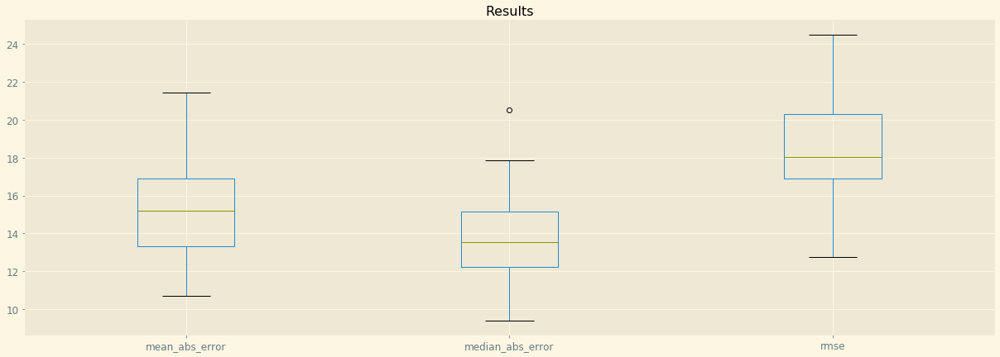

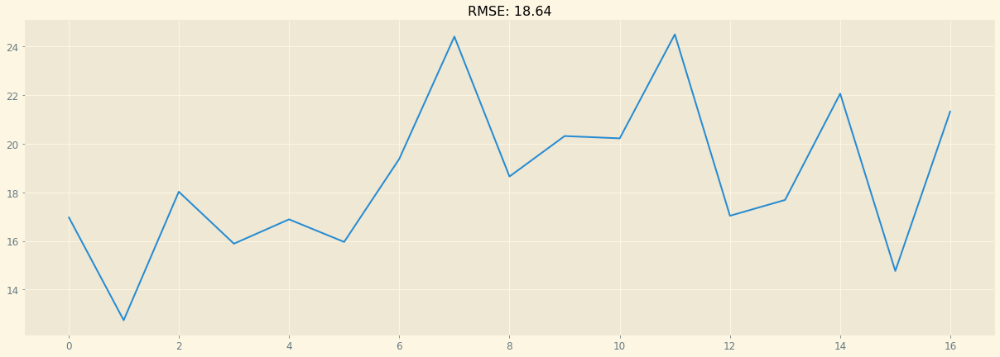

NameError: name 'plot_importance' is not defined

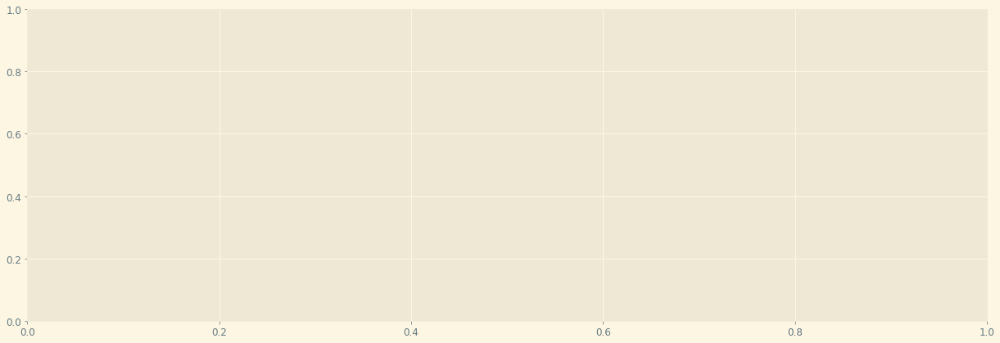

In [5]:
# Generate rolling predictions and results for particle of interest

data = oneparticle_onestation.sort_index().copy()
target = particle_of_interest

fit_func = fit_autoARIMA
predict_func = predict_autoARIMA

min_train_date = '2018-01-01'

week_starts = pd.date_range(min_train_date, data.index.max(), freq='W')

predictions_over_time, results_over_time = [], []

for i, week_start in enumerate(week_starts):
    if i % 10 == 0:
        print(week_start)

    train_set = data.loc[:(week_start - timedelta(hours=1))]
    test_set = data.loc[week_start:(week_start + timedelta(weeks=1, hours=-1))]
    models = train_set.groupby(['weekday', 'hour'])[target].apply(fit_func)
    predictions = test_set.apply(lambda x: predict_func(models.loc[tuple(x[['weekday', 'hour']])], x), axis=1)
    predictions_over_time.append(predictions)    
    results = evaluate_forecast(test_set[target], predictions, 'none')
    results['date'] = week_start
    results_over_time.append(results)  

results_over_time_08 = pd.DataFrame(results_over_time)
predictions_over_time_08 = pd.concat(predictions_over_time)

# Plot results statistics

results_over_time = results_over_time_08

fig, ax = plt.subplots(figsize=(21,7))
results_over_time.drop(['r2_score', 'mse'], axis=1).boxplot()
plt.title('Results')
plt.show()

# Plot RMSE overtime

fig, ax = plt.subplots(figsize=(21,7))
rmse_over_time = plt.plot(results_over_time['rmse'])
error = results_over_time['rmse'].mean()
plt.title('RMSE: %.2f'% error)
plt.show()

# Plot actuals and predictions overtime

plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_08, results_over_time_08)

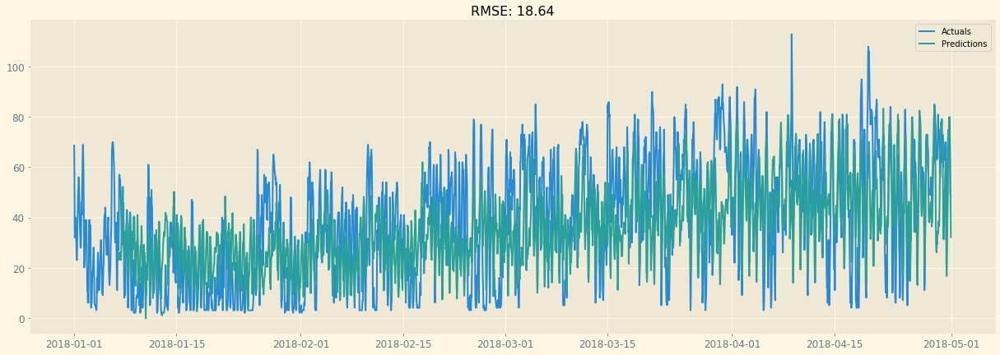

In [6]:
plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_08, results_over_time_08)

### Station nr 28079018  - San Isidro/Calle Farolillo

In [4]:
# Generate dataframe for one particle and one station of interest

station_of_interest = 28079018

print(f'The station of interest is: {station_of_interest}')
print('')

oneparticle_onestation = df_temp.loc[df_temp['station'] == station_of_interest]
oneparticle_onestation = oneparticle_onestation.drop(columns = [x for x in particles_of_interest if x is not particle_of_interest], axis=1)
oneparticle_onestation.drop('station', axis=1, inplace=True)

print(f'Missing values for particle and station of interest: {round(oneparticle_onestation[particle_of_interest].isnull().mean()*100, 2)}%')
print('')
oneparticle_onestation.dropna(inplace=True)

oneparticle_onestation['quarter'] = oneparticle_onestation.index.quarter
oneparticle_onestation['dayofyear'] = oneparticle_onestation.index.dayofyear
oneparticle_onestation['dayofmonth'] = oneparticle_onestation.index.day
oneparticle_onestation['weekyear'] = oneparticle_onestation.index.weekofyear
oneparticle_onestation['weekday'] = oneparticle_onestation.index.weekday
oneparticle_onestation['hour'] = oneparticle_onestation.index.hour
oneparticle_onestation['year'] = oneparticle_onestation.index.year
oneparticle_onestation['month'] = oneparticle_onestation.index.month
oneparticle_onestation.fillna(0, inplace=True)

print(f'One particle, one station DF shape: {oneparticle_onestation.shape}')
oneparticle_onestation.head()

The station of interest is: 28079018

Missing values for particle and station of interest: 1.47%

One particle, one station DF shape: (54673, 9)


,O_3,quarter,dayofyear,dayofmonth,weekyear,weekday,hour,year,month
date,,,,,,,,,
2012-01-01 00:00:00,3.0,1,1,1,52,6,0,2012,1
2012-01-01 01:00:00,3.0,1,1,1,52,6,1,2012,1
2012-01-01 02:00:00,3.0,1,1,1,52,6,2,2012,1
2012-01-01 03:00:00,3.0,1,1,1,52,6,3,2012,1
2012-01-01 04:00:00,3.0,1,1,1,52,6,4,2012,1


2018-01-07 00:00:00
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.184, BIC=2946.603, Time=0.396 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.044, BIC=2959.518, Time=0.052 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2935.915, BIC=2947.125, Time=0.037 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2940.696, BIC=2951.906, Time=0.074 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3260.903, BIC=3264.640, Time=0.007 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.101, BIC=2940.784, Time=0.199 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.893, BIC=2948.839, Time=0.077 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.304, BIC=2935.250, Time=0.171 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.109, BIC=2940.792, Time=0.236 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.606, BIC=2864.552, Time=0.057 seconds
Total fit time: 1.443 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.464, BIC=2761.883, Time=0.383 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2755.653, BIC=2763.126, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2749.940, BIC=2761.149, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.414, BIC=2762.624, Time=0.084 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2982.917, BIC=2986.654, Time=0.006 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2740.131, BIC=2758.814, Time=0.231 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2740.310, BIC=2758.993, Time=0.243 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.976, BIC=2766.132, Time=0.431 seconds
Near non-invertible roots for order (3, 0, 2

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2796.266, BIC=2818.666, Time=0.327 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.957, BIC=3028.424, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2842.605, BIC=2853.805, Time=0.054 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.504, BIC=2933.704, Time=0.072 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3573.616, BIC=3577.349, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.265, BIC=2811.932, Time=0.303 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.693, BIC=2898.626, Time=0.159 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2792.888, BIC=2807.822, Time=0.165 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.792, BIC=2812.458, Time=0.213 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2809.208, BIC=2824.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2797.299, BIC=2815.982, Time=0.198 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2800.680, BIC=2819.363, Time=0.262 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2797.008, BIC=2823.164, Time=0.412 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2797.051, BIC=2823.207, Time=0.489 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.949, BIC=2818.895, Time=0.130 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2795.061, BIC=2817.480, Time=0.311 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2796.251, BIC=2818.671, Time=0.305 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2798.709, BIC=2828.602, Time=0.552 seconds
Total fit time: 3.434 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.882, BIC=2836.302, Time=0.606 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.352, BIC=2911.285, Time=0.213 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.080, BIC=2915.747, Time=0.341 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.601, BIC=2918.535, Time=0.098 seconds
Total fit time: 1.799 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.561, BIC=2913.980, Time=0.492 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.301, BIC=2959.774, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2918.958, BIC=2930.167, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.935, BIC=2942.145, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3267.633, BIC=3271.370, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.050, BIC=2906.732, Time=0.215 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.397, BIC=2790.508, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3328.769, BIC=3332.473, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2644.518, BIC=2663.037, Time=0.282 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.439, BIC=2737.254, Time=0.120 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2643.342, BIC=2658.157, Time=0.169 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.567, BIC=2663.086, Time=0.300 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2650.436, BIC=2665.251, Time=0.142 seconds
Total fit time: 1.684 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.353, BIC=2697.635, Time=0.503 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2949.377, BIC=2956.804, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2816.305, BIC=2842.483, Time=0.910 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.494, BIC=2876.453, Time=0.266 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2853.551, BIC=2875.990, Time=0.423 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.299, BIC=2882.738, Time=0.484 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2818.277, BIC=2848.196, Time=1.172 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.646 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.545, BIC=2806.984, Time=0.788 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3191.772, BIC=3199.251, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.417, BIC=2909.637, Time

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2941.911, BIC=2960.610, Time=0.386 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.613, BIC=2963.791, Time=0.456 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2937.479, BIC=2963.658, Time=0.558 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2939.962, BIC=2954.921, Time=0.294 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2940.670, BIC=2963.109, Time=0.443 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2941.467, BIC=2963.905, Time=0.516 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2937.133, BIC=2967.051, Time=0.412 seconds
Total fit time: 4.042 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2938.278, BIC=2960.717, Time=0.372 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3009.095, BIC=3016.575, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2759.228, BIC=2777.927, Time=0.367 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2771.273, BIC=2786.232, Time=0.154 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2757.239, BIC=2772.198, Time=0.218 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2759.232, BIC=2777.931, Time=0.335 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2768.585, BIC=2783.544, Time=0.145 seconds
Total fit time: 1.947 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.448, BIC=2691.867, Time=0.510 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2700.892, BIC=2708.365, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2687.246, BIC=2698.456, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2690.710, BIC=2701.920, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2751.186, BIC=2773.527, Time=0.285 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.286, BIC=2782.628, Time=0.336 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2720.639, BIC=2750.428, Time=0.803 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.169 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.611, BIC=2865.030, Time=0.284 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3095.917, BIC=3103.390, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.160, BIC=2914.369, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2998.512, BIC=3009.722, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3594.425, BIC=3598.162, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.428, BIC=2930.127, Time=0.205 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.670, BIC=2932.369, Time=0.228 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.742, BIC=2884.921, Time=0.826 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2858.331, BIC=2884.510, Time=0.725 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2917.476, BIC=2932.436, Time=0.196 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2906.463, BIC=2928.902, Time=0.339 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.492, BIC=2936.931, Time=0.366 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2894.309, BIC=2924.227, Time=0.758 seconds
Total fit time: 4.510 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.087, BIC=2854.526, Time=0.612 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2916.274, BIC=2942.452, Time=0.580 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.439, BIC=2940.618, Time=0.288 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2917.430, BIC=2951.088, Time=0.797 seconds
Total fit time: 5.444 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.319, BIC=2938.758, Time=0.371 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2996.818, BIC=3004.298, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.060, BIC=2965.279, Time=0.109 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.972, BIC=2981.191, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3287.614, BIC=3291.354, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.651, BIC=2928.350, Time=0.225 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2877.434, BIC=2899.853, Time=0.375 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.547, BIC=2896.230, Time=0.230 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.376, BIC=2904.532, Time=0.636 seconds
Total fit time: 3.311 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.375, BIC=2863.794, Time=0.377 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2885.759, BIC=2893.233, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2873.037, BIC=2884.247, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.211, BIC=2889.420, Time=0.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3154.889, BIC=3158.626, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.416, BIC=2858.098, Time=0.256 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.449, BIC=2920.659, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3442.502, BIC=3446.239, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.147, BIC=2796.829, Time=0.271 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.955, BIC=2798.638, Time=0.266 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.288, BIC=2805.444, Time=0.598 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2777.326, BIC=2803.482, Time=0.450 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2782.601, BIC=2797.547, Time=0.158 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2776.071, BIC=2798.490, Time=0.274 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.040, BIC=2801.459, Time=0.328 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2729.355, BIC=2759.247, Time=0.898 seconds
Near non-invertible

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2786.631, BIC=2812.810, Time=0.649 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2788.666, BIC=2818.584, Time=0.701 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2788.736, BIC=2818.654, Time=0.892 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2818.584, BIC=2844.763, Time=0.381 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2833.082, BIC=2859.260, Time=0.519 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2790.609, BIC=2824.267, Time=0.939 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 5.848 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.277, BIC=2919.716, Time=0.372 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.519, BIC=2987.998, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2928.654, BIC=2939.873, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.335, BIC=2959.555, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3275.424, BIC=3279.163, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.338, BIC=2915.037, Time=0.292 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.086, BIC=2946.045, Time=0.183 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.058, BIC=2910.017, Time=0.235 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.380, BIC=2915.079, Time=0.287 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.296, BIC=2922.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2898.201, BIC=2913.160, Time=0.274 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.082, BIC=2917.781, Time=0.373 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.742, BIC=2923.701, Time=0.124 seconds
Total fit time: 2.508 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.563, BIC=2893.001, Time=0.608 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2906.033, BIC=2913.512, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2883.643, BIC=2894.863, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.695, BIC=2899.914, Time=0.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3182.273, BIC=3186.013, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.896, BIC=2887.595, Time=0.302 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2813.688, BIC=2832.339, Time=0.218 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2749.582, BIC=2768.232, Time=0.211 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2756.259, BIC=2771.179, Time=0.160 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.551, BIC=2773.932, Time=0.380 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2752.986, BIC=2771.636, Time=0.203 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.600, BIC=2777.711, Time=0.674 seconds
Total fit time: 3.506 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2744.734, BIC=2767.056, Time=0.390 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2989.037, BIC=2996.478, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2797.486, BIC=2808.647, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2818.147, BIC=2833.094, Time=0.146 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2819.892, BIC=2838.575, Time=0.220 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2824.052, BIC=2838.998, Time=0.143 seconds
Total fit time: 1.430 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.932, BIC=2809.351, Time=0.223 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3160.760, BIC=3168.233, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2809.117, BIC=2820.327, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2986.796, BIC=2998.006, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3514.063, BIC=3517.800, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.042, BIC=2803.725, Time=0.210 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.597, BIC=2933.016, Time=0.517 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.396, BIC=2976.869, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2928.262, BIC=2939.472, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2939.209, BIC=2950.419, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3269.664, BIC=3273.401, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.272, BIC=2927.955, Time=0.255 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.407, BIC=2948.353, Time=0.147 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.420, BIC=2922.366, Time=0.216 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.308, BIC=2927.990, Time=0.296 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2922.267, BIC=2937.

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.182, BIC=2796.602, Time=0.504 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.754, BIC=2887.227, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2796.902, BIC=2808.112, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.133, BIC=2836.343, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3216.980, BIC=3220.717, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2772.508, BIC=2791.190, Time=0.257 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.798, BIC=2825.745, Time=0.205 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.807, BIC=2785.753, Time=0.171 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2772.560, BIC=2791.243, Time=0.332 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2784.400, BIC=2799.346, Time=0.164 seconds
Total fit time: 1.8

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.442, BIC=2905.861, Time=0.309 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3128.191, BIC=3135.664, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2928.388, BIC=2939.598, Time=0.113 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3017.023, BIC=3028.232, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3637.131, BIC=3640.867, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.017, BIC=2898.700, Time=0.454 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.931, BIC=2999.877, Time=0.125 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.074, BIC=2895.020, Time=0.259 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2878.227, BIC=2900.646, Time=0.410 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2935.851, BIC=2954.

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.956, BIC=2891.134, Time=0.518 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.442, BIC=2913.401, Time=0.120 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2865.540, BIC=2887.979, Time=0.294 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.963, BIC=2896.882, Time=0.550 seconds
Total fit time: 3.952 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.599, BIC=2925.038, Time=0.402 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2973.711, BIC=2981.191, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2931.406, BIC=2942.625, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2938.650, BIC=2949.869, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3276.035, BIC=3279.775, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.376, BIC=2945.336, Time=0.286 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.013, BIC=2967.972, Time=0.165 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.060, BIC=2961.019, Time=0.153 seconds
Total fit time: 3.593 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.834, BIC=2938.273, Time=0.556 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.346, BIC=2952.826, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2933.561, BIC=2944.780, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.408, BIC=2947.627, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3252.439, BIC=3256.179, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.476, BIC=2934.175, Time=0.341 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.573, BIC=2783.256, Time=0.206 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2764.590, BIC=2783.273, Time=0.287 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.411, BIC=2775.567, Time=0.519 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2758.685, BIC=2781.105, Time=0.351 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.385, BIC=2779.278, Time=0.735 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.173, BIC=2780.329, Time=0.460 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.317, BIC=2784.946, Time=0.893 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2750.965, BIC=2784.594, Time=0.770 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2749.589, BIC=2779.481, Time=0.666 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2752.334, BIC=2782.226, Time=0.741 seconds
Fit ARIMA: (5, 0, 3)

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2876.606, BIC=2899.025, Time=0.283 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.544, BIC=2900.963, Time=0.393 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2833.180, BIC=2863.073, Time=0.735 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.249 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.318, BIC=2880.737, Time=0.559 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3178.130, BIC=3185.604, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2890.977, BIC=2902.187, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3028.208, BIC=3039.418, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3553.924, BIC=3557.660, Tim

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3278.648, BIC=3282.388, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.126, BIC=2931.825, Time=0.368 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.610, BIC=2943.569, Time=0.118 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.176, BIC=2926.135, Time=0.263 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.133, BIC=2931.831, Time=0.368 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2923.156, BIC=2938.115, Time=0.100 seconds
Total fit time: 1.980 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.545, BIC=2957.984, Time=0.557 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.056, BIC=2968.536, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.829, BIC=2957.048, Time=0.031 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2653.571, BIC=2672.254, Time=0.269 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2663.402, BIC=2678.348, Time=0.102 seconds
Total fit time: 1.754 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.316, BIC=2687.697, Time=0.333 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2727.751, BIC=2735.212, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2688.039, BIC=2699.230, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.656, BIC=2712.847, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2996.187, BIC=2999.917, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.268, BIC=2680.918, Time=0.222 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.896, BIC=2702.816, Time=0.168 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.046, BIC=2860.485, Time=0.528 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3115.928, BIC=3123.407, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2878.559, BIC=2889.779, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2990.045, BIC=3001.265, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3646.167, BIC=3649.907, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.420, BIC=2856.119, Time=0.247 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2940.717, BIC=2955.676, Time=0.194 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.667, BIC=2850.626, Time=0.158 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.512, BIC=2856.211, Time=0.300 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2850.703, BIC=2865.662, Time=0.129 seconds
Total fit time: 1.7

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.724, BIC=2860.423, Time=0.242 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.886, BIC=2861.585, Time=0.220 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.419, BIC=2871.598, Time=0.491 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2843.472, BIC=2869.651, Time=0.658 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.734, BIC=2862.693, Time=0.154 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2843.473, BIC=2865.912, Time=0.323 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.436, BIC=2865.875, Time=0.317 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2846.723, BIC=2876.642, Time=0.720 seconds
Total fit time: 3.934 seconds
Performing stepwise search t

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.467, BIC=2916.166, Time=0.261 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.390, BIC=2942.349, Time=0.125 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.481, BIC=2912.441, Time=0.230 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2898.887, BIC=2921.326, Time=0.341 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2922.289, BIC=2940.988, Time=0.146 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.672, BIC=2916.371, Time=0.281 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2901.305, BIC=2927.484, Time=0.623 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.747 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.197, BIC=2861.636, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2648.624, BIC=2670.926, Time=0.606 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.787, BIC=2969.221, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2731.083, BIC=2742.235, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.405, BIC=2855.556, Time=0.099 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3458.670, BIC=3462.387, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.110, BIC=2702.695, Time=0.252 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2684.343, BIC=2702.929, Time=0.222 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.083, BIC=2714.102, Time=0.602 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2651.206, BIC=2677.225, Time=0.774 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2683.459, BIC=2698.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.771, BIC=2887.486, Time=0.257 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.936, BIC=2888.651, Time=0.284 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2824.312, BIC=2850.513, Time=0.679 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2824.310, BIC=2850.511, Time=0.644 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.728, BIC=2884.700, Time=0.168 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2861.732, BIC=2884.190, Time=0.299 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2868.507, BIC=2890.965, Time=0.333 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2826.310, BIC=2856.254, Time=0.842 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 4.336 seconds
Performing stepwise search t

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.250, BIC=2969.965, Time=0.333 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.266, BIC=2969.981, Time=0.343 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.765, BIC=2972.966, Time=0.387 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2946.614, BIC=2972.815, Time=0.492 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.316, BIC=2964.288, Time=0.264 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2949.719, BIC=2972.177, Time=0.413 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.232, BIC=2973.690, Time=0.228 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2946.275, BIC=2976.219, Time=0.670 seconds
Total fit time: 3.723 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2947.361, BIC=2969.819, Time=0.366 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.775, BIC=2786.490, Time=0.308 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.941, BIC=2794.913, Time=0.160 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2765.776, BIC=2780.748, Time=0.234 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.775, BIC=2786.490, Time=0.333 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2777.494, BIC=2792.466, Time=0.140 seconds
Total fit time: 1.909 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.852, BIC=2700.290, Time=0.505 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2709.461, BIC=2716.941, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2695.642, BIC=2706.862, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.012, BIC=2710.231, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2759.224, BIC=2781.585, Time=0.333 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2768.272, BIC=2790.633, Time=0.340 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2728.592, BIC=2758.407, Time=0.765 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.316 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.882, BIC=2873.320, Time=0.298 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3106.232, BIC=3113.712, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2911.506, BIC=2922.725, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.331, BIC=3018.550, Time=0.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3605.155, BIC=3608.895, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2865.973, BIC=2888.431, Time=0.626 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3230.531, BIC=3238.017, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2990.505, BIC=3001.734, Time=0.104 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3114.393, BIC=3125.622, Time=0.081 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3602.271, BIC=3606.014, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.752, BIC=2938.467, Time=0.201 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.001, BIC=2940.716, Time=0.239 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.839, BIC=2893.040, Time=0.707 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2866.687, BIC=2892.888, Time=0.683 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.852, BIC=2940.

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.114, BIC=2940.315, Time=0.680 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.268, BIC=2946.726, Time=0.412 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.417, BIC=2956.361, Time=0.580 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2921.308, BIC=2951.252, Time=0.888 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2926.464, BIC=2952.665, Time=0.701 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.837, BIC=2951.038, Time=0.323 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2928.386, BIC=2962.073, Time=0.401 seconds
Total fit time: 5.339 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.655, BIC=2950.113, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.533, BIC=2908.972, Time=0.394 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.451, BIC=2961.930, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2923.560, BIC=2934.780, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.276, BIC=2947.495, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3267.586, BIC=3271.325, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.696, BIC=2903.395, Time=0.315 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.729, BIC=2926.688, Time=0.157 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.945, BIC=2902.905, Time=0.188 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2886.551, BIC=2908.990, Time=0.358 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2902.807, BIC=2921.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.048, BIC=2858.238, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3312.608, BIC=3316.338, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.990, BIC=2760.641, Time=0.215 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2742.887, BIC=2761.537, Time=0.241 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.718, BIC=2767.828, Time=0.591 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2740.903, BIC=2767.013, Time=0.617 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2744.796, BIC=2759.717, Time=0.180 secon

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2824.005, BIC=2853.949, Time=0.881 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2850.821, BIC=2877.022, Time=0.345 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2822.030, BIC=2848.231, Time=0.689 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.809, BIC=2885.267, Time=0.377 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2862.551, BIC=2892.495, Time=0.753 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.226, BIC=2879.941, Time=0.230 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.284, BIC=2888.485, Time=0.407 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2826.341, BIC=2860.028, Time=0.908 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 7.803 seconds
Performing stepwise search t

Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2762.023, BIC=2799.453, Time=1.302 seconds
Near non-invertible roots for order (3, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2805.182, BIC=2838.869, Time=0.956 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2807.548, BIC=2841.235, Time=0.812 seconds
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2756.641, BIC=2797.814, Time=1.183 seconds
Fit ARIMA: (5, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2767.187, BIC=2812.104, Time=1.307 seconds
Near non-invertible roots for order (5, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (5, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2806.174, BIC=2847.347, Time=1.090 seconds
Near non-invertible roots for order (5, 0, 4)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2960.656, BIC=2979.371, Time=0.254 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2947.975, BIC=2966.690, Time=0.334 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2948.633, BIC=2974.834, Time=0.413 seconds
Total fit time: 2.622 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.404, BIC=2965.862, Time=0.382 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3001.679, BIC=3009.165, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2972.613, BIC=2983.842, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2982.600, BIC=2993.829, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3307.240, BIC=3310.983, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.675, BIC=2960.390, Time=0.277 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.605, BIC=2890.815, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3355.464, BIC=3359.201, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.890, BIC=2789.573, Time=0.264 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.480, BIC=2851.426, Time=0.120 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2771.454, BIC=2786.400, Time=0.200 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2772.881, BIC=2795.300, Time=0.337 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2817.267, BIC=2835.950, Time=0.138 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.827, BIC=2789.510, Time=0.201 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2779.330, BIC=2794.277, Time=0.131 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2772.814, BIC=2795.233, Time=0.421 seconds
Fit ARIMA: (3, 0, 0

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.384, BIC=2859.343, Time=0.150 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2846.062, BIC=2864.761, Time=0.251 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2851.585, BIC=2866.544, Time=0.145 seconds
Total fit time: 1.626 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.461, BIC=2856.881, Time=0.269 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3149.550, BIC=3157.023, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2860.470, BIC=2871.679, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3001.231, BIC=3012.441, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3603.188, BIC=3606.924, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.464, BIC=2851.147, Time=0.232 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.896, BIC=2918.335, Time=0.539 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2963.390, BIC=2970.869, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.487, BIC=2930.707, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.789, BIC=2943.008, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3269.010, BIC=3272.750, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.990, BIC=2912.689, Time=0.240 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2925.034, BIC=2939.993, Time=0.148 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.995, BIC=2906.955, Time=0.222 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.992, BIC=2912.691, Time=0.311 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2912.252, BIC=2927.

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.264, BIC=2900.703, Time=0.623 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2909.379, BIC=2916.859, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.114, BIC=2903.333, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.105, BIC=2906.324, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3167.364, BIC=3171.103, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.015, BIC=2896.714, Time=0.313 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.670, BIC=2910.629, Time=0.101 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.019, BIC=2890.978, Time=0.267 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.016, BIC=2896.715, Time=0.359 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2890.313, BIC=2905.272, Time=0.133 seconds
Total fit time: 2.0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.210, BIC=2889.668, Time=0.278 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3084.293, BIC=3091.779, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2913.193, BIC=2924.422, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2990.109, BIC=3001.338, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3666.943, BIC=3670.686, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2864.288, BIC=2883.003, Time=0.240 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.377, BIC=2968.349, Time=0.186 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2863.509, BIC=2878.481, Time=0.205 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.547, BIC=2883.262, Time=0.331 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.944, BIC=2892.

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.198, BIC=2839.399, Time=0.669 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2848.719, BIC=2871.177, Time=0.341 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.255, BIC=2845.199, Time=0.968 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2817.306, BIC=2847.250, Time=0.943 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2808.485, BIC=2834.686, Time=0.737 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2843.996, BIC=2866.454, Time=0.287 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2847.985, BIC=2877.929, Time=0.386 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2843.136, BIC=2869.337, Time=0.360 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2819.841, BIC=2853.528, Time=0.939 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2956.421, BIC=2978.879, Time=0.478 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.142, BIC=2999.628, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2972.841, BIC=2984.070, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.590, BIC=2988.819, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3309.998, BIC=3313.741, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2956.994, BIC=2975.709, Time=0.357 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2956.995, BIC=2975.710, Time=0.388 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.367, BIC=2984.568, Time=0.649 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2958.224, BIC=2984.425, Time=0.637 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.998, BIC=2969.970, Time=0.298 seconds
Fit ARIMA: (0, 0, 2

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.373, BIC=2765.072, Time=0.283 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.589, BIC=2828.549, Time=0.176 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2744.391, BIC=2759.351, Time=0.233 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2746.378, BIC=2765.077, Time=0.311 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2766.033, BIC=2780.992, Time=0.149 seconds
Total fit time: 1.974 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.983, BIC=2762.422, Time=0.488 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.689, BIC=2972.168, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2781.461, BIC=2792.681, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2858.217, BIC=2869.436, Time=0.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2834.812, BIC=2857.231, Time=0.306 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.091, BIC=2859.510, Time=0.399 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2808.741, BIC=2838.633, Time=0.879 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.351 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.664, BIC=2886.103, Time=0.512 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3130.513, BIC=3137.993, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.905, BIC=2920.125, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3014.023, BIC=3025.242, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3646.414, BIC=3650.154, Tim

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3252.941, BIC=3256.681, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2864.859, BIC=2883.558, Time=0.265 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.803, BIC=2903.762, Time=0.109 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.880, BIC=2877.839, Time=0.235 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.860, BIC=2883.559, Time=0.350 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.485, BIC=2890.444, Time=0.106 seconds
Total fit time: 1.888 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.772, BIC=2965.230, Time=0.617 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.879, BIC=2979.365, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2955.778, BIC=2967.007, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2877.507, BIC=2888.736, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3184.511, BIC=3188.254, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.996, BIC=2880.711, Time=0.373 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.518, BIC=2887.490, Time=0.099 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.924, BIC=2875.896, Time=0.307 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.056, BIC=2880.771, Time=0.341 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2867.706, BIC=2882.678, Time=0.097 seconds
Total fit time: 2.076 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.643, BIC=2779.101, Time=0.540 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2773.199, BIC=2780.685, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.073, BIC=2769.723, Time=0.268 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.591, BIC=2840.511, Time=0.179 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2750.614, BIC=2765.535, Time=0.180 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.271, BIC=2769.922, Time=0.221 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2760.662, BIC=2775.582, Time=0.134 seconds
Total fit time: 1.628 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.513, BIC=2834.952, Time=0.482 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3040.383, BIC=3047.862, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2860.200, BIC=2871.419, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2941.225, BIC=2952.444, Time=0.079 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.770, BIC=2858.228, Time=0.280 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2777.431, BIC=2807.375, Time=0.775 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.258 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.543, BIC=2791.001, Time=0.674 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3059.708, BIC=3067.194, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2882.021, BIC=2893.250, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.670, BIC=2975.899, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3362.150, BIC=3365.893, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.738, BIC=2832.453, Tim

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.551, BIC=2988.780, Time=0.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3316.205, BIC=3319.948, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2938.991, BIC=2957.706, Time=0.275 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.978, BIC=2973.950, Time=0.190 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2937.378, BIC=2952.350, Time=0.195 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2938.952, BIC=2957.667, Time=0.288 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2943.985, BIC=2958.957, Time=0.111 seconds
Total fit time: 1.838 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.111, BIC=2940.550, Time=0.469 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.111, BIC=2986.591, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2618.823, BIC=2640.965, Time=0.434 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.424, BIC=2798.804, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2660.139, BIC=2671.210, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2714.744, BIC=2725.815, Time=0.074 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3182.799, BIC=3186.489, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2615.280, BIC=2633.732, Time=0.217 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.239, BIC=2707.000, Time=0.165 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2614.838, BIC=2629.599, Time=0.160 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2615.728, BIC=2634.179, Time=0.221 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2630.489, BIC=2645.

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2869.401, BIC=2895.602, Time=0.414 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2842.346, BIC=2876.033, Time=1.027 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 7.199 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.254, BIC=2888.693, Time=0.411 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3177.790, BIC=3185.270, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.085, BIC=2919.305, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3034.324, BIC=3045.543, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3624.868, BIC=3628.608, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2864.697, BIC=2883.396, Tim

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2882.060, BIC=2904.537, Time=0.324 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2882.155, BIC=2912.125, Time=0.563 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2884.029, BIC=2910.253, Time=0.384 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2882.242, BIC=2915.958, Time=0.866 seconds
Total fit time: 6.533 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.810, BIC=2964.288, Time=0.523 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3019.151, BIC=3026.643, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.639, BIC=2990.878, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2991.990, BIC=3003.229, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3310.003, BIC=3313.749, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.279, BIC=2972.010, Time=0.502 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.210, BIC=2989.195, Time=0.291 seconds
Total fit time: 2.669 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.772, BIC=2951.249, Time=0.623 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.846, BIC=2989.339, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.473, BIC=2959.712, Time=0.128 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2955.345, BIC=2966.584, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3287.290, BIC=3291.036, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.880, BIC=2945.611, Time=0.312 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.004, BIC=2969.989, Time=0.178 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.661, BIC=2797.312, Time=0.237 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2778.773, BIC=2797.424, Time=0.247 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.321, BIC=2772.431, Time=0.659 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2777.697, BIC=2800.077, Time=0.359 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2755.897, BIC=2785.737, Time=0.773 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2774.417, BIC=2804.258, Time=0.818 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2741.411, BIC=2767.521, Time=0.759 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2774.851, BIC=2797.231, Time=0.320 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=277

Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2922.897, BIC=2956.613, Time=0.773 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2918.402, BIC=2948.371, Time=0.566 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2895.111, BIC=2932.573, Time=1.064 seconds
Near non-invertible roots for order (3, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.819 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.080, BIC=2920.557, Time=0.448 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3218.642, BIC=3226.134, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3018.789, BIC=3030.027, Time=0.114 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3120.158, BIC=3131.396, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3650.057, BIC=3653.803, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2824.692, BIC=2843.423, Time=0.224 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2826.445, BIC=2845.176, Time=0.187 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2791.102, BIC=2817.326, Time=0.751 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.092, BIC=2849.570, Time=0.335 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.754, BIC=2856.724, Time=0.718 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2793.623, BIC=2823.593, Time=0.885 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2828.651, BIC=2854.875, Time=0.481 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2824.784, BIC=2851.008, Time=0.405 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=279

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.231, BIC=2944.689, Time=0.538 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2995.962, BIC=3003.449, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2955.246, BIC=2966.475, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.330, BIC=2982.559, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3303.006, BIC=3306.749, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.234, BIC=2938.949, Time=0.302 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2949.977, BIC=2964.949, Time=0.188 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.525, BIC=2935.497, Time=0.191 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2922.234, BIC=2944.692, Time=0.341 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2943.259, BIC=2961.

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2639.319, BIC=2665.475, Time=0.475 seconds
Total fit time: 2.394 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2686.244, BIC=2708.682, Time=0.410 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2774.942, BIC=2782.422, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2728.420, BIC=2739.640, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2747.315, BIC=2758.534, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3032.503, BIC=3036.243, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.255, BIC=2702.954, Time=0.241 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2726.091, BIC=2741.050, Time=0.164 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2685.987, BIC=2700.946, Time=0.162 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.563, BIC=2911.021, Time=0.406 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3133.376, BIC=3140.862, Time=0.169 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.856, BIC=2944.085, Time=0.120 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3025.674, BIC=3036.903, Time=0.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3646.668, BIC=3650.411, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.540, BIC=2906.255, Time=0.302 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.109, BIC=2996.081, Time=0.181 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2885.893, BIC=2900.865, Time=0.197 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.635, BIC=2906.350, Time=0.247 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2901.899, BIC=2916.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2817.083, BIC=2835.814, Time=0.222 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.121, BIC=2966.106, Time=0.166 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2818.737, BIC=2833.722, Time=0.154 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2815.629, BIC=2838.107, Time=0.303 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2913.447, BIC=2932.178, Time=0.255 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2771.911, BIC=2798.134, Time=0.684 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2775.006, BIC=2804.975, Time=0.735 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2817.977, BIC=2847.947, Time=0.664 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=281

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2949.258, BIC=2967.989, Time=0.331 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2989.116, BIC=3004.101, Time=0.181 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.927, BIC=2968.912, Time=0.237 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2949.731, BIC=2972.208, Time=0.334 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2970.975, BIC=2989.706, Time=0.159 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.845, BIC=2969.576, Time=0.299 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2951.472, BIC=2977.696, Time=0.574 seconds
Total fit time: 2.738 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.920, BIC=2981.397, Time=0.400 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3019.809, BIC=3027.301, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.686, BIC=2717.671, Time=0.204 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.286, BIC=2723.017, Time=0.230 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2723.872, BIC=2738.857, Time=0.144 seconds
Total fit time: 1.474 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2747.644, BIC=2770.083, Time=0.447 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2883.607, BIC=2891.086, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2789.396, BIC=2800.615, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.048, BIC=2841.268, Time=0.080 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3232.651, BIC=3236.391, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.482, BIC=2765.181, Time=0.280 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2838.649, BIC=2864.850, Time=0.642 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2838.594, BIC=2853.566, Time=0.171 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2841.180, BIC=2863.638, Time=0.314 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.667, BIC=2864.125, Time=0.495 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2840.134, BIC=2870.078, Time=0.750 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.283 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.455, BIC=2877.913, Time=0.675 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2818.032, BIC=2836.747, Time=0.260 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.105, BIC=2883.077, Time=0.111 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2816.515, BIC=2831.487, Time=0.180 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2818.188, BIC=2836.903, Time=0.263 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2839.679, BIC=2854.651, Time=0.114 seconds
Total fit time: 1.572 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.563, BIC=2900.021, Time=0.407 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.813, BIC=2987.299, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.787, BIC=2920.016, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.150, BIC=2942.379, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2933.271, BIC=2959.472, Time=0.472 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.254, BIC=2967.226, Time=0.129 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2935.396, BIC=2957.854, Time=0.255 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.049, BIC=2964.993, Time=0.717 seconds
Total fit time: 4.203 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.581, BIC=2945.039, Time=0.454 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.586, BIC=2973.072, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.972, BIC=2950.201, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.864, BIC=2956.093, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3240.908, BIC=3244.651, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.111, BIC=2797.810, Time=0.263 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.261, BIC=2878.220, Time=0.164 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2777.126, BIC=2792.085, Time=0.196 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.115, BIC=2797.814, Time=0.298 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.147, BIC=2806.106, Time=0.147 seconds
Total fit time: 1.782 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.871, BIC=2875.348, Time=0.530 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3075.310, BIC=3082.802, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.342, BIC=2909.580, Time=0.034 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.540, BIC=2986.779, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2897.274, BIC=2919.752, Time=0.319 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2901.390, BIC=2923.867, Time=0.328 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2855.410, BIC=2885.379, Time=0.857 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.236 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2862.324, BIC=2884.801, Time=0.405 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3091.014, BIC=3098.506, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2902.024, BIC=2913.263, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.036, BIC=2986.274, Time=0.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3406.282, BIC=3410.029, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.697, BIC=2983.174, Time=0.542 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2997.733, BIC=3005.225, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.814, BIC=2986.053, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.112, BIC=2991.351, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3309.469, BIC=3313.215, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.652, BIC=2977.383, Time=0.331 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.496, BIC=2992.481, Time=0.189 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2956.697, BIC=2971.682, Time=0.255 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.661, BIC=2977.392, Time=0.405 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.573, BIC=2986.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.051, BIC=2802.766, Time=0.269 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.592, BIC=2856.564, Time=0.177 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2782.652, BIC=2797.624, Time=0.201 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.200, BIC=2802.915, Time=0.310 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.301, BIC=2821.273, Time=0.149 seconds
Total fit time: 1.975 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2755.518, BIC=2777.976, Time=0.533 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2935.861, BIC=2943.347, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2796.284, BIC=2807.513, Time=0.129 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.075, BIC=2865.304, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2793.961, BIC=2831.359, Time=1.175 seconds
Near non-invertible roots for order (3, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 7.379 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.831, BIC=2836.270, Time=0.700 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3080.564, BIC=3088.043, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.763, BIC=2914.983, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2986.647, BIC=2997.866, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3662.480, BIC=3666.220, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.097, BIC=2862.796, Time=0.275 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.074, BIC=2863.773, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2824.027, BIC=2842.742, Time=0.238 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.550, BIC=2908.522, Time=0.155 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.618, BIC=2837.590, Time=0.169 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2824.087, BIC=2842.802, Time=0.217 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2833.082, BIC=2848.054, Time=0.147 seconds
Total fit time: 1.391 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2875.607, BIC=2898.065, Time=0.574 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2937.525, BIC=2945.011, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2896.673, BIC=2907.902, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.659, BIC=2920.888, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2908.842, BIC=2927.573, Time=0.307 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.255, BIC=2941.239, Time=0.118 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.320, BIC=2923.305, Time=0.242 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.888, BIC=2927.619, Time=0.371 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2917.500, BIC=2932.485, Time=0.260 seconds
Total fit time: 1.998 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.921, BIC=2896.398, Time=0.505 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.545, BIC=2901.038, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.003, BIC=2895.242, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.888, BIC=2898.126, Time=0.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2744.770, BIC=2759.691, Time=0.214 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2746.604, BIC=2765.254, Time=0.259 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2761.349, BIC=2776.270, Time=0.110 seconds
Total fit time: 1.696 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.577, BIC=2783.977, Time=0.426 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.598, BIC=2977.065, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.011, BIC=2817.211, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2882.904, BIC=2894.104, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3514.040, BIC=3517.773, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2759.575, BIC=2778.242, Time=0.274 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2848.284, BIC=2867.015, Time=0.211 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.348, BIC=2868.079, Time=0.239 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2783.750, BIC=2809.973, Time=0.719 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2784.695, BIC=2810.918, Time=0.880 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2848.490, BIC=2863.474, Time=0.175 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2839.908, BIC=2862.386, Time=0.358 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.907, BIC=2867.384, Time=0.325 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2786.809, BIC=2816.779, Time=0.814 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.528 seconds
Performing stepwise search t

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2945.071, BIC=2963.802, Time=0.282 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2950.068, BIC=2965.052, Time=0.117 seconds
Total fit time: 1.782 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2949.937, BIC=2972.415, Time=0.401 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3013.324, BIC=3020.816, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2972.406, BIC=2983.645, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2987.691, BIC=2998.930, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3325.826, BIC=3329.572, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.359, BIC=2967.090, Time=0.260 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.102, BIC=2983.087, Time=0.221 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2609.598, BIC=2628.066, Time=0.255 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2668.479, BIC=2683.254, Time=0.115 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2608.172, BIC=2622.947, Time=0.181 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2609.767, BIC=2628.236, Time=0.238 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2626.804, BIC=2641.579, Time=0.132 seconds
Total fit time: 1.630 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2627.274, BIC=2649.436, Time=0.312 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2802.132, BIC=2809.520, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2669.040, BIC=2680.121, Time=0.096 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2725.008, BIC=2736.089, Time=0.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.298, BIC=2906.029, Time=0.249 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.551, BIC=2906.282, Time=0.297 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2848.121, BIC=2874.345, Time=0.713 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.387, BIC=2905.864, Time=0.382 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.955, BIC=2914.924, Time=0.691 seconds
Near non-invertible roots for order (4, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2849.748, BIC=2879.718, Time=0.642 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2846.852, BIC=2873.075, Time=0.715 second

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.051, BIC=2917.548, Time=0.330 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2999.651, BIC=3007.150, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.200, BIC=2952.448, Time=0.113 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.456, BIC=2970.704, Time=0.082 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3299.371, BIC=3303.120, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.845, BIC=2915.592, Time=0.285 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.351, BIC=2916.098, Time=0.286 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.635, BIC=2917.881, Time=0.435 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2892.834, BIC=2915.331, Time=0.411 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.392, BIC=2922.

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3337.882, BIC=3341.632, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2962.672, BIC=2981.419, Time=0.285 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.042, BIC=3019.039, Time=0.184 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2962.766, BIC=2977.764, Time=0.293 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2953.494, BIC=2975.991, Time=0.372 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2983.353, BIC=3002.100, Time=0.234 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2955.133, BIC=2981.379, Time=0.475 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2955.093, BIC=2981.338, Time=0.415 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2973.162, BIC=2995.659, Time=0.226 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2955.881, BIC=2985.876, Time=0.777 seconds
Near non-invertible

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.590, BIC=2782.289, Time=0.210 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.364, BIC=2824.323, Time=0.107 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.943, BIC=2776.902, Time=0.200 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.671, BIC=2782.370, Time=0.309 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2780.732, BIC=2795.692, Time=0.152 seconds
Total fit time: 1.656 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2759.742, BIC=2782.103, Time=0.524 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.823, BIC=2900.277, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2802.215, BIC=2813.395, Time=0.112 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.774, BIC=2847.955, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3101.302, BIC=3112.550, Time=0.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3676.293, BIC=3680.042, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.256, BIC=2964.003, Time=0.267 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2946.997, BIC=2965.744, Time=0.290 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.078, BIC=2926.324, Time=0.718 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2945.862, BIC=2968.358, Time=0.404 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.422, BIC=2930.418, Time=0.829 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2902.450, BIC=2932.445, Time=0.850 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=28

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.166, BIC=2827.412, Time=0.689 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2801.149, BIC=2827.395, Time=0.718 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.355, BIC=2862.352, Time=0.130 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2837.646, BIC=2860.142, Time=0.257 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.429, BIC=2866.925, Time=0.363 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2802.779, BIC=2832.774, Time=0.774 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.347 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2800.481, BIC=2822.977, Time=0.659 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3057.789, BIC=3065.288, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.027, BIC=2991.266, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3309.063, BIC=3312.810, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.565, BIC=2949.296, Time=0.303 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.966, BIC=2980.951, Time=0.192 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.307, BIC=2946.292, Time=0.245 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2931.611, BIC=2954.088, Time=0.341 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2956.533, BIC=2975.264, Time=0.167 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.980, BIC=2949.711, Time=0.286 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2934.404, BIC=2960.628, Time=0.610 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2646.496, BIC=2665.194, Time=0.240 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.665, BIC=2690.625, Time=0.169 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2649.656, BIC=2664.616, Time=0.218 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2648.496, BIC=2670.934, Time=0.397 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2658.984, BIC=2677.683, Time=0.248 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2646.815, BIC=2665.514, Time=0.248 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2647.189, BIC=2673.368, Time=0.466 seconds
Total fit time: 2.701 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.257, BIC=2716.715, Time=0.410 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2784.045, BIC=2791.531, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.508, BIC=2919.985, Time=0.450 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3143.914, BIC=3151.406, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.834, BIC=2953.073, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3035.008, BIC=3046.247, Time=0.084 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3657.478, BIC=3661.224, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.490, BIC=2915.221, Time=0.274 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2990.877, BIC=3005.862, Time=0.168 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.777, BIC=2909.762, Time=0.188 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.569, BIC=2915.300, Time=0.265 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2911.343, BIC=2926.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3022.828, BIC=3034.077, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3465.128, BIC=3468.877, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.138, BIC=2843.885, Time=0.221 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.768, BIC=2974.766, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2826.731, BIC=2841.729, Time=0.155 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2823.658, BIC=2846.154, Time=0.296 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2921.768, BIC=2940.515, Time=0.252 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2779.428, BIC=2805.674, Time=0.704 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2782.841, BIC=2812.836, Time=0.833 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3010.741, BIC=3021.989, Time=0.130 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3330.426, BIC=3334.175, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.120, BIC=2977.867, Time=0.321 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2999.383, BIC=3014.381, Time=0.163 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.578, BIC=2979.576, Time=0.207 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2959.561, BIC=2982.057, Time=0.365 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2981.116, BIC=2999.863, Time=0.226 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.919, BIC=2979.666, Time=0.304 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2961.332, BIC=2987.578, Time=0.519 seconds
Total fit time: 2.728 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.013, BIC=2731.760, Time=0.375 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.694, BIC=2772.691, Time=0.263 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.630, BIC=2726.628, Time=0.475 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2713.182, BIC=2731.929, Time=0.582 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2733.075, BIC=2748.073, Time=0.374 seconds
Total fit time: 2.577 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2759.551, BIC=2782.009, Time=1.190 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.189, BIC=2899.675, Time=0.034 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2799.491, BIC=2810.720, Time=0.289 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.061, BIC=2850.290, Time=0.186 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2847.877, BIC=2874.100, Time=0.589 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.825, BIC=2862.809, Time=0.158 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2850.278, BIC=2872.755, Time=0.312 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2850.801, BIC=2873.278, Time=0.545 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2847.919, BIC=2877.888, Time=0.873 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.160 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.699, BIC=2886.176, Time=0.681 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.555, BIC=2910.794, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3279.693, BIC=3283.439, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.171, BIC=2850.902, Time=0.247 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.103, BIC=2895.088, Time=0.167 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.597, BIC=2845.582, Time=0.165 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.315, BIC=2851.046, Time=0.271 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2853.030, BIC=2868.014, Time=0.105 seconds
Total fit time: 1.565 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.461, BIC=2912.938, Time=0.435 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2989.532, BIC=2997.025, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.512, BIC=2964.989, Time=0.390 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2949.143, BIC=2967.874, Time=0.176 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.375, BIC=2970.598, Time=1.089 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.224, BIC=2979.209, Time=0.303 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.998, BIC=2968.475, Time=0.670 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.217, BIC=2976.186, Time=1.665 seconds
Total fit time: 6.213 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.907, BIC=2956.385, Time=1.051 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.620, BIC=2983.112, Time=0.032 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2949.978, BIC=2961.217, Time=0.264 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.567, BIC=2918.796, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3587.287, BIC=3591.030, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.830, BIC=2807.545, Time=0.257 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.715, BIC=2886.687, Time=0.167 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2786.881, BIC=2801.853, Time=0.155 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.842, BIC=2807.557, Time=0.298 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2801.034, BIC=2816.006, Time=0.143 seconds
Total fit time: 1.662 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2862.612, BIC=2885.108, Time=1.909 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3084.165, BIC=3091.664, Time=0.031 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2862.135, BIC=2888.381, Time=1.930 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.014, BIC=2927.011, Time=0.431 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2907.712, BIC=2930.208, Time=0.811 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.883, BIC=2934.379, Time=0.893 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2865.206, BIC=2895.202, Time=2.089 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 12.008 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.933, BIC=2895.429, Time=0.836 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3099.903, BIC=3107.401, Time=0.046 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2912.062, BIC=2923.310, Tim

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.938, BIC=2911.858, Time=0.689 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2898.687, BIC=2917.337, Time=0.934 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2913.294, BIC=2928.215, Time=0.369 seconds
Total fit time: 4.699 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.575, BIC=2992.071, Time=1.266 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3006.872, BIC=3014.371, Time=0.032 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2984.070, BIC=2995.318, Time=0.172 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.294, BIC=3000.543, Time=0.318 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3319.147, BIC=3322.897, Time=0.021 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.540, BIC=2986.287, Time=0.816 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2839.158, BIC=2850.396, Time=0.288 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2877.802, BIC=2889.041, Time=0.291 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3398.504, BIC=3402.251, Time=0.020 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2792.003, BIC=2810.734, Time=0.631 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.290, BIC=2865.275, Time=0.380 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.610, BIC=2805.595, Time=0.523 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2792.155, BIC=2810.886, Time=0.746 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2814.776, BIC=2829.761, Time=0.367 seconds
Total fit time: 4.731 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.344, BIC=2786.822, Time=2.039 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2798.896, BIC=2832.583, Time=2.421 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2816.696, BIC=2850.383, Time=2.121 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2818.631, BIC=2848.575, Time=1.332 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2802.380, BIC=2839.810, Time=2.675 seconds
Near non-invertible roots for order (3, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 18.240 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2823.766, BIC=2846.224, Time=1.678 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3090.087, BIC=3097.573, Time=0.032 seconds
Fit ARIMA: (1, 0, 0)x(

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.698, BIC=2991.683, Time=0.325 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2880.625, BIC=2895.610, Time=0.326 seconds
Total fit time: 6.838 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.572, BIC=2857.049, Time=0.671 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3035.576, BIC=3043.068, Time=0.034 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2873.917, BIC=2885.155, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2947.551, BIC=2958.789, Time=0.602 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3376.012, BIC=3379.758, Time=0.022 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.655, BIC=2851.386, Time=0.887 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.038, BIC=2917.022, Time=0.522 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.957, BIC=2976.955, Time=0.416 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.065, BIC=2963.062, Time=0.693 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.751, BIC=2968.498, Time=0.803 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.491, BIC=2969.488, Time=0.133 seconds
Total fit time: 4.680 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.149, BIC=2941.645, Time=1.333 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.211, BIC=2961.709, Time=0.032 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.915, BIC=2950.163, Time=0.160 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.157, BIC=2955.405, Time=0.183 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3298.994, BIC=3302.743, Time=0.019 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2759.044, BIC=2777.710, Time=0.594 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2762.308, BIC=2788.442, Time=0.950 seconds
Total fit time: 5.301 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.212, BIC=2778.612, Time=1.257 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2926.462, BIC=2933.929, Time=0.032 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2792.825, BIC=2804.025, Time=0.153 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.690, BIC=2858.890, Time=0.196 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3429.646, BIC=3433.379, Time=0.021 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.612, BIC=2773.279, Time=0.572 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2818.777, BIC=2833.711, Time=0.409 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.775, BIC=2905.522, Time=0.554 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2828.966, BIC=2855.212, Time=2.318 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2816.815, BIC=2843.061, Time=1.967 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2881.440, BIC=2903.937, Time=0.790 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2891.759, BIC=2921.754, Time=1.896 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2820.912, BIC=2850.907, Time=2.302 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2877.757, BIC=2904.003, Time=1.076 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2821.936, BIC=2855.680, Time=2.222 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 15.525 seconds
Performing stepwise search 

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2945.802, BIC=2964.549, Time=0.653 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2950.426, BIC=2965.424, Time=0.367 seconds
Total fit time: 4.044 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.420, BIC=2977.916, Time=0.967 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3024.236, BIC=3031.734, Time=0.031 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2984.364, BIC=2995.612, Time=0.166 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.226, BIC=3011.474, Time=0.295 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3339.227, BIC=3342.976, Time=0.020 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.312, BIC=2973.059, Time=0.703 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.889, BIC=2991.886, Time=0.438 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.970, BIC=2657.605, Time=0.528 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.965, BIC=2698.873, Time=0.380 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.300, BIC=2653.207, Time=0.405 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.217, BIC=2657.851, Time=0.529 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2653.612, BIC=2668.519, Time=0.300 seconds
Total fit time: 3.457 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2620.156, BIC=2642.338, Time=0.979 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2753.805, BIC=2761.199, Time=0.030 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.521, BIC=2667.612, Time=0.262 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.530, BIC=2704.621, Time=0.270 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2863.724, BIC=2893.693, Time=1.259 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2859.733, BIC=2885.957, Time=0.957 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2828.348, BIC=2862.064, Time=2.359 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 17.109 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.100, BIC=2917.597, Time=1.162 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3171.153, BIC=3178.651, Time=0.036 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.529, BIC=2955.778, Time=0.289 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.399, BIC=3055.648, Time=0.293 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3681.781, BIC=3685.530, Ti

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2795.638, BIC=2825.659, Time=1.944 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 10.171 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.422, BIC=2856.938, Time=0.934 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3061.584, BIC=3069.089, Time=0.033 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2886.068, BIC=2897.326, Time=0.241 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.571, BIC=2970.829, Time=0.199 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3362.872, BIC=3366.625, Time=0.025 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.777, BIC=2851.540, Time=0.513 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.264, BIC=2948.274, Ti

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.105, BIC=2992.621, Time=1.008 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.041, BIC=2992.804, Time=0.654 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.708, BIC=2997.976, Time=1.509 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3002.397, BIC=3017.407, Time=0.465 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2973.344, BIC=2995.860, Time=0.743 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.685, BIC=3001.705, Time=1.833 seconds
Total fit time: 11.257 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.545, BIC=2996.060, Time=1.257 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.396, BIC=3045.901, Time=0.031 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.022, BIC=3018.280, Time=1.394 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2697.458, BIC=2712.404, Time=0.141 seconds
Total fit time: 2.984 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2772.981, BIC=2795.439, Time=0.533 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.739, BIC=2887.225, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2807.730, BIC=2818.959, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.436, BIC=2844.665, Time=0.080 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3220.436, BIC=3224.179, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2771.885, BIC=2790.601, Time=0.281 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2818.204, BIC=2833.176, Time=0.112 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.226, BIC=2785.198, Time=0.187 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.027, BIC=2883.273, Time=0.740 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2856.899, BIC=2883.145, Time=0.823 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.114, BIC=2924.112, Time=0.164 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2896.571, BIC=2919.068, Time=0.337 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.735, BIC=2929.231, Time=0.394 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2859.779, BIC=2889.774, Time=0.853 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.420 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.623, BIC=2929.138, Time=0.684 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3207.477, BIC=3214.982, Time

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.835, BIC=2836.103, Time=0.745 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2809.834, BIC=2836.102, Time=0.772 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2855.537, BIC=2870.547, Time=0.148 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2845.857, BIC=2868.372, Time=0.323 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2852.613, BIC=2875.128, Time=0.353 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2811.689, BIC=2841.709, Time=0.882 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.627 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.497, BIC=2832.013, Time=0.695 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3068.045, BIC=3075.550, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.720, BIC=3000.968, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3318.628, BIC=3322.377, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2939.796, BIC=2958.543, Time=0.314 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2975.003, BIC=2990.000, Time=0.133 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2940.379, BIC=2955.377, Time=0.174 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2941.048, BIC=2963.544, Time=0.336 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2965.976, BIC=2984.723, Time=0.180 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2940.146, BIC=2958.893, Time=0.362 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2943.707, BIC=2969.953, Time=0.613 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.314, BIC=2673.029, Time=0.259 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.676, BIC=2698.648, Time=0.144 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.430, BIC=2672.402, Time=0.191 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2656.314, BIC=2678.772, Time=0.357 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2666.969, BIC=2685.684, Time=0.265 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2654.611, BIC=2673.326, Time=0.278 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2655.150, BIC=2681.351, Time=0.497 seconds
Total fit time: 2.694 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2702.108, BIC=2724.585, Time=0.472 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2793.139, BIC=2800.632, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.776, BIC=2928.272, Time=0.477 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3154.010, BIC=3161.509, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2950.268, BIC=2961.517, Time=0.133 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.400, BIC=3055.648, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3668.354, BIC=3672.103, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2904.782, BIC=2923.529, Time=0.304 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2999.530, BIC=3014.527, Time=0.193 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2903.059, BIC=2918.056, Time=0.204 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.857, BIC=2923.604, Time=0.335 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.655, BIC=2934.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.540, BIC=2853.303, Time=0.233 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.576, BIC=2983.587, Time=0.200 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.032, BIC=2851.043, Time=0.159 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2832.722, BIC=2855.237, Time=0.304 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2930.383, BIC=2949.146, Time=0.290 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2787.901, BIC=2814.169, Time=0.849 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2791.443, BIC=2821.464, Time=0.932 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2835.281, BIC=2865.302, Time=0.733 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=283

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2998.442, BIC=3017.205, Time=0.250 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2977.347, BIC=3003.615, Time=0.618 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2980.678, BIC=3010.698, Time=0.758 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2978.272, BIC=3008.292, Time=0.901 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2979.279, BIC=3005.547, Time=0.574 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.933, BIC=3005.201, Time=0.563 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2976.639, BIC=3010.412, Time=1.194 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 6.779 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.657, BIC=2991.172, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2734.255, BIC=2745.512, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2974.145, BIC=2977.898, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2702.699, BIC=2721.462, Time=0.297 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.128, BIC=2745.138, Time=0.174 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.145, BIC=2716.156, Time=0.214 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.792, BIC=2721.554, Time=0.306 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2718.200, BIC=2733.211, Time=0.152 seconds
Total fit time: 1.756 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2723.008, BIC=2745.524, Time=0.386 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2814.730, BIC=2822.235, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2788.355, BIC=2810.755, Time=0.536 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.630, BIC=2811.030, Time=0.491 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2769.578, BIC=2799.445, Time=0.889 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.748 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.862, BIC=2878.359, Time=0.508 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3133.494, BIC=3140.993, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2897.141, BIC=2908.389, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.314, BIC=3018.562, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3656.725, BIC=3660.475, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.200, BIC=2809.696, Time=0.626 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.636, BIC=3046.135, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2827.213, BIC=2838.461, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.991, BIC=2935.239, Time=0.151 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3346.909, BIC=3350.658, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.472, BIC=2804.219, Time=0.224 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.663, BIC=2888.661, Time=0.187 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.486, BIC=2798.484, Time=0.159 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.476, BIC=2804.223, Time=0.230 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2800.298, BIC=2815.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.925, BIC=2991.672, Time=0.306 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.511, BIC=3011.509, Time=0.135 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.106, BIC=2986.103, Time=0.243 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.992, BIC=2991.739, Time=0.445 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2988.229, BIC=3003.227, Time=0.183 seconds
Total fit time: 2.189 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.018, BIC=2977.514, Time=0.454 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.555, BIC=3015.054, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.615, BIC=2986.863, Time=0.103 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.692, BIC=2992.940, Time=0.136 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2791.308, BIC=2813.805, Time=0.486 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2995.646, BIC=3003.145, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2831.620, BIC=2842.869, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2905.133, BIC=2916.381, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3545.639, BIC=3549.389, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2789.886, BIC=2808.633, Time=0.323 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.048, BIC=2878.045, Time=0.125 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.131, BIC=2803.128, Time=0.225 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.913, BIC=2808.660, Time=0.345 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2800.535, BIC=2815.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.545, BIC=2949.308, Time=0.224 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3047.602, BIC=3062.612, Time=0.198 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.157, BIC=2944.167, Time=0.167 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.706, BIC=2949.469, Time=0.266 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.320, BIC=2954.331, Time=0.154 seconds
Total fit time: 1.753 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.491, BIC=2892.006, Time=0.660 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3221.869, BIC=3229.374, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.854, BIC=2979.112, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3088.558, BIC=3099.815, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.256, BIC=2973.019, Time=0.348 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.474, BIC=2992.484, Time=0.169 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.439, BIC=2967.449, Time=0.297 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.307, BIC=2973.070, Time=0.437 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.413, BIC=2986.423, Time=0.180 seconds
Total fit time: 2.298 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2908.487, BIC=2930.887, Time=0.439 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2949.563, BIC=2957.030, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2929.027, BIC=2940.227, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.813, BIC=2946.013, Time=0.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.814, BIC=2892.062, Time=0.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3314.380, BIC=3318.129, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2819.741, BIC=2838.488, Time=0.261 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2865.664, BIC=2880.662, Time=0.181 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2818.253, BIC=2833.251, Time=0.220 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2819.882, BIC=2838.629, Time=0.358 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2843.150, BIC=2858.148, Time=0.156 seconds
Total fit time: 2.000 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2804.740, BIC=2827.236, Time=0.421 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2942.779, BIC=2950.278, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2829.662, BIC=2855.886, Time=0.526 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2829.834, BIC=2856.057, Time=0.465 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2890.816, BIC=2913.293, Time=0.417 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2828.240, BIC=2858.209, Time=0.744 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2808.607, BIC=2842.323, Time=1.056 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2825.097, BIC=2858.813, Time=0.883 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2827.008, BIC=2856.977, Time=0.490 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2810.115, BIC=2847.577, Time=1.163 seconds
Near non-invertible roots for order (3, 0, 5)(0, 0, 0, 0);

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2883.490, BIC=2909.736, Time=0.676 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2881.336, BIC=2896.334, Time=0.171 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2985.194, BIC=3000.192, Time=0.196 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2889.740, BIC=2904.737, Time=0.148 seconds
Total fit time: 3.165 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.691, BIC=2866.187, Time=0.389 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3044.315, BIC=3051.814, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2882.781, BIC=2894.030, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2955.999, BIC=2967.247, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.553, BIC=2991.811, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3342.395, BIC=3346.148, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.824, BIC=2978.587, Time=0.353 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.239, BIC=2986.249, Time=0.205 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.032, BIC=2973.042, Time=0.276 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.812, BIC=2978.575, Time=0.364 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.178, BIC=2979.189, Time=0.059 seconds
Total fit time: 2.121 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.350, BIC=2951.865, Time=0.646 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2963.309, BIC=2970.814, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.311, BIC=2782.257, Time=0.208 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2768.912, BIC=2791.332, Time=0.334 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2804.880, BIC=2823.563, Time=0.255 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.039, BIC=2785.722, Time=0.268 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2770.304, BIC=2796.460, Time=0.429 seconds
Total fit time: 2.453 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.232, BIC=2786.652, Time=0.570 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2936.515, BIC=2943.988, Time=0.178 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2801.206, BIC=2812.416, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.929, BIC=2868.138, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3098.634, BIC=3109.891, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3587.086, BIC=3590.839, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2894.659, BIC=2913.422, Time=0.258 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.931, BIC=2913.694, Time=0.245 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2848.041, BIC=2874.309, Time=0.745 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2825.989, BIC=2852.257, Time=0.785 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2889.581, BIC=2912.097, Time=0.351 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2899.696, BIC=2929.717, Time=0.830 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2828.358, BIC=2858.379, Time=1.143 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2885.877, BIC=2912.145, Time=0.528 seconds
Fit ARIMA: (3, 0, 4

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.835, BIC=2974.598, Time=0.282 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.253, BIC=2995.263, Time=0.219 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2955.625, BIC=2970.635, Time=0.193 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2955.662, BIC=2974.425, Time=0.290 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.150, BIC=2975.160, Time=0.161 seconds
Total fit time: 1.790 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.194, BIC=2987.709, Time=0.392 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3032.962, BIC=3040.467, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2993.551, BIC=3004.809, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.105, BIC=3020.363, Time=0.133 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2708.373, BIC=2719.563, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3004.865, BIC=3008.595, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2646.569, BIC=2665.219, Time=0.253 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.058, BIC=2706.978, Time=0.173 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2645.906, BIC=2660.826, Time=0.185 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2646.817, BIC=2665.467, Time=0.233 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2661.309, BIC=2676.229, Time=0.128 seconds
Total fit time: 1.557 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2629.571, BIC=2651.773, Time=0.294 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2762.039, BIC=2769.440, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2904.526, BIC=2923.289, Time=0.297 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.764, BIC=2923.527, Time=0.299 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.636, BIC=2889.904, Time=0.738 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.778, BIC=2923.294, Time=0.388 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.415, BIC=2932.435, Time=0.799 seconds
Near non-invertible roots for order (4, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2866.334, BIC=2896.355, Time=0.772 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2863.444, BIC=2889.712, Time=0.710 second

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.983, BIC=2936.517, Time=0.362 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3018.455, BIC=3025.967, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2959.649, BIC=2970.916, Time=0.127 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.693, BIC=2988.961, Time=0.085 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3319.500, BIC=3323.256, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.771, BIC=2934.550, Time=0.335 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.283, BIC=2935.062, Time=0.288 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.508, BIC=2936.798, Time=0.536 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.478, BIC=2934.012, Time=0.399 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.173, BIC=2941.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.752, BIC=2999.531, Time=0.391 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.256, BIC=3037.279, Time=0.256 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.686, BIC=2995.709, Time=0.379 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.639, BIC=3000.418, Time=0.369 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3008.684, BIC=3023.707, Time=0.182 seconds
Total fit time: 2.581 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.057, BIC=3004.591, Time=0.668 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3040.606, BIC=3048.117, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3009.222, BIC=3020.490, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3016.373, BIC=3027.640, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2776.881, BIC=2799.281, Time=0.577 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2911.909, BIC=2919.376, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2819.223, BIC=2830.423, Time=0.126 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.579, BIC=2865.779, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3323.951, BIC=3327.684, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.366, BIC=2793.032, Time=0.230 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.824, BIC=2851.757, Time=0.170 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.451, BIC=2788.385, Time=0.181 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2774.704, BIC=2793.371, Time=0.300 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2795.824, BIC=2810.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.152, BIC=2981.931, Time=0.281 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.867, BIC=2983.645, Time=0.290 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.776, BIC=2944.066, Time=0.808 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.672, BIC=2986.206, Time=0.416 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.056, BIC=2948.102, Time=0.964 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2920.181, BIC=2950.227, Time=0.872 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2917.565, BIC=2943.855, Time=0.691 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2953.745, BIC=2976.280, Time=0.307 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=291

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.050, BIC=2879.829, Time=0.244 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2863.364, BIC=2882.143, Time=0.247 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2818.518, BIC=2844.808, Time=0.689 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2818.363, BIC=2844.654, Time=0.724 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2865.098, BIC=2880.121, Time=0.152 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2855.680, BIC=2878.214, Time=0.293 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.324, BIC=2884.859, Time=0.360 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2819.979, BIC=2850.025, Time=0.862 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.462 seconds
Performing stepwise search t

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.361, BIC=2974.876, Time=0.458 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.413, BIC=3028.919, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2984.944, BIC=2996.201, Time=0.313 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2998.314, BIC=3009.572, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3328.862, BIC=3332.615, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.697, BIC=2967.460, Time=0.330 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2983.681, BIC=2998.692, Time=0.134 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.299, BIC=2964.309, Time=0.214 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2949.875, BIC=2972.391, Time=0.363 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2975.011, BIC=2993.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2706.889, BIC=2718.127, Time=0.179 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2921.772, BIC=2925.518, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.013, BIC=2680.744, Time=0.262 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.713, BIC=2706.698, Time=0.144 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2665.137, BIC=2680.122, Time=0.186 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2664.011, BIC=2686.488, Time=0.354 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2674.717, BIC=2693.448, Time=0.226 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2662.305, BIC=2681.036, Time=0.275 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2662.757, BIC=2688.981, Time=0.488 seconds
Total fit time: 2.758 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.465, BIC=2921.463, Time=0.221 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.926, BIC=2926.673, Time=0.326 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2925.778, BIC=2940.775, Time=0.144 seconds
Total fit time: 1.936 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.990, BIC=2936.505, Time=0.416 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3163.742, BIC=3171.247, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2958.667, BIC=2969.924, Time=0.128 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.429, BIC=3064.687, Time=0.090 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3679.310, BIC=3683.063, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.002, BIC=2931.764, Time=0.286 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2847.952, BIC=2870.486, Time=0.412 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3183.900, BIC=3191.412, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.576, BIC=2904.843, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3041.273, BIC=3052.540, Time=0.079 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3485.718, BIC=3489.474, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.003, BIC=2861.782, Time=0.241 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.127, BIC=2994.150, Time=0.121 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.698, BIC=2859.720, Time=0.150 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2841.114, BIC=2863.649, Time=0.289 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2939.652, BIC=2958.

Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3001.523, BIC=3024.058, Time=0.309 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2988.804, BIC=3018.850, Time=0.859 seconds
Total fit time: 4.275 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.401, BIC=3001.936, Time=0.444 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3044.757, BIC=3052.269, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.225, BIC=3032.492, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3029.566, BIC=3040.833, Time=0.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3350.605, BIC=3354.361, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.529, BIC=2997.307, Time=0.334 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.264, BIC=3034.287, Time=0.194 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2731.665, BIC=2754.199, Time=0.331 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2823.873, BIC=2831.385, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2766.100, BIC=2777.367, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.427, BIC=2796.694, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3103.126, BIC=3106.882, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2729.307, BIC=2748.085, Time=0.224 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.951, BIC=2789.974, Time=0.122 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2727.907, BIC=2742.930, Time=0.210 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2729.477, BIC=2748.255, Time=0.272 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2750.066, BIC=2765.089, Time=0.157 seconds
Total fit time: 1.5

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.942, BIC=2886.457, Time=0.627 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3142.732, BIC=3150.237, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.776, BIC=2917.034, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3016.158, BIC=3027.416, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3667.819, BIC=3671.572, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.530, BIC=2885.292, Time=0.242 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2866.607, BIC=2885.369, Time=0.240 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2865.053, BIC=2891.321, Time=0.683 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2,

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.518, BIC=2812.281, Time=0.225 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.576, BIC=2897.586, Time=0.127 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.528, BIC=2806.538, Time=0.164 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.521, BIC=2812.284, Time=0.265 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.550, BIC=2823.561, Time=0.119 seconds
Total fit time: 1.763 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2851.946, BIC=2874.461, Time=0.404 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2987.328, BIC=2994.833, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2885.513, BIC=2896.771, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.485, BIC=2931.743, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.158, BIC=2987.674, Time=0.502 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3017.178, BIC=3024.683, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.390, BIC=2996.648, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2991.724, BIC=3002.982, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3313.718, BIC=3317.471, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.578, BIC=2984.341, Time=0.321 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.587, BIC=2984.350, Time=0.343 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2962.576, BIC=2988.844, Time=0.601 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.556, BIC=2984.072, Time=0.393 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.878, BIC=2986.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2797.757, BIC=2816.519, Time=0.319 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.656, BIC=2886.667, Time=0.198 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2796.003, BIC=2811.014, Time=0.239 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.783, BIC=2816.546, Time=0.292 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.558, BIC=2823.569, Time=0.158 seconds
Total fit time: 1.861 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.664, BIC=2829.161, Time=0.431 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3035.495, BIC=3042.993, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2839.590, BIC=2850.838, Time=0.132 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.178, BIC=2935.426, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.354, BIC=2901.889, Time=0.644 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3232.355, BIC=3239.866, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.996, BIC=2989.263, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3098.440, BIC=3109.708, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3558.201, BIC=3561.957, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.756, BIC=2949.535, Time=0.222 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.219, BIC=2949.998, Time=0.266 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2881.994, BIC=2908.284, Time=0.761 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2879.319, BIC=2905.610, Time=0.796 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2925.346, BIC=2947.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.019, BIC=2939.439, Time=0.678 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2958.208, BIC=2965.681, Time=0.029 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2937.597, BIC=2948.807, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.406, BIC=2954.616, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3268.480, BIC=3272.217, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.550, BIC=2934.233, Time=0.285 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2938.497, BIC=2953.443, Time=0.188 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.862, BIC=2928.808, Time=0.281 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.602, BIC=2934.285, Time=0.406 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2930.254, BIC=2945.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.938, BIC=2848.701, Time=0.257 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.892, BIC=2889.902, Time=0.176 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2828.340, BIC=2843.350, Time=0.235 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.049, BIC=2848.812, Time=0.346 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2852.519, BIC=2867.529, Time=0.151 seconds
Total fit time: 1.931 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.991, BIC=2835.506, Time=0.437 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.221, BIC=2958.726, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2856.687, BIC=2867.945, Time=0.237 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.988, BIC=2906.246, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2899.561, BIC=2922.058, Time=0.359 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2836.282, BIC=2866.277, Time=0.707 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2815.371, BIC=2849.115, Time=0.993 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2833.257, BIC=2867.001, Time=0.845 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2835.194, BIC=2865.189, Time=0.532 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2819.903, BIC=2857.397, Time=1.215 seconds
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2824.589, BIC=2865.832, Time=1.452 seconds
Near non-invertible roots for order (4, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.678, BIC=2918.946, Time=0.649 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2892.525, BIC=2918.793, Time=0.631 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2890.042, BIC=2905.053, Time=0.156 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2993.782, BIC=3008.792, Time=0.140 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.327, BIC=2913.337, Time=0.097 seconds
Total fit time: 2.974 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.545, BIC=2875.061, Time=0.358 seconds
Fit ARIMA: (0, 0, 0)x(0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.400, BIC=2991.934, Time=0.615 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3001.831, BIC=3009.343, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2983.277, BIC=2994.545, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.310, BIC=3000.577, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3353.474, BIC=3357.230, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.837, BIC=2987.616, Time=0.314 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.804, BIC=2994.827, Time=0.191 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2967.024, BIC=2982.047, Time=0.283 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.823, BIC=2987.602, Time=0.371 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2972.785, BIC=2987.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2775.918, BIC=2794.617, Time=0.267 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2821.919, BIC=2836.879, Time=0.119 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2776.137, BIC=2791.096, Time=0.213 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2777.870, BIC=2800.309, Time=0.311 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2813.113, BIC=2831.812, Time=0.255 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.976, BIC=2794.675, Time=0.270 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2779.220, BIC=2805.399, Time=0.418 seconds
Total fit time: 2.458 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.708, BIC=2796.147, Time=0.554 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.990, BIC=2952.469, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3107.468, BIC=3118.735, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3597.692, BIC=3601.447, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2903.822, BIC=2922.601, Time=0.261 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.080, BIC=2922.858, Time=0.225 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.262, BIC=2864.552, Time=0.770 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2834.140, BIC=2860.430, Time=0.777 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2898.854, BIC=2921.389, Time=0.346 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2908.797, BIC=2938.843, Time=1.046 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2838.228, BIC=2868.274, Time=1.117 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2894.957, BIC=2921.247, Time=0.394 seconds
Fit ARIMA: (3, 0, 4

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.666, BIC=2983.444, Time=0.319 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2989.952, BIC=3004.975, Time=0.219 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.583, BIC=2979.606, Time=0.179 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.485, BIC=2983.264, Time=0.281 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.286, BIC=2984.309, Time=0.165 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2966.308, BIC=2988.843, Time=0.449 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.583, BIC=2986.361, Time=0.139 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.200, BIC=2992.490, Time=0.709 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 3.157 seconds
Performing stepwise search t

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.795, BIC=2704.806, Time=0.163 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2674.570, BIC=2689.581, Time=0.127 seconds
Total fit time: 2.713 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2656.562, BIC=2678.962, Time=0.343 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2757.036, BIC=2764.503, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2692.194, BIC=2703.394, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2716.884, BIC=2728.084, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3013.622, BIC=3017.356, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.225, BIC=2672.892, Time=0.262 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2700.330, BIC=2715.264, Time=0.168 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.695, BIC=2934.230, Time=0.596 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3190.014, BIC=3197.525, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.308, BIC=2972.575, Time=0.143 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.399, BIC=3073.666, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3704.028, BIC=3707.783, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.773, BIC=2931.552, Time=0.300 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.010, BIC=2931.789, Time=0.288 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.699, BIC=2897.990, Time=0.727 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.084, BIC=2931.619, Time=0.386 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.688, BIC=2940.

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3383.894, BIC=3387.653, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.194, BIC=2871.989, Time=0.233 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.627, BIC=2965.663, Time=0.126 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.958, BIC=2866.993, Time=0.171 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.520, BIC=2872.314, Time=0.246 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.791, BIC=2890.827, Time=0.144 seconds
Total fit time: 1.563 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.345, BIC=2945.899, Time=0.355 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3027.340, BIC=3034.858, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2968.190, BIC=2979.467, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.652, BIC=3011.446, Time=0.210 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2990.302, BIC=3016.615, Time=0.561 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.011, BIC=3036.046, Time=0.174 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.832, BIC=3014.386, Time=0.301 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2990.244, BIC=3020.315, Time=0.734 seconds
Total fit time: 4.712 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2991.921, BIC=3014.475, Time=0.519 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3056.036, BIC=3063.554, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3024.633, BIC=3035.910, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3031.507, BIC=3042.784, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.961, BIC=2813.457, Time=0.468 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2897.368, BIC=2904.867, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.042, BIC=2836.291, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2850.661, BIC=2861.909, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3240.384, BIC=3244.134, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.179, BIC=2808.926, Time=0.285 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2835.445, BIC=2850.443, Time=0.115 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.461, BIC=2803.459, Time=0.201 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.242, BIC=2808.989, Time=0.345 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.765, BIC=2821.

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2876.699, BIC=2906.745, Time=0.819 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2873.897, BIC=2900.187, Time=0.750 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2913.900, BIC=2936.435, Time=0.377 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2874.682, BIC=2904.728, Time=0.937 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2904.343, BIC=2930.633, Time=0.479 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2877.211, BIC=2911.012, Time=0.944 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 7.728 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.866, BIC=2935.661, Time=0.225 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.073, BIC=2936.868, Time=0.255 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.822, BIC=2886.134, Time=0.760 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2917.476, BIC=2940.029, Time=0.366 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.433, BIC=2914.504, Time=0.805 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2857.179, BIC=2887.250, Time=0.793 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2853.834, BIC=2880.146, Time=0.675 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2910.652, BIC=2933.206, Time=0.319 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=285

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2995.916, BIC=3014.711, Time=0.243 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.900, BIC=2988.695, Time=0.324 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2971.558, BIC=2997.870, Time=0.738 seconds
Total fit time: 3.080 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2956.232, BIC=2978.785, Time=0.634 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3051.223, BIC=3058.741, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.506, BIC=3018.783, Time=0.094 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.745, BIC=3036.022, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3354.960, BIC=3358.719, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.909, BIC=2985.703, Time=0.253 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.001, BIC=2911.780, Time=0.304 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.808, BIC=2929.831, Time=0.161 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2898.094, BIC=2913.117, Time=0.231 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2894.871, BIC=2917.406, Time=0.363 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2904.590, BIC=2923.369, Time=0.239 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.139, BIC=2911.918, Time=0.299 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2896.073, BIC=2922.364, Time=0.692 seconds
Total fit time: 2.891 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.481, BIC=2807.015, Time=0.405 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2816.804, BIC=2824.316, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.127, BIC=2852.906, Time=0.340 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.646, BIC=2854.425, Time=0.303 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2835.579, BIC=2861.869, Time=0.652 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2834.048, BIC=2860.338, Time=0.518 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2838.465, BIC=2853.488, Time=0.177 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2833.149, BIC=2855.683, Time=0.329 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.612, BIC=2858.146, Time=0.376 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2785.951, BIC=2815.997, Time=0.816 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.365 seconds
Performing stepwise search t

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.442, BIC=2870.755, Time=0.771 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2844.443, BIC=2870.755, Time=0.702 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.357, BIC=2908.393, Time=0.156 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2885.534, BIC=2908.088, Time=0.336 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2892.089, BIC=2914.642, Time=0.377 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2846.939, BIC=2877.010, Time=0.825 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 4.588 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.338, BIC=2848.891, Time=0.592 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3247.626, BIC=3255.144, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.498, BIC=2978.052, Time=0.568 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3037.662, BIC=3045.180, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2987.038, BIC=2998.315, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3005.914, BIC=3017.190, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3336.526, BIC=3340.285, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.575, BIC=2973.370, Time=0.305 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2989.596, BIC=3004.632, Time=0.208 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.251, BIC=2968.286, Time=0.228 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.627, BIC=2973.421, Time=0.320 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.483, BIC=2981.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.597, BIC=2968.633, Time=0.265 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.723, BIC=2973.518, Time=0.347 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.428, BIC=2980.464, Time=0.130 seconds
Total fit time: 2.044 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.979, BIC=2947.532, Time=0.601 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.665, BIC=2969.183, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.193, BIC=2950.470, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.048, BIC=2955.325, Time=0.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3239.289, BIC=3243.048, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.370, BIC=2942.164, Time=0.330 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.474, BIC=2829.221, Time=0.254 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2812.697, BIC=2838.943, Time=0.488 seconds
Total fit time: 2.486 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2804.436, BIC=2826.875, Time=0.375 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3050.579, BIC=3058.059, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2856.046, BIC=2867.265, Time=0.134 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.069, BIC=2965.288, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3539.668, BIC=3543.408, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.444, BIC=2822.143, Time=0.346 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.555, BIC=2905.514, Time=0.271 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.608, BIC=2862.142, Time=0.348 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3223.325, BIC=3230.836, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2862.738, BIC=2874.006, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.264, BIC=3055.531, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3576.609, BIC=3580.365, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.804, BIC=2856.582, Time=0.228 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2970.707, BIC=2985.730, Time=0.221 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.854, BIC=2850.877, Time=0.140 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.818, BIC=2856.597, Time=0.231 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2842.358, BIC=2857.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3001.319, BIC=3012.586, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3330.546, BIC=3334.302, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.101, BIC=2987.880, Time=0.264 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.129, BIC=3010.152, Time=0.164 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2967.103, BIC=2982.126, Time=0.244 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.101, BIC=2987.880, Time=0.335 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2983.714, BIC=2998.737, Time=0.178 seconds
Total fit time: 2.018 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.456, BIC=3002.991, Time=0.536 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.079, BIC=3038.590, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.364, BIC=2849.143, Time=0.257 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.631, BIC=2885.654, Time=0.151 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2828.826, BIC=2843.849, Time=0.201 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.480, BIC=2849.258, Time=0.283 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2846.180, BIC=2861.203, Time=0.154 seconds
Total fit time: 1.801 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.330, BIC=2830.865, Time=0.470 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2968.787, BIC=2976.298, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2842.813, BIC=2854.080, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.368, BIC=2907.635, Time=0.080 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3075.208, BIC=3086.475, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3703.602, BIC=3707.357, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.977, BIC=2954.755, Time=0.261 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3042.933, BIC=3057.956, Time=0.118 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.777, BIC=2950.800, Time=0.201 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.550, BIC=2955.329, Time=0.322 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2949.300, BIC=2964.323, Time=0.116 seconds
Total fit time: 1.546 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.069, BIC=2976.623, Time=0.221 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3241.488, BIC=3249.006, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2992.187, BIC=3003.464, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3338.145, BIC=3341.904, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.501, BIC=2980.296, Time=0.333 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.561, BIC=2980.355, Time=0.428 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.254, BIC=2980.566, Time=0.513 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.748, BIC=2975.302, Time=0.421 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2958.502, BIC=2977.296, Time=0.214 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.565, BIC=2980.877, Time=0.483 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2982.956, BIC=2997.992, Time=0.172 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2957.348, BIC=2979.901, Time=0.267 seconds
Fit ARIMA: (4, 0, 2

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2991.111, BIC=3002.388, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3315.956, BIC=3319.715, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.606, BIC=2991.400, Time=0.383 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2989.951, BIC=3004.987, Time=0.179 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.888, BIC=2985.924, Time=0.285 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.663, BIC=2991.458, Time=0.455 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.482, BIC=3000.518, Time=0.171 seconds
Total fit time: 2.265 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.649, BIC=2953.203, Time=0.540 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2956.929, BIC=2964.447, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2800.241, BIC=2834.042, Time=0.814 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2798.952, BIC=2828.998, Time=0.735 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2801.587, BIC=2831.633, Time=0.892 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2799.358, BIC=2836.915, Time=1.058 seconds
Near non-invertible roots for order (5, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 7.997 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.334, BIC=2858.868, Time=0.533 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3085.912, BIC=3093.424, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2890.663, BIC=2901.930, Time=0.117 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.331, BIC=2989.598, Time

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2927.659, BIC=2953.950, Time=0.617 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2927.642, BIC=2942.665, Time=0.168 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2928.468, BIC=2951.002, Time=0.309 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.401, BIC=2952.935, Time=0.350 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2883.633, BIC=2913.679, Time=0.775 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.133 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.241, BIC=2932.775, Time=0.499 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.437, BIC=2993.232, Time=0.387 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.364, BIC=2996.399, Time=0.166 seconds
Total fit time: 2.035 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.743, BIC=2991.296, Time=0.679 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.052, BIC=3007.570, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.558, BIC=2992.835, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2986.346, BIC=2997.622, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3340.482, BIC=3344.241, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.450, BIC=2986.245, Time=0.346 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.207, BIC=2997.242, Time=0.126 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2719.897, BIC=2731.164, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2941.848, BIC=2945.604, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2700.833, BIC=2719.611, Time=0.263 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2717.390, BIC=2732.412, Time=0.153 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.244, BIC=2714.267, Time=0.201 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2700.920, BIC=2719.699, Time=0.322 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2711.368, BIC=2726.391, Time=0.103 seconds
Total fit time: 1.830 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2714.685, BIC=2737.181, Time=0.376 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2779.949, BIC=2787.448, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.517, BIC=2913.071, Time=0.619 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3175.699, BIC=3183.216, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2933.201, BIC=2944.478, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3048.496, BIC=3059.773, Time=0.082 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3712.627, BIC=3716.386, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.422, BIC=2909.217, Time=0.259 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.346, BIC=3010.381, Time=0.135 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.788, BIC=2903.823, Time=0.318 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2890.550, BIC=2909.344, Time=0.277 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.299, BIC=2918.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.278, BIC=2916.072, Time=0.236 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.059, BIC=2926.372, Time=0.534 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2898.748, BIC=2925.060, Time=0.657 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2902.571, BIC=2917.606, Time=0.158 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2898.119, BIC=2920.672, Time=0.329 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2898.063, BIC=2920.616, Time=0.333 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2901.590, BIC=2931.661, Time=0.712 seconds
Total fit time: 4.108 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.669, BIC=2982.222, Time

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3335.211, BIC=3338.970, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.535, BIC=2969.329, Time=0.239 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.211, BIC=2997.247, Time=0.119 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.232, BIC=2965.268, Time=0.252 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.698, BIC=2969.493, Time=0.293 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.086, BIC=2980.121, Time=0.163 seconds
Total fit time: 1.832 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.218, BIC=2912.771, Time=0.589 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.097, BIC=2948.615, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2912.898, BIC=2924.175, Time=0.097 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.220, BIC=2707.601, Time=0.607 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.761, BIC=3008.221, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2766.136, BIC=2777.326, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.841, BIC=2892.031, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3502.171, BIC=3505.901, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.114, BIC=2740.765, Time=0.265 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2722.238, BIC=2740.888, Time=0.239 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2726.122, BIC=2752.233, Time=0.460 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2722.650, BIC=2748.761, Time=0.675 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2720.979, BIC=2735.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.144, BIC=2940.955, Time=0.238 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.131, BIC=2941.942, Time=0.254 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2875.899, BIC=2902.233, Time=0.809 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2875.887, BIC=2902.221, Time=0.689 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.742, BIC=2937.791, Time=0.149 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2916.095, BIC=2938.667, Time=0.381 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.984, BIC=2944.557, Time=0.326 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2877.873, BIC=2907.970, Time=0.860 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.595 seconds
Performing stepwise search t

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.470, BIC=3026.280, Time=1.459 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.491, BIC=3026.301, Time=0.998 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3002.618, BIC=3028.952, Time=0.573 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3002.432, BIC=3028.767, Time=4.826 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3005.556, BIC=3020.604, Time=5.490 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3005.498, BIC=3028.071, Time=3.420 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.653, BIC=3029.225, Time=0.987 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3002.052, BIC=3032.149, Time=0.804 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3002.151, BIC=3036.009, Time=0.921 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3001.285, BIC=3035.144, Time=0.990 seconds
Fit ARIMA: (2, 0, 4)

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.452, BIC=2943.263, Time=0.303 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.413, BIC=2963.462, Time=0.156 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.497, BIC=2937.545, Time=0.261 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.465, BIC=2943.275, Time=0.267 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.045, BIC=2954.093, Time=0.113 seconds
Total fit time: 1.801 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2820.784, BIC=2843.356, Time=7205.419 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.306, BIC=2848.830, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.481, BIC=2839.767, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.218, BIC=2841.504, Time=0.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constan

Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.118, BIC=2887.356, Time=0.189 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.554, BIC=2975.793, Time=0.682 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3561.759, BIC=3565.505, Time=0.038 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2822.053, BIC=2840.784, Time=0.455 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.787, BIC=2841.518, Time=0.579 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2777.765, BIC=2803.988, Time=0.778 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.048, BIC=2843.525, Time=0.328 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.776, BIC=2824.745, Time=0.801 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2777.574, BIC=2807.544, Time=0.744 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2983.309, BIC=3002.119, Time=0.238 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2986.718, BIC=3005.528, Time=0.240 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.615, BIC=2963.949, Time=0.687 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2986.764, BIC=3009.337, Time=0.333 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2938.310, BIC=2968.406, Time=0.763 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2943.556, BIC=2973.653, Time=0.783 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2935.511, BIC=2961.845, Time=0.623 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2977.057, BIC=2999.629, Time=0.279 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=293

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3342.934, BIC=3346.696, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.894, BIC=2941.704, Time=0.234 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.903, BIC=2987.951, Time=0.195 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.046, BIC=2937.094, Time=0.180 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.121, BIC=2941.931, Time=0.229 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2935.109, BIC=2950.157, Time=0.141 seconds
Total fit time: 1.520 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2983.576, BIC=3006.149, Time=0.424 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3070.591, BIC=3078.115, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3023.688, BIC=3034.974, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2945.567, BIC=2964.361, Time=0.249 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.118, BIC=2966.154, Time=0.553 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2947.251, BIC=2969.805, Time=0.449 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.945, BIC=2966.739, Time=0.222 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2947.877, BIC=2974.189, Time=0.420 seconds
Total fit time: 3.663 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.095, BIC=2963.648, Time=0.339 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3010.973, BIC=3018.491, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.059, BIC=2990.336, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2992.202, BIC=3003.479, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.212, BIC=2779.708, Time=0.641 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.342, BIC=2973.841, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.790, BIC=2867.038, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.559, BIC=2915.807, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3371.632, BIC=3375.381, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.742, BIC=2813.489, Time=0.222 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2795.542, BIC=2814.289, Time=0.286 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.023, BIC=2820.268, Time=0.582 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2,

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2914.179, BIC=2936.752, Time=0.294 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3016.388, BIC=3035.198, Time=0.166 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2875.664, BIC=2901.998, Time=0.632 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2877.885, BIC=2907.981, Time=0.728 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2877.724, BIC=2907.820, Time=0.825 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2905.428, BIC=2931.762, Time=0.403 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2875.664, BIC=2901.998, Time=0.580 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.493, BIC=2941.065, Time=0.386 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=288

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2821.535, BIC=2851.632, Time=0.820 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2856.304, BIC=2882.639, Time=0.351 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.389, BIC=2840.724, Time=0.702 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2811.264, BIC=2845.122, Time=0.881 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2855.250, BIC=2892.871, Time=0.968 seconds
Near non-invertible roots for order (4, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2816.415, BIC=2854.035, Time=1.052 seconds
Near non-invertible roots for order (3, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2860.108, BIC=2893.967, Time=0.815 second

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3377.475, BIC=3381.237, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.280, BIC=3023.090, Time=0.267 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3041.001, BIC=3056.050, Time=0.122 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.326, BIC=3023.374, Time=0.225 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3005.113, BIC=3027.685, Time=0.357 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3019.015, BIC=3037.826, Time=0.227 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3005.736, BIC=3024.547, Time=0.289 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3006.552, BIC=3032.887, Time=0.494 seconds
Total fit time: 2.570 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2999.615, BIC=3022.187, Time=0.435 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.400, BIC=2808.423, Time=0.183 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.792, BIC=2813.570, Time=0.246 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.321, BIC=2823.344, Time=0.117 seconds
Total fit time: 1.409 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2817.998, BIC=2840.533, Time=0.626 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3003.396, BIC=3010.908, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2880.266, BIC=2891.533, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.098, BIC=2947.365, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3417.236, BIC=3420.992, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.521, BIC=2849.300, Time=0.235 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.491, BIC=2918.286, Time=0.248 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2999.454, BIC=3014.490, Time=0.121 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.823, BIC=2912.858, Time=0.144 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.532, BIC=2918.327, Time=0.241 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.738, BIC=2920.773, Time=0.138 seconds
Total fit time: 1.581 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.447, BIC=2909.981, Time=0.242 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3208.869, BIC=3216.380, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.230, BIC=2925.497, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3057.951, BIC=3069.218, Time=0.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.375, BIC=2938.411, Time=0.183 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.373, BIC=2944.167, Time=0.269 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.525, BIC=2963.561, Time=0.112 seconds
Total fit time: 1.533 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.524, BIC=2976.077, Time=0.499 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.862, BIC=3029.379, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.192, BIC=2990.468, Time=0.117 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2991.266, BIC=3002.542, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3328.788, BIC=3332.547, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.637, BIC=2970.432, Time=0.308 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.339, BIC=2988.134, Time=0.330 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2983.655, BIC=2998.691, Time=0.113 seconds
Total fit time: 1.684 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.962, BIC=2957.515, Time=0.543 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.459, BIC=2972.976, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.723, BIC=2959.000, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.322, BIC=2961.598, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3227.436, BIC=3231.194, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.810, BIC=2953.604, Time=0.301 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.383, BIC=2966.418, Time=0.121 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.339, BIC=2908.387, Time=0.191 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.911, BIC=2913.721, Time=0.289 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.826, BIC=2925.874, Time=0.174 seconds
Total fit time: 1.701 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.081, BIC=2942.653, Time=0.385 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3140.219, BIC=3147.743, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.852, BIC=2977.138, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.550, BIC=3054.836, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3735.055, BIC=3738.817, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.624, BIC=2936.434, Time=0.256 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.294, BIC=2932.105, Time=0.232 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.302, BIC=2932.112, Time=0.302 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.697, BIC=2897.031, Time=0.637 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.377, BIC=2928.949, Time=0.360 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.850, BIC=2939.947, Time=0.627 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2873.974, BIC=2904.071, Time=0.821 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2865.088, BIC=2891.422, Time=0.723 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.929, BIC=3032.739, Time=0.378 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.931, BIC=3032.742, Time=0.357 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.840, BIC=3042.174, Time=0.601 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3015.260, BIC=3041.594, Time=0.649 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.942, BIC=3026.990, Time=0.277 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3032.335, BIC=3047.383, Time=0.151 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3026.626, BIC=3041.674, Time=0.160 seconds
Total fit time: 3.259 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.538, BIC=3021.110, Time=0.521 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.898, BIC=3039.422, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2910.204, BIC=2921.480, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3609.443, BIC=3613.202, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.895, BIC=2807.689, Time=0.200 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.859, BIC=2888.895, Time=0.149 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2786.908, BIC=2801.944, Time=0.230 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.901, BIC=2807.695, Time=0.300 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2809.983, BIC=2825.018, Time=0.140 seconds
Total fit time: 1.679 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2821.164, BIC=2843.717, Time=0.551 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3065.266, BIC=3072.784, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.319, BIC=2936.872, Time=0.535 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3188.713, BIC=3196.231, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.471, BIC=2971.747, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3068.841, BIC=3080.117, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3712.912, BIC=3716.671, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.488, BIC=2932.282, Time=0.228 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3014.929, BIC=3029.964, Time=0.171 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.773, BIC=2927.809, Time=0.158 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.802, BIC=2932.596, Time=0.263 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2923.913, BIC=2938.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.903, BIC=3021.476, Time=0.583 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3027.331, BIC=3034.855, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3011.041, BIC=3022.327, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3015.822, BIC=3027.108, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3341.917, BIC=3345.679, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.793, BIC=3015.603, Time=0.299 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.995, BIC=3024.043, Time=0.115 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.934, BIC=3009.983, Time=0.273 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2996.798, BIC=3015.609, Time=0.338 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3003.604, BIC=3018.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.301, BIC=2935.111, Time=0.336 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2922.122, BIC=2937.170, Time=0.094 seconds
Total fit time: 1.918 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.098, BIC=2828.671, Time=0.596 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2824.376, BIC=2831.900, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2817.965, BIC=2829.251, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2819.573, BIC=2830.859, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3053.053, BIC=3056.815, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2807.146, BIC=2825.956, Time=0.300 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2807.298, BIC=2826.109, Time=0.328 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2865.856, BIC=2888.410, Time=0.502 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3099.004, BIC=3106.522, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2915.185, BIC=2926.461, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2998.202, BIC=3009.478, Time=0.082 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3661.115, BIC=3664.874, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.240, BIC=2882.035, Time=0.257 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.096, BIC=2973.131, Time=0.158 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.834, BIC=2877.870, Time=0.173 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2863.744, BIC=2882.539, Time=0.252 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.983, BIC=2895.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.101, BIC=2886.911, Time=0.214 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.557, BIC=2890.367, Time=0.243 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.828, BIC=2895.162, Time=0.402 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2868.633, BIC=2894.967, Time=0.512 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.769, BIC=2890.817, Time=0.156 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2866.632, BIC=2889.204, Time=0.272 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.726, BIC=2890.298, Time=0.297 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2870.676, BIC=2900.772, Time=0.594 seconds
Total fit time: 3.403 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.112, BIC=2910.685, Time=0.633 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.484, BIC=2996.038, Time=0.426 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3035.603, BIC=3043.121, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.531, BIC=3011.808, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.972, BIC=3025.249, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3356.536, BIC=3360.295, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.033, BIC=2990.827, Time=0.262 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.036, BIC=3009.071, Time=0.162 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.103, BIC=2986.139, Time=0.193 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.947, BIC=2990.742, Time=0.315 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2978.675, BIC=2993.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.549, BIC=2688.101, Time=0.223 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2683.837, BIC=2698.679, Time=0.141 seconds
Total fit time: 1.394 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.152, BIC=2744.532, Time=0.403 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2957.866, BIC=2965.326, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2760.602, BIC=2771.792, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.545, BIC=2867.735, Time=0.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3412.580, BIC=3416.310, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.915, BIC=2739.566, Time=0.259 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2796.812, BIC=2811.732, Time=0.128 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3093.893, BIC=3105.170, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3690.533, BIC=3694.292, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.283, BIC=2940.078, Time=0.316 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3044.783, BIC=3059.818, Time=0.231 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.889, BIC=2934.925, Time=0.143 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.531, BIC=2940.326, Time=0.243 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2934.933, BIC=2949.969, Time=0.140 seconds
Total fit time: 1.885 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.492, BIC=2910.083, Time=0.616 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3288.076, BIC=3295.606, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3048.406, BIC=3059.702, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3370.220, BIC=3373.985, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.364, BIC=3017.190, Time=0.301 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2998.669, BIC=3017.495, Time=0.316 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.555, BIC=3020.911, Time=0.452 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2997.280, BIC=3019.872, Time=0.398 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.520, BIC=3026.641, Time=0.683 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2996.510, BIC=3026.631, Time=0.657 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2994.838, BIC=3021.194, Time=0.408 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2997.527, BIC=3023.883, Time=0.608 seconds
Fit ARIMA: (4, 0, 3

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.592, BIC=2995.653, Time=0.295 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2982.586, BIC=3001.412, Time=0.396 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.678, BIC=3015.739, Time=0.170 seconds
Total fit time: 2.286 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.974, BIC=2956.565, Time=0.577 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.345, BIC=2987.876, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2953.289, BIC=2964.584, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.266, BIC=2970.561, Time=0.135 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3258.298, BIC=3262.063, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.425, BIC=2952.251, Time=0.318 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2835.103, BIC=2861.349, Time=0.626 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.405, BIC=2858.651, Time=0.404 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2821.962, BIC=2855.707, Time=0.849 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.135 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.788, BIC=2810.284, Time=0.662 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3080.072, BIC=3087.571, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2886.879, BIC=2898.127, Time=0.267 seconds
Fit ARIMA: (0, 0, 1)x(0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.200, BIC=2973.792, Time=0.469 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3279.237, BIC=3286.767, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3073.515, BIC=3084.811, Time=0.133 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3177.880, BIC=3189.176, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3715.952, BIC=3719.717, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2991.750, BIC=3010.575, Time=0.258 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2995.159, BIC=3013.985, Time=0.251 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2949.045, BIC=2975.401, Time=0.713 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2995.226, BIC=3017.817, Time=0.343 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.295, BIC=2976.

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2876.157, BIC=2906.278, Time=0.579 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2876.588, BIC=2906.709, Time=0.491 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2917.122, BIC=2943.478, Time=0.433 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2877.914, BIC=2911.800, Time=0.709 seconds
Total fit time: 4.942 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.315, BIC=2955.906, Time=0.399 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3058.548, BIC=3066.079, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.261, BIC=2980.557, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3005.338, BIC=3016.633, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3353.305, BIC=3357.070, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.320, BIC=2996.130, Time=0.295 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.141, BIC=3000.190, Time=0.130 seconds
Total fit time: 1.919 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2957.003, BIC=2979.575, Time=0.362 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.327, BIC=3043.851, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.834, BIC=3003.120, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3010.268, BIC=3021.554, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3360.947, BIC=3364.709, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.275, BIC=2974.085, Time=0.268 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.870, BIC=2996.918, Time=0.175 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2772.919, BIC=2795.435, Time=0.374 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2904.857, BIC=2912.362, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2824.770, BIC=2836.028, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2859.520, BIC=2870.777, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3245.664, BIC=3249.416, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.935, BIC=2789.698, Time=0.239 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.362, BIC=2844.372, Time=0.122 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.644, BIC=2788.654, Time=0.183 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2772.916, BIC=2795.431, Time=0.317 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2807.906, BIC=2826.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.621, BIC=2933.669, Time=0.166 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.698, BIC=2938.509, Time=0.262 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2928.259, BIC=2943.308, Time=0.127 seconds
Total fit time: 1.611 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.662, BIC=2950.253, Time=0.379 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3249.812, BIC=3257.343, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2982.305, BIC=2993.600, Time=0.120 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3120.985, BIC=3132.281, Time=0.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3704.555, BIC=3708.320, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2925.996, BIC=2944.822, Time=0.237 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.651, BIC=2885.711, Time=0.175 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.181, BIC=2890.007, Time=0.222 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.943, BIC=2900.004, Time=0.135 seconds
Total fit time: 1.540 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.230, BIC=2952.821, Time=0.311 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.208, BIC=3045.738, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.135, BIC=2978.430, Time=0.096 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2995.310, BIC=3006.605, Time=0.091 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3342.846, BIC=3346.611, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.353, BIC=2948.179, Time=0.300 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.965, BIC=3024.025, Time=0.237 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3009.314, BIC=3031.906, Time=0.375 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3020.844, BIC=3039.670, Time=0.239 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.645, BIC=3027.471, Time=0.327 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3010.972, BIC=3037.328, Time=0.430 seconds
Total fit time: 2.774 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.921, BIC=2997.512, Time=0.536 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3025.198, BIC=3032.728, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2996.483, BIC=3007.779, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3005.448, BIC=3016.743, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2840.315, BIC=2862.869, Time=0.347 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2840.495, BIC=2863.048, Time=0.387 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2847.105, BIC=2877.176, Time=0.906 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.501 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2819.933, BIC=2842.448, Time=0.342 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3041.097, BIC=3048.602, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.958, BIC=2887.216, Time=0.122 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2956.441, BIC=2967.698, Time=0.154 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3507.467, BIC=3511.220, Tim

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2892.083, BIC=2907.119, Time=0.172 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.083, BIC=2912.877, Time=0.237 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.544, BIC=2913.579, Time=0.140 seconds
Total fit time: 1.492 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.948, BIC=2914.521, Time=0.333 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3258.341, BIC=3265.865, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2911.840, BIC=2923.126, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3081.339, BIC=3092.625, Time=0.085 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3659.179, BIC=3662.941, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.222, BIC=2909.033, Time=0.265 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2985.648, BIC=3008.220, Time=0.689 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3040.403, BIC=3047.927, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.050, BIC=3018.336, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3015.934, BIC=3027.220, Time=0.178 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3342.742, BIC=3346.504, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2983.579, BIC=3002.390, Time=0.325 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3011.024, BIC=3026.073, Time=0.196 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.740, BIC=2996.788, Time=0.297 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.626, BIC=3002.436, Time=0.385 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2999.782, BIC=3014.

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2947.320, BIC=2973.654, Time=0.521 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2945.407, BIC=2967.979, Time=0.436 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.421, BIC=2967.232, Time=0.231 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2947.359, BIC=2973.693, Time=0.546 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.832, BIC=2976.880, Time=0.163 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.683, BIC=2970.256, Time=0.246 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2949.164, BIC=2979.261, Time=0.719 seconds
Total fit time: 4.485 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.282, BIC=2907.855, Time=0.469 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.145, BIC=2946.669, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3052.104, BIC=3063.400, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3746.802, BIC=3750.567, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.114, BIC=2944.940, Time=0.279 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3014.515, BIC=3029.576, Time=0.112 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.134, BIC=2940.195, Time=0.164 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2926.333, BIC=2945.159, Time=0.284 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.544, BIC=2954.604, Time=0.168 seconds
Total fit time: 1.637 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.516, BIC=2965.107, Time=0.467 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3167.182, BIC=3174.713, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2910.073, BIC=2932.665, Time=0.302 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2913.956, BIC=2944.078, Time=0.572 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2910.097, BIC=2936.453, Time=0.408 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2888.237, BIC=2922.124, Time=1.022 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.485 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.049, BIC=2968.640, Time=0.460 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3048.012, BIC=3055.542, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2984.387, BIC=2995.683, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.156, BIC=3013.451, Time

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.816, BIC=3036.877, Time=0.344 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3042.289, BIC=3057.349, Time=0.177 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.376, BIC=3051.437, Time=0.234 seconds
Total fit time: 4.130 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.511, BIC=3031.102, Time=0.583 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3042.077, BIC=3049.608, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3028.074, BIC=3039.369, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3031.748, BIC=3043.043, Time=0.484 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3361.845, BIC=3365.610, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.561, BIC=3027.387, Time=0.689 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.264, BIC=2930.550, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3620.217, BIC=3623.979, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2797.140, BIC=2815.950, Time=0.212 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.975, BIC=2898.024, Time=0.167 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2795.159, BIC=2810.207, Time=0.225 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.148, BIC=2815.958, Time=0.298 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2818.486, BIC=2833.534, Time=0.155 seconds
Total fit time: 1.939 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.190, BIC=2851.762, Time=0.580 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3073.932, BIC=3081.456, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.250, BIC=2945.822, Time=0.497 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3197.786, BIC=3205.310, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2968.933, BIC=2980.219, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.561, BIC=3088.847, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3724.565, BIC=3728.327, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.339, BIC=2941.149, Time=0.234 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.437, BIC=3038.485, Time=0.180 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.604, BIC=2936.653, Time=0.150 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.648, BIC=2941.458, Time=0.257 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.519, BIC=2947.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.775, BIC=3030.366, Time=0.629 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.135, BIC=3043.665, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.246, BIC=3031.542, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.942, BIC=3036.238, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3352.688, BIC=3356.453, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.647, BIC=3024.473, Time=0.354 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3017.972, BIC=3033.033, Time=0.204 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3003.852, BIC=3018.913, Time=0.310 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3005.654, BIC=3024.480, Time=0.333 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.503, BIC=3027.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.448, BIC=2947.274, Time=0.336 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2934.433, BIC=2949.494, Time=0.092 seconds
Total fit time: 1.836 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2819.592, BIC=2842.183, Time=0.554 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2836.053, BIC=2843.583, Time=0.026 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2830.361, BIC=2841.656, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2831.764, BIC=2843.059, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3065.958, BIC=3069.723, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2820.328, BIC=2839.154, Time=0.301 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.513, BIC=2839.339, Time=0.360 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.939, BIC=2897.511, Time=0.584 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3107.848, BIC=3115.372, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.096, BIC=2935.382, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.987, BIC=3018.273, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3672.719, BIC=3676.481, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.059, BIC=2890.869, Time=0.272 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.927, BIC=2981.976, Time=0.177 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.826, BIC=2886.874, Time=0.252 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.616, BIC=2891.426, Time=0.389 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2888.527, BIC=2903.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2835.940, BIC=2858.531, Time=0.525 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3128.446, BIC=3135.977, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2953.305, BIC=2964.601, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3035.833, BIC=3047.129, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3433.576, BIC=3437.341, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.109, BIC=2898.935, Time=0.247 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.914, BIC=2902.740, Time=0.241 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2881.383, BIC=2907.739, Time=0.461 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2881.318, BIC=2907.674, Time=0.546 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.247, BIC=2904.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3001.719, BIC=3016.780, Time=0.228 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3003.332, BIC=3022.158, Time=0.291 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.132, BIC=3022.193, Time=0.117 seconds
Total fit time: 1.754 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.869, BIC=3005.442, Time=0.459 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3045.286, BIC=3052.810, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3009.413, BIC=3020.699, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3023.108, BIC=3034.394, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3368.179, BIC=3371.941, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.427, BIC=3000.237, Time=0.284 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.750, BIC=2790.891, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3254.530, BIC=3258.244, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2678.241, BIC=2696.809, Time=0.263 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.876, BIC=2769.731, Time=0.129 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2677.955, BIC=2692.810, Time=0.177 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.674, BIC=2697.242, Time=0.297 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2692.897, BIC=2707.752, Time=0.150 seconds
Total fit time: 1.712 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2731.805, BIC=2754.206, Time=0.429 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.596, BIC=2974.063, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3103.440, BIC=3114.726, Time=0.096 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3701.826, BIC=3705.588, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.777, BIC=2949.588, Time=0.256 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3054.309, BIC=3069.357, Time=0.159 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.656, BIC=2944.704, Time=0.185 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.135, BIC=2949.945, Time=0.354 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.613, BIC=2959.661, Time=0.156 seconds
Total fit time: 1.863 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.657, BIC=2918.267, Time=0.670 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3297.386, BIC=3304.922, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.660, BIC=3027.501, Time=0.625 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.047, BIC=3027.889, Time=0.288 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.678, BIC=3031.057, Time=0.417 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.130, BIC=3029.739, Time=0.404 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.667, BIC=3036.813, Time=0.820 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3006.665, BIC=3036.812, Time=0.941 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3004.940, BIC=3031.318, Time=0.446 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.440, BIC=3033.818, Time=0.847 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3008.547, BIC=3042.462, Time=1.033 seconds
Total fit time: 6.393 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.154, BIC=3016.764, Time=0.725 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3049.665, BIC=3057.202, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3016.453, BIC=3027.758, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3023.113, BIC=3034.418, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3357.482, BIC=3361.251, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.171, BIC=3013.013, Time=0.320 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.179, BIC=3013.021, Time=0.411 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2990.490, BIC=3016.868, Time=1.080 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.107, BIC=3011.717, Time=0.526 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2990.479, BIC=3009.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.719, BIC=2865.235, Time=0.919 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3029.421, BIC=3036.927, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2888.938, BIC=2900.195, Time=0.116 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.411, BIC=2959.669, Time=0.194 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3494.208, BIC=3497.960, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.247, BIC=2863.010, Time=0.432 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.344, BIC=2863.107, Time=0.513 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.572, BIC=2834.840, Time=1.026 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.820, BIC=2866.335, Time=0.339 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2822.082, BIC=2852.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.143, BIC=3016.984, Time=0.249 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3106.771, BIC=3121.845, Time=0.306 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.980, BIC=3016.053, Time=0.503 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2989.322, BIC=3011.932, Time=1.066 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3091.381, BIC=3110.222, Time=1.071 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2952.338, BIC=2978.716, Time=1.569 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2962.365, BIC=2992.512, Time=1.471 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2951.612, BIC=2981.759, Time=0.971 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=298

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2890.572, BIC=2913.182, Time=0.305 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.473, BIC=2919.082, Time=0.362 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2853.267, BIC=2883.413, Time=0.798 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.392 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.383, BIC=2912.993, Time=0.366 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3112.035, BIC=3119.571, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.923, BIC=2958.228, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3026.163, BIC=3037.468, Time=0.080 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3419.037, BIC=3422.805, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2986.939, BIC=3005.765, Time=0.285 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.595, BIC=3034.656, Time=0.124 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2987.025, BIC=3002.086, Time=0.232 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2988.420, BIC=3011.011, Time=0.315 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3010.935, BIC=3029.761, Time=0.170 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2987.178, BIC=3006.004, Time=0.344 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2990.644, BIC=3017.000, Time=0.624 seconds
Total fit time: 2.778 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2988.081, BIC=3010.672, Time=0.612 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.515, BIC=3070.045, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.389, BIC=2714.184, Time=0.252 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2695.680, BIC=2721.993, Time=0.481 seconds
Total fit time: 2.614 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.835, BIC=2764.408, Time=0.380 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2835.118, BIC=2842.642, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2785.406, BIC=2796.692, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2805.675, BIC=2816.961, Time=0.079 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3095.251, BIC=3099.013, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.854, BIC=2758.664, Time=0.247 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2783.181, BIC=2798.229, Time=0.185 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3090.178, BIC=3101.473, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3723.873, BIC=3727.638, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.414, BIC=2967.240, Time=0.299 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.082, BIC=3060.143, Time=0.214 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2946.670, BIC=2961.731, Time=0.225 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.484, BIC=2967.310, Time=0.297 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2963.469, BIC=2978.530, Time=0.141 seconds
Total fit time: 1.898 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.919, BIC=2951.510, Time=0.893 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3206.061, BIC=3213.591, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2838.874, BIC=2865.252, Time=0.736 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2842.179, BIC=2872.326, Time=0.713 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2885.051, BIC=2915.198, Time=0.565 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2883.050, BIC=2909.429, Time=0.388 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.352, BIC=2902.731, Time=0.655 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2842.447, BIC=2876.362, Time=1.004 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.735 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.395, BIC=2908.005, Time=0.390 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3110.528, BIC=3118.065, Time

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3017.786, BIC=3040.396, Time=0.331 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3040.112, BIC=3058.954, Time=0.160 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3019.575, BIC=3045.953, Time=0.495 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3019.421, BIC=3045.799, Time=0.498 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3030.954, BIC=3053.564, Time=0.327 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3021.574, BIC=3051.721, Time=0.693 seconds
Total fit time: 4.020 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3025.322, BIC=3047.932, Time=0.399 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3085.248, BIC=3092.785, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3061.504, BIC=3072.809, Time=0.117 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2758.729, BIC=2773.802, Time=0.241 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.264, BIC=2779.105, Time=0.277 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2781.189, BIC=2796.262, Time=0.138 seconds
Total fit time: 1.907 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.232, BIC=2834.805, Time=0.365 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.012, BIC=2953.536, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2852.957, BIC=2864.244, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.968, BIC=2903.254, Time=0.080 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3302.771, BIC=3306.533, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.915, BIC=2829.725, Time=0.215 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2905.457, BIC=2931.814, Time=0.630 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.987, BIC=2920.047, Time=0.171 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2907.396, BIC=2929.987, Time=0.286 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.910, BIC=2930.502, Time=0.434 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2894.915, BIC=2925.037, Time=0.850 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.270 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.249, BIC=2940.840, Time=0.662 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.452, BIC=2969.747, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3339.253, BIC=3343.018, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2889.709, BIC=2908.535, Time=0.264 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2939.154, BIC=2954.215, Time=0.194 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.151, BIC=2903.212, Time=0.226 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.853, BIC=2908.679, Time=0.301 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2911.615, BIC=2926.676, Time=0.114 seconds
Total fit time: 1.768 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2947.467, BIC=2970.058, Time=0.608 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3047.947, BIC=3055.477, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.529, BIC=3026.355, Time=0.353 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.545, BIC=3026.371, Time=0.343 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.470, BIC=3029.826, Time=0.543 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.639, BIC=3025.230, Time=0.413 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3010.105, BIC=3028.931, Time=0.229 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3004.423, BIC=3030.780, Time=0.476 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3024.699, BIC=3039.759, Time=0.160 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.052, BIC=3029.643, Time=0.307 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.245, BIC=3036.367, Time=0.758 seconds
Total fit time: 4.343 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.613, BIC=2847.673, Time=0.167 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.442, BIC=2853.268, Time=0.271 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2846.370, BIC=2861.430, Time=0.138 seconds
Total fit time: 1.781 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.620, BIC=2855.174, Time=0.415 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.096, BIC=3069.613, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2866.138, BIC=2877.414, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.641, BIC=2961.918, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3643.858, BIC=3647.616, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.971, BIC=2849.766, Time=0.265 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.921, BIC=2991.763, Time=0.221 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2982.171, BIC=2997.245, Time=0.106 seconds
Total fit time: 1.448 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.828, BIC=2939.438, Time=0.595 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3272.208, BIC=3279.745, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3015.619, BIC=3026.924, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3137.883, BIC=3149.188, Time=0.077 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3599.862, BIC=3603.630, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.887, BIC=2984.729, Time=0.186 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2966.467, BIC=2985.309, Time=0.207 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2957.275, BIC=2979.772, Time=0.472 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2997.459, BIC=3004.958, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.293, BIC=2990.542, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.723, BIC=2995.971, Time=0.085 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3310.374, BIC=3314.124, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.791, BIC=2974.538, Time=0.309 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.752, BIC=2993.749, Time=0.190 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.481, BIC=2969.478, Time=0.276 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2955.885, BIC=2974.632, Time=0.502 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2970.444, BIC=2985.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.548, BIC=2888.374, Time=0.498 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.416, BIC=2928.477, Time=0.251 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.798, BIC=2882.858, Time=0.260 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.615, BIC=2888.440, Time=0.889 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.874, BIC=2907.935, Time=0.152 seconds
Total fit time: 2.666 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.046, BIC=2872.637, Time=0.632 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2988.243, BIC=2995.773, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.100, BIC=2906.396, Time=0.231 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.635, BIC=2943.930, Time=0.085 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2932.879, BIC=2955.451, Time=0.375 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2870.347, BIC=2900.443, Time=0.873 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2849.500, BIC=2883.359, Time=1.102 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2867.460, BIC=2901.318, Time=0.945 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2869.509, BIC=2899.606, Time=0.588 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2851.667, BIC=2889.287, Time=1.399 seconds
Near non-invertible roots for order (3, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 9.059 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3028.923, BIC=3043.984, Time=0.263 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.174, BIC=2947.235, Time=0.104 seconds
Total fit time: 2.973 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.733, BIC=2911.324, Time=0.327 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3089.830, BIC=3097.361, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.639, BIC=2938.935, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.771, BIC=3012.066, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3437.719, BIC=3441.484, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.882, BIC=2905.708, Time=0.355 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.087, BIC=2970.147, Time=0.245 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.815, BIC=3034.888, Time=0.215 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.821, BIC=3021.895, Time=0.353 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.661, BIC=3027.503, Time=0.388 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3013.242, BIC=3028.315, Time=0.068 seconds
Total fit time: 2.352 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.882, BIC=3001.491, Time=0.631 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3011.708, BIC=3019.245, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2996.620, BIC=3007.925, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3001.574, BIC=3012.879, Time=0.082 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3365.402, BIC=3369.170, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.913, BIC=2827.924, Time=0.214 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2814.601, BIC=2837.117, Time=0.334 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2850.135, BIC=2868.898, Time=0.250 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.882, BIC=2831.645, Time=0.225 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2816.237, BIC=2842.505, Time=0.482 seconds
Total fit time: 2.458 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.558, BIC=2832.073, Time=0.550 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.372, BIC=2987.877, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.384, BIC=2856.641, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.141, BIC=2911.399, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3144.414, BIC=3155.719, Time=0.136 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3641.039, BIC=3644.807, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2939.710, BIC=2958.551, Time=0.226 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2939.996, BIC=2958.838, Time=0.275 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.595, BIC=2918.973, Time=0.785 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2866.359, BIC=2892.737, Time=0.761 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2934.539, BIC=2957.149, Time=0.329 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2945.793, BIC=2975.940, Time=0.439 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2868.876, BIC=2899.022, Time=1.384 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2930.961, BIC=2957.340, Time=0.944 seconds
Fit ARIMA: (3, 0, 4

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3398.364, BIC=3402.132, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3001.937, BIC=3020.779, Time=0.297 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3025.967, BIC=3041.040, Time=0.207 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.091, BIC=3017.164, Time=0.244 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3003.776, BIC=3026.386, Time=0.499 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3021.408, BIC=3040.250, Time=0.234 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3001.744, BIC=3020.586, Time=0.234 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3005.480, BIC=3020.554, Time=0.142 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3003.604, BIC=3026.214, Time=0.450 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3004.100, BIC=3022.942, Time=0.068 seconds
Fit ARIMA: (3, 0, 2

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2705.665, BIC=2724.491, Time=0.260 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.769, BIC=2732.125, Time=0.381 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2705.777, BIC=2732.133, Time=0.447 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.032, BIC=2719.092, Time=0.187 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2727.495, BIC=2742.556, Time=0.161 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2713.434, BIC=2728.495, Time=0.126 seconds
Total fit time: 2.301 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.328, BIC=2711.805, Time=0.321 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2789.910, BIC=2797.402, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2723.845, BIC=2735.083, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2882.142, BIC=2908.498, Time=0.743 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2917.632, BIC=2940.223, Time=0.432 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2921.630, BIC=2951.752, Time=0.722 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2917.650, BIC=2944.007, Time=0.516 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2885.425, BIC=2919.312, Time=1.290 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.210 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.544, BIC=2975.154, Time=0.618 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3230.209, BIC=3237.746, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3003.595, BIC=3014.900, Time

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2852.190, BIC=2882.361, Time=0.838 seconds
Total fit time: 4.923 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.948, BIC=2915.577, Time=0.455 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3116.681, BIC=3124.224, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.349, BIC=2955.664, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3016.743, BIC=3028.057, Time=0.080 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3424.221, BIC=3427.993, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.684, BIC=2909.541, Time=0.247 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2989.432, BIC=3004.517, Time=0.169 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.724, BIC=2904.809, Time=0.167 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3030.521, BIC=3049.378, Time=0.214 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3027.537, BIC=3053.938, Time=0.575 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3060.398, BIC=3075.483, Time=0.169 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3029.049, BIC=3051.678, Time=0.368 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.635, BIC=3057.807, Time=0.701 seconds
Total fit time: 4.267 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3031.161, BIC=3053.790, Time=0.583 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3094.383, BIC=3101.926, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3064.321, BIC=3075.636, Time=0.097 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3070.672, BIC=3081.986, Time=0.091 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2746.516, BIC=2772.807, Time=0.671 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2744.559, BIC=2759.582, Time=0.167 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2775.141, BIC=2790.164, Time=0.181 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2759.311, BIC=2774.334, Time=0.134 seconds
Total fit time: 3.092 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.106, BIC=2858.678, Time=0.648 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2936.682, BIC=2944.206, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2869.721, BIC=2881.007, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.840, BIC=2905.126, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2962.952, BIC=2985.562, Time=0.582 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3224.392, BIC=3231.929, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3032.190, BIC=3043.495, Time=0.130 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3127.746, BIC=3139.051, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3738.004, BIC=3741.773, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2957.853, BIC=2976.695, Time=0.275 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3070.412, BIC=3085.485, Time=0.161 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2962.721, BIC=2977.794, Time=0.164 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2950.527, BIC=2973.137, Time=0.341 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3056.929, BIC=3075.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.035, BIC=2968.892, Time=0.216 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.220, BIC=2970.077, Time=0.247 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2894.083, BIC=2920.483, Time=0.732 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.742, BIC=2973.370, Time=0.353 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.798, BIC=2942.970, Time=0.809 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2890.142, BIC=2920.313, Time=0.801 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2888.109, BIC=2914.509, Time=0.702 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2944.366, BIC=2966.994, Time=0.328 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=289

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3035.547, BIC=3054.404, Time=0.247 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.837, BIC=3028.694, Time=0.304 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3011.318, BIC=3037.718, Time=0.502 seconds
Total fit time: 3.061 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2989.714, BIC=3012.343, Time=0.670 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3091.060, BIC=3098.603, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3045.728, BIC=3057.042, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3063.745, BIC=3075.059, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3401.831, BIC=3405.602, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.467, BIC=3024.324, Time=0.320 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.248, BIC=2953.090, Time=0.262 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.985, BIC=2969.059, Time=0.160 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2938.597, BIC=2953.670, Time=0.206 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2936.164, BIC=2958.774, Time=0.302 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2944.083, BIC=2962.924, Time=0.231 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.447, BIC=2953.289, Time=0.266 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2937.625, BIC=2964.003, Time=0.626 seconds
Total fit time: 2.692 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.163, BIC=2848.773, Time=0.387 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2857.964, BIC=2865.500, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.213, BIC=2891.055, Time=0.262 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.670, BIC=2892.512, Time=0.283 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.778, BIC=2899.156, Time=0.666 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2871.464, BIC=2897.842, Time=0.544 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.619, BIC=2891.692, Time=0.188 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2871.824, BIC=2894.434, Time=0.297 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.774, BIC=2896.384, Time=0.354 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2834.758, BIC=2864.905, Time=0.854 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 4.339 seconds
Performing stepwise search t

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.985, BIC=2952.614, Time=0.363 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2879.214, BIC=2909.386, Time=0.735 seconds
Total fit time: 4.576 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.999, BIC=2947.628, Time=0.445 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3286.005, BIC=3293.547, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2983.027, BIC=2994.342, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3142.071, BIC=3153.385, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3627.771, BIC=3631.542, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.954, BIC=2938.811, Time=0.217 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3071.489, BIC=3086.575, Time=0.122 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.376, BIC=3022.233, Time=0.496 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3041.659, BIC=3056.745, Time=0.131 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3003.801, BIC=3018.887, Time=0.233 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3003.929, BIC=3026.558, Time=0.350 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3024.606, BIC=3043.463, Time=0.264 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3003.895, BIC=3022.752, Time=0.305 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3003.743, BIC=3030.143, Time=0.628 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 3.585 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3040.539, BIC=3063.168, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.771, BIC=2865.400, Time=0.435 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.962, BIC=2883.505, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.006, BIC=2869.321, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.176, BIC=2872.490, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3103.923, BIC=3107.694, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.413, BIC=2863.270, Time=0.321 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.413, BIC=2863.270, Time=0.366 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.418, BIC=2869.818, Time=0.613 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2843.771, BIC=2870.171, Time=0.854 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.413, BIC=2857.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.821, BIC=2863.583, Time=0.202 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.057, BIC=2863.820, Time=0.214 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.037, BIC=2875.305, Time=0.417 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2847.073, BIC=2873.341, Time=0.604 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.935, BIC=2859.945, Time=0.164 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2846.275, BIC=2868.791, Time=0.315 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2846.921, BIC=2869.437, Time=0.367 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2815.373, BIC=2845.393, Time=0.839 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0);

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2800.489, BIC=2830.635, Time=0.868 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2841.958, BIC=2868.336, Time=0.344 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2802.765, BIC=2836.680, Time=0.907 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.324 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.573, BIC=2862.183, Time=0.252 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3095.670, BIC=3103.206, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.538, BIC=2888.843, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.202, BIC=2988.507, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3407.293, BIC=3411.061, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.866, BIC=3058.476, Time=0.497 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3085.753, BIC=3093.290, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3053.416, BIC=3064.721, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3059.334, BIC=3070.639, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3385.247, BIC=3389.016, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.078, BIC=3054.920, Time=0.313 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.128, BIC=3054.969, Time=0.349 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3032.413, BIC=3058.791, Time=0.638 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3031.596, BIC=3054.206, Time=0.344 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3037.487, BIC=3056.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.134, BIC=2858.207, Time=0.173 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.130, BIC=2863.971, Time=0.272 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2857.625, BIC=2872.698, Time=0.134 seconds
Total fit time: 1.712 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.733, BIC=2862.343, Time=0.554 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3029.235, BIC=3036.771, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2885.444, BIC=2896.749, Time=0.116 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.939, BIC=2961.244, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3530.575, BIC=3534.344, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.951, BIC=2855.793, Time=0.286 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3151.058, BIC=3162.373, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3729.685, BIC=3733.457, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.185, BIC=3003.042, Time=0.226 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3103.555, BIC=3118.641, Time=0.108 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.735, BIC=2999.820, Time=0.154 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2983.355, BIC=3005.984, Time=0.293 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3058.695, BIC=3077.552, Time=0.165 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2985.452, BIC=3011.852, Time=0.472 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2985.167, BIC=3011.568, Time=0.356 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3046.955, BIC=3069.583, Time=0.382 seconds
Fit ARIMA: (2, 0, 4

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3012.827, BIC=3035.455, Time=0.571 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3063.673, BIC=3071.216, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.677, BIC=3049.992, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.599, BIC=3055.913, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3382.868, BIC=3386.639, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3011.590, BIC=3030.447, Time=0.371 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3042.320, BIC=3057.405, Time=0.169 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.962, BIC=3025.048, Time=0.301 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.707, BIC=3030.564, Time=0.372 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3033.574, BIC=3048.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.139, BIC=2990.996, Time=1.034 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2990.590, BIC=3005.676, Time=0.499 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.586, BIC=2985.671, Time=0.297 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.246, BIC=2991.103, Time=0.404 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.801, BIC=3001.887, Time=0.149 seconds
Total fit time: 3.981 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.603, BIC=2954.232, Time=0.535 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.069, BIC=2984.612, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.308, BIC=2965.623, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.209, BIC=2971.523, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.873, BIC=2890.715, Time=0.261 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2865.703, BIC=2892.081, Time=0.705 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2841.104, BIC=2867.482, Time=0.709 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.050, BIC=2886.123, Time=0.238 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2863.360, BIC=2885.970, Time=0.321 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.204, BIC=2891.814, Time=0.352 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2841.531, BIC=2871.678, Time=0.814 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.450 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.683, BIC=2908.274, Time

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2947.224, BIC=2966.066, Time=0.240 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.240, BIC=2972.618, Time=0.690 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2946.251, BIC=2972.629, Time=0.674 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2945.290, BIC=2960.363, Time=0.190 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2947.944, BIC=2970.554, Time=0.319 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.650, BIC=2971.260, Time=0.458 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2939.330, BIC=2969.477, Time=0.880 second

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3032.836, BIC=3051.694, Time=0.349 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.099, BIC=3060.185, Time=0.234 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3030.837, BIC=3045.923, Time=0.292 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3032.837, BIC=3051.694, Time=0.425 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3040.481, BIC=3055.567, Time=0.060 seconds
Total fit time: 2.155 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3028.868, BIC=3051.496, Time=0.594 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3060.601, BIC=3068.144, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3042.131, BIC=3053.446, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.729, BIC=3059.043, Time=0.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2749.947, BIC=2764.995, Time=0.190 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.547, BIC=2770.357, Time=0.270 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2759.957, BIC=2775.005, Time=0.131 seconds
Total fit time: 2.001 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2791.265, BIC=2813.780, Time=0.380 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.088, BIC=2888.593, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2821.014, BIC=2832.272, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.118, BIC=2855.376, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3252.392, BIC=3256.145, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2789.077, BIC=2807.840, Time=0.258 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3125.172, BIC=3136.477, Time=0.229 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3731.292, BIC=3735.061, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.332, BIC=2973.174, Time=0.305 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3059.835, BIC=3074.908, Time=0.133 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.653, BIC=2967.727, Time=0.185 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.411, BIC=2973.253, Time=0.276 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.866, BIC=2977.940, Time=0.147 seconds
Total fit time: 1.746 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.921, BIC=2978.512, Time=0.241 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3297.021, BIC=3304.551, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.218, BIC=3009.304, Time=0.191 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.798, BIC=3013.655, Time=0.247 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3006.096, BIC=3021.182, Time=0.152 seconds
Total fit time: 1.856 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3011.522, BIC=3034.150, Time=0.673 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3081.967, BIC=3089.510, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3029.077, BIC=3040.391, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.282, BIC=3058.597, Time=0.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3395.519, BIC=3399.290, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3010.294, BIC=3029.151, Time=0.286 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2821.146, BIC=2843.775, Time=0.604 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2853.358, BIC=2860.901, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2835.260, BIC=2846.574, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2840.790, BIC=2852.104, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3076.925, BIC=3080.697, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2819.329, BIC=2838.186, Time=0.282 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2833.194, BIC=2848.280, Time=0.191 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.719, BIC=2832.804, Time=0.244 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2819.345, BIC=2838.202, Time=0.293 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.881, BIC=2840.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.731, BIC=2981.779, Time=0.409 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.977, BIC=2878.025, Time=0.470 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.910, BIC=2883.721, Time=0.277 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2878.714, BIC=2893.762, Time=0.132 seconds
Total fit time: 2.867 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.997, BIC=2956.606, Time=0.338 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3202.255, BIC=3209.792, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.700, BIC=2988.005, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3073.473, BIC=3084.778, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3742.078, BIC=3745.846, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.368, BIC=2880.016, Time=0.619 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3246.282, BIC=3253.831, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.430, BIC=2977.754, Time=0.120 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3101.243, BIC=3112.567, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3556.745, BIC=3560.520, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.018, BIC=2930.891, Time=0.221 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.302, BIC=2932.175, Time=0.234 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.528, BIC=2884.950, Time=0.877 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2857.725, BIC=2884.147, Time=0.736 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.882, BIC=2927.

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3044.535, BIC=3074.732, Time=0.803 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3045.688, BIC=3072.110, Time=0.494 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3048.816, BIC=3082.787, Time=0.831 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3049.071, BIC=3083.042, Time=0.890 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3046.830, BIC=3077.027, Time=0.822 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3050.764, BIC=3088.509, Time=1.196 seconds
Total fit time: 8.021 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.220, BIC=3067.868, Time=0.471 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3117.252, BIC=3124.801, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3080.339, BIC=3091.662, Time=0.133 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.854, BIC=2799.168, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3010.904, BIC=3014.676, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.189, BIC=2783.046, Time=0.313 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.714, BIC=2799.800, Time=0.177 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.285, BIC=2778.371, Time=0.229 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2764.438, BIC=2783.295, Time=0.312 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2778.758, BIC=2793.844, Time=0.147 seconds
Total fit time: 1.893 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.293, BIC=2779.846, Time=0.590 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2823.597, BIC=2831.114, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2940.100, BIC=2958.958, Time=0.231 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.631, BIC=3060.716, Time=0.187 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.446, BIC=2958.531, Time=0.171 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2934.291, BIC=2956.919, Time=0.340 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3034.505, BIC=3053.362, Time=0.167 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2890.304, BIC=2916.704, Time=0.744 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2892.670, BIC=2922.841, Time=0.826 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2892.346, BIC=2922.517, Time=0.867 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=291

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3012.909, BIC=3031.782, Time=0.277 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.379, BIC=2981.801, Time=0.797 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2955.329, BIC=2981.751, Time=0.741 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3016.812, BIC=3031.910, Time=0.188 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3006.635, BIC=3029.283, Time=0.350 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.958, BIC=3036.605, Time=0.371 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2959.689, BIC=2989.886, Time=0.937 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.811 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.413, BIC=2988.060, Time

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3024.966, BIC=3051.388, Time=0.581 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3023.165, BIC=3049.587, Time=0.582 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3025.823, BIC=3059.794, Time=0.834 seconds
Total fit time: 6.408 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3024.237, BIC=3046.884, Time=0.533 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3104.146, BIC=3111.695, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.155, BIC=3073.478, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.831, BIC=3089.155, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3406.816, BIC=3410.591, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3017.860, BIC=3036.732, Time=0.253 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2982.214, BIC=3004.843, Time=0.310 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2997.374, BIC=3016.231, Time=0.210 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.223, BIC=2999.080, Time=0.265 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.872, BIC=3001.957, Time=0.119 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2982.219, BIC=3004.848, Time=0.399 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2982.028, BIC=3000.886, Time=0.206 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.850, BIC=3009.250, Time=0.628 seconds
Total fit time: 3.440 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.571, BIC=2968.200, Time=0.437 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2988.960, BIC=2996.503, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2834.595, BIC=2857.167, Time=0.325 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.837, BIC=2857.409, Time=0.541 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2789.878, BIC=2819.974, Time=0.782 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.443 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.349, BIC=2847.978, Time=0.641 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3089.317, BIC=3096.860, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2950.015, BIC=2961.329, Time=0.117 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3014.038, BIC=3025.353, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3559.592, BIC=3563.364, Tim

Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2915.021, BIC=2948.992, Time=1.021 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.637 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.431, BIC=2910.078, Time=0.613 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3302.434, BIC=3309.983, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2998.275, BIC=3009.599, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3161.176, BIC=3172.500, Time=0.131 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3700.887, BIC=3704.662, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.667, BIC=2954.539, Time=0.243 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2937.805, BIC=2956.678, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.018, BIC=3027.665, Time=0.282 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3084.791, BIC=3092.340, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.039, BIC=3049.363, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.318, BIC=3066.641, Time=0.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3389.676, BIC=3393.451, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.993, BIC=3022.866, Time=0.284 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.844, BIC=3054.942, Time=0.205 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3003.040, BIC=3018.138, Time=0.203 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3004.091, BIC=3022.963, Time=0.287 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3017.088, BIC=3032.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.562, BIC=3026.210, Time=0.476 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3053.064, BIC=3060.613, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3026.001, BIC=3037.324, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3034.659, BIC=3045.983, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3373.301, BIC=3377.076, Time=0.018 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3000.809, BIC=3019.682, Time=0.276 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.950, BIC=3042.048, Time=0.186 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.128, BIC=3015.226, Time=0.392 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.991, BIC=3019.863, Time=0.421 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3011.639, BIC=3026.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2846.719, BIC=2861.767, Time=0.190 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2847.660, BIC=2870.233, Time=0.353 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2914.179, BIC=2932.989, Time=0.263 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2846.146, BIC=2864.957, Time=0.249 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2848.389, BIC=2874.723, Time=0.507 seconds
Total fit time: 2.697 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2851.925, BIC=2874.460, Time=0.334 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3096.591, BIC=3104.102, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2904.795, BIC=2916.062, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2999.988, BIC=3011.255, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.387, BIC=2907.016, Time=0.370 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3273.930, BIC=3281.473, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.648, BIC=2918.962, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3091.647, BIC=3102.962, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3629.271, BIC=3633.043, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.609, BIC=2901.466, Time=0.215 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3017.680, BIC=3032.766, Time=0.184 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.675, BIC=2895.761, Time=0.141 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2882.629, BIC=2901.486, Time=0.211 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.196, BIC=2902.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3051.550, BIC=3062.865, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3388.258, BIC=3392.030, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3021.106, BIC=3039.963, Time=0.293 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3046.613, BIC=3061.699, Time=0.179 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.124, BIC=3034.210, Time=0.252 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.111, BIC=3039.968, Time=0.343 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3035.168, BIC=3050.254, Time=0.118 seconds
Total fit time: 1.962 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3031.670, BIC=3054.299, Time=0.488 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3082.952, BIC=3090.495, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.370, BIC=2926.455, Time=0.205 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.282, BIC=2932.139, Time=0.319 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.342, BIC=2942.428, Time=0.160 seconds
Total fit time: 1.844 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.638, BIC=2905.267, Time=0.557 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.180, BIC=2993.723, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.670, BIC=2916.985, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.249, BIC=2942.564, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3333.517, BIC=3337.288, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2881.020, BIC=2899.877, Time=0.241 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.417, BIC=2983.290, Time=0.281 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3055.243, BIC=3070.341, Time=0.114 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.464, BIC=2978.562, Time=0.210 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.645, BIC=2983.518, Time=0.306 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.989, BIC=2992.087, Time=0.158 seconds
Total fit time: 1.805 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.975, BIC=3004.604, Time=0.362 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3234.807, BIC=3242.350, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3028.739, BIC=3040.054, Time=0.117 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3119.824, BIC=3131.139, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.760, BIC=2992.633, Time=0.269 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3025.926, BIC=3041.024, Time=0.118 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.281, BIC=2987.380, Time=0.202 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.980, BIC=2992.853, Time=0.339 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.283, BIC=3015.381, Time=0.111 seconds
Total fit time: 1.830 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.188, BIC=3028.836, Time=0.553 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3074.303, BIC=3081.852, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3034.962, BIC=3046.286, Time=0.141 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3042.354, BIC=3053.678, Time=0.140 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.848, BIC=3058.720, Time=0.420 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3041.635, BIC=3068.057, Time=0.727 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3041.632, BIC=3068.054, Time=0.681 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.161, BIC=3053.259, Time=0.302 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3058.986, BIC=3074.085, Time=0.174 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3052.917, BIC=3068.015, Time=0.153 seconds
Total fit time: 3.616 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.069, BIC=3045.716, Time=0.519 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3049.612, BIC=3057.161, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.934, BIC=3048.257, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.797, BIC=2997.111, Time=0.162 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3711.554, BIC=3715.325, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.859, BIC=2874.716, Time=0.235 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2855.894, BIC=2874.751, Time=0.302 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.915, BIC=2866.316, Time=0.557 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.995, BIC=2872.624, Time=0.442 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.864, BIC=2870.036, Time=0.819 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.456, BIC=2871.856, Time=0.531 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.872, BIC=2876.815, Time=1.046 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2841.506, BIC=2875.449, Time=0.972 seconds
Fit ARIMA: (3, 0, 3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.753, BIC=2990.611, Time=0.346 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.873, BIC=2990.730, Time=0.463 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2970.504, BIC=2996.904, Time=0.694 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2970.289, BIC=2996.689, Time=0.743 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.249, BIC=2985.335, Time=0.169 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2970.931, BIC=2993.560, Time=0.292 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.943, BIC=2995.571, Time=0.443 second

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3024.949, BIC=3043.822, Time=0.334 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3037.582, BIC=3052.680, Time=0.135 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3023.314, BIC=3038.413, Time=0.261 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.971, BIC=3043.844, Time=0.343 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.796, BIC=3046.895, Time=0.172 seconds
Total fit time: 1.924 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3020.438, BIC=3043.086, Time=0.585 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3052.397, BIC=3059.946, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3033.068, BIC=3044.392, Time=0.031 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.048, BIC=3049.372, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.835, BIC=2870.933, Time=0.058 seconds
Total fit time: 3.042 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.715, BIC=2772.344, Time=0.842 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2777.823, BIC=2785.365, Time=0.029 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2761.292, BIC=2772.606, Time=0.135 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2765.029, BIC=2776.343, Time=0.140 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2993.402, BIC=2997.174, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.797, BIC=2767.654, Time=0.328 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.985, BIC=2778.071, Time=0.149 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2746.913, BIC=2761.999, Time=0.216 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.869, BIC=2942.741, Time=0.300 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3028.320, BIC=3043.418, Time=0.174 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.296, BIC=2938.394, Time=0.198 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.468, BIC=2943.340, Time=0.307 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2943.132, BIC=2958.230, Time=0.168 seconds
Total fit time: 1.960 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.403, BIC=2957.050, Time=0.456 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3221.042, BIC=3228.591, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.193, BIC=2986.517, Time=0.034 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3091.964, BIC=3103.287, Time=0.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.137, BIC=2961.009, Time=0.302 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3001.773, BIC=3016.871, Time=0.213 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.691, BIC=2964.789, Time=0.171 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2944.081, BIC=2966.729, Time=0.334 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2976.928, BIC=2995.801, Time=0.267 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.183, BIC=2962.056, Time=0.259 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2945.484, BIC=2971.906, Time=0.721 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 2.971 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.252, BIC=3027.900, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3000.493, BIC=3019.365, Time=0.250 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3030.773, BIC=3045.872, Time=0.180 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.062, BIC=3015.160, Time=0.235 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.671, BIC=3019.543, Time=0.283 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3013.493, BIC=3028.591, Time=0.159 seconds
Total fit time: 2.042 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2940.548, BIC=2963.195, Time=0.711 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2989.796, BIC=2997.345, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.148, BIC=2972.472, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.526, BIC=2980.849, Time=0.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.173, BIC=2939.411, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3557.702, BIC=3561.448, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.034, BIC=2788.765, Time=0.308 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.607, BIC=2886.592, Time=0.202 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2769.051, BIC=2784.035, Time=0.179 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.231, BIC=2788.962, Time=0.255 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2779.979, BIC=2794.964, Time=0.138 seconds
Total fit time: 1.885 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.335, BIC=2896.926, Time=0.436 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3155.820, BIC=3163.350, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2924.171, BIC=2954.392, Time=0.854 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.676 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.458, BIC=2914.124, Time=0.634 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3311.708, BIC=3319.263, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3008.693, BIC=3020.026, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3164.189, BIC=3175.522, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3656.200, BIC=3659.978, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.292, BIC=2969.180, Time=0.240 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.618, BIC=2970.506, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3058.739, BIC=3077.628, Time=0.348 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3058.933, BIC=3077.821, Time=0.342 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3055.822, BIC=3082.265, Time=0.529 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3057.159, BIC=3079.825, Time=0.467 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3056.711, BIC=3086.932, Time=0.678 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3043.937, BIC=3074.158, Time=1.014 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3055.331, BIC=3081.775, Time=0.616 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3056.573, BIC=3079.239, Time=0.751 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=305

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.755, BIC=2885.643, Time=0.384 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.580, BIC=2894.691, Time=0.157 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.865, BIC=2879.976, Time=0.211 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2866.783, BIC=2885.671, Time=0.388 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.543, BIC=2891.653, Time=0.158 seconds
Total fit time: 2.080 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.145, BIC=2796.792, Time=0.427 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2805.673, BIC=2813.223, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2793.176, BIC=2804.500, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2796.583, BIC=2807.906, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2826.236, BIC=2856.333, Time=0.906 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2824.494, BIC=2850.829, Time=0.729 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2861.727, BIC=2884.300, Time=0.379 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2826.883, BIC=2856.979, Time=0.903 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2856.030, BIC=2882.364, Time=0.450 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2828.749, BIC=2862.608, Time=1.156 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 8.297 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2978.442, BIC=3004.885, Time=0.918 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3021.165, BIC=3043.831, Time=0.365 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2978.957, BIC=3009.178, Time=1.079 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3013.935, BIC=3040.379, Time=0.536 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2982.303, BIC=3016.302, Time=1.612 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.107 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2962.755, BIC=2985.421, Time=0.849 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3340.107, BIC=3347.662, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3091.312, BIC=3102.645, Time

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.476, BIC=2992.365, Time=0.325 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.275, BIC=3001.385, Time=0.226 seconds
Total fit time: 2.279 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.549, BIC=3049.215, Time=0.850 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3120.593, BIC=3128.148, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3074.085, BIC=3085.417, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3092.060, BIC=3103.393, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3413.284, BIC=3417.062, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3029.758, BIC=3048.646, Time=0.381 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3030.815, BIC=3049.704, Time=0.414 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3009.368, BIC=3028.241, Time=0.419 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2992.130, BIC=3011.002, Time=0.342 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2996.679, BIC=3011.777, Time=0.161 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2993.890, BIC=3016.537, Time=0.518 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2993.817, BIC=3012.690, Time=0.263 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.612, BIC=3021.034, Time=0.812 seconds
Total fit time: 4.525 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2990.792, BIC=3013.440, Time=0.428 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3059.809, BIC=3067.358, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3025.543, BIC=3036.867, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2805.208, BIC=2831.564, Time=0.691 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.839 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2791.946, BIC=2814.537, Time=0.762 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3011.529, BIC=3019.059, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.001, BIC=2911.297, Time=0.144 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.214, BIC=2960.509, Time=0.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3427.296, BIC=3431.062, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.543, BIC=2860.369, Time=0.326 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.308, BIC=2861.134, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.299, BIC=2980.187, Time=0.381 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3086.292, BIC=3101.403, Time=0.246 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.515, BIC=2978.626, Time=0.190 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2958.588, BIC=2981.254, Time=0.394 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3062.188, BIC=3081.077, Time=0.173 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2919.160, BIC=2945.604, Time=0.879 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2921.275, BIC=2951.496, Time=0.922 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2921.003, BIC=2951.225, Time=1.047 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=295

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2859.451, BIC=2885.895, Time=0.791 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2861.265, BIC=2891.486, Time=1.066 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2909.386, BIC=2939.607, Time=0.537 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2907.644, BIC=2934.087, Time=0.431 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.073, BIC=2931.517, Time=0.822 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2864.128, BIC=2898.127, Time=1.166 seconds
Total fit time: 6.808 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.278, BIC=2993.944, Time=0.330 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3078.321, BIC=3085.876, Time

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3071.385, BIC=3090.273, Time=0.262 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3057.033, BIC=3075.921, Time=0.309 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3055.719, BIC=3082.163, Time=0.664 seconds
Total fit time: 3.065 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3050.252, BIC=3072.918, Time=0.525 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3107.337, BIC=3114.893, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3081.430, BIC=3092.763, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3090.681, BIC=3102.014, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3422.814, BIC=3426.591, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3048.455, BIC=3067.343, Time=0.318 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2982.932, BIC=2994.246, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3472.918, BIC=3476.689, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.567, BIC=2897.425, Time=0.310 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.905, BIC=2957.991, Time=0.130 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.449, BIC=2893.535, Time=0.200 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.600, BIC=2897.457, Time=0.308 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.779, BIC=2902.864, Time=0.157 seconds
Total fit time: 1.639 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2856.732, BIC=2879.323, Time=0.359 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3077.642, BIC=3085.172, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.404, BIC=2952.261, Time=0.291 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3040.537, BIC=3055.623, Time=0.195 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.431, BIC=2946.517, Time=0.159 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2933.407, BIC=2952.264, Time=0.249 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2937.381, BIC=2952.467, Time=0.166 seconds
Total fit time: 1.574 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.453, BIC=2956.100, Time=0.446 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3297.211, BIC=3304.761, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2953.171, BIC=2964.495, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3119.999, BIC=3131.323, Time=0.133 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.366, BIC=3042.239, Time=0.442 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3050.449, BIC=3065.547, Time=0.264 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.466, BIC=3036.564, Time=0.263 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3023.394, BIC=3042.267, Time=0.384 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.223, BIC=3053.322, Time=0.131 seconds
Total fit time: 2.760 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3031.779, BIC=3054.427, Time=0.587 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3090.928, BIC=3098.477, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3051.017, BIC=3062.341, Time=0.142 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3061.445, BIC=3072.768, Time=0.153 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2988.458, BIC=3018.654, Time=0.532 seconds
Total fit time: 7.640 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.623, BIC=2945.271, Time=0.619 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.389, BIC=2987.938, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2940.900, BIC=2952.224, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.548, BIC=2960.872, Time=0.151 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3268.258, BIC=3272.032, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.321, BIC=2941.193, Time=0.290 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2947.879, BIC=2962.977, Time=0.189 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.449, BIC=2935.547, Time=0.222 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.773, BIC=2978.662, Time=0.346 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2973.319, BIC=2988.430, Time=0.203 seconds
Total fit time: 1.957 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.044, BIC=2998.710, Time=0.600 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3203.238, BIC=3210.794, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.519, BIC=3031.852, Time=0.126 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3101.014, BIC=3112.347, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3800.245, BIC=3804.022, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.150, BIC=2992.038, Time=0.383 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.941, BIC=3079.052, Time=0.237 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2920.588, BIC=2954.587, Time=1.209 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 7.865 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2983.858, BIC=3006.524, Time=0.605 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3085.865, BIC=3093.420, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.155, BIC=3032.487, Time=0.126 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.602, BIC=3050.935, Time=0.136 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3405.575, BIC=3409.353, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.731, BIC=3001.619, Time=0.326 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3034.649, BIC=3049.759, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3049.708, BIC=3072.374, Time=0.640 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3083.152, BIC=3090.707, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3068.267, BIC=3079.600, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3072.151, BIC=3083.484, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3409.992, BIC=3413.770, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3049.708, BIC=3068.596, Time=0.374 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3069.137, BIC=3084.248, Time=0.262 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3048.126, BIC=3063.236, Time=0.332 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.777, BIC=3068.665, Time=0.464 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.645, BIC=3077.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2831.906, BIC=2850.779, Time=0.352 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2852.363, BIC=2867.461, Time=0.149 seconds
Total fit time: 2.053 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2862.089, BIC=2884.736, Time=0.576 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3109.429, BIC=3116.978, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.462, BIC=2919.785, Time=0.146 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.288, BIC=3005.612, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3723.405, BIC=3727.180, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.858, BIC=2882.731, Time=0.235 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2863.896, BIC=2882.768, Time=0.318 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.731, BIC=3000.379, Time=0.658 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3293.309, BIC=3300.858, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.207, BIC=3032.531, Time=0.135 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.278, BIC=3163.601, Time=0.138 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3736.060, BIC=3739.835, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.985, BIC=2998.857, Time=0.253 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.105, BIC=2998.977, Time=0.293 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.761, BIC=3005.183, Time=0.705 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2,

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3048.989, BIC=3071.655, Time=0.749 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3077.000, BIC=3084.555, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3060.129, BIC=3071.462, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.920, BIC=3076.253, Time=0.140 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3398.466, BIC=3402.243, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3047.014, BIC=3065.902, Time=0.427 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3058.315, BIC=3073.426, Time=0.201 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.095, BIC=3060.206, Time=0.353 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.017, BIC=3065.906, Time=0.380 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3053.448, BIC=3068.559, Time=0.174 seconds
Total fit time: 2.5

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2856.721, BIC=2879.387, Time=0.415 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2873.113, BIC=2880.668, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2866.011, BIC=2877.344, Time=0.096 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.519, BIC=2878.852, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3105.870, BIC=3109.647, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.553, BIC=2877.442, Time=0.374 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2858.594, BIC=2877.482, Time=0.388 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.150, BIC=2884.593, Time=0.623 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2,

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.154, BIC=2932.801, Time=0.612 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3144.115, BIC=3151.665, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.245, BIC=2971.569, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3042.650, BIC=3053.974, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3719.005, BIC=3722.779, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.432, BIC=2926.305, Time=0.377 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.643, BIC=3018.742, Time=0.210 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.297, BIC=2922.395, Time=0.224 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.049, BIC=2926.922, Time=0.335 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.549, BIC=2939.647, Time=0.119 seconds
Total fit time: 2.0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.316, BIC=2890.982, Time=0.733 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3165.286, BIC=3172.841, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.943, BIC=2998.276, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3071.444, BIC=3082.777, Time=0.132 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3478.120, BIC=3481.898, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.071, BIC=2932.959, Time=0.240 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2917.880, BIC=2936.768, Time=0.241 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.266, BIC=2941.709, Time=0.446 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2915.096, BIC=2941.540, Time=0.561 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.029, BIC=2938.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.293, BIC=3090.626, Time=0.131 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3437.037, BIC=3440.815, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3038.413, BIC=3057.301, Time=0.302 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3058.467, BIC=3073.578, Time=0.176 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.850, BIC=3051.961, Time=0.203 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.358, BIC=3057.246, Time=0.316 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3042.387, BIC=3057.497, Time=0.118 seconds
Total fit time: 1.791 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3018.176, BIC=3040.823, Time=0.460 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3084.454, BIC=3092.003, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2717.102, BIC=2739.463, Time=0.339 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2891.539, BIC=2898.993, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2759.132, BIC=2770.312, Time=0.140 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2814.841, BIC=2826.021, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3297.617, BIC=3301.344, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.656, BIC=2732.291, Time=0.289 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2789.136, BIC=2804.043, Time=0.136 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2713.130, BIC=2728.037, Time=0.199 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2714.029, BIC=2732.664, Time=0.286 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2728.233, BIC=2743.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.324, BIC=2984.197, Time=0.316 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2978.362, BIC=2993.461, Time=0.156 seconds
Total fit time: 1.933 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.109, BIC=2950.794, Time=0.658 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3334.916, BIC=3342.478, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3030.186, BIC=3041.529, Time=0.140 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3181.615, BIC=3192.958, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3732.558, BIC=3736.339, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.279, BIC=2997.183, Time=0.296 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2979.265, BIC=2998.169, Time=0.369 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3046.441, BIC=3072.906, Time=0.491 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3048.127, BIC=3078.373, Time=0.835 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3048.302, BIC=3078.548, Time=0.776 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3049.030, BIC=3075.495, Time=0.675 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3046.159, BIC=3072.624, Time=0.558 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.819, BIC=3070.504, Time=0.481 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3048.136, BIC=3078.382, Time=0.810 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3048.499, BIC=3074.964, Time=0.831 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3050.158, BIC=3084.184, Time=0.832 seconds
Total fit time: 9.711 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3068.474, BIC=3079.816, Time=0.257 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3402.382, BIC=3406.162, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.580, BIC=3055.484, Time=0.478 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3066.360, BIC=3081.483, Time=0.253 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3035.020, BIC=3050.143, Time=0.294 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.714, BIC=3055.618, Time=0.410 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3054.020, BIC=3069.143, Time=0.193 seconds
Total fit time: 2.488 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.196, BIC=3009.880, Time=0.467 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.522, BIC=3039.083, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.570, BIC=3000.866, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3539.125, BIC=3542.890, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2881.377, BIC=2900.203, Time=0.312 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2881.589, BIC=2900.415, Time=0.288 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2881.332, BIC=2907.688, Time=0.693 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2881.141, BIC=2907.497, Time=0.700 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.234, BIC=2895.295, Time=0.206 secon

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.475, BIC=3013.940, Time=0.780 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2990.950, BIC=3024.976, Time=1.161 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 7.250 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.620, BIC=3017.305, Time=0.538 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3326.344, BIC=3333.906, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3120.205, BIC=3131.548, Time=0.134 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3225.279, BIC=3236.621, Time=0.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3773.210, BIC=3776.991, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.928, BIC=3054.831, Tim

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2993.650, BIC=3012.554, Time=0.640 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2925.126, BIC=2951.591, Time=1.842 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2917.296, BIC=2943.762, Time=0.525 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2967.156, BIC=2989.841, Time=0.382 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2918.828, BIC=2949.074, Time=0.771 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2919.296, BIC=2949.541, Time=0.671 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2961.010, BIC=2987.475, Time=0.618 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2920.592, BIC=2954.618, Time=1.019 seconds
Total fit time: 8.645 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.008, BIC=3006.693, Time=0.847 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.113, BIC=3042.002, Time=0.331 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3052.160, BIC=3067.271, Time=0.193 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3022.854, BIC=3037.964, Time=0.216 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3023.085, BIC=3041.973, Time=0.296 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.032, BIC=3046.143, Time=0.138 seconds
Total fit time: 1.848 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3002.601, BIC=3025.267, Time=0.394 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3085.550, BIC=3093.106, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3037.874, BIC=3049.207, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3057.694, BIC=3069.027, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.949, BIC=2800.822, Time=0.284 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2821.081, BIC=2836.179, Time=0.192 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.678, BIC=2798.776, Time=0.197 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2783.749, BIC=2806.396, Time=0.349 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2802.555, BIC=2821.427, Time=0.251 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.823, BIC=2800.696, Time=0.242 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.916, BIC=2807.014, Time=0.147 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.811, BIC=2806.458, Time=0.413 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2783.872, BIC=2802.745, Time=0.218 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.334, BIC=2810.756, Time=0.572 seconds
Total fit time: 3.47

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.603, BIC=3001.491, Time=0.305 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3079.642, BIC=3094.753, Time=0.199 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.923, BIC=2996.034, Time=0.240 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2982.691, BIC=3001.579, Time=0.633 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2997.147, BIC=3012.258, Time=0.199 seconds
Total fit time: 2.265 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.104, BIC=2985.770, Time=0.428 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3242.860, BIC=3250.415, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3010.926, BIC=3022.259, Time=0.133 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3125.295, BIC=3136.628, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2873.321, BIC=2899.786, Time=0.970 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2919.572, BIC=2942.257, Time=0.381 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2922.046, BIC=2952.292, Time=0.464 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2920.043, BIC=2946.508, Time=0.465 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2878.325, BIC=2912.352, Time=1.370 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.523 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2925.981, BIC=2948.665, Time=0.436 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3148.533, BIC=3156.095, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2978.802, BIC=2990.145, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3057.713, BIC=3076.617, Time=0.385 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3098.335, BIC=3113.458, Time=0.192 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.275, BIC=3079.398, Time=0.332 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3058.085, BIC=3080.770, Time=0.565 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3080.915, BIC=3099.818, Time=0.264 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3059.774, BIC=3078.678, Time=1.230 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3059.948, BIC=3086.413, Time=1.246 seconds
Total fit time: 4.933 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3065.614, BIC=3088.298, Time=1.576 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3125.393, BIC=3132.955, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.251, BIC=2825.374, Time=0.283 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2810.162, BIC=2832.846, Time=0.508 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2843.897, BIC=2862.801, Time=0.299 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.515, BIC=2829.419, Time=0.422 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2813.549, BIC=2840.014, Time=0.895 seconds
Total fit time: 3.675 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.282, BIC=2876.929, Time=0.531 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.426, BIC=2992.975, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2896.504, BIC=2907.828, Time=0.190 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.202, BIC=2945.526, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2946.740, BIC=2969.406, Time=0.467 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2932.706, BIC=2962.927, Time=0.897 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.393 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2957.518, BIC=2980.184, Time=0.717 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3246.146, BIC=3253.702, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2998.704, BIC=3010.037, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3117.044, BIC=3128.377, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3762.151, BIC=3765.929, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2957.404, BIC=2976.292, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2985.669, BIC=3004.557, Time=0.337 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.749, BIC=3041.859, Time=0.136 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.675, BIC=2998.786, Time=0.295 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.671, BIC=3004.559, Time=0.467 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3006.464, BIC=3021.575, Time=0.268 seconds
Total fit time: 2.301 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.378, BIC=3036.044, Time=0.666 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3081.060, BIC=3088.615, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3037.403, BIC=3048.736, Time=0.152 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.634, BIC=3060.967, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.133, BIC=3064.466, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3365.172, BIC=3368.950, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3029.437, BIC=3048.326, Time=0.407 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.446, BIC=3066.557, Time=0.164 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3027.477, BIC=3042.588, Time=0.332 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3029.448, BIC=3048.337, Time=0.490 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3043.602, BIC=3058.713, Time=0.150 seconds
Total fit time: 2.689 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.885, BIC=3019.551, Time=0.665 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.413, BIC=3038.969, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2863.743, BIC=2882.600, Time=0.341 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.948, BIC=2891.033, Time=0.180 seconds
Total fit time: 2.272 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.840, BIC=2969.525, Time=0.619 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3173.267, BIC=3180.829, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.372, BIC=3003.714, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3070.683, BIC=3082.025, Time=0.096 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3773.380, BIC=3777.161, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.660, BIC=2963.564, Time=0.255 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3038.308, BIC=3053.431, Time=0.187 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3003.623, BIC=3018.746, Time=0.263 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3000.450, BIC=3023.134, Time=0.418 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3003.931, BIC=3026.615, Time=0.400 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2955.420, BIC=2985.665, Time=1.367 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.265 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.467, BIC=2989.151, Time=0.575 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3194.177, BIC=3201.738, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.686, BIC=3019.028, Time=0.162 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3081.033, BIC=3092.375, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3067.447, BIC=3090.131, Time=0.678 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3104.819, BIC=3112.381, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3081.827, BIC=3093.169, Time=0.120 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3087.252, BIC=3098.594, Time=0.160 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3430.575, BIC=3434.356, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3065.448, BIC=3084.351, Time=0.396 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3084.287, BIC=3099.410, Time=0.212 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3063.464, BIC=3078.587, Time=0.280 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3065.451, BIC=3084.354, Time=0.452 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3077.907, BIC=3093.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2885.652, BIC=2900.763, Time=0.237 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.422, BIC=2906.310, Time=0.361 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.122, BIC=2923.232, Time=0.164 seconds
Total fit time: 2.002 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.247, BIC=2877.913, Time=0.733 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.472, BIC=3044.028, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2896.798, BIC=2908.130, Time=0.156 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.086, BIC=2965.419, Time=0.215 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3599.967, BIC=3603.744, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.855, BIC=2872.743, Time=0.444 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.498, BIC=2954.370, Time=0.320 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.531, BIC=2955.404, Time=0.372 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.340, BIC=2963.762, Time=1.029 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2936.063, BIC=2962.485, Time=0.611 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2937.523, BIC=2952.621, Time=0.327 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2934.315, BIC=2956.963, Time=0.402 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.787, BIC=2959.434, Time=0.491 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2907.764, BIC=2937.960, Time=1.068 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.587 seconds
Performing stepwise search t

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.034, BIC=2952.700, Time=0.488 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3127.936, BIC=3135.492, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.078, BIC=2977.411, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3037.764, BIC=3049.097, Time=0.145 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3483.005, BIC=3486.783, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.260, BIC=2947.148, Time=0.311 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2992.967, BIC=3008.077, Time=0.207 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2926.388, BIC=2941.499, Time=0.253 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.272, BIC=2947.160, Time=0.315 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2937.501, BIC=2952.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3052.745, BIC=3071.649, Time=0.437 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3058.560, BIC=3073.683, Time=0.064 seconds
Total fit time: 3.648 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3020.986, BIC=3043.671, Time=0.728 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3054.233, BIC=3061.795, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.970, BIC=3050.312, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.888, BIC=3055.230, Time=0.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3412.414, BIC=3416.195, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.284, BIC=3038.188, Time=0.410 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.981, BIC=3051.104, Time=0.142 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2883.794, BIC=2902.620, Time=0.292 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.921, BIC=2864.747, Time=0.308 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2849.263, BIC=2875.619, Time=0.548 seconds
Total fit time: 2.860 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.828, BIC=2865.419, Time=0.611 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3015.882, BIC=3023.413, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.413, BIC=2890.709, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.032, BIC=2946.328, Time=0.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3540.489, BIC=3544.254, Time=0.017 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2840.953, BIC=2859.779, Time=0.309 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.082, BIC=2992.986, Time=0.263 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.377, BIC=2993.280, Time=0.270 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.484, BIC=2961.949, Time=1.840 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2899.563, BIC=2926.028, Time=1.539 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2968.962, BIC=2991.647, Time=0.363 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2980.248, BIC=3010.494, Time=0.522 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2903.043, BIC=2933.289, Time=1.147 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2965.031, BIC=2991.496, Time=0.509 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2904.289, BIC=2938.316, Time=1.887 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3037.363, BIC=3056.267, Time=0.269 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.529, BIC=3078.652, Time=0.186 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3037.893, BIC=3053.016, Time=0.180 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3039.285, BIC=3061.970, Time=0.346 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3058.271, BIC=3077.175, Time=0.219 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3037.204, BIC=3056.108, Time=0.274 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3041.093, BIC=3056.216, Time=0.129 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.129, BIC=3061.814, Time=0.370 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3039.467, BIC=3058.371, Time=0.068 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.019, BIC=3065.485, Time=0.626 seconds
Near non-invertible 

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2740.896, BIC=2767.340, Time=0.467 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2740.913, BIC=2767.357, Time=0.508 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2740.191, BIC=2755.302, Time=0.163 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.582, BIC=2779.693, Time=0.171 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2748.916, BIC=2764.026, Time=0.110 seconds
Total fit time: 2.547 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2723.600, BIC=2746.153, Time=0.350 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.070, BIC=2832.588, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2758.501, BIC=2769.778, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.838, BIC=2795.115, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.361, BIC=3010.045, Time=0.537 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3266.640, BIC=3274.202, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3037.779, BIC=3049.122, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3139.303, BIC=3150.645, Time=0.142 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3795.061, BIC=3798.842, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.280, BIC=3006.183, Time=0.255 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3100.593, BIC=3115.716, Time=0.190 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.951, BIC=3001.074, Time=0.206 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2987.555, BIC=3006.459, Time=0.293 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3006.301, BIC=3021.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.360, BIC=3017.495, Time=0.199 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2997.716, BIC=3020.418, Time=0.319 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3034.386, BIC=3053.305, Time=0.238 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2998.699, BIC=3025.185, Time=0.456 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2999.659, BIC=3026.146, Time=0.455 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3031.707, BIC=3054.410, Time=0.225 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2999.324, BIC=3029.595, Time=0.611 seconds
Total fit time: 3.658 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3059.999, BIC=3082.702, Time=0.526 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3136.744, BIC=3144.312, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3064.755, BIC=3091.241, Time=0.496 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3082.307, BIC=3105.010, Time=0.251 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3066.566, BIC=3096.836, Time=0.857 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 4.241 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3076.110, BIC=3098.813, Time=0.673 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3131.391, BIC=3138.959, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3103.068, BIC=3114.420, Time=0.104 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3109.994, BIC=3121.345, Time=0.084 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3451.174, BIC=3454.958, Tim

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.138, BIC=2895.236, Time=0.195 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.579, BIC=2899.451, Time=0.273 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.068, BIC=2910.166, Time=0.134 seconds
Total fit time: 1.626 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.277, BIC=2894.850, Time=0.380 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2998.638, BIC=3006.162, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2916.922, BIC=2928.208, Time=0.109 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.960, BIC=2961.246, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3424.675, BIC=3428.437, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.790, BIC=2886.600, Time=0.232 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3092.349, BIC=3111.253, Time=0.271 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2942.950, BIC=2969.415, Time=0.702 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2946.137, BIC=2976.383, Time=0.784 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2944.048, BIC=2974.294, Time=0.866 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2974.548, BIC=3001.013, Time=0.472 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.160, BIC=2969.625, Time=0.759 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2947.269, BIC=2981.296, Time=0.985 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2975.464, BIC=3001.950, Time=0.398 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2936.533, BIC=2963.020, Time=0.688 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2920.495, BIC=2954.549, Time=1.036 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.279 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.569, BIC=2913.272, Time=0.562 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3275.254, BIC=3282.822, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2996.280, BIC=3007.631, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3134.998, BIC=3146.349, Time=0.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3594.595, BIC=3598.378, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3041.620, BIC=3060.539, Time=0.284 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3041.961, BIC=3060.880, Time=0.300 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.549, BIC=3072.036, Time=0.713 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3045.226, BIC=3071.712, Time=0.645 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3042.711, BIC=3057.846, Time=0.190 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3043.151, BIC=3065.854, Time=0.322 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.585, BIC=3066.288, Time=0.375 second

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2975.872, BIC=3002.337, Time=0.652 seconds
Total fit time: 3.583 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.643, BIC=2884.327, Time=0.399 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2891.227, BIC=2898.789, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.087, BIC=2895.429, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.983, BIC=2898.325, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3110.797, BIC=3114.578, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.662, BIC=2878.565, Time=0.206 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.851, BIC=2887.974, Time=0.149 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.545, BIC=2879.668, Time=0.221 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.707, BIC=2924.611, Time=0.271 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.185, BIC=2926.089, Time=0.325 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.250, BIC=2932.715, Time=0.662 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2904.911, BIC=2931.376, Time=0.558 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2910.278, BIC=2925.401, Time=0.199 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2905.314, BIC=2927.998, Time=0.303 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.365, BIC=2930.050, Time=0.430 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2872.290, BIC=2902.536, Time=0.881 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 4.579 seconds
Performing stepwise search t

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.805, BIC=2988.508, Time=0.367 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2918.086, BIC=2948.357, Time=0.877 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.313 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.533, BIC=2984.236, Time=0.423 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3324.156, BIC=3331.724, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3018.518, BIC=3029.869, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3179.004, BIC=3190.356, Time=0.085 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3673.563, BIC=3677.347, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2957.076, BIC=2975.995, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3037.074, BIC=3055.993, Time=0.429 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3072.152, BIC=3087.287, Time=0.288 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.990, BIC=3052.126, Time=0.202 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3037.161, BIC=3056.080, Time=0.317 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3049.287, BIC=3064.423, Time=0.170 seconds
Total fit time: 2.095 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3050.403, BIC=3073.106, Time=0.528 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3116.806, BIC=3124.374, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3086.483, BIC=3097.835, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3097.644, BIC=3108.996, Time=0.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3032.244, BIC=3047.380, Time=0.230 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3033.908, BIC=3056.611, Time=0.414 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3042.618, BIC=3061.538, Time=0.196 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3032.232, BIC=3051.151, Time=0.300 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3035.137, BIC=3061.624, Time=0.651 seconds
Total fit time: 2.994 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.901, BIC=3026.604, Time=0.483 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3040.672, BIC=3048.239, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3017.809, BIC=3029.160, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3023.197, BIC=3034.548, Time=0.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.825, BIC=2892.682, Time=0.236 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.904, BIC=2973.989, Time=0.156 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.355, BIC=2890.441, Time=0.176 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2875.653, BIC=2898.281, Time=0.311 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2942.462, BIC=2961.320, Time=0.171 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.975, BIC=2892.832, Time=0.211 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2875.796, BIC=2902.196, Time=0.354 seconds
Total fit time: 2.176 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2881.025, BIC=2903.616, Time=0.322 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3124.832, BIC=3132.362, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3142.528, BIC=3153.870, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3726.662, BIC=3730.443, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.384, BIC=2970.288, Time=0.226 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3072.593, BIC=3087.716, Time=0.245 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.479, BIC=2964.602, Time=0.191 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.403, BIC=2970.307, Time=0.260 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2955.342, BIC=2970.465, Time=0.107 seconds
Total fit time: 1.747 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.584, BIC=2943.268, Time=0.423 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3303.102, BIC=3310.663, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.238, BIC=3090.580, Time=0.133 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3421.706, BIC=3425.486, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3049.347, BIC=3068.251, Time=0.273 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3073.974, BIC=3089.097, Time=0.174 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.420, BIC=3062.543, Time=0.250 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.365, BIC=3068.269, Time=0.358 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.689, BIC=3077.812, Time=0.112 seconds
Total fit time: 1.944 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3062.154, BIC=3084.838, Time=0.471 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3113.103, BIC=3120.665, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.766, BIC=2933.450, Time=0.526 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3014.632, BIC=3022.194, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.535, BIC=2943.877, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.359, BIC=2969.701, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3366.085, BIC=3369.866, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.345, BIC=2928.248, Time=0.246 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.111, BIC=2961.234, Time=0.145 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.097, BIC=2923.220, Time=0.199 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.510, BIC=2928.414, Time=0.257 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2922.818, BIC=2937.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.748, BIC=3008.667, Time=0.319 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3002.073, BIC=3017.208, Time=0.153 seconds
Total fit time: 1.995 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.770, BIC=3030.454, Time=0.322 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3262.812, BIC=3270.373, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3054.943, BIC=3066.285, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3147.012, BIC=3158.354, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3797.111, BIC=3800.892, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.230, BIC=3023.134, Time=0.249 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3113.277, BIC=3128.400, Time=0.114 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2999.879, BIC=3018.798, Time=0.258 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.625, BIC=3066.761, Time=0.118 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2998.262, BIC=3013.397, Time=0.200 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.036, BIC=3018.955, Time=0.346 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3025.931, BIC=3041.066, Time=0.143 seconds
Total fit time: 1.932 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3033.290, BIC=3055.993, Time=0.589 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3104.332, BIC=3111.900, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.861, BIC=3074.213, Time=0.112 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3070.873, BIC=3082.224, Time=0.133 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3067.652, BIC=3086.571, Time=0.366 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3080.609, BIC=3095.745, Time=0.137 seconds
Total fit time: 1.929 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3052.719, BIC=3075.422, Time=0.583 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3078.893, BIC=3086.461, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3066.869, BIC=3078.220, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3069.654, BIC=3081.006, Time=0.085 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3403.717, BIC=3407.501, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3052.378, BIC=3071.297, Time=0.421 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3067.942, BIC=3083.077, Time=0.211 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.662, BIC=2898.565, Time=0.497 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.552, BIC=2890.017, Time=0.846 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.722, BIC=2896.406, Time=0.486 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.427, BIC=2893.673, Time=0.951 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.178, BIC=2895.643, Time=0.509 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.378, BIC=2900.405, Time=1.060 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2865.107, BIC=2899.134, Time=1.928 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2863.675, BIC=2893.921, Time=1.798 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.581, BIC=2897.827, Time=2.198 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2863.984, BIC=2901.791, Time=1.730 seconds
Near non-invertible 

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2995.001, BIC=3021.466, Time=0.766 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2995.023, BIC=3010.146, Time=0.171 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2995.639, BIC=3018.323, Time=0.329 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2997.691, BIC=3020.375, Time=0.507 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2949.155, BIC=2979.401, Time=0.865 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.617 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.448, BIC=3000.133, Time=0.496 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.317, BIC=3074.236, Time=0.406 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.859, BIC=3077.994, Time=0.170 seconds
Total fit time: 1.982 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3047.769, BIC=3070.472, Time=0.631 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3082.614, BIC=3090.182, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.024, BIC=3073.375, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3067.353, BIC=3078.705, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3434.340, BIC=3438.124, Time=0.019 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3046.707, BIC=3065.627, Time=0.402 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3062.858, BIC=3077.994, Time=0.150 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.254, BIC=2803.938, Time=0.505 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2809.220, BIC=2816.781, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2792.200, BIC=2803.543, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2795.901, BIC=2807.243, Time=0.099 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3027.266, BIC=3031.047, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.795, BIC=2798.699, Time=0.341 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.125, BIC=2809.248, Time=0.195 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2777.863, BIC=2792.986, Time=0.279 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.811, BIC=2798.714, Time=0.283 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2788.978, BIC=2804.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2947.939, BIC=2963.075, Time=0.182 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.151, BIC=2968.070, Time=0.285 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.970, BIC=2983.105, Time=0.142 seconds
Total fit time: 1.678 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2956.864, BIC=2979.567, Time=0.517 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3248.479, BIC=3256.047, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.335, BIC=3011.687, Time=0.030 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3118.092, BIC=3129.443, Time=0.069 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3806.198, BIC=3809.981, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2956.712, BIC=2975.631, Time=0.239 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.013, BIC=2985.932, Time=0.231 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.168, BIC=2987.087, Time=0.201 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.091, BIC=2995.577, Time=0.683 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2970.336, BIC=2996.823, Time=0.572 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.973, BIC=2990.108, Time=0.183 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2968.934, BIC=2991.637, Time=0.336 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.084, BIC=2991.787, Time=0.305 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2972.275, BIC=3002.546, Time=0.691 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0);

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3427.177, BIC=3430.961, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3030.719, BIC=3049.638, Time=0.231 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3060.465, BIC=3075.600, Time=0.113 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3030.356, BIC=3045.491, Time=0.204 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3030.903, BIC=3049.822, Time=0.261 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3043.423, BIC=3058.559, Time=0.142 seconds
Total fit time: 1.702 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.158, BIC=2994.861, Time=0.509 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.177, BIC=3028.744, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.292, BIC=3003.644, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.841, BIC=2776.376, Time=0.439 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3073.832, BIC=3081.344, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.756, BIC=2853.023, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.837, BIC=2965.104, Time=0.099 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3591.480, BIC=3595.236, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.223, BIC=2813.002, Time=0.244 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.427, BIC=2813.206, Time=0.236 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.573, BIC=2807.863, Time=0.667 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2764.588, BIC=2790.879, Time=0.718 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.284, BIC=2808.

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2963.744, BIC=2986.447, Time=0.348 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.201, BIC=2990.904, Time=0.388 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2911.419, BIC=2941.689, Time=0.945 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.030 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2881.652, BIC=2904.355, Time=0.703 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3274.652, BIC=3282.220, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.554, BIC=3003.905, Time=0.109 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3128.549, BIC=3139.901, Time=0.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3590.691, BIC=3594.474, Tim

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3464.342, BIC=3468.126, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3080.505, BIC=3099.424, Time=0.264 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3080.769, BIC=3099.688, Time=0.280 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.774, BIC=3104.261, Time=0.533 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3078.729, BIC=3101.432, Time=0.489 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3078.589, BIC=3108.860, Time=0.698 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3077.386, BIC=3107.657, Time=0.726 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3077.196, BIC=3103.683, Time=0.487 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3078.409, BIC=3101.112, Time=0.391 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3078.418, BIC=3108.688, Time=0.709 seconds
Fit ARIMA: (1, 0, 4

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2795.295, BIC=2814.198, Time=0.264 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.281, BIC=2830.404, Time=0.151 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.346, BIC=2809.469, Time=0.316 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2795.524, BIC=2814.428, Time=0.429 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2809.368, BIC=2824.491, Time=0.150 seconds
Total fit time: 1.996 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.725, BIC=2808.335, Time=2.274 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.856, BIC=2863.393, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2820.644, BIC=2831.948, Time=0.109 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.285, BIC=2844.590, Time=0.267 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.860, BIC=2990.545, Time=0.379 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3232.080, BIC=3239.641, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3034.995, BIC=3046.337, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3133.864, BIC=3145.207, Time=0.093 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3750.662, BIC=3754.442, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.964, BIC=2983.867, Time=0.264 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3071.189, BIC=3086.312, Time=0.163 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.274, BIC=2983.397, Time=0.151 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2959.329, BIC=2982.014, Time=0.398 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3059.886, BIC=3078.

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.020, BIC=3001.723, Time=0.597 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3359.025, BIC=3366.592, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3108.689, BIC=3120.040, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3238.639, BIC=3249.990, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3745.999, BIC=3749.783, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.138, BIC=3055.058, Time=0.277 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.202, BIC=3057.122, Time=0.243 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.827, BIC=3006.314, Time=0.800 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2979.793, BIC=3006.280, Time=0.699 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3042.238, BIC=3057.373, Time=0.153 seconds
Fit ARIMA: (1, 0, 3

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3044.352, BIC=3067.055, Time=0.617 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3141.246, BIC=3148.814, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3093.712, BIC=3105.064, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3112.116, BIC=3123.468, Time=0.084 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3437.401, BIC=3441.185, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3048.026, BIC=3066.945, Time=0.263 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.221, BIC=3068.140, Time=0.313 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.990, BIC=3063.477, Time=0.713 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.264, BIC=3071.967, Time=0.388 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.065, BIC=3081.335, Time=0.691 seconds
Fit ARIMA: (3, 0, 3

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3012.629, BIC=3035.313, Time=0.455 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.911, BIC=3031.815, Time=0.213 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.484, BIC=3039.949, Time=0.467 seconds
Total fit time: 3.618 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3009.378, BIC=3032.062, Time=0.519 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3079.605, BIC=3087.167, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3044.893, BIC=3056.235, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3059.011, BIC=3070.353, Time=0.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3406.634, BIC=3410.415, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.600, BIC=3026.503, Time=0.385 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2820.731, BIC=2839.572, Time=0.218 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.287, BIC=2889.360, Time=0.163 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2823.169, BIC=2838.242, Time=0.166 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2822.713, BIC=2845.323, Time=0.309 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2855.044, BIC=2873.885, Time=0.208 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.841, BIC=2839.683, Time=0.216 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2816.065, BIC=2842.443, Time=0.562 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.403 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.125, BIC=2832.754, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2992.143, BIC=3014.864, Time=0.431 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3317.004, BIC=3324.578, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3048.820, BIC=3060.180, Time=0.096 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3187.147, BIC=3198.507, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3787.007, BIC=3790.794, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2989.864, BIC=3008.799, Time=0.222 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3115.450, BIC=3130.598, Time=0.100 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2992.489, BIC=3007.637, Time=0.154 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2986.898, BIC=3009.620, Time=0.300 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3092.190, BIC=3111.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.801, BIC=2962.736, Time=0.237 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.813, BIC=3051.960, Time=0.150 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.460, BIC=2959.608, Time=0.154 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2941.461, BIC=2964.182, Time=0.281 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3015.212, BIC=3034.147, Time=0.200 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2891.203, BIC=2917.711, Time=0.595 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2943.010, BIC=2973.305, Time=0.710 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2939.941, BIC=2970.236, Time=0.570 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2938.105, BIC=2964.613, Time=0.338 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.634, BIC=2918.142, Time=0.612 seconds
Fit ARIMA: (3, 0, 4)

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3084.004, BIC=3102.938, Time=0.273 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3120.542, BIC=3135.690, Time=0.107 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3089.575, BIC=3104.723, Time=0.210 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3085.389, BIC=3108.110, Time=0.325 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3099.734, BIC=3118.668, Time=0.221 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3085.535, BIC=3104.470, Time=0.278 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3084.086, BIC=3110.594, Time=0.533 seconds
Total fit time: 2.534 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.728, BIC=3100.449, Time=0.329 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3137.517, BIC=3145.090, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3372.149, BIC=3375.930, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.626, BIC=2890.530, Time=0.214 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.940, BIC=2939.063, Time=0.326 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.055, BIC=2886.178, Time=0.166 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.717, BIC=2890.620, Time=0.220 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2883.823, BIC=2898.946, Time=0.131 seconds
Total fit time: 1.564 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.180, BIC=2912.864, Time=0.577 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3079.596, BIC=3087.157, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2956.366, BIC=2967.708, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2975.106, BIC=2994.025, Time=0.249 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.180, BIC=2994.100, Time=0.224 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3087.017, BIC=3113.504, Time=0.678 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2976.085, BIC=3002.571, Time=0.563 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.914, BIC=2989.049, Time=0.139 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2976.830, BIC=2999.533, Time=0.283 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.075, BIC=2999.778, Time=0.390 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2976.612, BIC=3006.882, Time=0.667 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0);

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.214, BIC=3025.133, Time=0.256 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3027.955, BIC=3043.090, Time=0.128 seconds
Total fit time: 1.587 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3033.608, BIC=3056.311, Time=0.465 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3100.616, BIC=3108.183, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3058.222, BIC=3069.574, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3070.006, BIC=3081.358, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3420.681, BIC=3424.465, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3031.719, BIC=3050.638, Time=0.260 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.510, BIC=3078.645, Time=0.164 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3018.009, BIC=3036.928, Time=0.304 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.011, BIC=3036.930, Time=0.359 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.750, BIC=3043.236, Time=0.494 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3014.937, BIC=3037.640, Time=0.384 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3017.040, BIC=3035.959, Time=0.187 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3016.825, BIC=3043.312, Time=0.464 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3030.209, BIC=3045.344, Time=0.137 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3016.818, BIC=3039.521, Time=0.231 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3018.577, BIC=3048.848, Time=0.627 seconds
Total fit time: 3.930 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2986.959, BIC=3009.680, Time=0.362 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3211.697, BIC=3219.270, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3033.472, BIC=3044.833, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3112.727, BIC=3124.088, Time=0.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3828.645, BIC=3832.432, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.231, BIC=3003.165, Time=0.244 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3074.568, BIC=3089.715, Time=0.162 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.297, BIC=2998.444, Time=0.151 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.460, BIC=3003.395, Time=0.274 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2998.092, BIC=3013.

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3543.891, BIC=3547.678, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.194, BIC=3003.128, Time=0.230 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.203, BIC=3003.137, Time=0.254 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.612, BIC=2968.120, Time=0.660 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.787, BIC=3001.509, Time=0.307 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.572, BIC=2984.867, Time=0.710 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2943.868, BIC=2974.164, Time=0.753 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2936.669, BIC=2963.177, Time=0.703 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2974.746, BIC=2997.468, Time=0.257 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2978.693, BIC=3008.988, Time=0.495 seconds
Fit ARIMA: (1, 0, 4

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3091.186, BIC=3113.908, Time=0.505 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3126.293, BIC=3133.867, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3107.368, BIC=3118.729, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3111.850, BIC=3123.210, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3462.275, BIC=3466.062, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3091.588, BIC=3110.523, Time=0.334 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3091.589, BIC=3110.523, Time=0.366 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3093.518, BIC=3120.026, Time=0.563 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3093.065, BIC=3119.573, Time=0.598 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3089.592, BIC=3104.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.537, BIC=2882.672, Time=0.224 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.501, BIC=2888.420, Time=0.287 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2889.195, BIC=2904.330, Time=0.146 seconds
Total fit time: 1.876 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.551, BIC=2878.254, Time=0.374 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3089.063, BIC=3096.630, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.959, BIC=2910.311, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.493, BIC=2989.844, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3701.841, BIC=3705.625, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.270, BIC=2874.189, Time=0.196 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2948.660, BIC=2978.906, Time=0.466 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2987.918, BIC=3014.383, Time=0.244 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2950.470, BIC=2984.497, Time=0.646 seconds
Total fit time: 4.805 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.599, BIC=3004.302, Time=0.490 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3261.670, BIC=3269.238, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3027.737, BIC=3039.089, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3138.666, BIC=3150.018, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3806.391, BIC=3810.175, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.630, BIC=2999.549, Time=0.194 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.234, BIC=2964.153, Time=0.232 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3011.249, BIC=3026.384, Time=0.157 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.466, BIC=2958.601, Time=0.157 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2945.255, BIC=2964.174, Time=0.234 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.671, BIC=2969.807, Time=0.102 seconds
Total fit time: 1.455 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.026, BIC=3018.729, Time=0.512 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3058.982, BIC=3066.550, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3016.797, BIC=3028.148, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3030.086, BIC=3041.437, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3037.520, BIC=3056.454, Time=0.322 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3053.946, BIC=3069.094, Time=0.103 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.491, BIC=3051.639, Time=0.268 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3037.611, BIC=3056.545, Time=0.306 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3046.685, BIC=3061.832, Time=0.091 seconds
Total fit time: 1.724 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.656, BIC=3021.377, Time=0.607 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3018.578, BIC=3026.152, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.685, BIC=3019.046, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3010.463, BIC=3021.824, Time=0.099 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.458, BIC=2876.315, Time=0.210 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.347, BIC=2938.432, Time=0.097 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2855.772, BIC=2870.858, Time=0.217 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2857.552, BIC=2876.409, Time=0.254 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2872.076, BIC=2887.162, Time=0.098 seconds
Total fit time: 1.564 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.746, BIC=2895.393, Time=0.346 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3086.914, BIC=3094.463, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2918.659, BIC=2929.982, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2997.000, BIC=3008.323, Time=0.074 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.008, BIC=2917.730, Time=0.549 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3305.097, BIC=3312.670, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3010.132, BIC=3021.493, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3150.495, BIC=3161.856, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3629.535, BIC=3633.322, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.540, BIC=2979.475, Time=0.203 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.790, BIC=2980.725, Time=0.219 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.702, BIC=2922.211, Time=0.699 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2896.781, BIC=2923.289, Time=0.645 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.177, BIC=2976.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3065.655, BIC=3088.376, Time=0.380 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3137.148, BIC=3144.722, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3093.980, BIC=3105.341, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3111.033, BIC=3122.393, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3472.202, BIC=3475.989, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3064.384, BIC=3083.319, Time=0.283 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3086.570, BIC=3101.717, Time=0.176 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3063.808, BIC=3078.956, Time=0.201 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.162, BIC=3083.096, Time=0.272 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3068.174, BIC=3083.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.026, BIC=2754.087, Time=0.163 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.999, BIC=2758.825, Time=0.221 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2753.024, BIC=2768.085, Time=0.106 seconds
Total fit time: 1.399 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.848, BIC=2745.267, Time=0.498 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.348, BIC=2865.821, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2759.460, BIC=2770.669, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2796.443, BIC=2807.652, Time=0.099 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3193.030, BIC=3196.767, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2721.712, BIC=2740.395, Time=0.206 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.391, BIC=3027.113, Time=0.483 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3285.164, BIC=3292.738, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3055.080, BIC=3066.440, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3157.075, BIC=3168.435, Time=0.093 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3818.772, BIC=3822.559, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.444, BIC=3023.379, Time=0.250 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3004.729, BIC=3023.664, Time=0.295 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.189, BIC=2987.697, Time=0.657 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3001.213, BIC=3023.935, Time=0.356 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.637, BIC=3033.932, Time=0.736 seconds
Near non-invertible

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2938.569, BIC=2957.504, Time=0.220 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.288, BIC=3051.436, Time=0.105 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2938.052, BIC=2953.200, Time=0.149 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2939.108, BIC=2958.042, Time=0.263 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.268, BIC=2976.416, Time=0.107 seconds
Total fit time: 1.325 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3014.416, BIC=3037.138, Time=0.360 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3113.268, BIC=3120.842, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3059.732, BIC=3071.092, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3076.684, BIC=3088.045, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3089.920, BIC=3108.854, Time=0.268 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3090.589, BIC=3109.524, Time=0.316 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3084.681, BIC=3111.189, Time=0.499 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3083.031, BIC=3105.752, Time=0.355 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3088.016, BIC=3106.951, Time=0.206 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3084.891, BIC=3111.400, Time=0.467 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3116.618, BIC=3131.765, Time=0.144 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3086.232, BIC=3108.954, Time=0.267 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3084.898, BIC=3115.194, Time=0.600 seconds
Total fit time: 3.764 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2798.623, BIC=2817.480, Time=0.244 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2827.902, BIC=2842.988, Time=0.155 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.121, BIC=2813.206, Time=0.176 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.817, BIC=2817.674, Time=0.215 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2812.318, BIC=2827.403, Time=0.104 seconds
Total fit time: 1.554 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.577, BIC=2914.243, Time=0.469 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2989.638, BIC=2997.194, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2929.189, BIC=2940.522, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.717, BIC=2964.050, Time=0.065 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2924.135, BIC=2954.405, Time=1.053 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2952.555, BIC=2979.042, Time=0.532 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.160, BIC=2948.647, Time=0.899 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.728, BIC=2998.431, Time=0.346 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.116, BIC=2967.387, Time=0.773 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.614, BIC=2993.533, Time=0.269 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.575, BIC=2996.062, Time=0.371 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2928.060, BIC=2962.114, Time=0.888 seconds
Total fit time: 8.935 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.196, BIC=3028.899, Time=0.399 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3040.407, BIC=3063.129, Time=0.298 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.654, BIC=3070.375, Time=0.404 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2990.957, BIC=3021.252, Time=0.784 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.712 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.884, BIC=3021.605, Time=0.302 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3343.099, BIC=3350.673, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3049.661, BIC=3061.021, Time=0.114 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3197.089, BIC=3208.450, Time=0.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3692.206, BIC=3695.992, Tim

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3059.671, BIC=3089.966, Time=0.526 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3056.775, BIC=3087.070, Time=0.682 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3060.416, BIC=3086.924, Time=0.553 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3058.085, BIC=3084.594, Time=0.287 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3057.678, BIC=3091.761, Time=0.817 seconds
Total fit time: 5.176 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3059.709, BIC=3082.430, Time=0.526 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3142.599, BIC=3150.173, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3098.878, BIC=3110.239, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.726, BIC=3035.645, Time=0.311 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3043.119, BIC=3058.254, Time=0.176 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.132, BIC=3034.267, Time=0.198 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3018.538, BIC=3041.241, Time=0.340 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3034.925, BIC=3053.844, Time=0.232 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3016.516, BIC=3035.435, Time=0.287 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3023.749, BIC=3038.884, Time=0.109 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.513, BIC=3041.216, Time=0.407 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3018.736, BIC=3037.655, Time=0.198 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.469, BIC=3045.956, Time=0.487 seconds
Total fit time: 3.31

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2822.419, BIC=2845.066, Time=0.508 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3037.988, BIC=3045.537, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.389, BIC=2938.713, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.241, BIC=2987.565, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3459.706, BIC=3463.480, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.832, BIC=2886.705, Time=0.267 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2868.545, BIC=2887.418, Time=0.239 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.701, BIC=2894.123, Time=0.587 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2,

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.815, BIC=3015.975, Time=0.166 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2995.268, BIC=3018.007, Time=0.312 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3100.869, BIC=3119.819, Time=0.166 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2954.915, BIC=2981.445, Time=0.690 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2957.083, BIC=2987.403, Time=0.744 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2956.752, BIC=2987.072, Time=0.776 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2986.563, BIC=3013.093, Time=0.412 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.936, BIC=2981.465, Time=0.673 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=296

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3011.685, BIC=3034.425, Time=0.290 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3117.271, BIC=3124.851, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3052.209, BIC=3063.579, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.878, BIC=3089.248, Time=0.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3431.483, BIC=3435.273, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3010.659, BIC=3029.609, Time=0.286 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3056.153, BIC=3071.313, Time=0.110 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.716, BIC=3024.875, Time=0.196 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3010.792, BIC=3029.742, Time=0.274 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3027.245, BIC=3042.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3084.412, BIC=3103.362, Time=0.364 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3116.249, BIC=3131.409, Time=0.181 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3086.939, BIC=3102.099, Time=0.300 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3085.880, BIC=3108.620, Time=0.608 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3098.421, BIC=3117.371, Time=0.237 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3085.233, BIC=3104.182, Time=0.376 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3085.780, BIC=3112.310, Time=0.576 seconds
Total fit time: 3.546 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3053.181, BIC=3075.921, Time=0.648 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3104.351, BIC=3111.931, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.713, BIC=2932.632, Time=0.388 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.746, BIC=2932.665, Time=0.307 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.529, BIC=2944.015, Time=0.620 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2917.446, BIC=2943.933, Time=0.714 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.087, BIC=2929.222, Time=0.197 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2915.693, BIC=2938.396, Time=0.396 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.745, BIC=2938.448, Time=0.476 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2919.092, BIC=2949.362, Time=0.762 seconds
Total fit time: 5.065 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.197, BIC=2913.863, Time=0.306 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2970.806, BIC=2993.509, Time=0.231 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3295.493, BIC=3303.061, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.620, BIC=3011.972, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3145.789, BIC=3157.141, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3771.958, BIC=3775.742, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.779, BIC=2987.698, Time=0.238 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3076.463, BIC=3091.598, Time=0.174 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2966.869, BIC=2982.005, Time=0.171 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.787, BIC=2987.706, Time=0.194 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2972.584, BIC=2987.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3040.328, BIC=3059.263, Time=0.293 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3058.945, BIC=3074.093, Time=0.185 seconds
Total fit time: 1.759 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.114, BIC=3085.835, Time=0.672 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3120.954, BIC=3128.528, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3084.553, BIC=3095.913, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3094.228, BIC=3105.589, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3435.695, BIC=3439.482, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3061.189, BIC=3080.123, Time=0.362 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3088.976, BIC=3104.123, Time=0.192 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.372, BIC=3054.733, Time=0.163 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3333.625, BIC=3337.412, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.552, BIC=3045.487, Time=0.378 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3026.555, BIC=3045.490, Time=0.392 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3025.049, BIC=3051.557, Time=0.523 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3023.236, BIC=3045.957, Time=0.400 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3025.525, BIC=3044.459, Time=0.226 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3025.126, BIC=3051.635, Time=0.546 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3039.236, BIC=3054.383, Time=0.149 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3025.208, BIC=3047.930, Time=0.256 seconds
Fit ARIMA: (4, 0, 2

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.528, BIC=2988.478, Time=0.302 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.018, BIC=3001.178, Time=0.195 seconds
Total fit time: 1.951 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.212, BIC=3017.951, Time=0.450 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3220.645, BIC=3228.225, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3042.027, BIC=3053.397, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3121.538, BIC=3132.908, Time=0.148 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3840.487, BIC=3844.277, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2992.439, BIC=3011.388, Time=0.285 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3083.133, BIC=3098.293, Time=0.103 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.718, BIC=3013.668, Time=0.276 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.722, BIC=3013.672, Time=0.261 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.492, BIC=2975.022, Time=0.799 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.207, BIC=3011.947, Time=0.396 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.889, BIC=3005.209, Time=0.854 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2952.390, BIC=2982.709, Time=0.836 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2945.672, BIC=2972.201, Time=0.799 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2984.770, BIC=3007.510, Time=0.377 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=298

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3100.688, BIC=3119.638, Time=0.340 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3100.689, BIC=3119.639, Time=0.344 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3102.342, BIC=3128.872, Time=0.610 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3102.303, BIC=3128.833, Time=0.600 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3098.691, BIC=3113.851, Time=0.268 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3118.167, BIC=3133.327, Time=0.312 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3112.387, BIC=3127.547, Time=0.138 seconds
Total fit time: 3.425 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3085.825, BIC=3108.565, Time=0.502 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3118.781, BIC=3126.361, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3713.628, BIC=3717.415, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.237, BIC=2882.172, Time=0.185 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2949.769, BIC=2964.916, Time=0.169 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.252, BIC=2876.400, Time=0.202 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2863.244, BIC=2882.178, Time=0.303 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.124, BIC=2899.272, Time=0.139 seconds
Total fit time: 1.628 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.545, BIC=2916.267, Time=0.485 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3144.338, BIC=3151.912, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2940.591, BIC=2951.952, Time=0.113 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2989.202, BIC=3008.136, Time=0.239 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3092.594, BIC=3107.742, Time=0.189 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2988.562, BIC=3003.709, Time=0.175 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.539, BIC=3008.473, Time=0.266 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2999.558, BIC=3014.706, Time=0.149 seconds
Total fit time: 1.858 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3012.869, BIC=3035.590, Time=0.501 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3330.852, BIC=3338.426, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3056.795, BIC=3068.156, Time=0.109 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3188.711, BIC=3200.072, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3040.283, BIC=3051.644, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3412.521, BIC=3416.308, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.420, BIC=3025.354, Time=0.282 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3029.468, BIC=3044.616, Time=0.118 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3004.420, BIC=3019.568, Time=0.259 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.420, BIC=3025.354, Time=0.387 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3016.957, BIC=3032.105, Time=0.123 seconds
Total fit time: 2.000 seconds


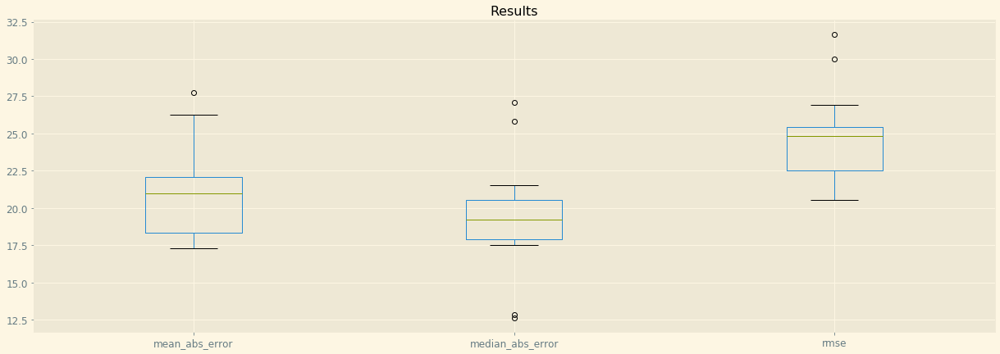

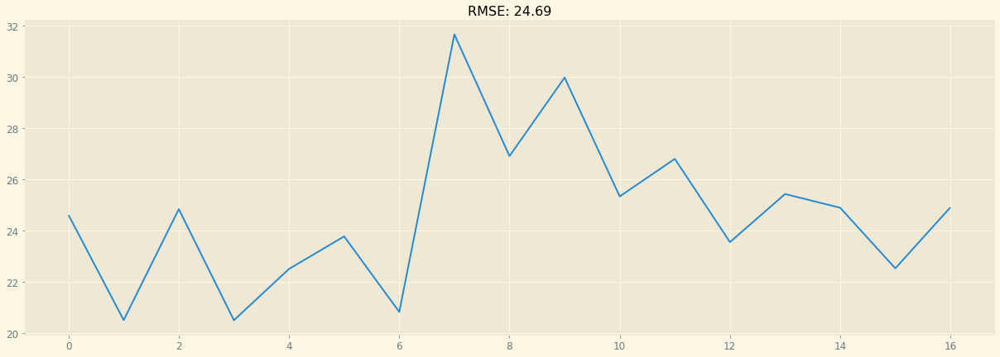

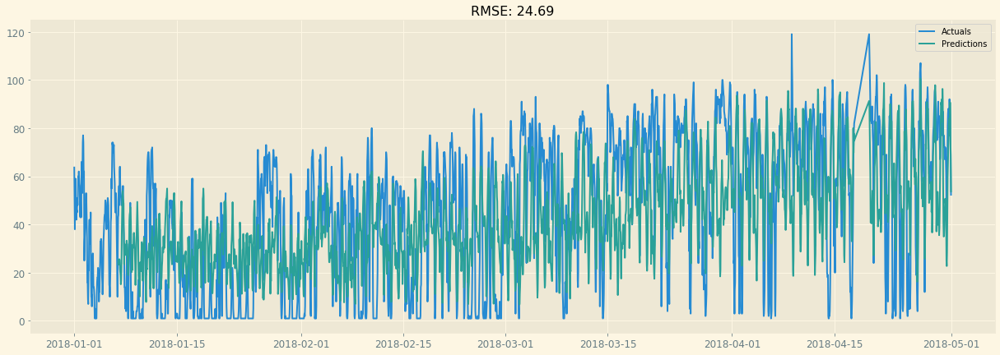

In [5]:
# Generate rolling predictions and results for particle of interest

data = oneparticle_onestation.sort_index().copy()
target = particle_of_interest

fit_func = fit_autoARIMA
predict_func = predict_autoARIMA

min_train_date = '2018-01-01'

week_starts = pd.date_range(min_train_date, data.index.max(), freq='W')

predictions_over_time, results_over_time = [], []

for i, week_start in enumerate(week_starts):
    if i % 10 == 0:
        print(week_start)

    train_set = data.loc[:(week_start - timedelta(hours=1))]
    test_set = data.loc[week_start:(week_start + timedelta(weeks=1, hours=-1))]
    models = train_set.groupby(['weekday', 'hour'])[target].apply(fit_func)
    predictions = test_set.apply(lambda x: predict_func(models.loc[tuple(x[['weekday', 'hour']])], x), axis=1)
    predictions_over_time.append(predictions)    
    results = evaluate_forecast(test_set[target], predictions, 'none')
    results['date'] = week_start
    results_over_time.append(results)  

results_over_time_18 = pd.DataFrame(results_over_time)
predictions_over_time_18 = pd.concat(predictions_over_time)

# Plot results statistics

results_over_time = results_over_time_18

fig, ax = plt.subplots(figsize=(21,7))
results_over_time.drop(['r2_score', 'mse'], axis=1).boxplot()
plt.title('Results')
plt.show()

# Plot RMSE overtime

fig, ax = plt.subplots(figsize=(21,7))
rmse_over_time = plt.plot(results_over_time['rmse'])
error = results_over_time['rmse'].mean()
plt.title('RMSE: %.2f'% error)
plt.show()

# Plot actuals and predictions overtime

plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_18, results_over_time_18)

### Station nr 28079024 - Casa de Campo

In [6]:
# Generate dataframe for one particle and one station of interest

station_of_interest = 28079024

print(f'The station of interest is: {station_of_interest}')
print('')

oneparticle_onestation = df_temp.loc[df_temp['station'] == station_of_interest]
oneparticle_onestation = oneparticle_onestation.drop(columns = [x for x in particles_of_interest if x is not particle_of_interest], axis=1)
oneparticle_onestation.drop('station', axis=1, inplace=True)

print(f'Missing values for particle and station of interest: {round(oneparticle_onestation[particle_of_interest].isnull().mean()*100, 2)}%')
print('')
oneparticle_onestation.dropna(inplace=True)

oneparticle_onestation['quarter'] = oneparticle_onestation.index.quarter
oneparticle_onestation['dayofyear'] = oneparticle_onestation.index.dayofyear
oneparticle_onestation['dayofmonth'] = oneparticle_onestation.index.day
oneparticle_onestation['weekyear'] = oneparticle_onestation.index.weekofyear
oneparticle_onestation['weekday'] = oneparticle_onestation.index.weekday
oneparticle_onestation['hour'] = oneparticle_onestation.index.hour
oneparticle_onestation['year'] = oneparticle_onestation.index.year
oneparticle_onestation['month'] = oneparticle_onestation.index.month
oneparticle_onestation.fillna(0, inplace=True)

print(f'One particle, one station DF shape: {oneparticle_onestation.shape}')
oneparticle_onestation.head()

The station of interest is: 28079024

Missing values for particle and station of interest: 1.38%

One particle, one station DF shape: (54720, 9)


,O_3,quarter,dayofyear,dayofmonth,weekyear,weekday,hour,year,month
date,,,,,,,,,
2012-01-01 00:00:00,2.0,1,1,1,52,6,0,2012,1
2012-01-01 01:00:00,2.0,1,1,1,52,6,1,2012,1
2012-01-01 02:00:00,2.0,1,1,1,52,6,2,2012,1
2012-01-01 03:00:00,2.0,1,1,1,52,6,3,2012,1
2012-01-01 04:00:00,2.0,1,1,1,52,6,4,2012,1


2018-01-07 00:00:00
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2889.073, BIC=2911.492, Time=0.354 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.248, BIC=2973.721, Time=0.008 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2918.624, BIC=2929.834, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.577, BIC=2946.787, Time=0.045 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3384.870, BIC=3388.607, Time=0.005 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.129, BIC=2906.811, Time=0.183 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.652, BIC=2935.598, Time=0.069 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.736, BIC=2901.683, Time=0.140 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.213, BIC=2906.896, Time=0.220 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2835.896, BIC=2854.579, Time=0.246 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.800, BIC=2865.746, Time=0.083 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.291, BIC=2852.237, Time=0.147 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2837.734, BIC=2860.154, Time=0.262 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2849.565, BIC=2868.248, Time=0.101 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.678, BIC=2854.361, Time=0.196 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2842.267, BIC=2857.213, Time=0.062 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.580, BIC=2859.999, Time=0.344 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.135, BIC=2858.818, Time=0.116 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.103, BIC=2864.259, Time=0.349 seconds
Near non-invertible 

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.147, BIC=2802.528, Time=0.436 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2956.824, BIC=2964.285, Time=0.008 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.535, BIC=2839.725, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.340, BIC=2897.530, Time=0.048 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3554.706, BIC=3558.436, Time=0.005 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.715, BIC=2797.366, Time=0.152 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.038, BIC=2863.958, Time=0.091 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.612, BIC=2794.532, Time=0.235 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2779.717, BIC=2802.097, Time=0.216 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2832.698, BIC=2851.349, Time=0.092 seconds
Fit ARIMA: (2, 0, 1

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.604, BIC=2871.760, Time=0.464 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2902.017, BIC=2924.437, Time=0.353 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.435, BIC=2935.327, Time=0.374 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2846.205, BIC=2876.098, Time=0.647 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2835.941, BIC=2862.097, Time=0.465 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2899.909, BIC=2922.329, Time=0.159 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2903.275, BIC=2933.167, Time=0.398 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2901.753, BIC=2927.909, Time=0.202 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=284

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2900.639, BIC=2923.059, Time=0.218 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.658, BIC=2923.077, Time=0.219 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=nan, BIC=nan, Time=nan seconds
Total fit time: 2.783 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.065, BIC=2922.484, Time=0.375 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.587, BIC=2983.060, Time=0.011 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2931.675, BIC=2942.884, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2947.605, BIC=2958.814, Time=0.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3365.921, BIC=3369.657, Time=0.005 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2901.974, BIC=2920.657, Time=0.167 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.955, BIC=2753.297, Time=0.247 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2802.513, BIC=2809.960, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.241, BIC=2765.411, Time=0.103 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.249, BIC=2781.420, Time=0.072 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3116.686, BIC=3120.410, Time=0.006 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.133, BIC=2748.751, Time=0.162 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2759.783, BIC=2774.677, Time=0.069 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2728.296, BIC=2743.190, Time=0.158 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2730.166, BIC=2748.784, Time=0.301 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.837, BIC=2756.731, Time=0.090 seconds
Total fit time: 1.2

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2747.974, BIC=2762.803, Time=0.082 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2725.561, BIC=2747.804, Time=0.172 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2727.572, BIC=2753.522, Time=0.155 seconds
Total fit time: 2.461 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.992, BIC=2880.373, Time=0.322 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.561, BIC=3070.021, Time=0.011 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2899.023, BIC=2910.213, Time=0.028 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2962.271, BIC=2973.461, Time=0.061 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3648.441, BIC=3652.172, Time=0.006 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.593, BIC=2877.244, Time=0.147 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.614, BIC=3029.795, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3521.534, BIC=3525.261, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.311, BIC=2872.945, Time=0.185 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2855.876, BIC=2874.510, Time=0.243 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.411, BIC=2878.499, Time=0.479 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2851.104, BIC=2877.192, Time=0.460 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.025, BIC=2870.932, Time=0.150 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2849.165, BIC=2871.526, Time=0.257 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.726, BIC=2874.087, Time=0.279 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2795.371, BIC=2825.186, Time=0.940 seconds
Total fit time: 3.8

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2912.211, BIC=2942.129, Time=0.667 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 3.673 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.348, BIC=2936.768, Time=0.405 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2984.261, BIC=2991.734, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.195, BIC=2952.404, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.322, BIC=2964.531, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3347.295, BIC=3351.031, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.132, BIC=2930.815, Time=0.268 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.507, BIC=2963.454, Tim

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.975, BIC=2722.804, Time=0.122 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2696.739, BIC=2711.567, Time=0.112 seconds
Total fit time: 2.960 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2771.774, BIC=2794.077, Time=0.524 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.265, BIC=2847.699, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2795.905, BIC=2807.056, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.237, BIC=2820.388, Time=0.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3217.778, BIC=3221.495, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.839, BIC=2789.424, Time=0.235 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.614, BIC=2816.482, Time=0.141 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2909.706, BIC=2939.624, Time=0.759 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2905.739, BIC=2931.918, Time=0.509 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2864.402, BIC=2890.581, Time=0.771 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.516, BIC=2934.955, Time=0.394 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.253, BIC=2906.171, Time=0.816 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.432, BIC=2932.131, Time=0.281 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.362, BIC=2938.540, Time=0.616 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2888.724, BIC=2922.382, Time=0.996 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 8.530 seconds
Performing stepwise search t

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.800, BIC=2937.499, Time=0.224 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.610, BIC=2940.309, Time=0.350 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.389, BIC=2943.568, Time=0.599 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2861.675, BIC=2887.854, Time=0.712 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2926.424, BIC=2941.383, Time=0.182 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2915.540, BIC=2937.978, Time=0.365 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.093, BIC=2944.531, Time=0.509 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2864.263, BIC=2894.182, Time=0.884 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.429 seconds
Performing stepwise search t

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2930.708, BIC=2953.166, Time=0.404 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2953.326, BIC=2972.041, Time=0.178 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.234, BIC=2947.949, Time=0.381 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2932.751, BIC=2958.952, Time=1.288 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 4.272 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.601, BIC=2935.059, Time=0.671 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2995.016, BIC=3002.502, Time=0.011 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.517, BIC=2956.746, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.277, BIC=2976.506, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2719.678, BIC=2742.117, Time=0.370 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2790.097, BIC=2797.576, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2760.979, BIC=2772.198, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.008, BIC=2784.228, Time=0.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3085.961, BIC=3089.701, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.009, BIC=2736.708, Time=0.308 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2745.699, BIC=2760.659, Time=0.118 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2722.439, BIC=2737.399, Time=0.218 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2719.423, BIC=2741.862, Time=0.337 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2732.459, BIC=2751.

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.241, BIC=2934.699, Time=0.540 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3110.826, BIC=3118.312, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.228, BIC=2972.457, Time=0.127 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3025.566, BIC=3036.795, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3660.369, BIC=3664.112, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2908.664, BIC=2927.379, Time=0.242 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.099, BIC=3010.071, Time=0.144 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.276, BIC=2923.248, Time=0.231 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.151, BIC=2927.867, Time=0.315 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2928.086, BIC=2943.058, Time=0.129 seconds
Total fit time: 1.8

Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2902.596, BIC=2932.540, Time=0.800 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2956.978, BIC=2983.179, Time=0.310 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2905.252, BIC=2938.939, Time=1.141 seconds
Total fit time: 6.638 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2901.068, BIC=2923.507, Time=1.459 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3183.894, BIC=3191.374, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.376, BIC=2957.596, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3059.762, BIC=3070.981, Time=0.154 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3561.969, BIC=3565.709, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.392, BIC=2917.091, Time=0.265 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.183, BIC=2948.898, Time=0.288 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2956.984, BIC=2971.956, Time=0.156 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.949, BIC=2944.921, Time=0.220 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.241, BIC=2948.956, Time=0.317 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.567, BIC=2953.539, Time=0.144 seconds
Total fit time: 1.754 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.080, BIC=2943.538, Time=0.581 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.337, BIC=2987.823, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2950.276, BIC=2961.505, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.635, BIC=2972.864, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.062, BIC=2934.271, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3417.562, BIC=3421.299, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.123, BIC=2852.806, Time=0.330 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.036, BIC=2898.982, Time=0.112 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.829, BIC=2848.775, Time=0.205 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.968, BIC=2852.651, Time=0.283 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.413, BIC=2856.359, Time=0.149 seconds
Total fit time: 1.638 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2772.058, BIC=2794.419, Time=0.352 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.782, BIC=2969.236, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2876.465, BIC=2910.094, Time=0.991 seconds
Total fit time: 7.229 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.880, BIC=2919.338, Time=0.409 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3146.470, BIC=3153.956, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.253, BIC=2943.482, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3025.504, BIC=3036.733, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3685.383, BIC=3689.126, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.368, BIC=2917.083, Time=0.304 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2898.372, BIC=2917.087, Time=0.399 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.678, BIC=2923.879, Time=0.711 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.506, BIC=2984.735, Time=0.178 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3386.433, BIC=3390.176, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.266, BIC=2941.981, Time=0.273 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.090, BIC=2973.062, Time=0.271 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.266, BIC=2936.238, Time=0.245 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.266, BIC=2941.981, Time=0.535 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.003, BIC=2953.975, Time=0.221 seconds
Total fit time: 2.563 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.163, BIC=2946.621, Time=0.532 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3008.628, BIC=3016.114, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.584, BIC=2928.785, Time=0.636 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2902.564, BIC=2928.765, Time=0.700 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.396, BIC=2914.368, Time=0.217 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.444, BIC=2934.416, Time=0.128 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2912.642, BIC=2927.614, Time=0.165 seconds
Total fit time: 3.328 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2875.705, BIC=2898.163, Time=0.550 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.196, BIC=2847.927, Time=0.297 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.088, BIC=2895.073, Time=0.126 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.721, BIC=2842.706, Time=0.326 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.154, BIC=2847.885, Time=0.330 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2836.739, BIC=2851.724, Time=0.181 seconds
Total fit time: 1.848 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.329, BIC=2891.787, Time=0.574 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3032.704, BIC=3040.190, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.787, BIC=2919.016, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.287, BIC=2970.516, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.859, BIC=3025.059, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3577.662, BIC=3581.395, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.972, BIC=2907.639, Time=0.277 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.136, BIC=2907.803, Time=0.373 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.734, BIC=2860.867, Time=0.752 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.006, BIC=2909.406, Time=0.446 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.908, BIC=2862.775, Time=0.869 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.637, BIC=2914.771, Time=0.444 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.659, BIC=2919.259, Time=1.075 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2861.880, BIC=2895.480, Time=0.908 seconds
Near non-invertible

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.383, BIC=2899.050, Time=0.796 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.585, BIC=2922.519, Time=0.196 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.487, BIC=2893.421, Time=0.524 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.408, BIC=2899.075, Time=0.503 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2896.788, BIC=2911.721, Time=0.178 seconds
Total fit time: 3.669 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.056, BIC=2888.378, Time=0.750 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2916.990, BIC=2924.430, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2886.368, BIC=2897.529, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.792, BIC=2905.952, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.576, BIC=2868.522, Time=0.247 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.444, BIC=2840.390, Time=0.324 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2826.507, BIC=2845.190, Time=0.537 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.784, BIC=2862.730, Time=0.205 seconds
Total fit time: 3.122 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.168, BIC=2836.588, Time=0.634 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2894.076, BIC=2901.549, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.643, BIC=2860.853, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.171, BIC=2875.381, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3330.752, BIC=3334.489, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2828.407, BIC=2847.090, Time=0.255 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.500, BIC=2848.183, Time=0.398 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.568, BIC=2858.724, Time=0.767 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2831.142, BIC=2857.298, Time=0.672 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.448, BIC=2845.394, Time=0.220 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2826.120, BIC=2848.539, Time=0.349 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.760, BIC=2852.180, Time=0.473 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2799.292, BIC=2829.185, Time=1.379 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.453 seconds
Performing stepwise search t

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.822, BIC=2893.769, Time=0.201 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.822, BIC=2899.505, Time=0.279 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.616, BIC=2908.562, Time=0.148 seconds
Total fit time: 1.674 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.003, BIC=2920.442, Time=0.561 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.876, BIC=2983.356, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2929.622, BIC=2940.842, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2946.323, BIC=2957.543, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3394.894, BIC=3398.634, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.997, BIC=2915.696, Time=0.278 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.623, BIC=2868.062, Time=0.414 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.102, BIC=2888.582, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2869.535, BIC=2880.754, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2874.100, BIC=2885.319, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3304.903, BIC=3308.643, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.014, BIC=2862.713, Time=0.397 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.000, BIC=2873.959, Time=0.174 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.457, BIC=2860.416, Time=0.262 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2845.848, BIC=2868.287, Time=0.475 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2857.729, BIC=2876.428, Time=0.181 seconds
Fit ARIMA: (2, 0, 1

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2742.721, BIC=2757.576, Time=0.188 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2744.407, BIC=2762.976, Time=0.329 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.133, BIC=2768.988, Time=0.121 seconds
Total fit time: 1.788 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.995, BIC=2809.395, Time=0.710 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.369, BIC=2973.836, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2838.182, BIC=2849.382, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.442, BIC=2907.642, Time=0.090 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3565.549, BIC=3569.282, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.732, BIC=2805.398, Time=0.274 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3074.489, BIC=3085.708, Time=0.229 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3592.491, BIC=3596.231, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.116, BIC=2933.815, Time=0.245 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.359, BIC=3050.318, Time=0.143 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.576, BIC=2928.535, Time=0.138 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.307, BIC=2934.006, Time=0.314 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.648, BIC=2942.607, Time=0.171 seconds
Total fit time: 1.890 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.361, BIC=2871.800, Time=0.795 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3159.918, BIC=3167.398, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.328, BIC=2933.767, Time=0.675 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.599, BIC=2994.079, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.583, BIC=2955.803, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.203, BIC=2971.423, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3375.771, BIC=3379.511, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.699, BIC=2931.398, Time=0.326 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.744, BIC=2931.443, Time=0.286 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.089, BIC=2939.267, Time=0.599 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (2,

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2740.386, BIC=2759.021, Time=0.298 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2771.576, BIC=2786.483, Time=0.159 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.721, BIC=2753.629, Time=0.225 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2740.453, BIC=2759.087, Time=0.342 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2753.278, BIC=2768.185, Time=0.115 seconds
Total fit time: 1.731 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2651.480, BIC=2673.582, Time=0.659 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2758.111, BIC=2765.478, Time=0.011 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2681.631, BIC=2692.682, Time=0.112 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2707.341, BIC=2718.392, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.765, BIC=2891.431, Time=0.244 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.774, BIC=2891.441, Time=0.286 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2846.975, BIC=2873.109, Time=0.743 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2868.891, BIC=2891.291, Time=0.394 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.490, BIC=2902.357, Time=0.656 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2842.144, BIC=2872.011, Time=0.813 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2838.313, BIC=2864.446, Time=0.692 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2865.843, BIC=2888.244, Time=0.354 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2869.707, BIC=2899.574, Time=0.476 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2866.778, BIC=2892.912, Time=0.480 seconds
Fit ARIMA: (3, 0, 4)

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.492, BIC=2882.142, Time=0.264 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2865.002, BIC=2883.653, Time=0.284 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.411, BIC=2887.522, Time=0.646 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2859.970, BIC=2886.081, Time=0.442 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2865.034, BIC=2879.955, Time=0.136 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2858.065, BIC=2880.446, Time=0.275 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.563, BIC=2882.943, Time=0.334 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2803.108, BIC=2832.949, Time=0.890 seconds
Total fit time: 4.249 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2819.344, BIC=2841.763, Time=0.659 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2920.825, BIC=2947.026, Time=0.463 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2948.390, BIC=2970.848, Time=0.234 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2920.989, BIC=2950.933, Time=0.861 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.176 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.413, BIC=2945.852, Time=0.633 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.915, BIC=3002.394, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.762, BIC=2962.981, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.674, BIC=2974.894, Time=0.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3357.086, BIC=3360.826, Tim

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.229, BIC=2731.070, Time=0.106 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2705.071, BIC=2719.913, Time=0.116 seconds
Total fit time: 3.019 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.979, BIC=2802.301, Time=0.579 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2848.829, BIC=2856.270, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2804.218, BIC=2815.379, Time=0.134 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.525, BIC=2828.686, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3227.696, BIC=3231.417, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.990, BIC=2797.591, Time=0.320 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.145, BIC=2825.026, Time=0.155 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2873.911, BIC=2900.112, Time=0.769 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2866.976, BIC=2896.920, Time=0.848 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2918.060, BIC=2948.004, Time=0.829 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2914.130, BIC=2940.331, Time=0.471 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2875.097, BIC=2901.298, Time=0.766 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2882.961, BIC=2916.648, Time=1.202 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 7.457 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3108.215, BIC=3119.444, Time=0.142 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3584.608, BIC=3588.351, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.148, BIC=2945.863, Time=0.237 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.968, BIC=2948.683, Time=0.280 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.830, BIC=2958.031, Time=0.716 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2870.613, BIC=2896.814, Time=0.769 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.824, BIC=2949.796, Time=0.167 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2923.912, BIC=2946.370, Time=0.346 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.449, BIC=2952.907, Time=0.379 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2872.903, BIC=2902.847, Time=0.948 seconds
Near non-invertible

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2998.895, BIC=3010.133, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3381.710, BIC=3385.456, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2938.843, BIC=2957.574, Time=0.296 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.987, BIC=2992.972, Time=0.165 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2941.771, BIC=2956.756, Time=0.210 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2940.796, BIC=2963.274, Time=0.469 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2963.256, BIC=2981.987, Time=0.167 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2939.254, BIC=2957.985, Time=0.401 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2942.671, BIC=2968.895, Time=0.812 seconds
Total fit time: 3.521 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.879, BIC=2804.356, Time=0.164 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2779.881, BIC=2798.612, Time=0.270 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2781.880, BIC=2804.357, Time=0.211 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.871, BIC=2810.095, Time=0.286 seconds
Total fit time: 3.625 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2727.426, BIC=2749.884, Time=0.463 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2798.090, BIC=2805.576, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2768.880, BIC=2780.109, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2780.972, BIC=2792.201, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3095.323, BIC=3099.066, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2905.003, BIC=2923.670, Time=0.352 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.095, BIC=2874.762, Time=0.309 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2857.278, BIC=2883.411, Time=0.448 seconds
Total fit time: 3.248 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.570, BIC=2944.047, Time=0.446 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3119.783, BIC=3127.275, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2970.113, BIC=2981.352, Time=0.128 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3034.470, BIC=3045.708, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3671.934, BIC=3675.681, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.980, BIC=2936.711, Time=0.254 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.507, BIC=2929.984, Time=0.309 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3155.856, BIC=3163.348, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.270, BIC=2958.509, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.377, BIC=3055.615, Time=0.084 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3510.708, BIC=3514.454, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.248, BIC=2923.979, Time=0.254 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.028, BIC=3013.012, Time=0.177 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2903.708, BIC=2918.692, Time=0.157 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2905.328, BIC=2924.059, Time=0.267 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.799, BIC=2929.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.262, BIC=2981.500, Time=0.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3358.009, BIC=3361.756, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.421, BIC=2946.152, Time=0.312 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.401, BIC=2968.386, Time=0.112 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.129, BIC=2943.113, Time=0.293 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2929.404, BIC=2951.881, Time=0.437 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2943.129, BIC=2961.860, Time=0.249 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2927.437, BIC=2946.168, Time=0.358 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2931.299, BIC=2957.522, Time=0.854 seconds
Total fit time: 3.526 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2783.678, BIC=2806.059, Time=0.408 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2973.224, BIC=2980.685, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.594, BIC=2852.784, Time=0.130 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.833, BIC=2919.023, Time=0.160 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3483.883, BIC=3487.613, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.014, BIC=2805.664, Time=0.403 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2786.309, BIC=2804.959, Time=0.310 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.485, BIC=2811.596, Time=0.545 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2785.359, BIC=2811.470, Time=0.411 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.791, BIC=2802.

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.535, BIC=2932.758, Time=0.608 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2906.630, BIC=2932.853, Time=0.718 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.765, BIC=2919.749, Time=0.251 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2997.549, BIC=3012.534, Time=0.151 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.548, BIC=2929.533, Time=0.215 seconds
Total fit time: 3.047 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.229, BIC=2935.706, Time=0.390 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3194.629, BIC=3202.122, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.663, BIC=2949.902, Time=0.126 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.818, BIC=3061.056, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.316, BIC=2987.554, Time=0.166 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3390.006, BIC=3393.752, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.507, BIC=2951.238, Time=0.286 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.155, BIC=2978.140, Time=0.273 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.781, BIC=2945.765, Time=0.238 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.558, BIC=2951.289, Time=0.358 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.783, BIC=2960.768, Time=0.164 seconds
Total fit time: 2.285 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2940.891, BIC=2963.368, Time=0.632 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3015.070, BIC=3022.562, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.197, BIC=2905.928, Time=0.389 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.226, BIC=2905.957, Time=0.430 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.152, BIC=2913.375, Time=0.674 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2884.578, BIC=2910.801, Time=0.915 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2885.186, BIC=2907.663, Time=0.470 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2890.112, BIC=2920.082, Time=0.849 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2888.235, BIC=2918.204, Time=0.798 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2886.857, BIC=2913.081, Time=1.613 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2889.962, BIC=2923.678, Time=1.832 seconds
Total fit time: 8.659 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.608, BIC=2890.066, Time=0.500 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3052.270, BIC=3059.756, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2912.165, BIC=2923.394, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.484, BIC=2982.713, Time=0.136 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3678.478, BIC=3682.221, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2864.951, BIC=2883.666, Time=0.305 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.916, BIC=2958.888, Time=0.199 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2863.742, BIC=2878.714, Time=0.263 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2865.113, BIC=2883.828, Time=0.423 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.078, BIC=2896.

Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2898.202, BIC=2928.095, Time=0.255 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2883.041, BIC=2920.407, Time=1.297 seconds
Near non-invertible roots for order (5, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 8.716 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.061, BIC=2918.499, Time=0.452 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3112.122, BIC=3119.602, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2937.491, BIC=2948.711, Time=0.391 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3005.018, BIC=3016.237, Time=0.090 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3526.336, BIC=3530.076, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.841, BIC=2919.540, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.897, BIC=2892.515, Time=0.353 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.803, BIC=2913.697, Time=0.192 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.928, BIC=2886.823, Time=0.314 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.904, BIC=2892.522, Time=0.396 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2888.773, BIC=2903.668, Time=0.192 seconds
Total fit time: 2.328 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.640, BIC=2930.059, Time=0.770 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2953.922, BIC=2961.395, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2921.488, BIC=2932.698, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.487, BIC=2939.697, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.347, BIC=2832.766, Time=0.488 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2918.118, BIC=2925.591, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2846.672, BIC=2857.882, Time=0.151 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.495, BIC=2883.705, Time=0.136 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3422.895, BIC=3426.631, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.059, BIC=2827.742, Time=0.327 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.406, BIC=2870.352, Time=0.191 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2807.214, BIC=2822.160, Time=0.266 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.098, BIC=2827.781, Time=0.478 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2830.240, BIC=2845.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.836, BIC=2864.519, Time=0.345 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2846.059, BIC=2864.742, Time=0.339 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.728, BIC=2875.884, Time=0.465 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2849.605, BIC=2875.761, Time=0.780 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.436, BIC=2862.382, Time=0.356 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2847.453, BIC=2869.872, Time=0.459 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2848.031, BIC=2870.451, Time=0.501 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2850.634, BIC=2880.527, Time=1.051 seconds
Total fit time: 5.451 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.881, BIC=2902.320, Time=0.575 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.753, BIC=2949.211, Time=0.764 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.411, BIC=2987.897, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.368, BIC=2965.597, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.546, BIC=2974.775, Time=0.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3386.538, BIC=3390.281, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.880, BIC=2942.595, Time=0.403 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.941, BIC=2965.913, Time=0.201 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.477, BIC=2938.449, Time=0.304 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.042, BIC=2942.757, Time=0.424 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.072, BIC=2953.044, Time=0.338 seconds
Total fit time: 2.6

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2797.424, BIC=2819.863, Time=0.719 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2816.653, BIC=2824.133, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.707, BIC=2819.927, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2811.125, BIC=2822.344, Time=0.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3200.953, BIC=3204.693, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.233, BIC=2812.932, Time=0.572 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.862, BIC=2821.821, Time=0.301 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.731, BIC=2808.690, Time=0.333 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.424, BIC=2813.122, Time=0.490 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2802.112, BIC=2817.072, Time=0.121 seconds
Total fit time: 2.7

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2828.525, BIC=2850.983, Time=0.427 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.715, BIC=3029.201, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.938, BIC=2887.167, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2939.573, BIC=2950.802, Time=0.158 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3657.123, BIC=3660.866, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.616, BIC=2844.331, Time=0.286 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.855, BIC=2922.827, Time=0.193 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.307, BIC=2840.279, Time=0.241 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2826.155, BIC=2844.870, Time=0.338 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2843.791, BIC=2858.

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2918.329, BIC=2944.530, Time=0.616 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2917.366, BIC=2932.338, Time=0.170 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2916.899, BIC=2939.357, Time=0.318 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.320, BIC=2938.778, Time=0.385 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2919.957, BIC=2949.901, Time=0.816 seconds
Total fit time: 4.493 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.046, BIC=2942.504, Time=0.654 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3085.058, BIC=3092.544, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2968.354, BIC=2979.583, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3017.588, BIC=3028.817, Time=0.150 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.360, BIC=2929.818, Time=0.604 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.524, BIC=2985.010, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2937.502, BIC=2948.731, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.500, BIC=2962.729, Time=0.148 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3367.428, BIC=3371.171, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.891, BIC=2928.606, Time=0.289 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.918, BIC=2928.633, Time=0.431 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.355, BIC=2935.556, Time=0.713 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2,

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2662.462, BIC=2688.271, Time=0.689 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.787, BIC=2685.596, Time=0.491 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2653.625, BIC=2686.808, Time=0.917 seconds
Total fit time: 6.393 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.850, BIC=2745.053, Time=0.596 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.302, BIC=2854.703, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.595, BIC=2762.697, Time=0.152 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.752, BIC=2798.854, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3279.969, BIC=3283.670, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.622, BIC=2946.353, Time=0.271 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2927.837, BIC=2946.568, Time=0.323 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.819, BIC=2948.042, Time=0.499 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.173, BIC=2944.650, Time=0.423 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.406, BIC=2952.376, Time=0.725 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2899.453, BIC=2929.423, Time=1.234 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2919.817, BIC=2946.040, Time=0.516 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2912.851, BIC=2946.567, Time=0.921 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2905.548, BIC=2939.264, Time=1.255 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.664, BIC=2904.363, Time=0.237 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.941, BIC=2905.640, Time=0.268 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.958, BIC=2901.137, Time=0.450 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2876.906, BIC=2903.085, Time=0.524 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.186, BIC=2901.145, Time=0.181 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2874.908, BIC=2897.346, Time=0.319 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.988, BIC=2901.427, Time=0.499 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2867.374, BIC=2897.293, Time=0.849 seconds
Total fit time: 4.630 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.270, BIC=2937.747, Time=0.619 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.364, BIC=2951.079, Time=0.565 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.774, BIC=2966.746, Time=0.184 seconds
Total fit time: 2.613 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.578, BIC=2960.036, Time=0.425 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2998.944, BIC=3006.430, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.448, BIC=2973.677, Time=0.145 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.074, BIC=2984.303, Time=0.133 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3353.782, BIC=3357.525, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.481, BIC=2953.196, Time=0.356 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.487, BIC=2982.459, Time=0.176 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2777.079, BIC=2791.960, Time=0.215 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.014, BIC=2797.615, Time=0.380 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2794.282, BIC=2809.163, Time=0.144 seconds
Total fit time: 2.192 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.171, BIC=2832.532, Time=0.727 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2909.725, BIC=2917.178, Time=0.254 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.649, BIC=2856.829, Time=0.143 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.368, BIC=2878.548, Time=0.157 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3359.194, BIC=3362.921, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2807.997, BIC=2826.631, Time=0.314 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2940.121, BIC=2962.579, Time=0.469 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3151.250, BIC=3158.736, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2997.991, BIC=3009.220, Time=0.123 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3068.834, BIC=3080.063, Time=0.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3699.966, BIC=3703.709, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.309, BIC=2954.024, Time=0.387 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3029.324, BIC=3044.296, Time=0.273 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2937.336, BIC=2952.308, Time=0.274 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2931.993, BIC=2954.451, Time=0.462 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3011.352, BIC=3030.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3086.493, BIC=3097.732, Time=0.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3524.156, BIC=3527.902, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.276, BIC=2948.007, Time=0.278 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.895, BIC=2950.626, Time=0.277 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.014, BIC=2912.238, Time=1.162 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2930.142, BIC=2956.365, Time=0.835 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2940.472, BIC=2955.457, Time=0.196 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2929.257, BIC=2951.734, Time=0.317 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=29

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.857, BIC=2948.604, Time=0.322 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.180, BIC=2978.177, Time=0.223 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.733, BIC=2945.731, Time=0.377 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2931.807, BIC=2954.303, Time=0.582 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2953.085, BIC=2971.832, Time=0.278 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.792, BIC=2948.539, Time=0.449 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.145, BIC=2953.143, Time=0.293 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.792, BIC=2954.289, Time=0.577 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.686, BIC=2951.433, Time=0.288 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.516, BIC=2959.762, Time=0.714 seconds
Total fit time: 5.31

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2734.465, BIC=2753.196, Time=0.390 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2745.275, BIC=2760.260, Time=0.245 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.238, BIC=2758.715, Time=0.340 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2734.265, BIC=2752.996, Time=0.313 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2736.255, BIC=2758.732, Time=0.411 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.230, BIC=2764.454, Time=0.299 seconds
Total fit time: 4.601 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2734.976, BIC=2757.376, Time=0.562 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2824.288, BIC=2831.755, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2776.188, BIC=2787.388, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.517, BIC=2929.975, Time=0.676 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3111.157, BIC=3118.643, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2955.528, BIC=2966.757, Time=0.135 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3023.237, BIC=3034.466, Time=0.153 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3683.781, BIC=3687.524, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.078, BIC=2923.793, Time=0.329 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2991.202, BIC=3006.174, Time=0.240 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.258, BIC=2919.230, Time=0.278 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2905.340, BIC=2924.055, Time=0.403 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2921.349, BIC=2936.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3057.757, BIC=3069.005, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3520.917, BIC=3524.666, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.035, BIC=2935.782, Time=0.351 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3009.693, BIC=3024.691, Time=0.180 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.548, BIC=2930.546, Time=0.225 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2917.112, BIC=2935.859, Time=0.271 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2926.754, BIC=2941.752, Time=0.175 seconds
Total fit time: 1.953 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.407, BIC=2910.865, Time=0.996 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3088.046, BIC=3095.532, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2939.578, BIC=2954.576, Time=0.314 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2941.046, BIC=2963.542, Time=0.578 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2955.274, BIC=2974.021, Time=0.238 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2939.056, BIC=2957.803, Time=0.780 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.337, BIC=2962.335, Time=0.203 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2941.048, BIC=2963.544, Time=0.503 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.774, BIC=2960.521, Time=0.264 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.032, BIC=2969.278, Time=0.740 seconds
Total fit time: 5.067 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2903.614, BIC=2926.091, Time=0.627 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.225, BIC=2815.625, Time=0.512 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2984.979, BIC=2992.445, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2850.696, BIC=2861.896, Time=0.140 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.082, BIC=2929.282, Time=0.189 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3494.204, BIC=3497.937, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2796.921, BIC=2815.588, Time=0.415 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2796.336, BIC=2815.003, Time=0.400 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.974, BIC=2821.107, Time=0.767 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2794.813, BIC=2820.946, Time=0.526 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.306, BIC=2812.240, Time=0.277 seconds
Fit ARIMA: (1, 0, 3

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2925.230, BIC=2940.228, Time=0.194 seconds
Total fit time: 3.959 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.833, BIC=2945.329, Time=0.511 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3206.175, BIC=3213.674, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.211, BIC=2959.460, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3061.659, BIC=3072.907, Time=0.183 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3692.385, BIC=3696.134, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.296, BIC=2942.043, Time=0.311 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.424, BIC=2942.171, Time=0.283 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.801, BIC=2951.047, Time=3.132 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.877, BIC=2960.624, Time=0.371 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.889, BIC=2987.887, Time=0.199 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2940.287, BIC=2955.284, Time=0.378 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2941.957, BIC=2960.704, Time=0.377 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2955.700, BIC=2970.698, Time=0.188 seconds
Total fit time: 2.604 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.277, BIC=2972.773, Time=4.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3025.771, BIC=3033.270, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.315, BIC=2985.563, Time=0.137 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2991.721, BIC=3002.969, Time=0.924 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.266, BIC=2921.511, Time=0.845 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2894.596, BIC=2920.841, Time=0.865 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.517, BIC=2908.514, Time=0.324 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.249, BIC=2927.247, Time=0.182 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.496, BIC=2922.494, Time=0.230 seconds
Total fit time: 4.548 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.511, BIC=2903.007, Time=0.447 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2923.846, BIC=2931.345, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2897.817, BIC=2909.065, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2902.089, BIC=2913.337, Time=0.165 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.986, BIC=2907.733, Time=0.949 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2901.105, BIC=2916.103, Time=0.366 seconds
Total fit time: 2.976 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2875.770, BIC=2898.247, Time=1.353 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.412, BIC=3069.904, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2920.506, BIC=2931.745, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.165, BIC=2991.403, Time=0.217 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3689.512, BIC=3693.259, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.141, BIC=2891.872, Time=0.341 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.445, BIC=2967.430, Time=0.237 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2909.411, BIC=2939.329, Time=0.889 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.649, BIC=2936.568, Time=0.725 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2895.964, BIC=2933.362, Time=1.153 seconds
Near non-invertible roots for order (5, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 9.100 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.325, BIC=2927.783, Time=0.455 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3121.134, BIC=3128.620, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.146, BIC=2957.375, Time=0.310 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.676, BIC=3024.905, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3537.287, BIC=3541.030, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.789, BIC=2901.424, Time=0.348 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.353, BIC=2922.260, Time=0.187 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.802, BIC=2895.710, Time=0.286 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2882.792, BIC=2901.426, Time=0.414 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2897.515, BIC=2912.422, Time=0.186 seconds
Total fit time: 2.218 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.534, BIC=2938.973, Time=0.583 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.517, BIC=2969.997, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2930.014, BIC=2941.233, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.979, BIC=2948.198, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.172, BIC=2887.144, Time=0.232 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.978, BIC=2844.950, Time=0.275 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2831.461, BIC=2850.176, Time=0.424 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2854.651, BIC=2869.623, Time=0.148 seconds
Total fit time: 2.562 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2818.503, BIC=2840.942, Time=0.454 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2926.608, BIC=2934.088, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2854.922, BIC=2866.141, Time=0.127 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.936, BIC=2892.156, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3433.512, BIC=3437.252, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.986, BIC=2993.206, Time=0.150 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3696.726, BIC=3700.466, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.544, BIC=2873.243, Time=0.295 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.790, BIC=2873.488, Time=0.361 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.414, BIC=2884.593, Time=0.571 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2858.276, BIC=2884.454, Time=0.705 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.132, BIC=2871.091, Time=0.220 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2856.123, BIC=2878.561, Time=0.429 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.747, BIC=2879.186, Time=0.504 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2859.331, BIC=2889.249, Time=0.803 seconds
Total fit time: 4.8

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2936.520, BIC=2958.997, Time=0.566 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.523, BIC=2999.016, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.369, BIC=2975.607, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.083, BIC=2985.322, Time=0.130 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3396.384, BIC=3400.130, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.530, BIC=2952.261, Time=0.358 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.474, BIC=2975.459, Time=0.221 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2933.027, BIC=2948.012, Time=0.292 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2933.661, BIC=2952.392, Time=0.379 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.469, BIC=2962.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.803, BIC=2829.261, Time=0.657 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2827.011, BIC=2834.497, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2818.322, BIC=2829.551, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.934, BIC=2832.163, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3210.238, BIC=3213.981, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.747, BIC=2822.462, Time=0.421 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2816.500, BIC=2831.472, Time=0.259 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.071, BIC=2818.043, Time=0.364 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.908, BIC=2822.623, Time=0.550 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.627, BIC=2826.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.355, BIC=2861.832, Time=0.538 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3034.234, BIC=3041.727, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.452, BIC=2898.691, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.227, BIC=2963.466, Time=0.084 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3667.887, BIC=3671.633, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.572, BIC=2855.303, Time=0.250 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.069, BIC=2934.054, Time=0.192 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.179, BIC=2851.164, Time=0.251 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.072, BIC=2855.803, Time=0.294 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2854.991, BIC=2869.

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2927.713, BIC=2953.936, Time=0.565 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2926.727, BIC=2941.712, Time=0.154 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2926.398, BIC=2948.875, Time=0.295 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.994, BIC=2948.471, Time=0.355 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2929.786, BIC=2959.756, Time=0.301 seconds
Total fit time: 3.707 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.944, BIC=2952.422, Time=0.602 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3096.118, BIC=3103.610, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2978.549, BIC=2989.788, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3028.610, BIC=3039.849, Time=0.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.232, BIC=2939.709, Time=0.593 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2988.445, BIC=2995.937, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.635, BIC=2958.874, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2962.238, BIC=2973.476, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3377.213, BIC=3380.959, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.678, BIC=2938.409, Time=0.296 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.693, BIC=2938.424, Time=0.280 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.327, BIC=2945.551, Time=0.657 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (2,

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2668.963, BIC=2694.795, Time=0.545 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2662.728, BIC=2695.941, Time=0.800 seconds
Total fit time: 6.326 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2731.696, BIC=2753.919, Time=0.384 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.464, BIC=2865.872, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2760.692, BIC=2771.804, Time=0.121 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.196, BIC=2809.307, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3289.938, BIC=3293.642, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.816, BIC=2749.335, Time=0.300 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2777.612, BIC=2792.427, Time=0.193 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.811, BIC=2961.806, Time=0.826 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2909.206, BIC=2939.202, Time=0.937 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2929.315, BIC=2955.560, Time=0.506 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2917.850, BIC=2951.594, Time=0.981 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2894.602, BIC=2928.347, Time=1.238 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2929.345, BIC=2959.340, Time=0.811 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2888.462, BIC=2925.956, Time=1.109 seconds
Near non-invertible roots for order (4, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.101, BIC=3022.349, Time=0.133 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3451.844, BIC=3455.594, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.635, BIC=2940.382, Time=0.220 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2993.374, BIC=3008.372, Time=0.185 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.024, BIC=2936.021, Time=0.210 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.178, BIC=2940.925, Time=0.338 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.874, BIC=2961.872, Time=0.175 seconds
Total fit time: 1.889 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.371, BIC=2953.867, Time=0.384 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3056.548, BIC=3064.047, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.293, BIC=2915.992, Time=0.292 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.900, BIC=2938.859, Time=0.236 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.509, BIC=2910.468, Time=0.304 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.351, BIC=2916.050, Time=0.430 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2911.216, BIC=2926.175, Time=0.219 seconds
Total fit time: 2.130 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.033, BIC=2906.510, Time=0.961 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2936.326, BIC=2943.818, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2899.716, BIC=2910.954, Time=0.160 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2910.085, BIC=2921.323, Time=0.177 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2905.858, BIC=2917.058, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3470.433, BIC=3474.166, Time=0.164 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.302, BIC=2847.969, Time=0.291 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.521, BIC=2906.454, Time=0.234 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.963, BIC=2842.896, Time=0.328 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.542, BIC=2848.208, Time=0.365 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2851.689, BIC=2866.622, Time=0.243 seconds
Total fit time: 2.414 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.226, BIC=2871.665, Time=0.356 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3047.615, BIC=3055.094, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2945.597, BIC=2971.820, Time=0.475 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2919.936, BIC=2953.651, Time=1.191 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 9.620 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.640, BIC=2978.174, Time=0.911 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3232.521, BIC=3240.032, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3080.368, BIC=3091.635, Time=0.190 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3153.910, BIC=3165.177, Time=0.173 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3742.888, BIC=3746.644, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.253, BIC=3023.032, Tim

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.937, BIC=3059.186, Time=0.151 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3464.634, BIC=3468.383, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.669, BIC=2954.416, Time=0.238 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.881, BIC=3018.878, Time=0.138 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2939.299, BIC=2954.297, Time=0.663 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2937.502, BIC=2959.998, Time=1.301 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2991.453, BIC=3010.200, Time=0.218 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.955, BIC=2954.702, Time=0.296 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2938.452, BIC=2964.698, Time=0.563 seconds
Total fit time: 4.134 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.538, BIC=2950.301, Time=0.364 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.728, BIC=2973.739, Time=0.118 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.805, BIC=2947.815, Time=0.239 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2933.337, BIC=2955.853, Time=0.381 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2950.088, BIC=2968.851, Time=0.175 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.351, BIC=2950.114, Time=0.332 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.453, BIC=2953.464, Time=0.236 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2933.335, BIC=2955.850, Time=0.640 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2933.699, BIC=2952.462, Time=0.223 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.172, BIC=2961.440, Time=0.720 seconds
Total fit time: 4.31

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2740.294, BIC=2758.977, Time=0.306 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2736.760, BIC=2762.916, Time=0.544 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2732.760, BIC=2762.653, Time=0.752 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2736.227, BIC=2762.383, Time=0.581 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2745.278, BIC=2778.907, Time=0.861 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2733.576, BIC=2767.205, Time=0.998 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2738.462, BIC=2768.355, Time=0.624 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2738.224, BIC=2768.117, Time=0.663 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2733.803, BIC=2771.169, Time=1.125 seconds
Total fit time: 8.196 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2892.436, BIC=2911.183, Time=0.355 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2902.560, BIC=2917.557, Time=0.149 seconds
Total fit time: 1.989 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.663, BIC=2932.159, Time=0.397 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3158.208, BIC=3165.707, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.041, BIC=2973.290, Time=0.122 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3057.877, BIC=3069.125, Time=0.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3702.264, BIC=3706.014, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.855, BIC=2925.602, Time=0.299 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3001.104, BIC=3016.102, Time=0.171 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.103, BIC=2953.580, Time=0.426 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2934.986, BIC=2964.956, Time=0.798 seconds
Total fit time: 4.563 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.849, BIC=2973.364, Time=0.566 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3071.136, BIC=3078.641, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2988.747, BIC=3000.005, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3023.945, BIC=3035.203, Time=0.085 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3427.708, BIC=3431.461, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.608, BIC=2967.371, Time=0.312 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2993.276, BIC=3008.287, Time=0.190 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.780, BIC=2929.527, Time=0.304 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2936.019, BIC=2951.017, Time=0.184 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.224, BIC=2924.221, Time=0.248 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2910.842, BIC=2929.589, Time=0.351 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.775, BIC=2934.772, Time=0.172 seconds
Total fit time: 1.993 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.984, BIC=2910.499, Time=0.583 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2943.269, BIC=2950.774, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.195, BIC=2918.452, Time=0.126 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.351, BIC=2929.609, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2807.452, BIC=2826.135, Time=0.285 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.280, BIC=2832.437, Time=0.538 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2806.217, BIC=2832.373, Time=0.476 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2808.434, BIC=2823.380, Time=0.216 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2809.428, BIC=2831.847, Time=0.351 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2808.475, BIC=2830.895, Time=0.437 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2807.429, BIC=2837.322, Time=0.809 seconds
Total fit time: 4.020 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2833.319, BIC=2855.777, Time=0.652 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3056.361, BIC=3063.847, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2925.341, BIC=2947.856, Time=0.359 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3228.794, BIC=3236.299, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2950.226, BIC=2961.484, Time=0.109 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3078.775, BIC=3090.033, Time=0.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3670.835, BIC=3674.587, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.633, BIC=2942.396, Time=0.294 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.792, BIC=3042.803, Time=0.238 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.788, BIC=2936.798, Time=0.183 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.668, BIC=2942.431, Time=0.303 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2929.907, BIC=2944.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.225, BIC=2978.988, Time=0.361 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2973.434, BIC=2988.444, Time=0.177 seconds
Total fit time: 2.037 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.622, BIC=2976.138, Time=0.441 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3024.332, BIC=3031.837, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.035, BIC=2987.293, Time=0.132 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.559, BIC=3000.817, Time=0.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3387.917, BIC=3391.670, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.609, BIC=2972.372, Time=0.293 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.542, BIC=2997.552, Time=0.119 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.009, BIC=2912.772, Time=0.425 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.033, BIC=2917.301, Time=0.591 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.192, BIC=2911.707, Time=0.473 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.571, BIC=2911.334, Time=0.259 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.079, BIC=2917.347, Time=0.690 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.411, BIC=2923.422, Time=0.169 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2891.715, BIC=2914.230, Time=0.247 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.156, BIC=2923.176, Time=0.770 seconds
Total fit time: 4.783 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2860.789, BIC=2883.285, Time=0.429 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.698, BIC=2903.445, Time=0.291 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.933, BIC=2980.930, Time=0.162 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.907, BIC=2898.905, Time=0.194 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2884.974, BIC=2903.721, Time=0.335 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2901.122, BIC=2916.119, Time=0.136 seconds
Total fit time: 1.821 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.009, BIC=2921.505, Time=0.513 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3087.883, BIC=3095.382, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.580, BIC=2955.828, Time=0.127 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3001.246, BIC=3012.495, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2912.710, BIC=2938.934, Time=0.507 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2960.282, BIC=2982.759, Time=0.280 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2914.021, BIC=2943.991, Time=0.780 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2907.239, BIC=2937.209, Time=0.566 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2954.410, BIC=2980.634, Time=0.456 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2910.712, BIC=2944.428, Time=1.141 seconds
Total fit time: 9.070 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.751, BIC=2954.228, Time=0.346 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3063.392, BIC=3070.884, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.785, BIC=2976.024, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.416, BIC=2944.894, Time=0.791 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.184, BIC=2976.677, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.409, BIC=2952.647, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2947.688, BIC=2958.926, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3362.123, BIC=3365.869, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.422, BIC=2939.153, Time=0.591 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.605, BIC=2960.590, Time=0.244 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.422, BIC=2933.407, Time=0.434 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.422, BIC=2939.153, Time=0.514 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2937.961, BIC=2952.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2874.285, BIC=2885.524, Time=0.152 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3532.356, BIC=3536.102, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.305, BIC=2805.036, Time=0.319 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.775, BIC=2858.760, Time=0.186 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.307, BIC=2799.292, Time=0.281 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2786.306, BIC=2805.037, Time=0.366 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2802.246, BIC=2817.231, Time=0.177 seconds
Total fit time: 2.258 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.169, BIC=2792.607, Time=0.593 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.643, BIC=2960.123, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.703, BIC=2913.434, Time=0.351 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.413, BIC=2922.398, Time=0.176 seconds
Total fit time: 2.213 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.003, BIC=2937.480, Time=0.579 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3153.610, BIC=3161.102, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2959.211, BIC=2970.450, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.304, BIC=3058.542, Time=0.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3688.351, BIC=3692.098, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.187, BIC=2931.918, Time=0.313 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.182, BIC=3018.167, Time=0.223 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.919, BIC=2949.917, Time=0.249 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.266, BIC=2955.013, Time=0.405 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2950.473, BIC=2965.471, Time=0.133 seconds
Total fit time: 2.141 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.229, BIC=2941.706, Time=0.489 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.377, BIC=2988.869, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.212, BIC=2959.451, Time=0.028 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.751, BIC=2971.990, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3390.789, BIC=3394.535, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.123, BIC=2938.854, Time=0.346 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.857, BIC=2769.829, Time=0.319 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2753.066, BIC=2775.524, Time=0.468 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2761.737, BIC=2780.452, Time=0.180 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2753.516, BIC=2779.717, Time=0.481 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2754.332, BIC=2780.533, Time=0.575 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2762.237, BIC=2784.695, Time=0.352 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2755.515, BIC=2785.459, Time=0.674 seconds
Total fit time: 4.630 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.914, BIC=2785.314, Time=0.733 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.145, BIC=2813.612, Time=0.044 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.176, BIC=2887.186, Time=0.210 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.479, BIC=2892.241, Time=0.261 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2889.626, BIC=2904.637, Time=0.100 seconds
Total fit time: 1.827 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.253, BIC=2931.787, Time=0.410 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3127.193, BIC=3134.704, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.854, BIC=2960.122, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.136, BIC=3032.404, Time=0.076 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3750.209, BIC=3753.965, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2908.988, BIC=2927.767, Time=0.269 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.554, BIC=2947.050, Time=0.508 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3052.650, BIC=3060.149, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2972.205, BIC=2983.454, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.144, BIC=3018.392, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3432.795, BIC=3436.544, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.558, BIC=2941.305, Time=0.267 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.054, BIC=2992.052, Time=0.194 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.880, BIC=2939.878, Time=0.172 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2924.553, BIC=2947.049, Time=0.361 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2953.777, BIC=2972.524, Time=0.244 seconds
Fit ARIMA: (2, 0, 1

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.069, BIC=2939.546, Time=0.492 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.335, BIC=2982.827, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2942.675, BIC=2953.913, Time=0.104 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.027, BIC=2965.265, Time=0.414 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3361.537, BIC=3365.283, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.340, BIC=2934.071, Time=0.989 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2940.516, BIC=2955.501, Time=0.328 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.041, BIC=2929.026, Time=0.281 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.375, BIC=2934.106, Time=0.352 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2926.440, BIC=2941.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2823.169, BIC=2834.310, Time=0.081 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3413.811, BIC=3417.525, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2709.659, BIC=2728.227, Time=0.299 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2709.711, BIC=2728.280, Time=0.260 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.839, BIC=2707.835, Time=0.698 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2709.734, BIC=2732.016, Time=0.365 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.388, BIC=2743.097, Time=0.442 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2713.994, BIC=2743.704, Time=0.656 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2701.046, BIC=2727.042, Time=0.703 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.391, BIC=2737.387, Time=0.154 seconds
Fit ARIMA: (4, 0, 3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.464, BIC=2947.195, Time=0.260 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.068, BIC=2947.799, Time=0.358 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.891, BIC=2947.115, Time=0.432 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.507, BIC=2946.984, Time=0.416 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.724, BIC=2952.693, Time=0.714 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2882.380, BIC=2912.349, Time=0.806 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2919.899, BIC=2946.122, Time=0.477 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2921.684, BIC=2955.400, Time=1.193 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2906.898, BIC=2940.614, Time=1.159 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2940.566, BIC=2959.329, Time=0.778 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2940.818, BIC=2959.581, Time=0.366 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2938.171, BIC=2964.439, Time=1.902 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2937.268, BIC=2959.784, Time=0.409 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2943.343, BIC=2962.106, Time=0.711 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2939.172, BIC=2965.440, Time=1.270 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.269, BIC=2981.279, Time=0.158 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2940.582, BIC=2963.098, Time=0.266 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2939.172, BIC=2969.192, Time=0.603 seconds
Total fit time: 8.005 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.934, BIC=2915.431, Time=0.662 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.721, BIC=2954.219, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.912, BIC=2920.160, Time=0.132 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.734, BIC=2930.982, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3313.566, BIC=3317.316, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.075, BIC=2909.822, Time=0.344 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.430, BIC=2927.427, Time=0.157 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.100, BIC=2904.097, Time=0.282 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.079, BIC=2909.826, Time=0.412 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2901.073, BIC=2916.071, Time=0.195 seconds
Total fit time: 2.3

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.416, BIC=2879.874, Time=0.489 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3058.370, BIC=3065.856, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.536, BIC=2919.765, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.966, BIC=2985.195, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3593.121, BIC=3596.864, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.244, BIC=2871.959, Time=0.271 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2940.282, BIC=2955.254, Time=0.204 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.486, BIC=2868.458, Time=0.229 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2843.735, BIC=2866.193, Time=0.289 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2926.928, BIC=2945.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.976, BIC=2986.530, Time=0.795 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3244.497, BIC=3252.015, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3089.532, BIC=3100.808, Time=0.133 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3164.604, BIC=3175.881, Time=0.156 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3753.749, BIC=3757.508, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.216, BIC=3032.010, Time=0.305 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3015.613, BIC=3034.407, Time=0.317 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.103, BIC=2993.415, Time=0.791 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2967.382, BIC=2993.694, Time=0.798 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.980, BIC=3035.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.235, BIC=2963.246, Time=0.178 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2946.543, BIC=2969.059, Time=0.389 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3000.761, BIC=3019.524, Time=0.174 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.877, BIC=2963.639, Time=0.370 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2947.143, BIC=2973.411, Time=0.375 seconds
Total fit time: 2.656 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.943, BIC=2994.439, Time=0.468 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3075.123, BIC=3082.621, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3008.545, BIC=3019.793, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3033.199, BIC=3044.447, Time=0.096 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.611, BIC=2965.146, Time=0.454 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2943.004, BIC=2961.783, Time=0.245 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.401, BIC=2970.692, Time=0.517 seconds
Total fit time: 3.519 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.170, BIC=2938.704, Time=0.492 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2996.212, BIC=3003.724, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2958.553, BIC=2969.820, Time=0.123 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.938, BIC=2986.205, Time=0.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3374.380, BIC=3378.136, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.950, BIC=2933.728, Time=0.282 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.734, BIC=2776.653, Time=0.807 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2742.837, BIC=2780.235, Time=1.050 seconds
Total fit time: 9.612 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2820.608, BIC=2843.047, Time=0.398 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2926.343, BIC=2933.823, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2857.818, BIC=2869.038, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.100, BIC=2894.319, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3293.935, BIC=3297.675, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2819.769, BIC=2838.468, Time=0.290 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.437, BIC=2882.396, Time=0.123 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.880, BIC=2934.643, Time=0.327 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3009.913, BIC=3024.923, Time=0.212 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.323, BIC=2931.333, Time=0.231 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2916.770, BIC=2939.285, Time=0.358 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2985.512, BIC=3004.275, Time=0.257 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.173, BIC=2934.936, Time=0.258 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2919.699, BIC=2945.967, Time=0.570 seconds
Total fit time: 2.914 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.831, BIC=2943.346, Time=0.360 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3212.094, BIC=3219.599, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2939.465, BIC=2958.212, Time=0.251 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.433, BIC=2969.679, Time=0.446 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2943.357, BIC=2969.603, Time=0.807 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2939.429, BIC=2954.427, Time=0.191 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2941.300, BIC=2963.796, Time=0.386 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2941.442, BIC=2963.939, Time=0.461 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2945.428, BIC=2975.424, Time=0.779 seconds
Total fit time: 4.600 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.506, BIC=2983.040, Time=0.611 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3080.280, BIC=3087.792, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.612, BIC=2963.870, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3360.621, BIC=3364.374, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.067, BIC=2937.830, Time=0.283 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.372, BIC=2959.382, Time=0.117 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2917.489, BIC=2932.499, Time=0.239 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.126, BIC=2937.889, Time=0.350 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2928.161, BIC=2943.171, Time=0.169 seconds
Total fit time: 1.892 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.596, BIC=2919.131, Time=0.957 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.564, BIC=2960.076, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.971, BIC=2836.670, Time=0.282 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2816.658, BIC=2842.836, Time=0.538 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2816.488, BIC=2842.666, Time=0.431 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2818.389, BIC=2833.348, Time=0.206 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2819.851, BIC=2842.290, Time=0.358 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2819.000, BIC=2841.439, Time=0.483 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2812.978, BIC=2842.896, Time=0.797 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2813.036, BIC=2846.694, Time=0.896 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2798.974, BIC=2832.632, Time=1.081 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2794.283, BIC=2824.201, Time=0.943 seconds
Fit ARIMA: (1, 0, 4)

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.701, BIC=3090.968, Time=0.130 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3715.045, BIC=3718.801, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.016, BIC=2960.794, Time=0.286 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.148, BIC=2960.927, Time=0.257 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.853, BIC=2970.143, Time=0.576 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2943.851, BIC=2970.141, Time=0.573 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2940.579, BIC=2955.602, Time=0.155 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.381, BIC=3051.404, Time=0.193 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.978, BIC=2964.001, Time=0.122 seconds
Total fit time: 2.648 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2970.553, BIC=2993.088, Time=0.645 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3044.224, BIC=3051.735, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.854, BIC=3006.121, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.323, BIC=3022.590, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3407.218, BIC=3410.974, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.829, BIC=2987.608, Time=0.293 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.180, BIC=3013.203, Time=0.190 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2966.839, BIC=2981.862, Time=0.233 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.831, BIC=2987.609, Time=0.333 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2982.375, BIC=2997.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.867, BIC=2936.401, Time=0.420 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.384, BIC=2955.895, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.427, BIC=2938.694, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.752, BIC=2942.019, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3310.794, BIC=3314.550, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.227, BIC=2934.006, Time=0.316 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.280, BIC=2934.059, Time=0.408 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.427, BIC=2940.717, Time=0.588 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2914.220, BIC=2940.511, Time=0.681 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.402, BIC=2928.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2998.191, BIC=3009.458, Time=0.223 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3683.075, BIC=3686.831, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.049, BIC=2925.828, Time=0.481 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.951, BIC=2983.974, Time=0.287 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2905.174, BIC=2920.197, Time=0.504 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.060, BIC=2925.839, Time=0.756 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.199, BIC=2934.222, Time=0.383 seconds
Total fit time: 3.782 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.993, BIC=2916.508, Time=0.806 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3080.004, BIC=3087.509, Time=0.010 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.756, BIC=2942.487, Time=0.384 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.926, BIC=2942.657, Time=0.456 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.549, BIC=2898.772, Time=0.824 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.831, BIC=2944.309, Time=0.457 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.491, BIC=2941.461, Time=0.785 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2927.589, BIC=2957.558, Time=0.633 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2885.015, BIC=2911.238, Time=0.731 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.558, BIC=2949.781, Time=0.490 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2900.559, BIC=2934.275, Time=0.904 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.851, BIC=2923.251, Time=0.697 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.505, BIC=2958.972, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2921.152, BIC=2932.352, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.258, BIC=2940.458, Time=0.096 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3334.978, BIC=3338.712, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.638, BIC=2918.304, Time=0.362 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.589, BIC=2939.523, Time=0.220 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.655, BIC=2912.588, Time=0.277 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.641, BIC=2918.308, Time=0.411 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.625, BIC=2929.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.065, BIC=2910.313, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3373.882, BIC=3377.631, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.567, BIC=2868.314, Time=0.356 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.052, BIC=2905.050, Time=0.166 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2848.287, BIC=2863.285, Time=0.219 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.771, BIC=2868.518, Time=0.394 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2872.431, BIC=2887.429, Time=0.138 seconds
Total fit time: 2.163 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.052, BIC=2858.529, Time=0.494 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.231, BIC=2951.724, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.700, BIC=2867.177, Time=0.786 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3075.174, BIC=3082.666, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2930.268, BIC=2941.507, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2999.546, BIC=3010.785, Time=0.133 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3719.476, BIC=3723.222, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.089, BIC=2889.820, Time=0.308 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.332, BIC=2890.063, Time=0.366 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.972, BIC=2901.195, Time=1.112 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2874.837, BIC=2901.060, Time=0.700 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.634, BIC=2887.619, Time=0.309 seconds
Fit ARIMA: (1, 0, 3

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2933.813, BIC=2948.824, Time=0.234 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.400, BIC=2954.162, Time=0.378 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2950.090, BIC=2965.100, Time=0.122 seconds
Total fit time: 1.920 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.157, BIC=2977.673, Time=0.561 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3008.758, BIC=3016.263, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2982.034, BIC=2993.292, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2991.487, BIC=3002.745, Time=0.080 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3418.023, BIC=3421.775, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.306, BIC=2971.069, Time=0.305 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.513, BIC=2910.781, Time=0.624 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 3.792 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2822.944, BIC=2845.440, Time=0.590 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2843.133, BIC=2850.632, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2834.491, BIC=2845.739, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.074, BIC=2848.322, Time=0.146 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3230.122, BIC=3233.872, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2820.067, BIC=2838.814, Time=0.353 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.695, BIC=2847.692, Tim

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2880.292, BIC=2899.023, Time=0.283 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.420, BIC=2841.151, Time=0.320 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2825.891, BIC=2852.114, Time=0.672 seconds
Total fit time: 3.000 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.729, BIC=2878.245, Time=0.506 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3055.656, BIC=3063.161, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2904.334, BIC=2915.592, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.279, BIC=2982.537, Time=0.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3689.650, BIC=3693.402, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.018, BIC=2871.781, Time=0.247 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.971, BIC=2961.734, Time=0.245 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.727, BIC=2962.490, Time=0.236 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.156, BIC=2971.424, Time=0.481 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2944.955, BIC=2971.223, Time=0.583 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.015, BIC=2959.025, Time=0.147 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2943.692, BIC=2966.208, Time=0.274 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.156, BIC=2965.671, Time=0.318 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2946.969, BIC=2976.990, Time=0.299 seconds
Total fit time: 3.419 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.029, BIC=2970.544, Time=0.587 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2947.455, BIC=2977.476, Time=1.013 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 5.364 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.893, BIC=2957.409, Time=0.611 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.999, BIC=3015.504, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.589, BIC=2976.846, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.638, BIC=2991.896, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3397.210, BIC=3400.963, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.531, BIC=2956.294, Time=0.420 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2937.545, BIC=2956.308, Tim

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2684.440, BIC=2706.623, Time=0.407 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.420, BIC=2716.997, Time=0.369 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2678.459, BIC=2708.035, Time=0.806 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2687.934, BIC=2713.814, Time=0.682 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.159, BIC=2712.038, Time=0.510 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2679.532, BIC=2712.806, Time=1.139 seconds
Total fit time: 5.835 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.866, BIC=2773.129, Time=0.428 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2878.042, BIC=2885.463, Time

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.563, BIC=2974.853, Time=1.767 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.318, BIC=2971.852, Time=0.446 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2949.333, BIC=2979.379, Time=0.903 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2937.131, BIC=2967.177, Time=0.895 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2946.886, BIC=2973.176, Time=0.490 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2947.875, BIC=2981.676, Time=0.916 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2909.063, BIC=2942.865, Time=1.001 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2946.821, BIC=2976.867, Time=0.597 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=290

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2903.053, BIC=2925.549, Time=0.332 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2991.484, BIC=3010.231, Time=0.163 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2905.049, BIC=2931.295, Time=0.505 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2905.049, BIC=2931.295, Time=0.367 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2954.095, BIC=2976.591, Time=0.253 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2905.795, BIC=2935.790, Time=0.809 seconds
Total fit time: 3.595 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.921, BIC=2966.455, Time=0.414 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3096.192, BIC=3103.704, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2989.942, BIC=3001.209, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.904, BIC=2988.420, Time=0.432 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3029.196, BIC=3036.701, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.991, BIC=3003.249, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.931, BIC=3014.189, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3383.211, BIC=3386.964, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2962.912, BIC=2981.674, Time=0.286 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2997.046, BIC=3012.056, Time=0.177 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.906, BIC=2976.916, Time=0.277 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.223, BIC=2981.986, Time=0.467 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.496, BIC=2995.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.027, BIC=2859.446, Time=0.698 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.936, BIC=2949.409, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2872.789, BIC=2883.998, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.321, BIC=2907.530, Time=0.131 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3389.182, BIC=3392.918, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2835.069, BIC=2853.752, Time=0.286 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.307, BIC=2899.253, Time=0.190 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.535, BIC=2848.482, Time=0.205 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.219, BIC=2853.901, Time=0.307 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2856.417, BIC=2871.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.789, BIC=2982.552, Time=0.324 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3058.613, BIC=3073.623, Time=0.221 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.530, BIC=2980.541, Time=0.216 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2960.478, BIC=2982.993, Time=0.319 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3039.820, BIC=3058.583, Time=0.282 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2912.281, BIC=2938.549, Time=0.822 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2924.999, BIC=2955.020, Time=0.751 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2962.177, BIC=2992.198, Time=0.713 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=295

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3115.681, BIC=3126.949, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3555.415, BIC=3559.171, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.075, BIC=2977.854, Time=0.185 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.470, BIC=2980.248, Time=0.201 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.164, BIC=2938.454, Time=0.750 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2959.707, BIC=2985.997, Time=0.708 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.084, BIC=2984.107, Time=0.168 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2959.003, BIC=2981.538, Time=0.285 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=29

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.876, BIC=2977.671, Time=0.325 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2991.618, BIC=3006.654, Time=0.125 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.102, BIC=2974.138, Time=0.265 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2960.822, BIC=2983.375, Time=0.403 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2982.041, BIC=3000.836, Time=0.176 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.806, BIC=2977.600, Time=0.276 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.025, BIC=2982.061, Time=0.168 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.798, BIC=2983.352, Time=0.547 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.095, BIC=2980.890, Time=0.182 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2962.439, BIC=2988.751, Time=0.634 seconds
Total fit time: 3.84

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2759.342, BIC=2778.121, Time=0.229 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2770.116, BIC=2785.139, Time=0.143 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.281, BIC=2783.815, Time=0.207 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2759.298, BIC=2778.077, Time=0.204 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2761.292, BIC=2783.827, Time=0.461 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.273, BIC=2789.563, Time=0.324 seconds
Total fit time: 3.401 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2759.834, BIC=2782.292, Time=0.477 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2853.341, BIC=2860.827, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2802.035, BIC=2813.264, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3050.399, BIC=3061.657, Time=0.136 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3717.124, BIC=3720.876, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.397, BIC=2949.160, Time=0.258 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3018.065, BIC=3033.075, Time=0.204 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.486, BIC=2944.497, Time=0.236 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.642, BIC=2949.405, Time=0.309 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.012, BIC=2962.022, Time=0.136 seconds
Total fit time: 1.983 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.860, BIC=2934.394, Time=0.421 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3140.662, BIC=3148.174, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.530, BIC=2958.553, Time=0.172 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.833, BIC=2963.612, Time=0.236 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2958.185, BIC=2973.208, Time=0.106 seconds
Total fit time: 1.640 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.949, BIC=2968.503, Time=0.420 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3194.935, BIC=3202.453, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2987.798, BIC=2999.075, Time=0.113 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3084.437, BIC=3095.713, Time=0.081 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3552.904, BIC=3556.663, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.635, BIC=2962.429, Time=0.246 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.432, BIC=2993.468, Time=0.217 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.621, BIC=2997.415, Time=0.477 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2987.696, BIC=3002.731, Time=0.155 seconds
Total fit time: 2.080 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.345, BIC=2991.899, Time=0.595 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3027.866, BIC=3035.384, Time=0.042 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2999.043, BIC=3010.319, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.904, BIC=3021.181, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3398.991, BIC=3402.750, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.346, BIC=2986.141, Time=0.286 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.147, BIC=2984.405, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3470.528, BIC=3474.281, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.122, BIC=2904.885, Time=0.282 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.122, BIC=2904.885, Time=0.300 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.178, BIC=2910.446, Time=0.690 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2884.072, BIC=2910.340, Time=0.615 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2885.659, BIC=2900.669, Time=0.186 secon

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2923.208, BIC=2953.228, Time=0.704 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2921.673, BIC=2947.941, Time=0.547 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.675, BIC=2957.943, Time=0.306 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2925.271, BIC=2959.044, Time=1.362 seconds
Total fit time: 5.559 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.025, BIC=2965.579, Time=0.589 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3195.519, BIC=3203.037, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2978.654, BIC=2989.931, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3074.209, BIC=3085.486, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3741.698, BIC=3745.457, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2975.541, BIC=2998.094, Time=0.542 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3065.558, BIC=3073.075, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3005.447, BIC=3016.724, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3026.077, BIC=3037.354, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3438.491, BIC=3442.250, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.992, BIC=2992.787, Time=0.397 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3011.567, BIC=3026.603, Time=0.167 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.085, BIC=2987.121, Time=0.232 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.014, BIC=2992.808, Time=0.326 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.108, BIC=3006.143, Time=0.170 seconds
Total fit time: 2.0

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2949.935, BIC=2976.247, Time=0.616 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2949.926, BIC=2976.238, Time=0.531 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2946.766, BIC=2961.801, Time=0.279 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.054, BIC=2983.090, Time=0.109 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.983, BIC=2976.019, Time=0.173 seconds
Total fit time: 3.118 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.756, BIC=2945.309, Time=0.470 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2875.383, BIC=2894.193, Time=0.288 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.569, BIC=2941.617, Time=0.135 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.866, BIC=2888.914, Time=0.273 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.352, BIC=2894.162, Time=0.329 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2883.458, BIC=2898.506, Time=0.166 seconds
Total fit time: 1.836 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.268, BIC=2939.821, Time=0.575 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3081.536, BIC=3089.054, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.819, BIC=2966.096, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.671, BIC=3017.948, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2955.649, BIC=2970.647, Time=0.145 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2957.272, BIC=2976.019, Time=0.281 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.648, BIC=2989.646, Time=0.148 seconds
Total fit time: 1.609 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.985, BIC=2954.481, Time=0.336 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3187.212, BIC=3194.711, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.766, BIC=2978.014, Time=0.097 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3059.481, BIC=3070.729, Time=0.077 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3632.314, BIC=3636.063, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.120, BIC=2950.867, Time=0.263 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2955.614, BIC=2966.862, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3383.237, BIC=3386.987, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.975, BIC=2942.722, Time=0.372 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.778, BIC=2965.776, Time=0.174 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.059, BIC=2937.057, Time=0.254 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.996, BIC=2942.743, Time=0.392 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2940.401, BIC=2955.398, Time=0.173 seconds
Total fit time: 2.275 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.348, BIC=2931.768, Time=0.533 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.088, BIC=2967.561, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.661, BIC=2892.423, Time=0.416 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.093, BIC=2908.104, Time=0.197 seconds
Total fit time: 2.430 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2860.871, BIC=2883.386, Time=0.592 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.463, BIC=2945.968, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2894.209, BIC=2905.466, Time=0.135 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.318, BIC=2919.576, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3385.815, BIC=3389.567, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.809, BIC=2878.572, Time=0.324 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.312, BIC=2914.322, Time=0.157 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2874.412, BIC=2900.680, Time=0.645 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2867.151, BIC=2893.419, Time=0.446 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2921.014, BIC=2943.529, Time=0.328 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2843.075, BIC=2873.096, Time=0.907 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2869.832, BIC=2903.606, Time=0.945 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2869.163, BIC=2902.936, Time=0.857 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2868.161, BIC=2898.181, Time=0.557 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2870.572, BIC=2900.593, Time=0.481 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=286

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.814, BIC=2945.577, Time=0.233 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.349, BIC=2987.359, Time=0.121 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.828, BIC=2939.838, Time=0.205 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2926.817, BIC=2945.580, Time=0.299 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2940.697, BIC=2955.708, Time=0.151 seconds
Total fit time: 1.785 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.062, BIC=2967.596, Time=0.445 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3023.811, BIC=3031.322, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.633, BIC=2986.900, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2992.744, BIC=3004.011, Time=0.082 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.968, BIC=2932.235, Time=0.136 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3356.594, BIC=3360.349, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.942, BIC=2910.721, Time=0.364 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.126, BIC=2922.148, Time=0.210 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2892.678, BIC=2907.701, Time=0.290 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2893.828, BIC=2916.362, Time=0.454 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2905.779, BIC=2924.558, Time=0.159 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.786, BIC=2910.565, Time=0.384 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.436, BIC=2913.459, Time=0.118 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.692, BIC=2916.226, Time=0.532 seconds
Fit ARIMA: (3, 0, 0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2833.056, BIC=2855.552, Time=0.550 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3018.560, BIC=3026.059, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2882.542, BIC=2893.790, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.124, BIC=2955.372, Time=0.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3619.490, BIC=3623.239, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.682, BIC=2850.429, Time=0.243 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.621, BIC=2920.619, Time=0.180 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.169, BIC=2847.167, Time=0.178 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2832.590, BIC=2855.086, Time=0.460 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2888.680, BIC=2907.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2957.933, BIC=2972.956, Time=0.151 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.637, BIC=2978.416, Time=0.240 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.896, BIC=2986.919, Time=0.134 seconds
Total fit time: 1.537 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2894.179, BIC=2916.714, Time=0.706 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3211.591, BIC=3219.103, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3003.313, BIC=3014.580, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3100.684, BIC=3111.951, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3571.595, BIC=3575.350, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.468, BIC=2970.247, Time=0.238 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3427.136, BIC=3430.892, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.140, BIC=2977.919, Time=0.265 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.166, BIC=2977.944, Time=0.336 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.592, BIC=2985.882, Time=0.632 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2959.493, BIC=2985.784, Time=0.667 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.039, BIC=2973.062, Time=0.246 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2961.078, BIC=2983.613, Time=0.333 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.155, BIC=2983.690, Time=0.466 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2957.224, BIC=2987.270, Time=0.829 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2752.702, BIC=2763.803, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3161.802, BIC=3165.502, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.374, BIC=2712.876, Time=0.274 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.375, BIC=2712.877, Time=0.297 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.436, BIC=2707.339, Time=0.695 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2692.439, BIC=2714.642, Time=0.383 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2695.416, BIC=2725.019, Time=0.334 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2686.604, BIC=2716.207, Time=0.774 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2695.914, BIC=2721.817, Time=0.628 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2962.932, BIC=2981.727, Time=0.284 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.140, BIC=2981.934, Time=0.314 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2957.951, BIC=2984.264, Time=0.645 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.473, BIC=2981.027, Time=0.429 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.690, BIC=2988.761, Time=0.669 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2957.855, BIC=2987.926, Time=0.767 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2956.423, BIC=2982.735, Time=0.514 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2955.324, BIC=2977.878, Time=0.315 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3018.532, BIC=3037.326, Time=0.184 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2957.294, BIC=2983.606, Time=0.481 seconds
Fit ARIMA: (0, 0, 2)

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.052, BIC=2976.605, Time=0.412 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3105.221, BIC=3112.738, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2998.623, BIC=3009.900, Time=0.117 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.338, BIC=3049.615, Time=0.084 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3483.867, BIC=3487.626, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.724, BIC=2970.518, Time=0.255 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3021.375, BIC=3036.410, Time=0.174 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.692, BIC=2965.728, Time=0.198 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.106, BIC=2970.900, Time=0.326 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.914, BIC=2990.950, Time=0.169 seconds
Total fit time: 1.7

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.963, BIC=3023.230, Time=0.084 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3394.285, BIC=3398.040, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.044, BIC=2991.823, Time=0.309 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.231, BIC=3021.254, Time=0.167 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.936, BIC=2986.959, Time=0.283 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.326, BIC=2992.104, Time=0.369 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2990.243, BIC=3005.266, Time=0.139 seconds
Total fit time: 1.943 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.491, BIC=2949.988, Time=0.566 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2983.777, BIC=2991.276, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.027, BIC=2859.446, Time=0.550 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.936, BIC=2949.409, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2872.789, BIC=2883.998, Time=0.094 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.321, BIC=2907.530, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3389.182, BIC=3392.918, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2835.069, BIC=2853.752, Time=0.317 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.307, BIC=2899.253, Time=0.191 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.535, BIC=2848.482, Time=0.241 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.219, BIC=2853.901, Time=0.344 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2856.417, BIC=2871.

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2971.185, BIC=3001.231, Time=0.737 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2967.673, BIC=2993.964, Time=0.448 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.707, BIC=2950.997, Time=0.795 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.205, BIC=2995.739, Time=0.419 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.504, BIC=2996.550, Time=0.783 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.681, BIC=2992.460, Time=0.351 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.763, BIC=2999.053, Time=0.520 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2949.369, BIC=2983.170, Time=1.023 seconds
Total fit time: 8.817 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3014.304, BIC=3036.895, Time=0.641 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.381, BIC=2947.694, Time=0.776 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2971.035, BIC=2997.348, Time=0.676 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.929, BIC=2993.965, Time=0.171 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2970.032, BIC=2992.586, Time=0.360 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.577, BIC=2996.130, Time=0.323 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2920.979, BIC=2951.050, Time=0.934 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.602 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.308, BIC=2987.118, Time=0.299 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.158, BIC=2991.206, Time=0.160 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.291, BIC=2992.863, Time=0.442 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.594, BIC=2990.404, Time=0.187 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.046, BIC=2998.381, Time=0.648 seconds
Total fit time: 3.118 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.278, BIC=2983.851, Time=0.567 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3032.497, BIC=3040.021, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.170, BIC=3005.457, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.594, BIC=3020.880, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.988, BIC=2797.300, Time=0.259 seconds
Total fit time: 3.364 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.696, BIC=2790.173, Time=0.428 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2862.405, BIC=2869.897, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.283, BIC=2821.521, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.526, BIC=2841.764, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3172.292, BIC=3176.039, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.681, BIC=2782.412, Time=0.302 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.370, BIC=2827.355, Time=0.135 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2766.177, BIC=2781.162, Time=0.196 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2939.480, BIC=2958.259, Time=0.247 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3028.530, BIC=3043.553, Time=0.200 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2938.609, BIC=2953.632, Time=0.177 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2939.737, BIC=2958.515, Time=0.266 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2956.423, BIC=2971.446, Time=0.147 seconds
Total fit time: 1.772 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.177, BIC=2943.731, Time=0.414 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3151.011, BIC=3158.529, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2968.674, BIC=2979.951, Time=0.126 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3054.307, BIC=3065.584, Time=0.146 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.937, BIC=2973.731, Time=0.260 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3070.089, BIC=3085.125, Time=0.180 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.860, BIC=2968.895, Time=0.190 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2955.213, BIC=2974.007, Time=0.279 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.060, BIC=2984.096, Time=0.123 seconds
Total fit time: 1.728 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2956.768, BIC=2979.340, Time=0.281 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3206.029, BIC=3213.553, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2998.399, BIC=3009.685, Time=0.122 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3095.038, BIC=3106.324, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.460, BIC=3001.033, Time=0.573 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3037.489, BIC=3045.013, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.866, BIC=3019.152, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.967, BIC=3030.254, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3408.769, BIC=3412.531, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.461, BIC=2995.271, Time=0.309 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.105, BIC=3018.153, Time=0.125 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.053, BIC=2992.102, Time=0.233 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2978.460, BIC=3001.033, Time=0.418 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2993.197, BIC=3012.007, Time=0.162 seconds
Fit ARIMA: (2, 0, 1

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.099, BIC=2913.878, Time=0.258 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.103, BIC=2913.882, Time=0.308 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.717, BIC=2919.008, Time=0.652 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2892.720, BIC=2919.010, Time=0.643 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.365, BIC=2909.388, Time=0.198 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2897.088, BIC=2919.622, Time=0.372 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.101, BIC=2919.635, Time=0.395 second

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2937.146, BIC=2967.192, Time=0.875 seconds
Total fit time: 4.889 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.132, BIC=2976.704, Time=0.512 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3205.629, BIC=3213.154, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2988.599, BIC=2999.886, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3084.555, BIC=3095.841, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3752.721, BIC=3756.483, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.266, BIC=2972.077, Time=0.325 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.162, BIC=3060.210, Time=0.151 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.290, BIC=2966.339, Time=0.215 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2982.442, BIC=2997.490, Time=0.314 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.319, BIC=3003.129, Time=0.357 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3001.675, BIC=3016.724, Time=0.175 seconds
Total fit time: 2.178 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.339, BIC=3009.911, Time=0.690 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3070.097, BIC=3077.621, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3011.496, BIC=3022.782, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3030.782, BIC=3042.068, Time=0.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3442.631, BIC=3446.393, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2985.555, BIC=3004.365, Time=0.310 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3331.422, BIC=3335.184, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.326, BIC=2954.136, Time=0.352 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.385, BIC=2954.195, Time=0.792 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.673, BIC=2961.007, Time=0.980 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2932.861, BIC=2959.195, Time=0.944 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2932.939, BIC=2955.511, Time=0.478 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2938.649, BIC=2968.746, Time=0.729 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2935.875, BIC=2965.971, Time=0.641 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2934.516, BIC=2960.851, Time=0.658 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2937.891, BIC=2971.750, Time=0.812 seconds
Total fit time: 7.0

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.642, BIC=2938.690, Time=0.225 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.547, BIC=2944.357, Time=0.340 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.110, BIC=2953.158, Time=0.160 seconds
Total fit time: 1.978 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.983, BIC=2933.536, Time=0.378 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3097.905, BIC=3105.422, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.809, BIC=2966.086, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3014.707, BIC=3025.984, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3735.610, BIC=3739.369, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2908.674, BIC=2927.469, Time=0.253 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.235, BIC=2962.256, Time=0.984 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2944.097, BIC=2974.117, Time=1.038 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2895.468, BIC=2921.736, Time=1.024 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2940.223, BIC=2966.491, Time=0.645 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2914.895, BIC=2948.669, Time=1.184 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 7.207 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.109, BIC=2966.644, Time=0.395 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3159.288, BIC=3166.800, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.593, BIC=2996.861, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.195, BIC=2937.894, Time=0.337 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.426, BIC=2959.386, Time=0.190 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2917.213, BIC=2932.173, Time=0.273 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.199, BIC=2937.898, Time=0.397 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2934.463, BIC=2949.422, Time=0.171 seconds
Total fit time: 2.119 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.700, BIC=2977.215, Time=0.569 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.370, BIC=3007.875, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2968.865, BIC=2980.122, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.382, BIC=2986.640, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.895, BIC=2878.411, Time=0.375 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.982, BIC=2970.487, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.107, BIC=2903.364, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2917.316, BIC=2928.573, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3476.720, BIC=3480.473, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.577, BIC=2873.339, Time=0.283 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2901.431, BIC=2916.441, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2852.680, BIC=2867.690, Time=0.235 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.603, BIC=2873.366, Time=0.409 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.182, BIC=2891.

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2891.115, BIC=2917.383, Time=0.618 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.929, BIC=2903.939, Time=0.217 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2888.954, BIC=2911.469, Time=0.495 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.570, BIC=2912.085, Time=0.494 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2892.258, BIC=2922.278, Time=0.739 seconds
Total fit time: 4.526 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.164, BIC=2943.698, Time=0.507 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3128.644, BIC=3136.156, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.470, BIC=2973.737, Time=0.127 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.585, BIC=3047.853, Time=0.133 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2970.497, BIC=2989.292, Time=0.345 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.368, BIC=3010.403, Time=0.127 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.742, BIC=2984.778, Time=0.352 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.589, BIC=2989.383, Time=0.390 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2982.978, BIC=2998.014, Time=0.112 seconds
Total fit time: 2.038 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.750, BIC=2987.303, Time=0.569 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3019.725, BIC=3027.243, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2990.609, BIC=3001.885, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.619, BIC=3011.896, Time=0.130 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.671, BIC=2856.450, Time=0.371 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.724, BIC=2864.747, Time=0.179 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.942, BIC=2851.965, Time=0.240 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.813, BIC=2856.592, Time=0.373 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.046, BIC=2860.069, Time=0.114 seconds
Total fit time: 1.970 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.941, BIC=2803.456, Time=0.528 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2807.065, BIC=2814.570, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2798.252, BIC=2809.509, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2800.627, BIC=2811.885, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.189, BIC=2890.983, Time=0.263 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.686, BIC=2968.721, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.400, BIC=2886.436, Time=0.177 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.544, BIC=2891.338, Time=0.284 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2889.409, BIC=2904.445, Time=0.125 seconds
Total fit time: 1.594 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2903.151, BIC=2925.723, Time=0.426 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3121.746, BIC=3129.270, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.428, BIC=2959.715, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3027.229, BIC=3038.515, Time=0.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.703, BIC=2989.256, Time=0.658 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3134.620, BIC=3142.137, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3015.515, BIC=3026.791, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3065.979, BIC=3077.255, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3506.210, BIC=3509.969, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.552, BIC=2983.346, Time=0.275 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.102, BIC=3054.137, Time=0.183 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.438, BIC=2980.474, Time=0.200 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2965.058, BIC=2987.611, Time=0.289 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3006.705, BIC=3025.499, Time=0.242 seconds
Fit ARIMA: (2, 0, 1

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.603, BIC=2974.398, Time=0.296 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2955.613, BIC=2974.408, Time=0.354 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.142, BIC=2981.455, Time=0.714 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2954.988, BIC=2981.300, Time=0.612 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.915, BIC=2968.951, Time=0.240 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2957.546, BIC=2980.099, Time=0.329 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2957.590, BIC=2980.143, Time=0.417 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2956.004, BIC=2986.075, Time=0.738 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0);

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.156, BIC=2790.458, Time=0.484 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.189, BIC=2902.623, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2795.897, BIC=2807.048, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.706, BIC=2844.857, Time=0.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3332.470, BIC=3336.187, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.451, BIC=2786.036, Time=0.266 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.985, BIC=2827.854, Time=0.112 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2765.490, BIC=2780.358, Time=0.187 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.458, BIC=2786.043, Time=0.289 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2779.678, BIC=2794.546, Time=0.140 seconds
Total fit time: 1.7

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2948.019, BIC=2981.878, Time=0.926 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2964.905, BIC=2995.002, Time=0.671 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2934.895, BIC=2972.516, Time=1.095 seconds
Near non-invertible roots for order (3, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2942.540, BIC=2976.399, Time=1.045 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2959.280, BIC=2989.376, Time=0.554 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2965.987, BIC=2992.321, Time=0.452 seconds
Total fit time: 11.381 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.678, BIC=2974.212, Time=0.353 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3187.372, BIC=3194.884, Tim

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.650, BIC=2974.698, Time=0.202 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.105, BIC=2979.915, Time=0.275 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2984.334, BIC=2999.382, Time=0.161 seconds
Total fit time: 1.673 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.476, BIC=2992.048, Time=0.382 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3094.115, BIC=3101.639, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.521, BIC=3023.807, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.686, BIC=3050.972, Time=0.085 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3473.181, BIC=3476.943, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2970.274, BIC=2989.084, Time=0.226 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.345, BIC=2953.108, Time=0.234 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.585, BIC=2976.595, Time=0.176 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.524, BIC=2947.535, Time=0.244 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.393, BIC=2953.156, Time=0.318 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.589, BIC=2963.600, Time=0.153 seconds
Total fit time: 1.776 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.994, BIC=2943.547, Time=0.681 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.226, BIC=2981.743, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2936.563, BIC=2947.840, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2947.297, BIC=2958.573, Time=0.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2941.323, BIC=2952.561, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3514.307, BIC=3518.053, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.178, BIC=2885.909, Time=0.296 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.441, BIC=2941.426, Time=0.195 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2865.477, BIC=2880.461, Time=0.191 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.279, BIC=2886.010, Time=0.307 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.425, BIC=2902.410, Time=0.149 seconds
Total fit time: 1.997 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.037, BIC=2908.552, Time=0.497 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3084.832, BIC=3092.337, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3020.440, BIC=3043.050, Time=0.637 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3272.336, BIC=3279.873, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3117.086, BIC=3128.391, Time=0.127 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3191.918, BIC=3203.223, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3788.188, BIC=3791.957, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3043.391, BIC=3062.233, Time=0.288 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.413, BIC=3064.255, Time=0.248 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2997.660, BIC=3024.039, Time=0.790 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.839, BIC=3068.449, Time=0.372 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.342, BIC=3037.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2975.225, BIC=2997.797, Time=0.325 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3143.670, BIC=3151.194, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.045, BIC=3042.331, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3084.688, BIC=3095.974, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3507.483, BIC=3511.245, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.592, BIC=2993.403, Time=0.255 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.202, BIC=3054.250, Time=0.121 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.176, BIC=2992.225, Time=0.163 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2976.552, BIC=2999.125, Time=0.323 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3027.473, BIC=3046.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.056, BIC=2986.882, Time=0.315 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.164, BIC=2989.224, Time=0.134 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.949, BIC=2992.540, Time=0.467 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2970.558, BIC=2989.384, Time=0.194 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.685, BIC=2998.041, Time=0.583 seconds
Total fit time: 3.569 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.689, BIC=2964.281, Time=0.414 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.703, BIC=3029.233, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2983.694, BIC=2994.990, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.168, BIC=3011.464, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2766.482, BIC=2800.227, Time=0.803 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2765.660, BIC=2799.404, Time=0.944 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2770.506, BIC=2800.501, Time=0.609 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.266, BIC=2800.261, Time=0.685 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2766.927, BIC=2804.421, Time=0.909 seconds
Total fit time: 7.574 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.777, BIC=2868.273, Time=0.522 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.061, BIC=2961.560, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2883.929, BIC=2895.177, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.861, BIC=2921.109, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3095.640, BIC=3106.926, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3747.504, BIC=3751.266, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.092, BIC=2962.903, Time=0.265 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3040.112, BIC=3055.160, Time=0.164 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.768, BIC=2959.816, Time=0.182 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2944.764, BIC=2967.336, Time=0.514 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3015.722, BIC=3034.532, Time=0.325 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.451, BIC=2963.261, Time=0.350 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2947.773, BIC=2974.107, Time=0.628 seconds
Total fit time: 3.171 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.371, BIC=2990.166, Time=0.238 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.551, BIC=2990.346, Time=0.232 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2975.517, BIC=3001.829, Time=0.579 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2975.299, BIC=3001.612, Time=0.620 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.412, BIC=2986.448, Time=0.163 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2973.019, BIC=2995.573, Time=0.349 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.361, BIC=2995.914, Time=0.376 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2976.970, BIC=3007.041, Time=0.739 seconds
Total fit time: 4.135 seconds
Performing stepwise search t

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.965, BIC=2960.014, Time=0.179 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2946.663, BIC=2965.473, Time=0.450 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2956.133, BIC=2971.181, Time=0.157 seconds
Total fit time: 1.900 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.423, BIC=2945.014, Time=0.571 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.989, BIC=2987.519, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2942.950, BIC=2954.246, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.525, BIC=2965.821, Time=0.080 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3370.865, BIC=3374.630, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.259, BIC=2940.085, Time=0.340 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2852.518, BIC=2875.015, Time=0.358 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2852.123, BIC=2874.619, Time=0.417 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2844.317, BIC=2874.313, Time=0.708 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2844.951, BIC=2878.695, Time=0.818 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2815.464, BIC=2849.209, Time=1.001 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2824.570, BIC=2854.566, Time=0.827 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2842.286, BIC=2879.780, Time=0.924 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2836.865, BIC=2874.359, Time=1.004 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2843.702, BIC=2877.447, Time=0.738 seconds
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2824.779, BIC=2866.022, Time=1.140 seconds
Total fit time: 10.2

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.273, BIC=2979.099, Time=0.234 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3065.066, BIC=3080.127, Time=0.184 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.701, BIC=2973.762, Time=0.173 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.368, BIC=2979.194, Time=0.233 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.347, BIC=2982.408, Time=0.132 seconds
Total fit time: 1.562 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.815, BIC=2960.406, Time=0.447 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3251.418, BIC=3258.949, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.627, BIC=2988.922, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3109.833, BIC=3121.128, Time=0.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3429.997, BIC=3433.762, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.896, BIC=3013.722, Time=0.262 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.861, BIC=3037.922, Time=0.098 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2993.060, BIC=3008.121, Time=0.194 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.934, BIC=3013.760, Time=0.361 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3009.846, BIC=3024.907, Time=0.132 seconds
Total fit time: 1.791 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.482, BIC=3017.055, Time=0.460 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3051.085, BIC=3058.609, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.600, BIC=3023.886, Time=0.113 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.618, BIC=2920.190, Time=0.453 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2978.491, BIC=2986.015, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2921.546, BIC=2932.833, Time=0.114 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.465, BIC=2946.751, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3373.140, BIC=3376.902, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.047, BIC=2917.857, Time=0.298 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.296, BIC=2918.106, Time=0.359 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.593, BIC=2922.927, Time=0.546 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.040, BIC=2918.613, Time=0.421 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.923, BIC=2922.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.554, BIC=2957.126, Time=0.481 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3124.167, BIC=3131.691, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.619, BIC=2991.905, Time=0.130 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3037.294, BIC=3048.580, Time=0.090 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3776.775, BIC=3780.537, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.470, BIC=2952.281, Time=0.238 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.438, BIC=3031.486, Time=0.178 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.195, BIC=2947.243, Time=0.218 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2933.692, BIC=2952.502, Time=0.305 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.513, BIC=2967.

Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2949.454, BIC=2983.284, Time=0.893 seconds
Total fit time: 6.135 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.980, BIC=2995.533, Time=0.337 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3102.369, BIC=3109.887, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.751, BIC=3019.028, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.630, BIC=3050.907, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3506.953, BIC=3510.712, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.584, BIC=2992.378, Time=0.271 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.593, BIC=2992.387, Time=0.304 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.456, BIC=3000.769, Time=0.534 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.302, BIC=2978.096, Time=0.340 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.497, BIC=2999.533, Time=0.160 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2957.306, BIC=2972.341, Time=0.247 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.303, BIC=2978.097, Time=0.377 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.136, BIC=2992.172, Time=0.147 seconds
Total fit time: 2.029 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.736, BIC=2969.290, Time=0.411 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2988.510, BIC=2996.028, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.036, BIC=2976.312, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.642, BIC=2981.919, Time=0.081 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.066, BIC=2825.582, Time=0.504 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.881, BIC=2994.386, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.554, BIC=2856.812, Time=0.126 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2901.255, BIC=2912.513, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3626.047, BIC=3629.800, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.666, BIC=2821.429, Time=0.239 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.028, BIC=2891.038, Time=0.157 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2800.725, BIC=2815.735, Time=0.200 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2802.688, BIC=2821.451, Time=0.332 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2824.397, BIC=2839.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.483, BIC=2971.036, Time=0.467 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3190.797, BIC=3198.315, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.941, BIC=3004.218, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3082.633, BIC=3093.910, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3733.512, BIC=3737.271, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.699, BIC=2965.493, Time=0.262 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3037.802, BIC=3052.838, Time=0.171 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2945.177, BIC=2960.212, Time=0.174 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2946.833, BIC=2965.627, Time=0.275 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.649, BIC=2976.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.477, BIC=2993.287, Time=0.341 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2988.216, BIC=3003.264, Time=0.099 seconds
Total fit time: 1.812 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2956.634, BIC=2979.187, Time=0.381 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3017.620, BIC=3025.138, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2984.595, BIC=2995.872, Time=0.024 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2997.026, BIC=3008.302, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3433.273, BIC=3437.032, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2957.304, BIC=2976.099, Time=0.295 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2957.281, BIC=2976.076, Time=0.345 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2784.294, BIC=2806.829, Time=0.368 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2793.745, BIC=2812.523, Time=0.142 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2784.733, BIC=2811.024, Time=0.416 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2785.566, BIC=2811.856, Time=0.474 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2794.095, BIC=2816.629, Time=0.265 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2786.733, BIC=2816.779, Time=0.640 seconds
Total fit time: 3.676 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.919, BIC=2817.396, Time=0.548 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.349, BIC=2848.842, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2814.377, BIC=2825.616, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.012, BIC=2927.838, Time=0.310 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.374, BIC=2939.434, Time=0.119 seconds
Total fit time: 1.738 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.264, BIC=2966.874, Time=0.437 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3164.037, BIC=3171.574, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2983.772, BIC=2995.077, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3058.066, BIC=3069.371, Time=0.080 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3796.320, BIC=3800.089, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.016, BIC=2962.857, Time=0.274 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.050, BIC=3042.123, Time=0.168 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.692, BIC=2977.502, Time=0.214 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3011.621, BIC=3026.669, Time=0.197 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.917, BIC=2975.965, Time=0.188 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2960.682, BIC=2983.254, Time=0.324 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2988.817, BIC=3007.627, Time=0.271 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.839, BIC=2977.649, Time=0.254 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2961.985, BIC=2988.319, Time=0.466 seconds
Total fit time: 2.536 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.259, BIC=2994.831, Time=0.445 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3072.556, BIC=3080.080, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.360, BIC=2931.913, Time=0.570 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.497, BIC=2970.015, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2930.501, BIC=2941.777, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2940.399, BIC=2951.675, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3362.393, BIC=3366.152, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.438, BIC=2926.232, Time=0.297 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.695, BIC=2946.731, Time=0.113 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2905.674, BIC=2920.709, Time=0.217 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.469, BIC=2926.263, Time=0.364 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.371, BIC=2934.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2827.233, BIC=2842.140, Time=0.177 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2762.337, BIC=2777.245, Time=0.139 seconds
Total fit time: 3.379 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.792, BIC=2790.153, Time=0.367 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2990.781, BIC=2998.235, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2805.127, BIC=2816.308, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.075, BIC=2894.255, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3538.432, BIC=3542.159, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2769.311, BIC=2787.946, Time=0.268 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2769.321, BIC=2787.955, Time=0.275 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2958.838, BIC=2988.910, Time=0.505 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2961.663, BIC=2987.975, Time=0.429 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2947.657, BIC=2981.487, Time=0.939 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2918.643, BIC=2956.232, Time=1.107 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2940.297, BIC=2974.127, Time=0.851 seconds
Fit ARIMA: (5, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2920.413, BIC=2961.761, Time=1.095 seconds
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2952.069, BIC=2993.417, Time=1.162 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2934.189, BIC=2971.778, Time=1.157 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2961.350, BIC=2998.939, Time=0.885 seconds
Fit ARIMA: (5, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2948.056, BIC=2993.163, Time=1.440 seconds
Total fit time: 13.3

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.725, BIC=3000.551, Time=0.297 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.197, BIC=3005.554, Time=0.498 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.918, BIC=3000.509, Time=0.382 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2984.748, BIC=3003.574, Time=0.262 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2979.741, BIC=3006.097, Time=0.448 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3006.911, BIC=3021.972, Time=0.143 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.456, BIC=3004.047, Time=0.263 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.032, BIC=3010.153, Time=0.693 seconds
Total fit time: 3.901 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.431, BIC=3009.984, Time=0.411 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.387, BIC=2962.166, Time=0.322 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2958.160, BIC=2973.183, Time=0.148 seconds
Total fit time: 1.841 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.475, BIC=2953.048, Time=0.398 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2984.290, BIC=2991.814, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.420, BIC=2957.706, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2957.004, BIC=2968.290, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3353.876, BIC=3357.638, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.522, BIC=2947.333, Time=0.300 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.244, BIC=2965.292, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.634, BIC=2888.631, Time=0.222 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.433, BIC=2894.180, Time=0.285 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.963, BIC=2910.960, Time=0.140 seconds
Total fit time: 1.795 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2894.728, BIC=2917.262, Time=0.359 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3094.132, BIC=3101.643, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.352, BIC=2955.619, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.431, BIC=3020.699, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3638.106, BIC=3641.862, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.272, BIC=2910.050, Time=0.225 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3054.559, BIC=3077.188, Time=0.382 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3068.206, BIC=3098.378, Time=0.851 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.347 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.738, BIC=3062.348, Time=0.496 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3311.328, BIC=3318.865, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3107.494, BIC=3118.799, Time=0.113 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3211.735, BIC=3223.040, Time=0.135 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3765.917, BIC=3769.685, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.034, BIC=3053.875, Tim

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2985.126, BIC=3007.717, Time=0.326 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3035.960, BIC=3054.785, Time=0.166 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.181, BIC=3002.007, Time=0.244 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2985.461, BIC=3011.818, Time=0.409 seconds
Total fit time: 2.212 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3009.468, BIC=3032.041, Time=0.352 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3111.079, BIC=3118.603, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3044.156, BIC=3055.442, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3068.642, BIC=3079.928, Time=0.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3461.359, BIC=3465.121, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.734, BIC=3007.112, Time=0.603 seconds
Total fit time: 3.522 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.578, BIC=2974.188, Time=0.382 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3030.927, BIC=3038.464, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.923, BIC=3004.228, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.373, BIC=3020.678, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3416.485, BIC=3420.253, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.448, BIC=2969.290, Time=0.274 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.188, BIC=2993.261, Time=0.109 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.970, BIC=2969.044, Time=0.211 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.555, BIC=2808.576, Time=0.638 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2774.625, BIC=2812.151, Time=0.972 seconds
Total fit time: 7.637 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.367, BIC=2876.882, Time=0.338 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.454, BIC=2969.960, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.408, BIC=2903.666, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.175, BIC=2929.433, Time=0.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3333.447, BIC=3337.200, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.447, BIC=2872.209, Time=0.243 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.433, BIC=2917.443, Time=0.117 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.521, BIC=2973.347, Time=0.257 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3049.459, BIC=3064.520, Time=0.191 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.869, BIC=2969.930, Time=0.182 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2954.955, BIC=2977.546, Time=0.349 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3025.355, BIC=3044.181, Time=0.249 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.874, BIC=2973.700, Time=0.292 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2958.310, BIC=2984.667, Time=0.593 seconds
Total fit time: 2.754 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.089, BIC=2982.680, Time=0.317 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3251.391, BIC=3258.921, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2986.152, BIC=3012.486, Time=0.603 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2986.030, BIC=3012.365, Time=0.355 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.617, BIC=2996.665, Time=0.175 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2983.604, BIC=3006.176, Time=0.352 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.981, BIC=3006.553, Time=0.371 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2987.868, BIC=3017.964, Time=0.661 seconds
Total fit time: 3.934 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3001.343, BIC=3023.953, Time=0.345 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3120.318, BIC=3127.855, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.617, BIC=3049.922, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.909, BIC=2954.519, Time=0.551 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2988.614, BIC=2996.150, Time=0.178 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.580, BIC=2962.885, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.085, BIC=2974.390, Time=0.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3381.716, BIC=3385.485, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.509, BIC=2949.350, Time=0.374 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.600, BIC=2969.674, Time=0.100 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.567, BIC=2943.640, Time=0.221 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.514, BIC=2949.356, Time=0.332 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.915, BIC=2954.

Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2852.674, BIC=2886.447, Time=0.801 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2821.411, BIC=2855.184, Time=0.927 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2838.468, BIC=2868.489, Time=0.751 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2850.187, BIC=2887.712, Time=0.945 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2836.116, BIC=2873.642, Time=1.129 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2852.043, BIC=2885.816, Time=0.753 seconds
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2837.946, BIC=2879.224, Time=1.114 seconds
Total fit time: 10.368 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.850, BIC=2906.404, Time=0.375 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3105.553, BIC=3113.071, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.393, BIC=2983.466, Time=0.177 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.099, BIC=2988.940, Time=0.256 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.802, BIC=2991.875, Time=0.136 seconds
Total fit time: 1.565 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.197, BIC=2968.807, Time=0.427 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3263.066, BIC=3270.603, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.370, BIC=2997.675, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3120.235, BIC=3131.540, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3672.184, BIC=3675.952, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.653, BIC=2962.495, Time=0.210 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.314, BIC=3027.156, Time=0.275 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.336, BIC=3027.178, Time=0.337 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.911, BIC=3033.289, Time=0.653 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.075, BIC=3029.685, Time=0.471 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.780, BIC=3038.927, Time=0.735 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3007.134, BIC=3037.281, Time=0.925 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3010.101, BIC=3036.479, Time=0.559 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3339.860, BIC=3343.629, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.571, BIC=2965.412, Time=0.484 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2946.667, BIC=2965.509, Time=0.394 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.840, BIC=2969.218, Time=0.563 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2940.851, BIC=2963.460, Time=0.438 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.331, BIC=2965.172, Time=0.239 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.846, BIC=2969.224, Time=0.584 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.536, BIC=2975.609, Time=0.138 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.197, BIC=2966.807, Time=0.212 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.412, BIC=2972.558, Time=0.771 seconds
Near non-invertible

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.523, BIC=2954.114, Time=0.426 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3121.206, BIC=3128.736, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.561, BIC=2988.856, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.272, BIC=3049.567, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3781.556, BIC=3785.321, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.876, BIC=2947.701, Time=0.250 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3009.712, BIC=3024.772, Time=0.177 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.006, BIC=2943.067, Time=0.211 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.125, BIC=2947.951, Time=0.367 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.813, BIC=2959.

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2960.008, BIC=2982.580, Time=0.319 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3016.496, BIC=3035.306, Time=0.169 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2959.373, BIC=2985.707, Time=0.420 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3008.070, BIC=3030.642, Time=0.354 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2961.024, BIC=2991.121, Time=0.787 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2953.960, BIC=2984.057, Time=0.429 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3003.077, BIC=3029.411, Time=0.445 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2957.723, BIC=2991.581, Time=0.746 seconds
Total fit time: 6.088 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.774, BIC=3004.347, Time=0.406 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.353, BIC=2991.147, Time=0.394 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2987.494, BIC=3002.529, Time=0.154 seconds
Total fit time: 2.127 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.816, BIC=2994.388, Time=0.561 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3017.712, BIC=3025.236, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.278, BIC=3002.565, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2997.267, BIC=3008.553, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3414.739, BIC=3418.501, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.858, BIC=2988.668, Time=0.376 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.349, BIC=3010.397, Time=0.159 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.884, BIC=2931.170, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3586.858, BIC=3590.620, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.554, BIC=2850.364, Time=0.217 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.730, BIC=2905.779, Time=0.158 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.574, BIC=2844.623, Time=0.217 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2831.558, BIC=2850.368, Time=0.367 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2848.359, BIC=2863.407, Time=0.152 seconds
Total fit time: 1.905 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.729, BIC=2834.264, Time=0.486 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2996.111, BIC=3003.623, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.612, BIC=2956.423, Time=0.278 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3009.774, BIC=3024.822, Time=0.176 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.835, BIC=2950.883, Time=0.233 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2937.648, BIC=2956.458, Time=0.292 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2949.984, BIC=2965.032, Time=0.171 seconds
Total fit time: 1.935 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.732, BIC=2981.305, Time=0.455 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3200.208, BIC=3207.732, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3002.417, BIC=3013.703, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3091.952, BIC=3103.239, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.090, BIC=3005.916, Time=0.372 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3011.597, BIC=3026.658, Time=0.160 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.921, BIC=3000.982, Time=0.253 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2987.159, BIC=3005.985, Time=0.326 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.900, BIC=3015.961, Time=0.099 seconds
Total fit time: 1.871 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.752, BIC=2992.324, Time=0.430 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3029.110, BIC=3036.634, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2998.099, BIC=3009.386, Time=0.024 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.821, BIC=3021.107, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2796.533, BIC=2815.327, Time=0.306 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2816.753, BIC=2831.789, Time=0.147 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.543, BIC=2812.579, Time=0.208 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2795.527, BIC=2818.080, Time=0.360 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2804.097, BIC=2822.892, Time=0.195 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2795.995, BIC=2822.307, Time=0.427 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2796.793, BIC=2823.105, Time=0.451 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2804.426, BIC=2826.979, Time=0.268 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2797.995, BIC=2828.066, Time=0.568 seconds
Total fit time: 3.749 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.752, BIC=2936.593, Time=0.309 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3002.619, BIC=3017.693, Time=0.162 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.696, BIC=2931.770, Time=0.257 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.020, BIC=2936.862, Time=0.355 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2933.076, BIC=2948.150, Time=0.125 seconds
Total fit time: 1.780 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.805, BIC=2975.433, Time=0.477 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3172.961, BIC=3180.504, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.206, BIC=3003.521, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3066.638, BIC=3077.952, Time=0.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2987.868, BIC=3014.224, Time=0.622 seconds
Total fit time: 2.966 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2970.305, BIC=2992.896, Time=0.351 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3097.531, BIC=3105.062, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3017.251, BIC=3028.547, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3052.091, BIC=3063.387, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3487.573, BIC=3491.338, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.313, BIC=2987.139, Time=0.211 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3021.115, BIC=3036.176, Time=0.178 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.857, BIC=2985.918, Time=0.173 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.293, BIC=2980.103, Time=0.293 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.954, BIC=3000.002, Time=0.161 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.844, BIC=2974.892, Time=0.211 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.315, BIC=2980.126, Time=0.293 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.076, BIC=2986.124, Time=0.147 seconds
Total fit time: 1.775 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.894, BIC=2941.467, Time=0.549 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.840, BIC=2979.364, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.189, BIC=2950.475, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.223, BIC=2960.509, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.281, BIC=2791.391, Time=0.630 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2764.889, BIC=2791.000, Time=0.647 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.445, BIC=2776.365, Time=0.160 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.108, BIC=2853.028, Time=0.109 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2772.702, BIC=2787.622, Time=0.134 seconds
Total fit time: 2.939 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2777.581, BIC=2799.962, Time=0.359 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.224, BIC=2993.559, Time=0.405 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.713, BIC=2994.285, Time=0.384 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.135, BIC=2999.232, Time=0.570 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2931.158, BIC=2961.254, Time=0.813 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2966.315, BIC=2992.649, Time=0.451 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2969.463, BIC=2992.035, Time=0.292 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2967.946, BIC=2998.043, Time=2.009 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2970.903, BIC=2997.238, Time=0.467 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=295

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.655, BIC=3001.496, Time=0.237 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3052.446, BIC=3067.519, Time=0.174 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.912, BIC=2996.985, Time=0.279 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.143, BIC=3001.985, Time=0.324 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.825, BIC=3022.898, Time=0.167 seconds
Total fit time: 1.967 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2992.616, BIC=3015.226, Time=0.297 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3114.726, BIC=3122.263, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.159, BIC=3047.464, Time=0.094 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.097, BIC=3073.402, Time=0.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3041.178, BIC=3052.473, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3425.738, BIC=3429.504, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3002.183, BIC=3021.009, Time=0.344 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.180, BIC=3051.241, Time=0.180 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3001.236, BIC=3016.297, Time=0.242 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.539, BIC=3021.365, Time=0.328 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.346, BIC=3035.407, Time=0.139 seconds
Total fit time: 1.928 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2957.527, BIC=2980.081, Time=0.434 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.969, BIC=3020.487, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.455, BIC=2936.693, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3423.666, BIC=3427.412, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.167, BIC=2886.898, Time=0.218 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.178, BIC=2928.163, Time=0.173 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2866.458, BIC=2881.443, Time=0.217 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2868.249, BIC=2886.980, Time=0.303 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2886.539, BIC=2901.523, Time=0.123 seconds
Total fit time: 1.796 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.424, BIC=2908.940, Time=0.408 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.419, BIC=3028.924, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.570, BIC=3062.217, Time=0.618 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3291.283, BIC=3298.832, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3135.825, BIC=3147.149, Time=0.122 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3210.833, BIC=3222.156, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3811.105, BIC=3814.880, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3061.046, BIC=3079.919, Time=0.294 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3063.172, BIC=3082.044, Time=0.261 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3025.450, BIC=3051.872, Time=0.713 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3063.588, BIC=3086.235, Time=0.414 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.730, BIC=3065.

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2996.825, BIC=3019.435, Time=0.299 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2999.802, BIC=3022.412, Time=0.358 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2946.418, BIC=2976.565, Time=0.785 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.581 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.046, BIC=3016.655, Time=0.350 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3162.315, BIC=3169.852, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3049.788, BIC=3061.093, Time=0.140 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3103.290, BIC=3114.595, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3528.793, BIC=3532.561, Tim

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2997.593, BIC=3020.222, Time=0.501 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2998.198, BIC=3017.055, Time=0.221 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2999.249, BIC=3025.649, Time=0.700 seconds
Total fit time: 3.631 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.865, BIC=3010.494, Time=0.487 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3059.508, BIC=3067.051, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.327, BIC=3031.641, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.105, BIC=3047.419, Time=0.096 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3440.613, BIC=3444.385, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2986.192, BIC=3005.049, Time=0.277 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2791.892, BIC=2814.427, Time=0.378 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.291, BIC=2894.803, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2834.326, BIC=2845.593, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.882, BIC=2866.149, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3200.995, BIC=3204.750, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.073, BIC=2806.852, Time=0.266 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.443, BIC=2851.466, Time=0.109 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.439, BIC=2805.462, Time=0.192 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2789.550, BIC=2812.084, Time=0.325 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2812.451, BIC=2831.230, Time=0.227 seconds
Fit ARIMA: (2, 0, 1

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.305, BIC=2970.915, Time=0.415 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3178.069, BIC=3185.605, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2995.881, BIC=3007.186, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3080.853, BIC=3092.158, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3777.295, BIC=3781.063, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.769, BIC=2964.611, Time=0.268 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3033.190, BIC=3048.263, Time=0.188 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.967, BIC=2960.040, Time=0.202 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2945.912, BIC=2964.753, Time=0.259 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2957.024, BIC=2972.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2985.359, BIC=3004.216, Time=0.211 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3079.845, BIC=3094.931, Time=0.121 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.716, BIC=2998.802, Time=0.151 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.443, BIC=3004.300, Time=0.241 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2998.074, BIC=3013.160, Time=0.131 seconds
Total fit time: 1.403 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.031, BIC=3017.623, Time=0.606 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3156.449, BIC=3163.980, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3042.505, BIC=3053.800, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3092.042, BIC=3103.338, Time=0.081 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.310, BIC=2989.920, Time=0.443 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3023.527, BIC=3031.063, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2987.184, BIC=2998.489, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2998.367, BIC=3009.672, Time=0.256 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3411.202, BIC=3414.970, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.309, BIC=2984.151, Time=0.261 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2990.987, BIC=3006.060, Time=0.153 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.648, BIC=2978.721, Time=0.184 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.366, BIC=2984.207, Time=0.313 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.149, BIC=2990.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.820, BIC=2995.087, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3570.283, BIC=3574.039, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.628, BIC=2885.406, Time=0.278 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2866.499, BIC=2885.278, Time=0.292 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.352, BIC=2892.643, Time=0.632 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2866.077, BIC=2892.367, Time=0.441 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2866.468, BIC=2881.491, Time=0.200 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2868.614, BIC=2891.149, Time=0.391 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2868.207, BIC=2890.741, Time=0.466 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2860.412, BIC=2890.458, Time=0.706 seconds
Fit ARIMA: (4, 0, 3

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2986.546, BIC=3005.403, Time=0.253 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2993.756, BIC=3008.842, Time=0.115 seconds
Total fit time: 1.592 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.001, BIC=3002.629, Time=0.439 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3292.312, BIC=3299.855, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3004.989, BIC=3016.303, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3138.088, BIC=3149.402, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3735.851, BIC=3739.623, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.343, BIC=2997.200, Time=0.240 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3085.082, BIC=3100.167, Time=0.174 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3020.229, BIC=3035.315, Time=0.237 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3022.213, BIC=3041.071, Time=0.363 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.082, BIC=3051.168, Time=0.141 seconds
Total fit time: 1.962 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.637, BIC=3039.266, Time=0.545 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3084.080, BIC=3091.623, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.982, BIC=3050.296, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3051.030, BIC=3062.344, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3453.403, BIC=3457.175, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.783, BIC=3035.640, Time=0.252 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.144, BIC=2992.544, Time=0.632 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.731, BIC=2987.360, Time=0.469 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.148, BIC=2990.005, Time=0.228 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2966.421, BIC=2992.822, Time=0.534 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.603, BIC=2994.689, Time=0.141 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.992, BIC=2990.621, Time=0.284 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.279, BIC=2998.450, Time=0.660 seconds
Total fit time: 4.369 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.080, BIC=2975.709, Time=0.409 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.880, BIC=3000.423, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.429, BIC=2971.286, Time=0.330 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.661, BIC=2980.746, Time=0.148 seconds
Total fit time: 1.860 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2936.902, BIC=2959.512, Time=0.554 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3124.551, BIC=3132.087, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.040, BIC=2992.345, Time=0.034 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3040.853, BIC=3052.158, Time=0.131 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3770.722, BIC=3774.491, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.529, BIC=2953.371, Time=0.259 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.181, BIC=3028.254, Time=0.159 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2947.120, BIC=2980.979, Time=0.824 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.174 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.936, BIC=2992.527, Time=0.339 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3187.719, BIC=3195.249, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.078, BIC=3023.373, Time=0.114 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3080.812, BIC=3092.107, Time=0.073 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3612.613, BIC=3616.378, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.934, BIC=2992.760, Time=0.254 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.980, BIC=2992.806, Tim

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.944, BIC=2996.992, Time=0.298 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.796, BIC=3002.606, Time=0.385 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2998.642, BIC=3013.690, Time=0.154 seconds
Total fit time: 2.176 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.840, BIC=3005.431, Time=0.867 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3027.460, BIC=3034.990, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3002.387, BIC=3013.682, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.140, BIC=3019.436, Time=0.096 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3426.567, BIC=3430.332, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.920, BIC=2999.746, Time=0.425 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.288, BIC=2895.336, Time=0.214 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2882.164, BIC=2900.974, Time=0.402 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.422, BIC=2918.470, Time=0.141 seconds
Total fit time: 2.032 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.925, BIC=2864.517, Time=0.528 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2997.813, BIC=3005.344, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.686, BIC=2892.981, Time=0.114 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.214, BIC=2940.509, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3598.385, BIC=3602.150, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.405, BIC=2860.231, Time=0.250 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.742, BIC=2929.790, Time=0.246 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2914.773, BIC=2937.345, Time=0.419 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.399, BIC=2937.971, Time=0.446 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2918.207, BIC=2948.304, Time=0.723 seconds
Total fit time: 4.059 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2947.591, BIC=2970.182, Time=0.470 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3155.607, BIC=3163.138, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2988.319, BIC=2999.615, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.775, BIC=3074.070, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3777.119, BIC=3780.884, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3001.737, BIC=3020.578, Time=0.309 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.012, BIC=3042.085, Time=0.167 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.989, BIC=3016.062, Time=0.250 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3001.869, BIC=3020.711, Time=0.330 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3015.362, BIC=3030.435, Time=0.099 seconds
Total fit time: 1.703 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2999.267, BIC=3021.877, Time=0.534 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3051.883, BIC=3059.419, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3024.262, BIC=3035.567, Time=0.029 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3033.485, BIC=3044.790, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.068, BIC=2889.894, Time=0.323 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.763, BIC=2897.824, Time=0.165 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.062, BIC=2885.123, Time=0.256 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.222, BIC=2890.048, Time=0.350 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2878.538, BIC=2893.599, Time=0.103 seconds
Total fit time: 1.897 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.781, BIC=2836.353, Time=0.506 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2838.158, BIC=2845.682, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.660, BIC=2839.946, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2831.066, BIC=2842.352, Time=0.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.604, BIC=2917.446, Time=0.266 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.125, BIC=2996.198, Time=0.106 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2898.063, BIC=2913.136, Time=0.187 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.049, BIC=2917.891, Time=0.266 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2916.154, BIC=2931.228, Time=0.146 seconds
Total fit time: 1.563 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.499, BIC=2951.128, Time=0.450 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3148.405, BIC=3155.948, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2973.857, BIC=2985.171, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.031, BIC=3064.345, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.258, BIC=3018.868, Time=0.513 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3163.518, BIC=3171.055, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3046.868, BIC=3058.173, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3096.804, BIC=3108.109, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3539.754, BIC=3543.523, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2993.917, BIC=3012.759, Time=0.257 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3068.533, BIC=3083.607, Time=0.181 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2995.460, BIC=3010.533, Time=0.201 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2994.512, BIC=3017.122, Time=0.278 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3037.292, BIC=3056.134, Time=0.224 seconds
Fit ARIMA: (2, 0, 1

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2983.539, BIC=3002.381, Time=0.276 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.546, BIC=3002.387, Time=0.322 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2983.140, BIC=3009.518, Time=0.671 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2982.990, BIC=3009.369, Time=0.607 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.885, BIC=2996.958, Time=0.249 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2985.518, BIC=3008.128, Time=0.402 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.538, BIC=3008.148, Time=0.449 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2985.010, BIC=3015.157, Time=0.633 seconds
Total fit time: 4.354 seconds
Performing stepwise search t

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2795.017, BIC=2817.378, Time=0.334 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2922.138, BIC=2929.592, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2823.457, BIC=2834.637, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.000, BIC=2872.181, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3365.089, BIC=3368.816, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.424, BIC=2813.059, Time=0.266 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2840.067, BIC=2854.974, Time=0.106 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2792.446, BIC=2807.354, Time=0.190 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.429, BIC=2813.063, Time=0.264 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2807.045, BIC=2821.952, Time=0.138 seconds
Total fit time: 1.5

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2995.692, BIC=3022.093, Time=0.478 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2995.327, BIC=3017.955, Time=0.333 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3059.240, BIC=3078.097, Time=0.165 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2997.307, BIC=3023.707, Time=0.389 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3097.836, BIC=3112.922, Time=0.180 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3053.518, BIC=3076.147, Time=0.228 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2995.750, BIC=3025.922, Time=0.562 seconds
Total fit time: 5.658 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.242, BIC=3003.834, Time=0.391 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3217.328, BIC=3224.858, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3007.243, BIC=3029.834, Time=0.254 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2957.018, BIC=2987.139, Time=0.849 seconds
Total fit time: 3.980 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2993.119, BIC=3015.747, Time=0.652 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3143.613, BIC=3151.156, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3040.928, BIC=3052.243, Time=0.146 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.633, BIC=3090.947, Time=0.132 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3526.599, BIC=3530.371, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2991.332, BIC=3010.190, Time=0.252 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3061.769, BIC=3076.855, Time=0.205 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.726, BIC=3036.336, Time=0.508 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3075.751, BIC=3083.288, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3040.067, BIC=3051.372, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3050.273, BIC=3061.578, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3435.829, BIC=3439.597, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3010.622, BIC=3029.463, Time=0.304 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.136, BIC=3060.209, Time=0.167 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.744, BIC=3024.818, Time=0.256 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3010.997, BIC=3029.838, Time=0.334 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3029.067, BIC=3044.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.894, BIC=2947.143, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3433.788, BIC=3437.537, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.884, BIC=2896.631, Time=0.301 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.120, BIC=2938.118, Time=0.179 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.214, BIC=2891.212, Time=0.186 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2877.973, BIC=2896.720, Time=0.322 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2896.905, BIC=2911.903, Time=0.123 seconds
Total fit time: 1.836 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.153, BIC=2918.687, Time=0.515 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3030.539, BIC=3038.051, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3007.425, BIC=3037.572, Time=0.680 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3004.125, BIC=3030.503, Time=0.415 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.273, BIC=2991.651, Time=0.738 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.087, BIC=3031.697, Time=0.341 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.574, BIC=3033.721, Time=0.693 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.292, BIC=3028.133, Time=0.295 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.692, BIC=3035.070, Time=0.434 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2990.330, BIC=3024.245, Time=0.840 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 7.995 seconds
Performing stepwise search t

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.374, BIC=3024.231, Time=0.219 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.293, BIC=3026.150, Time=0.233 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3010.989, BIC=3037.389, Time=0.669 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3006.599, BIC=3032.999, Time=0.625 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3014.299, BIC=3029.385, Time=0.175 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3005.623, BIC=3028.251, Time=0.308 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.887, BIC=3031.515, Time=0.366 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2957.606, BIC=2987.777, Time=0.919 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0);

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3061.811, BIC=3073.134, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3471.351, BIC=3475.125, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.850, BIC=3024.723, Time=0.251 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3037.138, BIC=3052.237, Time=0.178 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.028, BIC=3021.127, Time=0.236 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3007.757, BIC=3030.404, Time=0.312 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3027.323, BIC=3046.196, Time=0.140 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3005.754, BIC=3024.626, Time=0.260 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.304, BIC=3027.403, Time=0.150 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.740, BIC=3030.387, Time=0.421 seconds
Fit ARIMA: (3, 0, 0

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2814.200, BIC=2829.286, Time=0.166 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2810.813, BIC=2833.442, Time=0.349 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2821.569, BIC=2840.426, Time=0.213 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.359, BIC=2828.216, Time=0.211 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2818.157, BIC=2833.243, Time=0.142 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.920, BIC=2832.548, Time=0.369 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.128, BIC=2826.985, Time=0.200 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.007, BIC=2832.636, Time=0.249 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2811.897, BIC=2838.297, Time=0.450 seconds
Total fit time: 3.488 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.681, BIC=3019.553, Time=0.290 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3019.554, BIC=3034.652, Time=0.132 seconds
Total fit time: 1.803 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.828, BIC=3000.438, Time=0.535 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3187.536, BIC=3195.072, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3026.605, BIC=3037.910, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3096.255, BIC=3107.560, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3774.490, BIC=3778.258, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2975.390, BIC=2994.232, Time=0.283 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3064.145, BIC=3079.218, Time=0.186 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2999.701, BIC=3022.330, Time=0.311 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3283.534, BIC=3291.077, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3047.870, BIC=3059.184, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3159.396, BIC=3170.710, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3671.210, BIC=3674.981, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.796, BIC=3015.654, Time=0.243 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3111.894, BIC=3126.980, Time=0.116 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2995.976, BIC=3011.062, Time=0.169 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2997.175, BIC=3016.033, Time=0.224 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3011.744, BIC=3026.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3031.936, BIC=3054.583, Time=0.459 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3090.272, BIC=3097.821, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3058.260, BIC=3069.584, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3069.780, BIC=3081.103, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3462.602, BIC=3466.377, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3028.200, BIC=3047.073, Time=0.316 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3055.994, BIC=3071.092, Time=0.119 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3028.178, BIC=3043.276, Time=0.237 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3028.324, BIC=3047.197, Time=0.332 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.180, BIC=3053.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.266, BIC=2914.327, Time=0.211 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2901.008, BIC=2919.834, Time=0.297 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.533, BIC=2929.594, Time=0.138 seconds
Total fit time: 1.585 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.624, BIC=2941.215, Time=0.498 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.589, BIC=3070.120, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.740, BIC=2978.035, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.476, BIC=3019.772, Time=0.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3513.877, BIC=3517.643, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.280, BIC=2942.106, Time=0.262 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2975.822, BIC=2994.664, Time=0.262 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.845, BIC=2994.686, Time=0.272 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.910, BIC=2998.288, Time=0.570 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2972.021, BIC=2998.400, Time=0.510 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.959, BIC=2989.032, Time=0.200 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2976.901, BIC=2999.511, Time=0.418 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.682, BIC=3000.292, Time=0.267 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2973.845, BIC=3003.991, Time=0.694 seconds
Total fit time: 3.768 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2989.260, BIC=3011.908, Time=0.527 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2999.260, BIC=3014.358, Time=0.220 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3001.187, BIC=3020.060, Time=0.311 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.025, BIC=3035.124, Time=0.169 seconds
Total fit time: 1.929 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.471, BIC=3050.119, Time=0.584 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3115.797, BIC=3123.346, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3057.587, BIC=3068.910, Time=0.117 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.526, BIC=3088.849, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3492.786, BIC=3496.561, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3025.938, BIC=3044.811, Time=0.244 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3023.797, BIC=3035.121, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3414.395, BIC=3418.170, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3002.221, BIC=3021.093, Time=0.340 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.263, BIC=3021.136, Time=0.410 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.291, BIC=3029.713, Time=0.672 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3003.370, BIC=3029.792, Time=0.556 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.419, BIC=3015.517, Time=0.298 secon

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.401, BIC=2928.259, Time=0.330 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2923.708, BIC=2938.793, Time=0.153 seconds
Total fit time: 1.843 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2925.234, BIC=2947.900, Time=0.457 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3079.743, BIC=3087.299, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.228, BIC=2975.561, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.545, BIC=3024.878, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3693.892, BIC=3697.669, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.335, BIC=2942.223, Time=0.273 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.210, BIC=2989.320, Time=0.179 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3002.789, BIC=3025.380, Time=0.434 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3252.538, BIC=3260.068, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3048.024, BIC=3059.319, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3135.263, BIC=3146.558, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3737.548, BIC=3741.313, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3000.855, BIC=3019.681, Time=0.262 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3107.387, BIC=3122.448, Time=0.130 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2999.553, BIC=3014.614, Time=0.151 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3001.151, BIC=3019.977, Time=0.271 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3018.978, BIC=3034.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.556, BIC=3001.147, Time=0.558 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3028.440, BIC=3035.970, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.650, BIC=3011.946, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.457, BIC=3019.752, Time=0.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3437.546, BIC=3441.311, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.454, BIC=2995.280, Time=0.315 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3002.826, BIC=3017.887, Time=0.166 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.707, BIC=2989.768, Time=0.243 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.509, BIC=2995.335, Time=0.435 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.575, BIC=3007.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.026, BIC=2951.636, Time=0.699 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.702, BIC=2969.239, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.635, BIC=2958.940, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.127, BIC=2961.432, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3381.381, BIC=3385.150, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.240, BIC=2947.082, Time=0.391 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.437, BIC=2965.510, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2926.663, BIC=2941.736, Time=0.295 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.386, BIC=2947.227, Time=0.658 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.312, BIC=2961.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.709, BIC=3055.013, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3792.991, BIC=3796.759, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.689, BIC=2932.530, Time=0.233 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3001.730, BIC=3016.804, Time=0.156 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.612, BIC=2930.686, Time=0.183 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2911.291, BIC=2933.901, Time=0.320 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2986.497, BIC=3005.339, Time=0.231 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2916.355, BIC=2942.733, Time=0.617 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2909.455, BIC=2935.833, Time=0.398 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2962.521, BIC=2985.130, Time=0.335 seconds
Fit ARIMA: (2, 0, 4

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.616, BIC=3000.689, Time=0.317 seconds
Total fit time: 1.767 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.237, BIC=2998.847, Time=0.538 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3099.075, BIC=3106.611, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3005.414, BIC=3016.719, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.677, BIC=3050.982, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3526.450, BIC=3530.219, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.673, BIC=2993.514, Time=0.242 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.663, BIC=3034.736, Time=0.119 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.694, BIC=2987.767, Time=0.184 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.087, BIC=2970.928, Time=0.328 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.266, BIC=2983.339, Time=0.105 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.183, BIC=2966.256, Time=0.217 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.057, BIC=2970.898, Time=0.345 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2959.096, BIC=2974.169, Time=0.104 seconds
Total fit time: 1.719 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.010, BIC=2965.639, Time=0.486 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.951, BIC=2985.493, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.682, BIC=2975.996, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.593, BIC=2980.907, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.335, BIC=2860.812, Time=0.461 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.661, BIC=2975.154, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2870.274, BIC=2881.513, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.511, BIC=2920.750, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3531.575, BIC=3535.321, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.916, BIC=2855.647, Time=0.266 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.717, BIC=2897.701, Time=0.106 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.077, BIC=2850.062, Time=0.212 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.936, BIC=2855.667, Time=0.344 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.767, BIC=2862.752, Time=0.111 seconds
Total fit time: 1.7

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3188.118, BIC=3199.442, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3763.886, BIC=3767.661, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3010.172, BIC=3029.045, Time=0.206 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3134.402, BIC=3149.501, Time=0.116 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.910, BIC=3024.008, Time=0.162 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3010.437, BIC=3029.309, Time=0.259 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.496, BIC=3036.595, Time=0.132 seconds
Total fit time: 1.445 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.323, BIC=3029.952, Time=0.318 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3319.145, BIC=3326.688, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3000.046, BIC=3018.903, Time=0.228 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.023, BIC=3018.880, Time=0.307 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3000.747, BIC=3027.147, Time=0.622 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3000.684, BIC=3027.084, Time=0.632 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2999.199, BIC=3014.285, Time=0.185 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3032.672, BIC=3047.758, Time=0.191 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3008.301, BIC=3023.387, Time=0.096 second

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2822.747, BIC=2845.282, Time=0.405 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2897.684, BIC=2905.195, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.599, BIC=2856.867, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.830, BIC=2874.097, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3213.880, BIC=3217.635, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2821.992, BIC=2840.771, Time=0.262 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2851.397, BIC=2866.420, Time=0.168 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.013, BIC=2835.036, Time=0.194 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.996, BIC=2840.774, Time=0.311 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2833.101, BIC=2848.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.808, BIC=2982.634, Time=0.276 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.830, BIC=2982.656, Time=0.329 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.266, BIC=2989.622, Time=0.579 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2927.514, BIC=2953.870, Time=0.683 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2958.285, BIC=2980.876, Time=0.328 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2963.907, BIC=2994.028, Time=0.768 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2962.221, BIC=2992.343, Time=0.674 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2958.898, BIC=2985.254, Time=0.458 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2931.525, BIC=2965.412, Time=0.917 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.620, BIC=2988.192, Time=0.363 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3255.682, BIC=3263.206, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3014.474, BIC=3025.760, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3125.933, BIC=3137.219, Time=0.093 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3640.543, BIC=3644.305, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.993, BIC=2980.803, Time=0.261 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3084.820, BIC=3099.869, Time=0.127 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.898, BIC=2976.946, Time=0.169 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2962.713, BIC=2981.523, Time=0.268 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.537, BIC=2992.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3024.236, BIC=3043.108, Time=0.267 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3072.493, BIC=3087.592, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.544, BIC=3039.642, Time=0.242 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3019.456, BIC=3042.103, Time=0.340 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3056.801, BIC=3075.674, Time=0.159 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3018.724, BIC=3045.145, Time=0.736 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2998.446, BIC=3028.642, Time=0.822 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3021.286, BIC=3051.482, Time=0.795 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0);

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.042, BIC=2841.271, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3162.995, BIC=3166.738, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.270, BIC=2819.985, Time=0.365 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2801.291, BIC=2820.006, Time=0.343 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2800.523, BIC=2826.724, Time=0.692 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2800.466, BIC=2826.667, Time=0.552 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.990)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.528, BIC=2814.500, Time=0.260 secon

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3150.875, BIC=3162.199, Time=0.197 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3801.734, BIC=3805.509, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3010.818, BIC=3029.691, Time=0.260 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3110.052, BIC=3125.150, Time=0.185 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3014.196, BIC=3029.294, Time=0.191 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3006.535, BIC=3029.182, Time=0.285 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3089.582, BIC=3108.455, Time=0.223 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2962.810, BIC=2989.232, Time=0.673 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2965.594, BIC=2995.790, Time=0.771 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3052.028, BIC=3074.676, Time=0.385 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2994.281, BIC=3024.478, Time=0.754 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.353 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.296, BIC=2981.943, Time=0.647 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3311.583, BIC=3319.132, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3092.525, BIC=3103.849, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3203.155, BIC=3214.478, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3694.612, BIC=3698.386, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3021.531, BIC=3040.404, Tim

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3042.386, BIC=3057.497, Time=0.220 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3042.930, BIC=3065.596, Time=0.340 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.091, BIC=3065.757, Time=0.404 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3040.905, BIC=3071.126, Time=0.821 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 4.628 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3037.817, BIC=3060.483, Time=0.573 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3121.645, BIC=3129.200, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3076.439, BIC=3087.772, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3094.614, BIC=3105.947, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.277, BIC=2934.610, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3296.334, BIC=3300.111, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.361, BIC=2893.250, Time=0.275 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.353, BIC=2907.464, Time=0.149 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.950, BIC=2894.061, Time=0.191 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2874.776, BIC=2897.442, Time=0.374 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2884.236, BIC=2903.124, Time=0.195 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.518, BIC=2892.406, Time=0.255 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.443, BIC=2892.554, Time=0.118 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.007, BIC=2897.673, Time=0.339 seconds
Fit ARIMA: (3, 0, 0

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3056.397, BIC=3067.692, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3679.155, BIC=3682.920, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.822, BIC=2967.648, Time=0.207 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.569, BIC=3038.630, Time=0.197 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.716, BIC=2964.777, Time=0.210 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2949.564, BIC=2972.155, Time=0.373 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3000.858, BIC=3019.684, Time=0.252 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.351, BIC=2968.177, Time=0.289 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2950.576, BIC=2976.933, Time=0.535 seconds
Total fit time: 2.831 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3107.086, BIC=3125.975, Time=0.227 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3017.760, BIC=3044.203, Time=0.491 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3012.275, BIC=3038.719, Time=0.443 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3073.915, BIC=3096.581, Time=0.233 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3011.726, BIC=3041.947, Time=0.214 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2983.673, BIC=3017.672, Time=0.991 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2973.959, BIC=3004.181, Time=0.864 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.543, BIC=2993.987, Time=0.652 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3015.117, BIC=3037.782, Time=0.400 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3014.344, BIC=3044.565, Time=0.675 seconds
Fit ARIMA: (2, 0, 1)

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3040.118, BIC=3062.784, Time=0.416 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3114.003, BIC=3121.558, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3074.169, BIC=3085.502, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3089.066, BIC=3100.399, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3489.403, BIC=3493.181, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3037.829, BIC=3056.717, Time=0.328 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3073.238, BIC=3088.348, Time=0.167 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3037.890, BIC=3053.001, Time=0.237 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3039.603, BIC=3062.269, Time=0.369 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3063.473, BIC=3082.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.020, BIC=2918.344, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3279.862, BIC=3283.636, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.926, BIC=2880.799, Time=0.207 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.532, BIC=2912.630, Time=0.112 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.121, BIC=2875.219, Time=0.195 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.970, BIC=2880.843, Time=0.306 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.882, BIC=2892.981, Time=0.140 seconds
Total fit time: 1.740 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.483, BIC=2934.093, Time=0.486 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3010.009, BIC=3017.545, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.480, BIC=2965.090, Time=0.412 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3176.978, BIC=3184.514, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2984.178, BIC=2995.483, Time=0.031 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3066.119, BIC=3077.424, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3769.809, BIC=3773.577, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.206, BIC=2961.048, Time=0.309 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3033.605, BIC=3048.678, Time=0.178 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2940.408, BIC=2955.481, Time=0.162 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.252, BIC=2961.094, Time=0.285 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.465, BIC=2969.

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3556.682, BIC=3560.460, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2992.765, BIC=3011.654, Time=0.287 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3042.950, BIC=3058.060, Time=0.140 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2992.210, BIC=3007.321, Time=0.196 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2993.046, BIC=3011.934, Time=0.323 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.511, BIC=3022.621, Time=0.154 seconds
Total fit time: 2.078 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3011.700, BIC=3034.366, Time=0.549 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3141.257, BIC=3148.812, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3043.539, BIC=3054.872, Time=0.114 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3051.595, BIC=3062.928, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3446.369, BIC=3450.146, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3029.153, BIC=3048.041, Time=0.408 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3029.328, BIC=3048.216, Time=0.421 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.093, BIC=3045.537, Time=0.693 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3027.381, BIC=3050.047, Time=0.471 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3028.767, BIC=3058.989, Time=0.745 seconds
Near non-invertible roots for order (4, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3034.435, BIC=3064.657, Time=0.773 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=30

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.849, BIC=2932.706, Time=0.228 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.872, BIC=2932.730, Time=0.329 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.568, BIC=2940.968, Time=0.542 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2914.579, BIC=2940.979, Time=0.513 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.022, BIC=2927.108, Time=0.220 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.770, BIC=2970.856, Time=0.109 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.886, BIC=2942.972, Time=0.148 second

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.822, BIC=3018.018, Time=0.635 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2987.034, BIC=3017.231, Time=0.622 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2987.023, BIC=3013.445, Time=0.487 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2988.139, BIC=3014.561, Time=0.587 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2989.031, BIC=3023.002, Time=0.760 seconds
Total fit time: 5.067 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.575, BIC=3021.203, Time=0.338 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3225.428, BIC=3232.971, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3041.117, BIC=3052.432, Time=0.121 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3114.526, BIC=3125.841, Time=0.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.697, BIC=3017.326, Time=0.546 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3069.964, BIC=3077.507, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3023.646, BIC=3034.960, Time=0.104 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.968, BIC=3048.282, Time=0.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3486.758, BIC=3490.530, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.862, BIC=3013.720, Time=0.302 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.864, BIC=3013.721, Time=0.385 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.918, BIC=3022.319, Time=0.416 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2995.717, BIC=3022.117, Time=0.586 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2992.867, BIC=3007.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2962.698, BIC=2981.555, Time=0.415 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.274, BIC=2986.674, Time=0.722 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.085, BIC=2980.714, Time=0.474 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.523, BIC=2988.380, Time=0.285 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.333, BIC=2985.733, Time=0.648 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2978.539, BIC=2993.624, Time=0.166 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.758, BIC=2984.387, Time=0.365 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.823, BIC=2990.995, Time=0.768 seconds
Total fit time: 4.918 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2938.839, BIC=2961.468, Time=0.655 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2895.397, BIC=2921.797, Time=0.411 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2951.030, BIC=2973.659, Time=0.200 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2898.859, BIC=2929.030, Time=0.755 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2896.324, BIC=2926.496, Time=0.568 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2923.911, BIC=2950.311, Time=0.275 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2896.410, BIC=2930.353, Time=0.731 seconds
Total fit time: 5.719 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.831, BIC=2950.460, Time=0.517 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3133.882, BIC=3141.425, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2983.434, BIC=2994.748, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.426, BIC=3007.054, Time=0.365 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3198.009, BIC=3205.552, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3016.444, BIC=3027.758, Time=0.184 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3093.302, BIC=3104.617, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3625.276, BIC=3629.047, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.973, BIC=3001.830, Time=0.272 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3054.121, BIC=3069.207, Time=0.162 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.053, BIC=2996.139, Time=0.172 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2982.988, BIC=3001.845, Time=0.265 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.184, BIC=3009.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.067, BIC=2990.153, Time=0.235 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.169, BIC=2995.026, Time=0.350 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2984.971, BIC=3000.057, Time=0.104 seconds
Total fit time: 1.733 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.330, BIC=2983.958, Time=0.471 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3004.018, BIC=3011.561, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2983.164, BIC=2994.478, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2990.552, BIC=3001.866, Time=0.077 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3446.704, BIC=3450.475, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.410, BIC=2979.268, Time=0.322 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.569, BIC=2894.580, Time=0.209 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2883.176, BIC=2905.691, Time=0.426 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.220, BIC=2905.735, Time=0.493 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2887.533, BIC=2917.554, Time=0.412 seconds
Total fit time: 3.911 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2847.350, BIC=2869.847, Time=0.530 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.007, BIC=2984.506, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.279, BIC=2890.527, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.736, BIC=2929.984, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3543.526, BIC=3547.275, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3021.642, BIC=3044.308, Time=0.267 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3343.900, BIC=3351.456, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.690, BIC=3074.023, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3197.188, BIC=3208.521, Time=0.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3775.953, BIC=3779.731, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3018.920, BIC=3037.808, Time=0.230 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3143.422, BIC=3158.532, Time=0.117 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3017.658, BIC=3032.769, Time=0.152 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.186, BIC=3038.075, Time=0.264 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3030.138, BIC=3045.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3009.365, BIC=3028.237, Time=0.241 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.354, BIC=3028.227, Time=0.268 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3010.209, BIC=3036.631, Time=0.524 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3010.179, BIC=3036.601, Time=0.611 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.515, BIC=3023.613, Time=0.207 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3042.501, BIC=3057.600, Time=0.177 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3017.750, BIC=3032.848, Time=0.097 second

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.740, BIC=2853.293, Time=0.396 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.841, BIC=2913.359, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2853.919, BIC=2865.196, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.952, BIC=2882.229, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3223.717, BIC=3227.476, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.011, BIC=2848.805, Time=0.261 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.688, BIC=2874.723, Time=0.115 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2828.031, BIC=2843.067, Time=0.190 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.014, BIC=2848.809, Time=0.289 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.585, BIC=2856.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.071, BIC=2990.912, Time=0.273 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.093, BIC=2990.935, Time=0.344 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.508, BIC=2997.886, Time=0.547 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2935.643, BIC=2962.022, Time=0.735 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2966.526, BIC=2989.136, Time=0.309 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2952.886, BIC=2983.032, Time=0.853 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2970.462, BIC=3000.609, Time=0.704 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2967.157, BIC=2993.536, Time=0.461 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2939.661, BIC=2973.576, Time=0.983 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2970.567, BIC=2989.393, Time=0.258 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3093.493, BIC=3108.554, Time=0.123 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.384, BIC=2985.444, Time=0.178 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.248, BIC=2990.074, Time=0.257 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.910, BIC=3000.971, Time=0.097 seconds
Total fit time: 1.512 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2986.874, BIC=3009.502, Time=0.366 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3230.191, BIC=3237.734, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3040.165, BIC=3051.479, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3122.271, BIC=3133.585, Time=0.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3029.591, BIC=3056.034, Time=0.462 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3057.204, BIC=3079.870, Time=0.206 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3029.606, BIC=3059.827, Time=0.765 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.009 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3031.151, BIC=3053.798, Time=0.440 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3100.455, BIC=3108.004, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3059.901, BIC=3071.224, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3070.981, BIC=3082.305, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3474.661, BIC=3478.435, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.326, BIC=2909.841, Time=0.548 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2950.249, BIC=2957.754, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2912.024, BIC=2923.281, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.708, BIC=2935.965, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3334.818, BIC=3338.570, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.021, BIC=2903.784, Time=0.275 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.180, BIC=2928.191, Time=0.104 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.521, BIC=2898.531, Time=0.245 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2885.094, BIC=2903.857, Time=0.330 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2897.938, BIC=2912.

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3013.024, BIC=3039.468, Time=0.441 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.681, BIC=3001.125, Time=0.768 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2998.953, BIC=3032.952, Time=1.061 seconds
Total fit time: 7.419 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3030.917, BIC=3053.564, Time=0.456 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3248.301, BIC=3255.850, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3090.401, BIC=3101.725, Time=0.128 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3163.501, BIC=3174.825, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3814.401, BIC=3818.175, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.339, BIC=3045.211, Time=0.295 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3035.812, BIC=3050.922, Time=0.269 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3027.199, BIC=3049.865, Time=0.329 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3032.791, BIC=3055.457, Time=0.348 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2972.654, BIC=3002.875, Time=0.865 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.694 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.577, BIC=2996.243, Time=0.649 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3256.481, BIC=3264.036, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3100.426, BIC=3111.759, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3178.705, BIC=3190.038, Time

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3046.267, BIC=3061.390, Time=0.248 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3046.417, BIC=3069.102, Time=0.311 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3068.238, BIC=3087.142, Time=0.231 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.602, BIC=3063.506, Time=0.289 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3048.252, BIC=3074.717, Time=0.641 seconds
Total fit time: 3.066 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.405, BIC=3049.089, Time=0.469 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3110.205, BIC=3117.767, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3057.799, BIC=3069.141, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3078.784, BIC=3090.127, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2885.742, BIC=2912.207, Time=0.255 seconds
Total fit time: 3.375 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2827.724, BIC=2850.390, Time=0.361 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2899.716, BIC=2907.271, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2869.525, BIC=2880.858, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2882.010, BIC=2893.343, Time=0.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3202.929, BIC=3206.707, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.158, BIC=2845.046, Time=0.301 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.732, BIC=2867.843, Time=0.341 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.710, BIC=2845.821, Time=0.196 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3020.799, BIC=3043.483, Time=0.553 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3227.000, BIC=3234.561, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3071.892, BIC=3083.234, Time=0.127 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3139.289, BIC=3150.631, Time=0.133 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3795.652, BIC=3799.433, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3017.030, BIC=3035.934, Time=0.312 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3106.161, BIC=3121.284, Time=0.193 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3016.804, BIC=3031.927, Time=0.253 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3017.526, BIC=3036.430, Time=0.294 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.316, BIC=3051.

Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3022.277, BIC=3052.523, Time=0.514 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2985.603, BIC=3015.849, Time=0.958 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.020, BIC=3003.486, Time=0.773 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.586, BIC=3047.271, Time=0.461 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.966, BIC=3054.212, Time=0.711 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.190, BIC=3043.094, Time=0.264 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.972, BIC=3048.437, Time=0.465 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2984.921, BIC=3018.948, Time=0.860 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 10.322 seconds
Performing stepwise search 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3049.660, BIC=3068.564, Time=0.322 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3083.918, BIC=3099.041, Time=0.185 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.722, BIC=3064.845, Time=0.277 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3051.522, BIC=3074.207, Time=0.356 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3075.658, BIC=3094.561, Time=0.149 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.802, BIC=3068.706, Time=0.352 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3053.445, BIC=3079.910, Time=0.652 seconds
Total fit time: 2.953 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.063, BIC=3073.748, Time=0.489 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3110.823, BIC=3118.385, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.777, BIC=2895.665, Time=0.310 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2890.843, BIC=2905.954, Time=0.140 seconds
Total fit time: 1.781 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.675, BIC=2946.304, Time=0.370 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3022.726, BIC=3030.269, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.781, BIC=2966.095, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.607, BIC=2991.922, Time=0.076 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3419.344, BIC=3423.116, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.875, BIC=2940.732, Time=0.277 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.363, BIC=2975.449, Time=0.122 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.312, BIC=2972.170, Time=0.294 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3042.908, BIC=3057.994, Time=0.126 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.597, BIC=2966.682, Time=0.175 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.370, BIC=2972.227, Time=0.275 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.365, BIC=2979.451, Time=0.158 seconds
Total fit time: 1.654 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2990.004, BIC=3012.651, Time=0.433 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3224.919, BIC=3232.468, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3035.253, BIC=3046.577, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3116.439, BIC=3127.762, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.021, BIC=3021.924, Time=0.242 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3052.763, BIC=3067.886, Time=0.134 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.275, BIC=3017.398, Time=0.180 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3003.258, BIC=3022.162, Time=0.298 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3017.124, BIC=3032.247, Time=0.150 seconds
Total fit time: 1.748 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3021.858, BIC=3044.543, Time=0.552 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3152.059, BIC=3159.620, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3053.252, BIC=3064.594, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3089.582, BIC=3100.925, Time=0.132 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3061.516, BIC=3072.858, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3458.778, BIC=3462.559, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3038.544, BIC=3057.448, Time=0.291 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.721, BIC=3057.625, Time=0.412 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.640, BIC=3054.105, Time=0.676 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.866, BIC=3059.551, Time=0.521 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3038.253, BIC=3068.499, Time=0.721 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3039.898, BIC=3070.143, Time=0.847 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=30

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.917, BIC=2949.339, Time=0.789 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2922.877, BIC=2949.299, Time=0.676 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.441, BIC=2935.539, Time=0.225 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.468, BIC=2979.566, Time=0.150 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2936.242, BIC=2951.340, Time=0.148 seconds
Total fit time: 3.531 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.995, BIC=2951.661, Time=0.545 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2996.045, BIC=3022.488, Time=0.522 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2997.153, BIC=3023.597, Time=0.515 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2998.090, BIC=3032.089, Time=0.770 seconds
Total fit time: 5.118 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.758, BIC=3030.405, Time=0.443 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3235.068, BIC=3242.617, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3050.193, BIC=3061.517, Time=0.129 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3123.829, BIC=3135.152, Time=0.091 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3796.330, BIC=3800.105, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.784, BIC=3026.656, Time=0.264 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.602, BIC=3036.249, Time=0.461 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3017.099, BIC=3047.296, Time=0.696 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3017.111, BIC=3047.308, Time=0.763 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2974.895, BIC=3001.316, Time=0.728 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3012.120, BIC=3034.767, Time=0.335 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3015.308, BIC=3045.505, Time=0.723 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3011.855, BIC=3038.277, Time=0.438 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2994.078, BIC=3028.049, Time=1.024 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0);

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.274, BIC=2998.373, Time=0.316 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.220, BIC=3004.092, Time=0.429 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2996.992, BIC=3012.091, Time=0.164 seconds
Total fit time: 2.199 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.948, BIC=2995.595, Time=0.470 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3004.847, BIC=3012.396, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2990.563, BIC=3001.887, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2992.749, BIC=3004.073, Time=0.076 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3421.722, BIC=3425.497, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.267, BIC=2993.140, Time=0.394 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.689, BIC=3051.012, Time=0.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3796.812, BIC=3800.587, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.281, BIC=2925.154, Time=0.266 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2997.401, BIC=3012.499, Time=0.149 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.759, BIC=2922.857, Time=0.236 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2903.478, BIC=2926.125, Time=0.341 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2978.349, BIC=2997.222, Time=0.231 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2907.679, BIC=2934.101, Time=0.507 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2903.375, BIC=2929.797, Time=0.446 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2959.224, BIC=2981.872, Time=0.214 seconds
Fit ARIMA: (2, 0, 4

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.022, BIC=3031.895, Time=0.278 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3095.729, BIC=3110.827, Time=0.132 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.125, BIC=3026.223, Time=0.168 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.034, BIC=3031.906, Time=0.235 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.750, BIC=3036.848, Time=0.299 seconds
Total fit time: 1.749 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2993.523, BIC=3016.170, Time=0.390 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3207.755, BIC=3215.304, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3025.282, BIC=3036.606, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3102.791, BIC=3114.115, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.584, BIC=3003.457, Time=0.325 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.866, BIC=3019.964, Time=0.119 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.430, BIC=2998.528, Time=0.246 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.589, BIC=3003.462, Time=0.375 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2993.366, BIC=3008.464, Time=0.112 seconds
Total fit time: 1.795 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.547, BIC=2992.194, Time=0.491 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.855, BIC=3020.404, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.875, BIC=3003.199, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2999.375, BIC=3010.699, Time=0.079 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2889.100, BIC=2915.390, Time=0.609 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2889.069, BIC=2915.360, Time=0.549 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.730, BIC=2902.753, Time=0.215 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2891.344, BIC=2913.878, Time=0.429 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.386, BIC=2913.920, Time=0.520 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2895.694, BIC=2925.740, Time=0.399 seconds
Total fit time: 3.995 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.421, BIC=2877.936, Time=0.544 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.534, BIC=2993.039, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.508, BIC=2898.766, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3029.955, BIC=3052.639, Time=0.311 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3353.386, BIC=3360.948, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3071.168, BIC=3082.510, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3206.125, BIC=3217.467, Time=0.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3787.752, BIC=3791.532, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.231, BIC=3046.135, Time=0.259 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3152.127, BIC=3167.250, Time=0.123 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3025.971, BIC=3041.094, Time=0.163 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3027.498, BIC=3046.402, Time=0.276 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.515, BIC=3053.

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3520.245, BIC=3524.023, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3017.747, BIC=3036.635, Time=0.249 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3017.735, BIC=3036.623, Time=0.295 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3018.543, BIC=3044.986, Time=0.596 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3018.510, BIC=3044.953, Time=0.613 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3016.906, BIC=3032.016, Time=0.172 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.061, BIC=3066.172, Time=0.182 secon

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.988, BIC=2861.560, Time=0.360 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.641, BIC=2922.165, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2862.642, BIC=2873.928, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.865, BIC=2891.151, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3234.527, BIC=3238.289, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.312, BIC=2857.122, Time=0.252 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.410, BIC=2883.458, Time=0.108 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.359, BIC=2851.407, Time=0.199 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2838.320, BIC=2857.131, Time=0.270 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.817, BIC=2864.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.908, BIC=3002.537, Time=0.408 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3193.963, BIC=3201.506, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.989, BIC=3033.303, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3089.143, BIC=3100.457, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3796.101, BIC=3799.873, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.615, BIC=2999.472, Time=0.305 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.634, BIC=2999.491, Time=0.383 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.140, BIC=3006.540, Time=0.547 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2943.953, BIC=2970.353, Time=0.782 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2975.120, BIC=2997.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3144.023, BIC=3155.328, Time=0.091 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3663.577, BIC=3667.346, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.070, BIC=2997.912, Time=0.258 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3102.300, BIC=3117.373, Time=0.127 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.954, BIC=2994.027, Time=0.174 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2979.771, BIC=2998.613, Time=0.282 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.279, BIC=3009.352, Time=0.108 seconds
Total fit time: 1.644 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.082, BIC=3018.730, Time=0.428 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3239.764, BIC=3247.313, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3042.101, BIC=3064.767, Time=0.588 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3111.887, BIC=3119.443, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3071.387, BIC=3082.719, Time=0.116 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3082.955, BIC=3094.288, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3487.565, BIC=3491.342, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.421, BIC=3058.310, Time=0.256 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.936, BIC=3093.046, Time=0.169 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.573, BIC=3053.683, Time=0.229 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.824, BIC=3058.713, Time=0.341 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3059.835, BIC=3074.945, Time=0.164 seconds
Total fit time: 2.0

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.208, BIC=2910.231, Time=0.244 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.415, BIC=2915.194, Time=0.368 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2909.028, BIC=2924.051, Time=0.112 seconds
Total fit time: 1.801 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.984, BIC=2938.538, Time=0.466 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3010.869, BIC=3018.386, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.907, BIC=2964.184, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.420, BIC=2985.697, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3468.647, BIC=3472.406, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.461, BIC=2931.256, Time=0.263 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3172.472, BIC=3183.805, Time=0.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3826.216, BIC=3829.994, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3034.787, BIC=3053.676, Time=0.294 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3130.818, BIC=3145.929, Time=0.202 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.885, BIC=3051.995, Time=0.216 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3032.217, BIC=3054.883, Time=0.339 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3111.863, BIC=3130.751, Time=0.263 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3011.575, BIC=3038.019, Time=0.739 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2994.102, BIC=3024.323, Time=0.813 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3035.885, BIC=3058.569, Time=0.341 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3041.450, BIC=3064.135, Time=0.398 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2978.419, BIC=3008.665, Time=0.836 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.538 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2983.112, BIC=3005.797, Time=0.801 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3265.946, BIC=3273.507, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3109.676, BIC=3121.019, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3188.168, BIC=3199.511, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3645.227, BIC=3649.008, Tim

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3054.952, BIC=3070.087, Time=0.230 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3055.001, BIC=3077.704, Time=0.443 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3077.151, BIC=3096.070, Time=0.237 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.220, BIC=3072.139, Time=0.285 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3056.812, BIC=3083.299, Time=0.813 seconds
Total fit time: 3.337 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.159, BIC=3057.862, Time=0.562 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3119.704, BIC=3127.271, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3067.302, BIC=3078.654, Time=0.126 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3088.283, BIC=3099.635, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.632, BIC=2920.118, Time=0.249 seconds
Total fit time: 3.192 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.046, BIC=2859.731, Time=0.351 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.373, BIC=2915.935, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2878.268, BIC=2889.610, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2890.787, BIC=2902.129, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3211.906, BIC=3215.687, Time=0.184 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2835.649, BIC=2854.553, Time=0.305 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2860.936, BIC=2876.059, Time=0.159 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.828, BIC=2854.951, Time=0.192 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3148.058, BIC=3159.410, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3807.068, BIC=3810.852, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3025.439, BIC=3044.358, Time=0.247 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3114.788, BIC=3129.923, Time=0.207 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3025.188, BIC=3040.323, Time=0.199 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3025.924, BIC=3044.843, Time=0.298 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3044.829, BIC=3059.965, Time=0.135 seconds
Total fit time: 1.796 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.045, BIC=3025.711, Time=0.510 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3214.571, BIC=3222.126, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2985.676, BIC=3012.163, Time=0.728 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3032.904, BIC=3055.607, Time=0.445 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3032.295, BIC=3062.566, Time=0.637 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3032.520, BIC=3051.439, Time=0.262 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3030.304, BIC=3056.791, Time=0.506 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3005.774, BIC=3039.828, Time=0.880 seconds
Total fit time: 9.759 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.347, BIC=3049.032, Time=0.333 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3312.760, BIC=3320.321, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3073.790, BIC=3085.132, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3059.404, BIC=3074.540, Time=0.227 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3061.091, BIC=3083.794, Time=0.339 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3085.609, BIC=3104.528, Time=0.146 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3059.369, BIC=3078.289, Time=0.295 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3062.949, BIC=3089.436, Time=0.606 seconds
Total fit time: 2.730 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3059.670, BIC=3082.373, Time=0.574 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3119.433, BIC=3127.001, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3088.839, BIC=3100.191, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3100.176, BIC=3111.528, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.481, BIC=2956.128, Time=0.366 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.326, BIC=3038.875, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.253, BIC=2976.577, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2990.158, BIC=3001.482, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3429.355, BIC=3433.130, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.778, BIC=2950.651, Time=0.252 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.888, BIC=2984.986, Time=0.116 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.216, BIC=2945.315, Time=0.231 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.830, BIC=2950.703, Time=0.316 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.439, BIC=2959.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.864, BIC=2974.962, Time=0.178 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.629, BIC=2980.502, Time=0.280 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2972.821, BIC=2987.919, Time=0.143 seconds
Total fit time: 1.743 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.276, BIC=3020.942, Time=0.501 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3233.923, BIC=3241.478, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3044.143, BIC=3055.476, Time=0.034 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3125.646, BIC=3136.979, Time=0.131 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3812.877, BIC=3816.655, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.632, BIC=3022.520, Time=0.268 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3017.776, BIC=3036.695, Time=0.228 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3066.295, BIC=3081.430, Time=0.157 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3016.972, BIC=3032.107, Time=0.173 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3017.983, BIC=3036.902, Time=0.308 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3032.168, BIC=3047.303, Time=0.117 seconds
Total fit time: 1.721 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3031.077, BIC=3053.780, Time=0.541 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3160.783, BIC=3168.351, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.629, BIC=3073.980, Time=0.114 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3098.486, BIC=3109.837, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3070.358, BIC=3081.710, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3470.283, BIC=3474.067, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3046.983, BIC=3065.902, Time=0.321 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.159, BIC=3066.078, Time=0.432 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.006, BIC=3062.493, Time=0.682 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.304, BIC=3068.007, Time=0.500 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3046.613, BIC=3076.883, Time=0.712 seconds
Near non-invertible roots for order (4, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3048.918, BIC=3079.188, Time=0.919 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0)

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.572, BIC=2949.460, Time=0.276 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.594, BIC=2949.482, Time=0.416 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.285, BIC=2957.728, Time=0.757 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2931.244, BIC=2957.688, Time=0.702 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.729, BIC=2943.839, Time=0.194 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.109, BIC=2988.220, Time=0.112 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.545, BIC=2959.655, Time=0.156 second

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.136, BIC=3035.382, Time=0.499 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3004.297, BIC=3034.543, Time=0.688 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3004.273, BIC=3030.738, Time=0.530 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3005.401, BIC=3031.866, Time=0.577 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3006.243, BIC=3040.269, Time=0.788 seconds
Total fit time: 5.933 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.084, BIC=3038.750, Time=0.484 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3244.326, BIC=3251.882, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3058.646, BIC=3069.979, Time=0.147 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3132.537, BIC=3143.870, Time=0.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3023.287, BIC=3042.175, Time=0.360 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3041.703, BIC=3056.814, Time=0.136 seconds
Total fit time: 1.721 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3012.798, BIC=3035.464, Time=0.381 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3089.466, BIC=3097.021, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3042.122, BIC=3053.455, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.814, BIC=3067.147, Time=0.077 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3510.341, BIC=3514.118, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.309, BIC=3032.197, Time=0.287 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.310, BIC=3032.199, Time=0.385 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3431.646, BIC=3435.424, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2983.646, BIC=3002.534, Time=0.393 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.689, BIC=3002.577, Time=0.379 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.537, BIC=3008.981, Time=0.661 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2983.737, BIC=3010.180, Time=0.672 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.778, BIC=2996.888, Time=0.390 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3002.792, BIC=3017.903, Time=0.179 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2999.421, BIC=3014.531, Time=0.210 seconds
Total fit time: 3.580 seconds
Performing stepwise search 

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2986.573, BIC=3005.461, Time=0.226 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2915.669, BIC=2942.113, Time=0.573 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2911.369, BIC=2937.812, Time=0.433 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2967.374, BIC=2990.040, Time=0.202 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2914.858, BIC=2945.079, Time=0.782 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2912.305, BIC=2942.526, Time=0.542 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2940.037, BIC=2966.480, Time=0.294 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2912.384, BIC=2946.383, Time=0.681 seconds
Total fit time: 5.629 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.102, BIC=2966.768, Time=0.462 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.371, BIC=3040.259, Time=0.257 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3030.148, BIC=3045.258, Time=0.127 seconds
Total fit time: 1.523 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3001.844, BIC=3024.510, Time=0.434 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3216.805, BIC=3224.360, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3033.784, BIC=3045.117, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3111.411, BIC=3122.744, Time=0.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3648.632, BIC=3652.409, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3000.349, BIC=3019.237, Time=0.448 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3071.477, BIC=3086.588, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2997.140, BIC=3016.028, Time=0.294 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.291, BIC=3034.402, Time=0.117 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2996.235, BIC=3011.346, Time=0.246 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2997.178, BIC=3016.066, Time=0.333 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.118, BIC=3022.229, Time=0.102 seconds
Total fit time: 1.751 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.579, BIC=3004.245, Time=0.532 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3026.036, BIC=3033.591, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3004.508, BIC=3015.841, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3012.167, BIC=3023.500, Time=0.084 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2898.662, BIC=2917.456, Time=0.328 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.262, BIC=2924.574, Time=0.424 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2898.241, BIC=2924.554, Time=0.610 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.071, BIC=2912.106, Time=0.199 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2900.588, BIC=2923.141, Time=0.367 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.640, BIC=2923.194, Time=0.510 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2905.028, BIC=2935.099, Time=0.397 seconds
Total fit time: 3.716 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2864.127, BIC=2886.661, Time=0.527 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.942, BIC=3002.454, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2996.992, BIC=3012.090, Time=0.157 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2998.048, BIC=3016.921, Time=0.242 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3009.802, BIC=3024.900, Time=0.142 seconds
Total fit time: 1.407 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3038.279, BIC=3060.982, Time=0.283 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3362.806, BIC=3370.373, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3079.624, BIC=3090.976, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3215.052, BIC=3226.403, Time=0.136 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3799.451, BIC=3803.235, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.564, BIC=3054.483, Time=0.258 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3025.534, BIC=3048.218, Time=0.499 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3120.324, BIC=3127.886, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3060.656, BIC=3071.998, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3083.986, BIC=3095.328, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3531.876, BIC=3535.657, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.111, BIC=3045.014, Time=0.239 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3026.099, BIC=3045.003, Time=0.298 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.946, BIC=3053.411, Time=0.657 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (2,

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.667, BIC=2861.540, Time=0.270 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2865.885, BIC=2880.983, Time=0.152 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2840.700, BIC=2855.798, Time=0.195 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.675, BIC=2861.548, Time=0.405 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2854.859, BIC=2869.957, Time=0.126 seconds
Total fit time: 1.765 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2848.311, BIC=2870.902, Time=0.421 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.625, BIC=2932.156, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2871.896, BIC=2883.192, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.261, BIC=2900.557, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2861.977, BIC=2888.245, Time=0.511 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2860.894, BIC=2883.410, Time=0.327 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2914.086, BIC=2932.849, Time=0.160 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2862.688, BIC=2888.956, Time=0.367 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.012, BIC=2968.023, Time=0.132 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2903.449, BIC=2925.964, Time=0.343 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2863.610, BIC=2893.631, Time=0.649 seconds
Total fit time: 4.070 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2988.326, BIC=3010.973, Time=0.438 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3203.058, BIC=3210.607, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3014.744, BIC=3037.410, Time=0.270 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.219, BIC=3041.885, Time=0.409 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2965.533, BIC=2995.755, Time=0.835 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.306 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2992.323, BIC=3014.952, Time=0.414 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3284.614, BIC=3292.157, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3040.982, BIC=3052.297, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3153.596, BIC=3164.911, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3675.925, BIC=3679.697, Tim

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3048.241, BIC=3070.944, Time=0.337 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3086.189, BIC=3105.108, Time=0.148 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3049.917, BIC=3076.404, Time=0.713 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3050.030, BIC=3076.517, Time=0.478 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3076.798, BIC=3099.501, Time=0.211 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3050.109, BIC=3080.380, Time=0.739 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 4.066 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.424, BIC=3074.108, Time=0.514 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3122.471, BIC=3130.032, Time

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2837.296, BIC=2859.811, Time=0.316 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.376, BIC=2859.892, Time=0.455 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2837.056, BIC=2867.077, Time=0.762 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 4.128 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.708, BIC=2932.262, Time=0.626 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2973.210, BIC=2980.727, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2935.434, BIC=2946.711, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.150, BIC=2959.427, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3360.447, BIC=3364.206, Tim

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.604, BIC=3054.739, Time=0.202 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3031.862, BIC=3054.565, Time=0.302 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3115.433, BIC=3134.352, Time=0.229 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2985.947, BIC=3012.434, Time=0.759 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2986.328, BIC=3016.599, Time=0.826 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3034.122, BIC=3064.392, Time=0.703 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3029.999, BIC=3056.486, Time=0.513 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.231, BIC=3024.718, Time=0.676 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=301

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.615, BIC=3007.318, Time=0.630 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3340.133, BIC=3347.701, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3119.286, BIC=3130.637, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3230.674, BIC=3242.025, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3729.462, BIC=3733.246, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3047.312, BIC=3066.231, Time=0.246 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.497, BIC=3068.417, Time=0.235 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.314, BIC=3071.801, Time=0.666 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2987.242, BIC=3013.728, Time=0.737 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.381, BIC=3068.

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3068.169, BIC=3098.464, Time=0.880 seconds
Total fit time: 4.613 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3065.279, BIC=3088.001, Time=0.799 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3150.965, BIC=3158.539, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3104.595, BIC=3115.956, Time=0.113 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3123.249, BIC=3134.610, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3525.366, BIC=3529.153, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.300, BIC=3082.234, Time=0.414 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3101.546, BIC=3116.694, Time=0.209 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3065.099, BIC=3080.246, Time=0.284 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2898.854, BIC=2917.789, Time=0.237 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.115, BIC=2918.263, Time=0.110 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.769, BIC=2923.491, Time=0.138 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.784, BIC=2917.718, Time=0.194 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.778, BIC=2923.500, Time=0.190 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2902.765, BIC=2929.273, Time=0.253 seconds
Total fit time: 3.148 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.400, BIC=2868.103, Time=0.373 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2916.910, BIC=2924.477, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.266, BIC=2898.617, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3027.041, BIC=3045.914, Time=0.349 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.706, BIC=2993.579, Time=0.519 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2975.890, BIC=3002.312, Time=0.715 seconds
Total fit time: 3.562 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3038.032, BIC=3060.753, Time=0.703 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3245.188, BIC=3252.762, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3089.586, BIC=3100.947, Time=0.131 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3157.267, BIC=3168.628, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3819.045, BIC=3822.831, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3034.202, BIC=3053.137, Time=0.380 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3039.069, BIC=3069.364, Time=0.357 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3039.177, BIC=3065.685, Time=0.444 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.198, BIC=3021.707, Time=0.788 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3010.794, BIC=3044.876, Time=1.005 seconds
Total fit time: 6.149 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.807, BIC=3058.510, Time=0.343 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3321.992, BIC=3329.559, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3082.971, BIC=3094.322, Time=0.104 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3195.824, BIC=3207.176, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3718.065, BIC=3721.849, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3068.414, BIC=3087.349, Time=0.354 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3103.285, BIC=3118.432, Time=0.174 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3068.951, BIC=3084.098, Time=0.232 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3070.302, BIC=3093.024, Time=0.360 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3095.020, BIC=3113.955, Time=0.149 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3068.573, BIC=3087.508, Time=0.321 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3072.094, BIC=3098.602, Time=0.370 seconds
Total fit time: 2.603 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3069.091, BIC=3091.813, Time=0.488 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3129.587, BIC=3137.161, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.160, BIC=2919.079, Time=0.287 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.654, BIC=2929.790, Time=0.138 seconds
Total fit time: 1.926 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.469, BIC=2966.135, Time=0.392 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3042.348, BIC=3049.904, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.503, BIC=2988.836, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.676, BIC=3014.009, Time=0.074 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3441.936, BIC=3445.713, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.860, BIC=2960.748, Time=0.242 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.989, BIC=2996.100, Time=0.105 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2970.724, BIC=2989.612, Time=0.238 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3060.497, BIC=3075.608, Time=0.117 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.130, BIC=2984.241, Time=0.160 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.802, BIC=2989.691, Time=0.234 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.606, BIC=2996.717, Time=0.137 seconds
Total fit time: 1.424 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.878, BIC=3029.562, Time=0.399 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3243.243, BIC=3250.804, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3053.197, BIC=3064.539, Time=0.031 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3135.372, BIC=3146.714, Time=0.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.757, BIC=3046.691, Time=0.220 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.616, BIC=3092.763, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3026.552, BIC=3041.699, Time=0.170 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3027.892, BIC=3046.827, Time=0.241 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3042.336, BIC=3057.483, Time=0.143 seconds
Total fit time: 1.632 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.427, BIC=3062.148, Time=0.439 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3169.790, BIC=3177.364, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3071.517, BIC=3082.877, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3107.686, BIC=3119.046, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3060.079, BIC=3086.588, Time=0.471 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3058.239, BIC=3073.387, Time=0.267 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3078.738, BIC=3093.886, Time=0.108 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3072.280, BIC=3087.428, Time=0.141 seconds
Total fit time: 2.849 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3040.866, BIC=3063.587, Time=0.386 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3085.840, BIC=3093.414, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3056.228, BIC=3067.588, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.713, BIC=3074.073, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.914, BIC=2968.617, Time=0.424 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3083.918, BIC=3091.486, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.338, BIC=2990.690, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.534, BIC=3030.885, Time=0.070 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3642.815, BIC=3646.599, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.382, BIC=2963.301, Time=0.249 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2991.727, BIC=3006.862, Time=0.114 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.393, BIC=2957.528, Time=0.220 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.383, BIC=2963.302, Time=0.327 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2958.379, BIC=2973.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3024.725, BIC=3043.629, Time=0.228 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3120.021, BIC=3135.144, Time=0.125 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3022.990, BIC=3038.113, Time=0.176 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.828, BIC=3043.732, Time=0.264 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3041.448, BIC=3056.571, Time=0.142 seconds
Total fit time: 1.565 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3038.227, BIC=3060.892, Time=0.362 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3290.823, BIC=3298.378, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3083.187, BIC=3094.520, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3171.931, BIC=3183.264, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3021.882, BIC=3040.786, Time=0.270 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.885, BIC=3040.789, Time=0.355 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.361, BIC=3048.826, Time=0.459 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3022.163, BIC=3048.629, Time=0.528 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.894, BIC=3035.017, Time=0.199 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3057.421, BIC=3072.544, Time=0.177 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3040.845, BIC=3055.968, Time=0.149 seconds
Total fit time: 2.829 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3014.548, BIC=3037.214, Time=0.518 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3067.114, BIC=3074.670, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2987.550, BIC=3017.796, Time=0.678 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2991.934, BIC=3018.399, Time=0.531 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.759, BIC=3016.224, Time=0.581 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2989.951, BIC=3023.977, Time=0.662 seconds
Total fit time: 5.606 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.698, BIC=2991.382, Time=0.565 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.999, BIC=3008.560, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.263, BIC=2997.605, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.065, BIC=3000.407, Time

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2922.914, BIC=2953.160, Time=0.715 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2920.425, BIC=2950.671, Time=0.462 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2948.114, BIC=2974.580, Time=0.274 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2920.458, BIC=2954.485, Time=0.841 seconds
Total fit time: 5.405 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.310, BIC=2974.994, Time=0.484 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3160.376, BIC=3167.938, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3008.354, BIC=3019.696, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3078.040, BIC=3089.382, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3840.694, BIC=3844.475, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.776, BIC=3027.680, Time=0.257 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3080.297, BIC=3095.420, Time=0.160 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.833, BIC=3021.956, Time=0.175 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.786, BIC=3027.690, Time=0.205 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3019.672, BIC=3034.795, Time=0.125 seconds
Total fit time: 1.456 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3010.921, BIC=3033.605, Time=0.497 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3136.861, BIC=3144.422, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3040.399, BIC=3051.741, Time=0.055 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3076.038, BIC=3087.380, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2989.016, BIC=3007.920, Time=0.264 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.476, BIC=3022.599, Time=0.102 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2988.224, BIC=3003.347, Time=0.200 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.027, BIC=3007.931, Time=0.353 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2997.440, BIC=3012.563, Time=0.096 seconds
Total fit time: 1.584 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.254, BIC=3004.957, Time=0.477 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3017.894, BIC=3025.462, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3003.816, BIC=3015.168, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.864, BIC=3020.216, Time=0.099 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.454, BIC=2884.490, Time=0.192 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.243, BIC=2890.038, Time=0.310 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.945, BIC=2896.981, Time=0.099 seconds
Total fit time: 1.648 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.226, BIC=2924.873, Time=0.539 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3090.905, BIC=3098.454, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2953.431, BIC=2964.755, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3015.680, BIC=3027.003, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3712.457, BIC=3716.232, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.814, BIC=2919.686, Time=0.234 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3208.864, BIC=3220.216, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3749.083, BIC=3752.867, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3040.802, BIC=3059.721, Time=0.256 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3165.484, BIC=3180.619, Time=0.179 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.509, BIC=3054.644, Time=0.155 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3041.082, BIC=3060.001, Time=0.244 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3052.736, BIC=3067.872, Time=0.132 seconds
Total fit time: 1.621 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.505, BIC=2997.208, Time=0.587 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3297.782, BIC=3305.350, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3038.648, BIC=3061.351, Time=0.568 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3118.272, BIC=3125.840, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3071.720, BIC=3083.071, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3089.141, BIC=3100.492, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3529.780, BIC=3533.564, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3040.074, BIC=3058.993, Time=0.271 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3040.087, BIC=3059.006, Time=0.317 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3040.376, BIC=3066.863, Time=0.582 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3040.354, BIC=3066.841, Time=0.619 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.959, BIC=3054.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2831.346, BIC=2842.536, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3258.310, BIC=3262.040, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.687, BIC=2792.338, Time=0.230 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.692, BIC=2792.342, Time=0.246 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2769.171, BIC=2795.282, Time=0.595 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2771.769, BIC=2794.149, Time=0.333 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.705, BIC=2804.546, Time=0.592 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2766.204, BIC=2796.045, Time=0.650 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2775.093, BIC=2801.204, Time=0.578 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2990.815, BIC=3021.036, Time=0.691 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2995.812, BIC=3026.033, Time=0.716 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2992.520, BIC=3018.964, Time=0.381 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2964.589, BIC=2998.588, Time=0.847 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.050 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3043.035, BIC=3065.756, Time=0.406 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3264.278, BIC=3271.852, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3097.240, BIC=3108.601, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3162.775, BIC=3174.136, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2997.207, BIC=3016.079, Time=0.245 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3121.067, BIC=3136.165, Time=0.118 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2997.191, BIC=3012.289, Time=0.162 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2997.968, BIC=3016.841, Time=0.244 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.231, BIC=3027.329, Time=0.136 seconds
Total fit time: 1.477 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3012.818, BIC=3035.502, Time=0.391 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3258.543, BIC=3266.105, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3066.220, BIC=3077.562, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3149.915, BIC=3161.258, Time=0.071 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3103.313, BIC=3114.665, Time=0.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3509.768, BIC=3513.552, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3061.904, BIC=3080.824, Time=0.287 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3099.315, BIC=3114.450, Time=0.158 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3060.873, BIC=3076.008, Time=0.241 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.257, BIC=3081.177, Time=0.307 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3082.195, BIC=3097.330, Time=0.140 seconds
Total fit time: 1.889 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3067.033, BIC=3089.736, Time=0.443 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3127.854, BIC=3135.421, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.105, BIC=2921.141, Time=0.242 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.576, BIC=2926.371, Time=0.315 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2920.741, BIC=2935.777, Time=0.119 seconds
Total fit time: 1.889 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.759, BIC=2949.331, Time=0.539 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.949, BIC=3029.473, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.632, BIC=2973.918, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.088, BIC=2995.375, Time=0.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3481.323, BIC=3485.085, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.587, BIC=2942.398, Time=0.222 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3190.902, BIC=3202.254, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3850.655, BIC=3854.439, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3052.751, BIC=3071.670, Time=0.263 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3149.124, BIC=3164.260, Time=0.176 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3054.872, BIC=3070.007, Time=0.183 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3050.146, BIC=3072.849, Time=0.312 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3130.060, BIC=3148.979, Time=0.164 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3005.915, BIC=3032.402, Time=0.685 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3009.741, BIC=3040.011, Time=0.691 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2997.035, BIC=3027.330, Time=0.727 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.016 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2999.618, BIC=3022.339, Time=0.580 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3285.062, BIC=3292.636, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3127.707, BIC=3139.068, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3206.466, BIC=3217.827, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3668.464, BIC=3672.251, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3049.640, BIC=3068.575, Time=0.183 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3051.810, BIC=3070.745, Tim

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3097.259, BIC=3116.209, Time=0.221 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3071.951, BIC=3090.900, Time=0.239 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3075.689, BIC=3102.219, Time=0.597 seconds
Total fit time: 2.754 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3054.131, BIC=3076.871, Time=0.434 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3141.118, BIC=3148.698, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3086.448, BIC=3097.817, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3108.260, BIC=3119.630, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3529.196, BIC=3532.986, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3050.967, BIC=3069.917, Time=0.225 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.283, BIC=2871.430, Time=0.172 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2852.578, BIC=2875.299, Time=0.348 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2864.521, BIC=2883.456, Time=0.177 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.167, BIC=2870.101, Time=0.194 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2860.010, BIC=2875.157, Time=0.130 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2852.981, BIC=2875.703, Time=0.174 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2850.998, BIC=2869.933, Time=0.175 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2852.991, BIC=2875.712, Time=0.229 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.977, BIC=2881.485, Time=0.248 seconds
Total fit time: 2.773 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.148, BIC=3044.851, Time=0.485 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3234.182, BIC=3241.750, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3071.181, BIC=3082.533, Time=0.120 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3141.647, BIC=3152.999, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3834.557, BIC=3838.341, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.761, BIC=3038.680, Time=0.236 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3109.357, BIC=3124.492, Time=0.173 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.970, BIC=3034.106, Time=0.171 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3020.051, BIC=3038.970, Time=0.279 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.508, BIC=3051.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3042.599, BIC=3057.746, Time=0.186 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.799, BIC=3062.734, Time=0.258 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3058.658, BIC=3073.805, Time=0.160 seconds
Total fit time: 1.597 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3043.666, BIC=3066.406, Time=0.403 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3292.768, BIC=3300.348, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3086.625, BIC=3097.995, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3180.665, BIC=3192.035, Time=0.080 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3666.999, BIC=3670.789, Time=0.006 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3041.261, BIC=3060.211, Time=0.265 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3078.518, BIC=3093.677, Time=0.209 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3079.855, BIC=3102.595, Time=0.325 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3095.906, BIC=3114.856, Time=0.224 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.991, BIC=3096.941, Time=0.291 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3080.805, BIC=3107.335, Time=0.549 seconds
Total fit time: 2.614 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3065.762, BIC=3088.501, Time=0.488 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3126.428, BIC=3134.008, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3096.874, BIC=3108.244, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3108.117, BIC=3119.487, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3057.716, BIC=3069.058, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3573.562, BIC=3577.343, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.453, BIC=2988.356, Time=0.263 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.422, BIC=2988.326, Time=0.257 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.106, BIC=2992.572, Time=0.576 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2965.996, BIC=2992.461, Time=0.573 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.015, BIC=2984.138, Time=0.185 secon

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3017.468, BIC=3047.738, Time=0.528 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3017.437, BIC=3047.708, Time=0.628 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3015.744, BIC=3042.231, Time=0.434 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.986, BIC=3051.473, Time=0.234 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3019.483, BIC=3053.538, Time=0.642 seconds
Total fit time: 4.271 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3024.542, BIC=3047.264, Time=0.488 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3282.002, BIC=3289.576, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.293, BIC=3073.654, Time=0.031 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3159.805, BIC=3171.166, Time=0.085 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3049.029, BIC=3071.769, Time=0.499 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3180.310, BIC=3187.889, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3081.468, BIC=3092.837, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3117.595, BIC=3128.965, Time=0.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3569.363, BIC=3573.153, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3047.603, BIC=3066.553, Time=0.250 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3094.552, BIC=3109.711, Time=0.101 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.686, BIC=3060.846, Time=0.193 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.625, BIC=3066.575, Time=0.287 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3066.471, BIC=3081.

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3082.714, BIC=3097.874, Time=0.139 seconds
Total fit time: 2.756 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3049.242, BIC=3071.981, Time=0.421 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3094.581, BIC=3102.160, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3065.344, BIC=3076.714, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3071.794, BIC=3083.164, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3471.680, BIC=3475.470, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3050.093, BIC=3069.043, Time=0.284 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3050.162, BIC=3069.112, Time=0.337 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.180, BIC=3077.710, Time=0.571 seconds
Near non-invertible roots for order (3, 0, 2

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.707, BIC=2971.642, Time=0.268 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3000.668, BIC=3015.815, Time=0.109 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.712, BIC=2965.860, Time=0.191 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.708, BIC=2971.642, Time=0.324 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.838, BIC=2981.986, Time=0.147 seconds
Total fit time: 1.584 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.541, BIC=2990.299, Time=0.400 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3125.367, BIC=3132.953, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3006.435, BIC=3017.814, Time=0.031 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3057.151, BIC=3068.530, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3046.905, BIC=3069.590, Time=0.374 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3300.021, BIC=3307.582, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3092.006, BIC=3103.348, Time=0.097 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3180.792, BIC=3192.134, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3797.462, BIC=3801.243, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3044.949, BIC=3063.852, Time=0.249 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3152.184, BIC=3167.307, Time=0.168 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.643, BIC=3058.766, Time=0.164 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.237, BIC=3064.141, Time=0.273 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.528, BIC=3077.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.863, BIC=3045.548, Time=0.490 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3075.719, BIC=3083.281, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3045.439, BIC=3056.781, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3054.187, BIC=3065.529, Time=0.093 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3495.431, BIC=3499.212, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3020.851, BIC=3039.754, Time=0.271 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3047.570, BIC=3062.693, Time=0.156 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.079, BIC=3034.202, Time=0.231 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3020.895, BIC=3039.799, Time=0.357 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.342, BIC=3051.

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3437.262, BIC=3441.046, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2975.545, BIC=2994.465, Time=0.341 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2997.473, BIC=3012.608, Time=0.147 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.862, BIC=2988.997, Time=0.273 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.643, BIC=2994.562, Time=0.358 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.927, BIC=3008.063, Time=0.160 seconds
Total fit time: 2.132 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.849, BIC=2982.552, Time=0.575 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3035.360, BIC=3042.928, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2990.277, BIC=3001.629, Time=0.109 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2956.892, BIC=2972.027, Time=0.187 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2952.451, BIC=2975.154, Time=0.304 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3028.482, BIC=3047.402, Time=0.222 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2957.568, BIC=2984.055, Time=0.582 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2950.609, BIC=2977.096, Time=0.412 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3004.075, BIC=3026.778, Time=0.306 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2927.607, BIC=2957.877, Time=0.801 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2952.783, BIC=2986.837, Time=0.807 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2952.735, BIC=2986.790, Time=0.790 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2951.982, BIC=2982.252, Time=0.475 seconds
Fit ARIMA: (3, 0, 3)

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3018.116, BIC=3037.035, Time=0.242 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.413, BIC=3078.548, Time=0.152 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3016.130, BIC=3031.265, Time=0.172 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.118, BIC=3037.037, Time=0.241 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.652, BIC=3046.787, Time=0.146 seconds
Total fit time: 1.661 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.830, BIC=3062.551, Time=0.418 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3118.068, BIC=3125.642, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3069.454, BIC=3080.815, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3086.317, BIC=3097.678, Time=0.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2988.257, BIC=3007.191, Time=0.326 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.991, BIC=3020.139, Time=0.165 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2988.632, BIC=3003.779, Time=0.257 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2990.228, BIC=3012.950, Time=0.399 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3004.538, BIC=3023.473, Time=0.164 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2988.293, BIC=3007.227, Time=0.389 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2991.041, BIC=3017.549, Time=0.585 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 2.966 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.131, BIC=2952.834, Time

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.548, BIC=2939.992, Time=0.472 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2912.340, BIC=2938.784, Time=0.614 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2910.179, BIC=2925.290, Time=0.196 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2909.617, BIC=2932.283, Time=0.278 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2910.732, BIC=2933.398, Time=0.329 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2889.113, BIC=2919.334, Time=0.725 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.843 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.607, BIC=3010.329, Time=0.588 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3306.959, BIC=3314.533, Time=0.011 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3097.517, BIC=3108.878, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3195.840, BIC=3207.201, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3685.373, BIC=3689.160, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3043.958, BIC=3062.892, Time=0.226 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.894, BIC=3063.828, Time=0.195 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3046.422, BIC=3072.931, Time=0.432 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3045.944, BIC=3072.452, Time=0.438 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.830, BIC=3060.

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3048.763, BIC=3075.271, Time=0.570 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3048.687, BIC=3075.196, Time=0.545 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.300, BIC=3062.448, Time=0.215 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3050.411, BIC=3073.132, Time=0.288 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3050.444, BIC=3073.165, Time=0.410 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3047.331, BIC=3077.626, Time=0.792 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 3.961 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3037.114, BIC=3059.836, Time=0.470 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3110.683, BIC=3118.256, Time

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2780.782, BIC=2803.182, Time=0.347 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2783.648, BIC=2813.515, Time=0.617 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2773.254, BIC=2803.120, Time=0.676 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2784.189, BIC=2810.323, Time=0.563 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2784.977, BIC=2818.577, Time=0.671 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2776.288, BIC=2809.888, Time=0.772 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2781.597, BIC=2811.463, Time=0.455 second

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3055.146, BIC=3074.096, Time=0.294 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.405, BIC=3074.355, Time=0.274 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3049.124, BIC=3075.654, Time=0.467 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3050.797, BIC=3073.537, Time=0.363 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3050.101, BIC=3080.420, Time=0.606 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3030.434, BIC=3060.754, Time=0.722 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3047.536, BIC=3074.065, Time=0.376 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3043.590, BIC=3077.699, Time=0.772 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3028.794, BIC=3062.903, Time=0.906 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3010.543, BIC=3037.029, Time=0.439 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3011.901, BIC=3045.955, Time=0.788 seconds
Total fit time: 5.290 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3046.888, BIC=3069.627, Time=0.585 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3199.263, BIC=3206.843, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3095.937, BIC=3107.307, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3135.948, BIC=3147.318, Time=0.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3594.909, BIC=3598.699, Time=0.007 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.286, BIC=3064.235, Time=0.230 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3115.532, BIC=3130.692, Time=0.107 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3026.559, BIC=3041.682, Time=0.223 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3028.284, BIC=3047.188, Time=0.324 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3041.319, BIC=3056.442, Time=0.150 seconds
Total fit time: 1.849 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3017.305, BIC=3040.026, Time=0.501 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3065.629, BIC=3073.202, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3034.051, BIC=3045.412, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.448, BIC=3054.809, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3443.535, BIC=3447.322, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.265, BIC=3034.200, Time=0.318 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.242, BIC=2969.115, Time=0.286 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2970.544, BIC=2985.642, Time=0.138 seconds
Total fit time: 1.679 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.967, BIC=2989.651, Time=0.442 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3168.357, BIC=3175.918, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.356, BIC=3031.698, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3086.013, BIC=3097.355, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3732.035, BIC=3735.816, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.060, BIC=2981.964, Time=0.219 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3048.724, BIC=3063.847, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3276.896, BIC=3288.284, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3894.182, BIC=3897.978, Time=0.145 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3123.630, BIC=3142.610, Time=0.258 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3227.337, BIC=3242.521, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3130.485, BIC=3145.669, Time=0.180 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3121.477, BIC=3144.253, Time=0.289 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3207.492, BIC=3226.473, Time=0.157 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3127.395, BIC=3153.968, Time=0.539 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3117.974, BIC=3144.546, Time=0.418 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3184.759, BIC=3207.536, Time=0.191 seconds
Fit ARIMA: (2, 0, 4

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3174.949, BIC=3186.319, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3611.112, BIC=3614.902, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3064.108, BIC=3083.057, Time=0.230 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3132.417, BIC=3147.577, Time=0.109 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3067.826, BIC=3082.986, Time=0.163 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3065.820, BIC=3088.560, Time=0.348 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3118.595, BIC=3137.545, Time=0.222 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.531, BIC=3083.480, Time=0.216 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3067.150, BIC=3093.680, Time=0.374 seconds
Total fit time: 2.251 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.488, BIC=3068.453, Time=0.258 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3055.777, BIC=3070.949, Time=0.116 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3051.446, BIC=3074.204, Time=0.439 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3051.989, BIC=3070.954, Time=0.219 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3053.233, BIC=3079.784, Time=0.527 seconds
Total fit time: 3.269 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3025.149, BIC=3047.907, Time=0.382 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3106.121, BIC=3113.707, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3065.716, BIC=3077.095, Time=0.112 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3083.015, BIC=3094.394, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.573, BIC=2885.017, Time=0.416 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2865.624, BIC=2899.623, Time=0.746 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2864.926, BIC=2898.925, Time=0.836 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2860.686, BIC=2890.907, Time=0.655 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2860.573, BIC=2890.795, Time=0.543 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2856.927, BIC=2894.704, Time=0.870 seconds
Total fit time: 7.024 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.806, BIC=2954.472, Time=0.358 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3037.300, BIC=3044.855, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.093, BIC=2980.426, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3030.131, BIC=3052.871, Time=0.399 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3282.797, BIC=3290.377, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3083.063, BIC=3094.433, Time=0.109 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3178.968, BIC=3190.338, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3856.213, BIC=3860.003, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.895, BIC=3045.845, Time=0.251 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3125.314, BIC=3140.474, Time=0.158 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3027.405, BIC=3042.565, Time=0.152 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3026.754, BIC=3049.494, Time=0.303 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3100.431, BIC=3119.381, Time=0.245 seconds
Fit ARIMA: (2, 0, 3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3060.257, BIC=3079.191, Time=0.236 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3060.573, BIC=3079.508, Time=0.211 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3064.548, BIC=3091.056, Time=0.568 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3064.225, BIC=3090.733, Time=0.558 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3060.696, BIC=3075.844, Time=0.191 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3061.457, BIC=3084.178, Time=0.255 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.125, BIC=3084.846, Time=0.356 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3066.023, BIC=3096.318, Time=0.701 seconds
Total fit time: 3.871 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3082.826, BIC=3105.584, Time=0.277 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3032.467, BIC=3051.417, Time=0.260 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3059.265, BIC=3074.425, Time=0.156 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3031.117, BIC=3046.277, Time=0.211 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3032.579, BIC=3051.529, Time=0.270 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3042.012, BIC=3057.172, Time=0.135 seconds
Total fit time: 1.676 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.934, BIC=3031.692, Time=0.468 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3071.433, BIC=3079.019, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3028.415, BIC=3039.794, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3041.846, BIC=3053.225, Time=0.071 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.355, BIC=2951.243, Time=0.278 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.007, BIC=2958.450, Time=0.432 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2931.973, BIC=2958.416, Time=0.374 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2933.026, BIC=2948.137, Time=0.186 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2934.537, BIC=2957.203, Time=0.316 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2933.980, BIC=2956.646, Time=0.398 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2926.833, BIC=2957.054, Time=0.693 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2927.714, BIC=2961.712, Time=0.802 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2911.632, BIC=2945.631, Time=0.875 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2901.397, BIC=2931.618, Time=0.800 seconds
Fit ARIMA: (1, 0, 4)

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3056.175, BIC=3075.140, Time=0.222 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3056.233, BIC=3075.198, Time=0.225 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3057.613, BIC=3084.164, Time=0.553 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3057.624, BIC=3084.175, Time=0.562 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3054.489, BIC=3069.661, Time=0.143 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.632, BIC=3166.804, Time=0.193 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.809, BIC=3077.981, Time=0.115 seconds
Total fit time: 2.561 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.668, BIC=3074.427, Time=0.252 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3359.817, BIC=3367.403, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3081.579, BIC=3096.752, Time=0.174 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3083.499, BIC=3102.464, Time=0.305 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3097.660, BIC=3112.832, Time=0.146 seconds
Total fit time: 1.738 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3089.603, BIC=3112.361, Time=0.519 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3163.959, BIC=3171.545, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3113.905, BIC=3125.284, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3130.276, BIC=3141.655, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3544.199, BIC=3547.992, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3087.872, BIC=3106.837, Time=0.228 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3035.912, BIC=3066.256, Time=0.614 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3034.370, BIC=3060.921, Time=0.500 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3037.090, BIC=3071.227, Time=0.794 seconds
Total fit time: 5.494 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.116, BIC=3041.874, Time=0.379 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3061.992, BIC=3069.578, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3034.733, BIC=3046.112, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.338, BIC=3049.717, Time=0.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3430.959, BIC=3434.752, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3020.662, BIC=3039.627, Time=0.332 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2992.779, BIC=3011.729, Time=0.242 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3073.000, BIC=3088.160, Time=0.157 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2991.390, BIC=3006.550, Time=0.213 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2992.908, BIC=3011.858, Time=0.297 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3009.269, BIC=3024.428, Time=0.125 seconds
Total fit time: 1.684 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2990.508, BIC=3013.230, Time=0.414 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3183.749, BIC=3191.323, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3037.858, BIC=3049.218, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3099.189, BIC=3110.550, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3038.553, BIC=3068.848, Time=0.685 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3037.396, BIC=3063.904, Time=0.396 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3037.368, BIC=3063.876, Time=0.394 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3037.152, BIC=3071.234, Time=0.735 seconds
Total fit time: 4.978 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3055.677, BIC=3078.399, Time=0.319 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3185.793, BIC=3193.367, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3089.345, BIC=3100.705, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3122.093, BIC=3133.454, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3608.427, BIC=3612.214, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.861, BIC=3059.009, Time=0.247 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.857, BIC=3064.791, Time=0.396 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3061.655, BIC=3076.802, Time=0.142 seconds
Total fit time: 2.104 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3032.428, BIC=3055.150, Time=0.614 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3074.512, BIC=3082.085, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3049.736, BIC=3061.097, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.872, BIC=3067.233, Time=0.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3496.371, BIC=3500.158, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3030.720, BIC=3049.654, Time=0.347 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.050, BIC=2901.734, Time=0.502 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3066.952, BIC=3074.514, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2922.015, BIC=2933.358, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2979.131, BIC=2990.473, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3731.480, BIC=3735.261, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.719, BIC=2897.623, Time=0.236 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.894, BIC=2968.017, Time=0.147 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.775, BIC=2891.898, Time=0.199 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.740, BIC=2897.644, Time=0.287 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.235, BIC=2915.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.547, BIC=3049.268, Time=0.459 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3273.498, BIC=3281.072, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3071.921, BIC=3083.281, Time=0.117 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3163.256, BIC=3174.617, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3840.078, BIC=3843.865, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3024.478, BIC=3043.413, Time=0.235 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3117.299, BIC=3132.447, Time=0.167 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3023.077, BIC=3038.225, Time=0.290 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.647, BIC=3043.581, Time=0.274 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3039.426, BIC=3054.

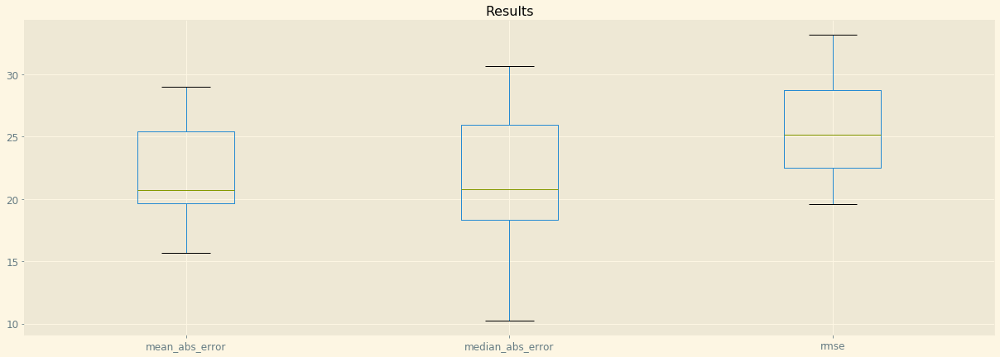

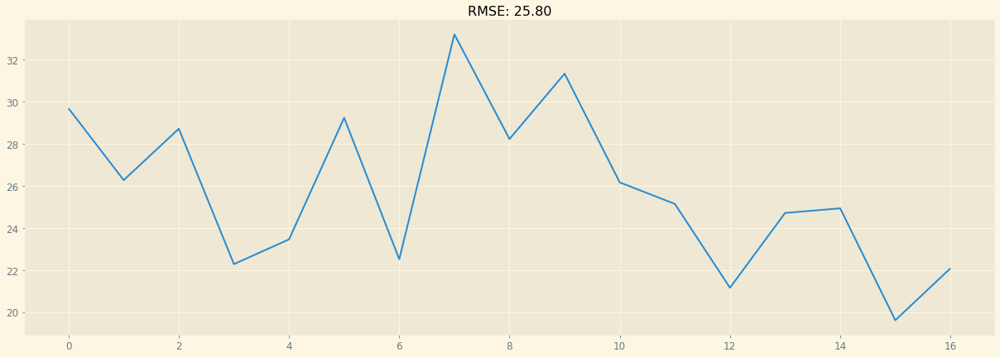

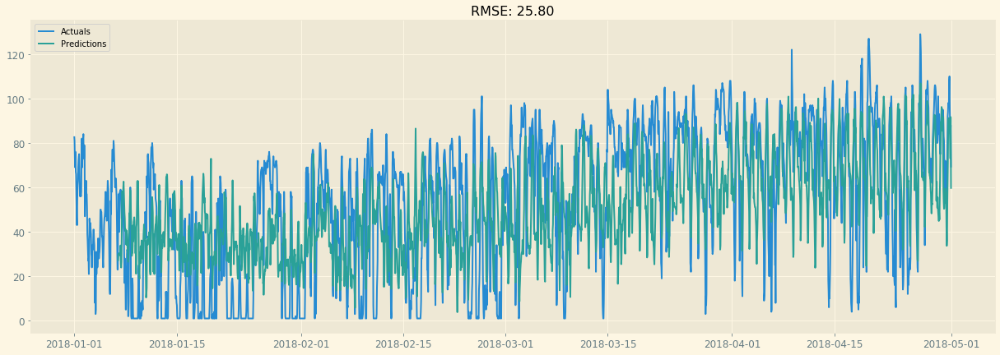

In [7]:
# Generate rolling predictions and results for particle of interest

data = oneparticle_onestation.sort_index().copy()
target = particle_of_interest

fit_func = fit_autoARIMA
predict_func = predict_autoARIMA

min_train_date = '2018-01-01'

week_starts = pd.date_range(min_train_date, data.index.max(), freq='W')

predictions_over_time, results_over_time = [], []

for i, week_start in enumerate(week_starts):
    if i % 10 == 0:
        print(week_start)

    train_set = data.loc[:(week_start - timedelta(hours=1))]
    test_set = data.loc[week_start:(week_start + timedelta(weeks=1, hours=-1))]
    models = train_set.groupby(['weekday', 'hour'])[target].apply(fit_func)
    predictions = test_set.apply(lambda x: predict_func(models.loc[tuple(x[['weekday', 'hour']])], x), axis=1)
    predictions_over_time.append(predictions)    
    results = evaluate_forecast(test_set[target], predictions, 'none')
    results['date'] = week_start
    results_over_time.append(results)  

results_over_time_24 = pd.DataFrame(results_over_time)
predictions_over_time_24 = pd.concat(predictions_over_time)

# Plot results statistics

results_over_time = results_over_time_24

fig, ax = plt.subplots(figsize=(21,7))
results_over_time.drop(['r2_score', 'mse'], axis=1).boxplot()
plt.title('Results')
plt.show()

# Plot RMSE overtime

fig, ax = plt.subplots(figsize=(21,7))
rmse_over_time = plt.plot(results_over_time['rmse'])
error = results_over_time['rmse'].mean()
plt.title('RMSE: %.2f'% error)
plt.show()

# Plot actuals and predictions overtime

plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_24, results_over_time_24)

###  City average

In [10]:
predictions_list =[predictions_over_time_08, predictions_over_time_18, predictions_over_time_24]
results_list = [results_over_time_08['rmse'], results_over_time_18['rmse'], results_over_time_24['rmse']]

predictions_final = pd.concat(predictions_list, axis=1).sort_index().mean(axis=1)
results_final = pd.concat(results_list, axis=1).sort_index().mean(axis=1)

target_mean = df_temp[particle_of_interest].groupby('date').mean()

fig, ax = plt.subplots(figsize=(21,7))
actuals = plt.plot(target_mean[min_train_date:], label='Actuals')
predictions = plt.plot(predictions_final, label='Predictions')
error = results_final.mean()
plt.legend(loc='best')
plt.title('RMSE: %.2f'% error)
plt.show()

NameError: name 'predictions_over_time_08' is not defined